In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

get_ipython().run_line_magic('matplotlib', 'inline')
# %matplotlib notebook for interactivity
import utility_functions_sep2018 as bous

station='YBBN' # change to explore fog plots for other locations

In [3]:
# if you need to reload module after making updates to utility_functions_sep2018.py module
import imp
imp.reload(bous)

<module 'utility_functions_sep2018' from '/home/accounts/qdisplay/avguide/utility_functions_sep2018.py'>

In [4]:
# Cross check my fog detection algorithm with Roberts
from enum import Enum
class compare_dates(Enum):
    auto_with_man = 1
    rob_with_vin = 2
    
stations = ['YBBN','YBAF','YAMB','YBCG','YBSU','YTWB','YBOK','YBRK']
for sta in stations:
    print(sta)
    # comparision = compare_fog_dates(station,compare.auto_man)
    # really no difference in fog dates betn auto and manual
    # print(len(comparision.common_dates))
    comp = bous.compare_fog_dates(station=sta,how=compare_dates.rob_with_vin)
    #print(f'Dates only in Vins {sorted(list(comp.vins_only))}')
    #print(f'Dates only in Robs {sorted(list(comp.robs_only))}')
    for i,item in enumerate(comp):
        print(comp._fields[i],':\t',len(item))

YBBN
Getting fog data for YBBN derived using VINS auto obs matching
Getting fog data for YBBN derived using ROBS FCT
all_dates :	 90
common_dates :	 45
not_common :	 45
vins_only :	 44
robs_only :	 1
YBAF
Getting fog data for YBAF derived using VINS auto obs matching
Getting fog data for YBAF derived using ROBS FCT
all_dates :	 240
common_dates :	 232
not_common :	 8
vins_only :	 0
robs_only :	 8
YAMB
Getting fog data for YAMB derived using VINS auto obs matching
Getting fog data for YAMB derived using ROBS FCT
all_dates :	 915
common_dates :	 752
not_common :	 163
vins_only :	 107
robs_only :	 56
YBCG
Getting fog data for YBCG derived using VINS auto obs matching
Getting fog data for YBCG derived using ROBS FCT
all_dates :	 97
common_dates :	 95
not_common :	 2
vins_only :	 1
robs_only :	 1
YBSU
Getting fog data for YBSU derived using VINS auto obs matching
Getting fog data for YBSU derived using ROBS FCT
all_dates :	 275
common_dates :	 265
not_common :	 10
vins_only :	 6
robs_only :

In [5]:
fg_aut = bous.get_fog_data_vins(station=station,auto_obs='Yes')
print(f'My fog data for period {fg_aut.index[0].strftime("%d/%m/%Y")} to \
{fg_aut.index[-1].strftime("%d/%m/%Y")}\n\
About {fg_aut.shape[0]} days fog data.\n\
Out of this, about {fg_aut["fogflag"].value_counts()[1]} days had fog.')
print(fg_aut["fogflag"].value_counts())
fg_aut.loc[fg_aut['fogflag']].shape

Getting fog data for YBBN derived using VINS auto obs matching
My fog data for period 01/01/2000 to 28/03/2020
About 7307 days fog data.
Out of this, about 173 days had fog.
False    7134
True      173
Name: fogflag, dtype: int64


(173, 46)

In [6]:
fg_aut.columns
# fg_aut.info()
fg_aut.loc[fg_aut['fogflag']].head()

,avID,man,aut,rain24hr,fogflag,min_vis,fg_onset,fg_finish,fg_duration,wind5,...,RH17,QNH17,pptn17,wind20,T20,Td20,RH20,QNH20,pptn20,rain_flag
2000-05-24,YBBN,6,4,19.0,True,0.10,18.15,22.45,4.30,160/06,...,97.0,1017.4,19.0,230/05,16.1,16.0,99.0,1017.6,19.0,True
2000-05-26,YBBN,0,1,2.2,True,0.45,16.15,16.45,0.30,060/07,...,98.0,1010.4,2.2,320/04,17.8,16.7,93.0,1011.1,2.2,True
2000-06-20,YBBN,0,1,0.2,True,0.80,15.45,16.15,0.30,030/04,...,97.0,1019.2,0.2,230/04,15.1,14.8,98.0,1019.6,0.2,True
2000-06-27,YBBN,4,6,0.2,True,0.30,12.45,23.15,10.30,120/06,...,99.0,1017.2,0.2,260/04,9.1,8.9,99.0,1017.2,0.2,True
2000-07-24,YBBN,3,0,NaN,True,0.15,16.15,18.07,1.52,040/12,...,97.0,1019.3,0.0,250/03,8.2,8.0,99.0,1019.7,,False


In [7]:
# check for missing data
print(fg_aut.shape)
fg_aut.isnull().sum()

(7307, 46)


avID              0
man               0
aut               0
rain24hr         84
fogflag           0
min_vis           0
fg_onset       7134
fg_finish      7134
fg_duration    7134
wind5             0
T5               41
Td5              43
RH5              41
QNH5             80
pptn5            41
wind8            25
T8               25
Td8              28
RH8              25
QNH8             63
pptn8            25
wind11           12
T11              12
Td11             12
RH11             12
QNH11            49
pptn11           12
wind14           21
T14              21
Td14             21
RH14             21
QNH14            58
pptn14           21
wind17           25
T17              25
Td17             25
RH17             25
QNH17            25
pptn17           25
wind20           37
T20              37
Td20             37
RH20             37
QNH20            37
pptn20           37
rain_flag         0
dtype: int64

In [8]:
# fg_aut.columns.values - ['fg_onset','fg_finish','fg_duration']
# fg_aut.columns.to_list() -['fg_onset','fg_finish','fg_duration']
# drop rows with mising data - exclude columns named fg%
# otherwise we end up dropping almost all the data
print(fg_aut.dropna().shape)
# we want to check Nan only for columns that don't include fog stats
#print(fg_aut.dropna(subset=[fg_aut.columns.str.contains("^fg.")]).shape)

fg_aut.loc[:,(fg_aut.columns.str.contains("^fg."))].shape
print(fg_aut.loc[:,~(fg_aut.columns.str.contains("^fg."))].dropna().shape)


(167, 46)
(7039, 43)


In [9]:
#fg_aut['wk_avg_rain'] = fg_aut.loc[:,'rain24hr'].rolling(window=7).mean()
#fg_aut['mon_avg_rain'] = fg_aut.loc[:,'rain24hr'].rolling(window="30D").mean()
# creating some new feature engineered variables as well

# force cols to be numeric
numeric_cols = ['T5', 'Td5', 'RH5', 'QNH5','pptn5','T8', 'Td8', 'RH8', 'QNH8','pptn8', 
                'T11', 'Td11', 'RH11','QNH11','pptn11','T14', 'Td14', 'RH14', 'QNH14','pptn14',
                'T17', 'Td17', 'RH17', 'QNH17','pptn17', 'T20', 'Td20', 'RH20', 'QNH20','pptn20']

fg_aut[numeric_cols] = fg_aut[numeric_cols].apply(pd.to_numeric, errors='coerce')

fg_aut['avg_wkly_rain'] = fg_aut.loc[:,'rain24hr'].rolling(window=7).mean()   # 7 day rolling mean
fg_aut['avg_mthly_rain'] = fg_aut.loc[:,'rain24hr'].rolling(window=30).mean() # 30 day rolling mean
# fg_aut.resample('M')['rain24hr'].mean() thats average monthly rainfall - we dont want that

# Derive dewpoint depression 
fg_aut['TmTd5']=fg_aut['T5']-fg_aut['Td5']
fg_aut['TmTd8']=fg_aut['T8']-fg_aut['Td8']
fg_aut['TmTd11']=fg_aut['T11']-fg_aut['Td11']
fg_aut['TmTd14']=fg_aut['T14']-fg_aut['Td14']
fg_aut['TmTd17']=fg_aut['T17']-fg_aut['Td17']
fg_aut['TmTd20']=fg_aut['T17']-fg_aut['Td20']
fg_aut['Td8to14']=fg_aut['Td14']-fg_aut['Td8'] # Td trend 6pm to midnight
fg_aut['Td11to17']=fg_aut['Td17']-fg_aut['Td11'] # Td trend 9pm to 3am

#    (fg_aut['TmTd17']<fg_aut['TmTd14'])&(fg_aut['TmTd14']<fg_aut['TmTd11'])&\
fg_aut['TmTd_trend_5to14']= (fg_aut['TmTd14']<fg_aut['TmTd11']) & \
                            (fg_aut['TmTd11']<fg_aut['TmTd8']) & \
                            (fg_aut['TmTd8']<fg_aut['TmTd5'])  & \
                (fg_aut['TmTd14']<2) & (fg_aut['TmTd11']<3) # 133 days and 59 had fog
#(fg_aut['TmTd17']<0.5) & (fg_aut['TmTd14']<1.5) & (fg_aut['TmTd11']<2.5)  # 133 days and 59 had fog
#(fg_aut['TmTd17']<1.0) & (fg_aut['TmTd14']<1.5) & (fg_aut['TmTd11']<2.0) # 307 days amd 75
#(fg_aut['TmTd17']<1) & (fg_aut['TmTd14']<1.5) & (fg_aut['TmTd11']<2.5)  # 375 days and 82 had fog
#(fg_aut['TmTd17']<1) & (fg_aut['TmTd14']<2) & (fg_aut['TmTd11']<3)     # 485 days and 89 had fog

# fg_aut['Td11to17']=(fg_aut['TmTd14']<fg_aut['TmTd11'])  & (fg_aut['TmTd11']<fg_aut['TmTd8'])

fg_aut['TmTd14_24hr']=fg_aut['TmTd14'].diff(periods=1) # 24hr trend Td Sep 12am 
fg_aut['TmTd14_48hr']=fg_aut['TmTd14'].diff(periods=2) # 48hr trend Td Sep 12am
fg_aut['Td5_4day']=fg_aut['Td5'].diff(periods=4) # 4day trend Td Sep 3pm
fg_aut['T14_48hr']=fg_aut['T14'].diff(periods=2) # 48hr trend Td Sep 12am
fg_aut['QNH14_48hr']=fg_aut['QNH14'].diff(periods=2)  # 48hr trend QNH @ 12am
td_cols = ['TmTd8','TmTd11','TmTd14','TmTd17','TmTd20',\
           'Td8to14','Td11to17','TmTd14_24hr','TmTd14_48hr','QNH14_48hr']

# and split winds into speed/direction
fg_aut[['wdir5','wspd5']]=fg_aut['wind5'].str.split('/',expand = True)
fg_aut[['wdir8','wspd8']]=fg_aut['wind8'].str.split('/',expand = True)
fg_aut[['wdir11','wspd11']]=fg_aut['wind11'].str.split('/',expand = True)
fg_aut[['wdir14','wspd14']]=fg_aut['wind14'].str.split('/',expand = True)
fg_aut[['wdir17','wspd17']]=fg_aut['wind17'].str.split('/',expand = True)
fg_aut[['wdir20','wspd20']]=fg_aut['wind20'].str.split('/',expand = True)
wind_cols = ['wdir5','wspd5','wdir8','wspd8','wdir11','wspd11','wdir14','wspd14',\
             'wdir17','wspd17','wdir20','wspd20']

fg_aut[wind_cols+td_cols] = fg_aut[wind_cols+td_cols].apply(pd.to_numeric, errors='coerce')

fg_aut.dropna(axis='rows', 
              how='any', 
              subset=wind_cols+td_cols+numeric_cols,
              inplace=bool(1)) # drop rows any missing values
# carefull using dropna - it drops all rows wih 'fogflag'==False!!!
# we only loose about 6 fog 173 to 166 now, and about 103 non fog days - not bad
print(fg_aut.shape)
fg_aut['fogflag'].value_counts()

(6993, 74)


False    6827
True      166
Name: fogflag, dtype: int64

In [10]:
fg_aut['TmTd_trend_5to14']= (fg_aut['TmTd14']<fg_aut['TmTd11']) & \
                            (fg_aut['TmTd11']<fg_aut['TmTd8']) & \
                            (fg_aut['TmTd8']<fg_aut['TmTd5'])  & \
                (fg_aut['TmTd14']<2) & (fg_aut['TmTd11']<3)
fg_aut['TmTd_trend_5to14'].value_counts()

False    5915
True     1078
Name: TmTd_trend_5to14, dtype: int64

In [11]:
# of about 1000 days that have the right (decreasing) TmTd trend , 122 lead to fog with 956 false leads
fg_aut.loc[fg_aut['TmTd_trend_5to14'],'fogflag'].value_counts()

False    956
True     122
Name: fogflag, dtype: int64

In [12]:
# use the fog flag variable to figure days with fog in dataset
fg_days = fg_aut.loc[fg_aut['fogflag']]; 
print(fg_days.shape)
fg_free_days = fg_aut.loc[~fg_aut['fogflag']]
print(fg_free_days.shape)

(166, 74)
(6827, 74)


In [13]:
# grab fog dates with vis<2 and lasting more than 2 hour
mask = (fg_days['min_vis']<=2) & (fg_days['fg_duration']>=1)

bad_fg_days = fg_days.loc[mask]  #real bad fog days
bad_fg_days.loc[:,['min_vis','fg_duration']].describe()

,min_vis,fg_duration
count,118.000000,118.00000
mean,0.248390,3.98661
std,0.276653,2.44038
min,0.000000,1.00000
25%,0.100000,2.00250
50%,0.150000,3.31500
75%,0.350000,5.85750
max,2.000000,11.00000


In [14]:
# ```pandas.Index.difference
# Index.difference(self, other, sort=None)
# Return a new Index with elements from the index that are not in other.
# This is the set difference of two Index objects```

'''
173 fog days in data - 167 after dropping nulls. Of these
119 dates/days have the real bad fog days, vis<2km and duration >1hrs
remainder 6915 days/dates no fog days -but may contain fog days vis>2km and duration<1hr) 
'''
print(f'The remaining days/dates outside the {bad_fg_days.shape[0]} real fog dates={(fg_aut.index).difference(bad_fg_days.index).shape}')

not_in_bad_fg_days =     fg_aut.loc[(fg_aut.index).difference(bad_fg_days.index)]
print(not_in_bad_fg_days.shape)  # this gives correct shape

'''some days in remainder (about 173-125=48 will have fogflag set to True
which will cause some issues down the line if we won't set it to False!'''
not_in_bad_fg_days['fogflag'].value_counts()

The remaining days/dates outside the 118 real fog dates=(6875,)
(6875, 74)


False    6827
True       48
Name: fogflag, dtype: int64

In [15]:
'''hash table or dict mapping between months of the year 
(numeric 1 to 12 to text labels Jan Feb etc )
for x-axis tick mark labelling'''

dict_mon = dict(zip(
    [1,2,3,4,5,6,7,8,9,10,11,12],
    ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]))

print(fg_days.groupby(fg_days.index.month).size())

fogs_per_month = \
    pd.DataFrame(
              list(
                 zip(np.arange(2,13,1),fg_days.groupby(fg_days.index.month).size())
                  )
                )  
fogs_per_month.columns = ['month','Fog days per month']

fogs_per_month['month'] = pd.to_datetime(fogs_per_month['month'],format='%m')
fogs_per_month=fogs_per_month.set_index('month',drop=True)
fogs_per_month.index = fogs_per_month.index.strftime('%b')
fogs_per_month

2      2
3      6
4     11
5     25
6     29
7     28
8     21
9     19
10    17
11     5
12     3
dtype: int64


,Fog days per month
Feb,2
Mar,6
Apr,11
May,25
Jun,29
Jul,28
Aug,21
Sep,19
Oct,17
Nov,5


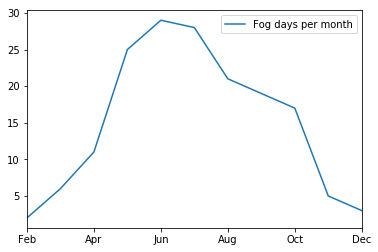

In [16]:
fogs_per_month.plot()

In [17]:
# find fog days per year - annual count fog days
years = fg_days.groupby(fg_days.index.year).size().index
fg_days_per_year=list(fg_days.groupby(fg_days.index.year).size().values)
fogs_per_year= pd.DataFrame(list(zip(years,fg_days_per_year)))
fogs_per_year.columns = ['Year','Fog days per year']
fogs_per_year['Year'] = pd.to_datetime(fogs_per_year['Year'],format='%Y')
fogs_per_year=fogs_per_year.set_index('Year',drop=True)
fogs_per_year.index = fogs_per_year.index.strftime('%Y')
fogs_per_year.sort_index(ascending=False).head(10)  # only showinf last 10 years here

,Fog days per year
2019,7
2018,7
2017,14
2016,8
2015,8
2014,7
2013,7
2012,8
2011,5
2010,6


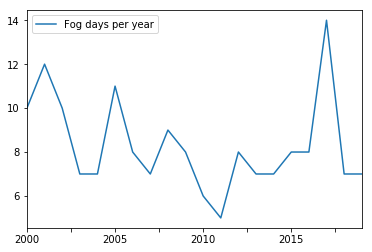

In [18]:
fogs_per_year.plot()

In [19]:
fg_aut.loc[fg_aut['fogflag']].head()

,avID,man,aut,rain24hr,fogflag,min_vis,fg_onset,fg_finish,fg_duration,wind5,...,wdir8,wspd8,wdir11,wspd11,wdir14,wspd14,wdir17,wspd17,wdir20,wspd20
2000-05-24,YBBN,6,4,19.0,True,0.10,18.15,22.45,4.3,160/06,...,150.0,5.0,60.0,7.0,30.0,8.0,230.0,5.0,230.0,5.0
2000-05-26,YBBN,0,1,2.2,True,0.45,16.15,16.45,0.3,060/07,...,30.0,9.0,360.0,6.0,310.0,4.0,310.0,3.0,320.0,4.0
2000-06-20,YBBN,0,1,0.2,True,0.80,15.45,16.15,0.3,030/04,...,0.0,0.0,350.0,4.0,320.0,4.0,0.0,0.0,230.0,4.0
2000-06-27,YBBN,4,6,0.2,True,0.30,12.45,23.15,10.3,120/06,...,150.0,3.0,270.0,4.0,220.0,4.0,220.0,4.0,260.0,4.0
2000-07-27,YBBN,0,2,6.8,True,0.35,13.15,14.45,1.3,020/04,...,360.0,6.0,330.0,7.0,250.0,4.0,270.0,2.0,310.0,5.0


In [20]:
# we create a copy of the dataframe, add columns for month and year
# We need to aggregate those values by month
# then we group the new columns and get the count/size 
fg_days = fg_aut.loc[fg_aut['fogflag']]
df_m = fg_days.copy()

print(df_m.index.month.unique().values)
print(df_m.index.year.unique().values)

df_m['month'] = df_m.index.month 
df_m['year'] = df_m.index.year 

# this would do the same 
df_m['month'] = [i.month for i in df_m.index]
df_m['year'] = [i.year for i in df_m.index]

# group by month and year, get the average
df_m = df_m.groupby(['month', 'year']).size()
print(df_m.index)
df_m.head()

[ 5  6  7  8  9 10  4 11 12  3  2]
[2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019]
MultiIndex(levels=[[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]],
           codes=[[0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 10, 10, 10], [8, 18, 2, 4, 6, 7, 19, 1, 2, 3, 4, 10, 11, 12, 17, 0, 1, 2, 4, 7, 8, 10, 11, 14, 15, 16, 17, 18, 0, 1, 3, 5, 6, 8, 9, 11, 12, 13, 14, 15, 18, 19, 0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 0, 1, 2, 3, 5, 6, 9, 12, 13, 17, 18, 19, 0, 1, 2, 5, 7, 8, 10, 12, 13, 14, 15, 16, 18, 0, 1, 2, 3, 4, 5, 7, 9, 11, 12, 15, 17, 

month  year
2      2008    1
       2018    1
3      2002    1
       2004    2
       2006    1
dtype: int64

In [21]:
# unstack the indexes
'''
Pivot a level of the (necessarily hierarchical) index labels, 
returning a DataFrame having a new level of column labels whose inner-most level 
consists of the pivoted index labels
'''
# we can unstack one level of the multiindex and move it into the columns
# unstacking year moves year into columns - but we want months into colums
df_m.unstack(level='year').head(2)  # same as df_m.unstack(level=1)

year,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
month,,,,,,,,,,,,,,,,,,,,
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
3,NaN,NaN,1.0,NaN,2.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


In [22]:
print(dict_mon)
# unstack the months
df_m=df_m.unstack(level='month')\
    .fillna(0)\
    .rename(columns=lambda x: dict_mon[x])\
    .sort_index(ascending=False)
df_m

{1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}


month,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
year,,,,,,,,,,,
2019,0.0,1.0,0.0,0.0,1.0,1.0,2.0,0.0,2.0,0.0,0.0
2018,1.0,0.0,0.0,1.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0
2017,0.0,0.0,1.0,5.0,0.0,3.0,4.0,0.0,1.0,0.0,0.0
2016,0.0,0.0,0.0,2.0,0.0,3.0,0.0,1.0,0.0,2.0,0.0
2015,0.0,0.0,0.0,3.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0
2014,0.0,0.0,0.0,1.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0
2013,0.0,0.0,0.0,0.0,3.0,1.0,1.0,2.0,0.0,0.0,0.0
2012,0.0,0.0,2.0,0.0,1.0,1.0,1.0,2.0,1.0,0.0,0.0
2011,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0


In [23]:
print(df_m.max())
df_m.max().max()

month
Feb    1.0
Mar    2.0
Apr    2.0
May    5.0
Jun    4.0
Jul    3.0
Aug    4.0
Sep    2.0
Oct    3.0
Nov    2.0
Dec    1.0
dtype: float64


5.0

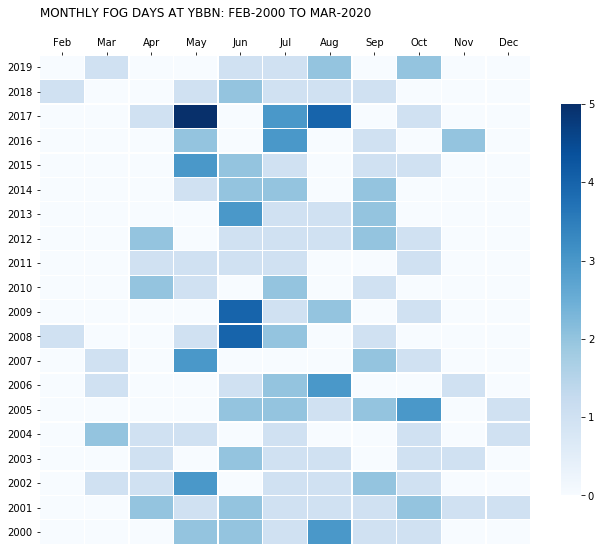

In [24]:
# use Seaborn’s .heatmap

'''use a sequential cmap with only two colors.
We can also make the limits of the colormap explicit by defining vmin and vmax.
Pandas .min and .max can help us figure out what are the best values for those.
'''

fig, ax = plt.subplots(figsize=(11, 9))

# plot heatmap
sns.heatmap(df_m, cmap="Blues", vmin= 0.0, vmax=df_m.max().max(), #square=True,
           linewidth=0.3, cbar_kws={"shrink": .8})

# xticks - move the ticks to the top of the chart to improve the visualization 
# and make it look more like a table.
ax.xaxis.tick_top()
# xticks_labels = dict_mon.values()  # includes Jan but we have no data for Jan
xticks_labels =['Feb', 'Mar', 'Apr', 'May', 'Jun','Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(np.arange(11) + .5, labels=xticks_labels)


# get rid of the x and y labels since the values in our axis are quite self-explaining
plt.xlabel('')
plt.ylabel('')

# title

title = f'Monthly Fog days at {station}: \
{fg_aut.index[0].strftime("%b-%Y")} to {fg_aut.index[-1].strftime("%b-%Y")}\n'.upper()
plt.title(title, loc='left')
plt.show()

In [25]:
# GET SOI data
# http://www.bom.gov.au/climate/current/soihtm1.shtml
'''
import requests
url = 'http://www.bom.gov.au/climate/current/soihtm1.shtml'
soi_data = requests.get(url)
soi = pd.read_html(soi_data.text)  # ValueError: No tables found

However the table is there - even beautifulsoup bs4 has trouble extracting 
the table data !!!

We manually extract the table data and save the html coded data as soi_data.txt
'''

import datetime
# create list of months ['Jan','Feb',.....'Dec']
months = [datetime.date(2000, m, 1).strftime('%b') for m in range(1, 13)]

# we manually cut out table data from html file and save as .txt file
soi = pd.read_html('soi_data.txt',index_col=0, parse_dates=True)

len(soi), len(soi[0])
#(1, 145)   - its single dimesion list shape 1 not 2!!!
# however the 1st item in list is a 2D table !!
print('soi[0].shape',soi[0].shape)
print(soi[0][:2]) # get 1st 2 rows of data

# convert to DataFrame
soi = pd.DataFrame(soi[0])
soi.columns = months  # change column label from numbers to equivalent month names
# soi.index = soi.index.strftime('%Y')  # only keep the year for index labels
soi.index = soi.index.year  # since its datetime we can just keep year

soi = soi.head(21)  # only keep last 20 years data since Year 2000

soi = soi[months].apply(pd.to_numeric, errors='coerce') # force data numeric
# soi['winter_avg'] = (soi['May']+soi['Jun']+soi['Jul']+soi['Aug'])/4
soi['annual_avg_SOI'] = round(soi.mean(axis=1,skipna=True),2)

# not sure why avg using sum/len andm mean() give diff answers
print(f"\nMean SOI 2019: {soi.loc[2019].sum()/12:.2f}, {soi.loc[2019].mean():.2f}") 
print(f"Mean SOI 2018: {soi.loc[2018].sum()/12:.2f}, {soi.loc[2018].mean():.2f}") 

print(soi.shape)
soi.head(3)

soi[0].shape (145, 12)
             1     2    3    4    5     6    7     8      9     10    11    12
0                                                                             
2020-01-01  1.3  -2.2 -5.2 -0.5  2.8  -9.6  4.2     -      -     -     -     -
2019-01-01 -0.6 -13.5 -6.8 -1.3 -9.0 -10.4 -5.6  -4.4  -12.4  -5.6  -9.3  -5.5

Mean SOI 2019: -7.62, -7.03
Mean SOI 2018: 1.03, 0.95
(21, 13)


,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,annual_avg_SOI
0,,,,,,,,,,,,,
2020,1.3,-2.2,-5.2,-0.5,2.8,-9.6,4.2,NaN,NaN,NaN,NaN,NaN,-1.31
2019,-0.6,-13.5,-6.8,-1.3,-9.0,-10.4,-5.6,-4.4,-12.4,-5.6,-9.3,-5.5,-7.03
2018,8.9,-6.0,10.5,4.5,2.1,-5.5,1.6,-6.9,-10.0,3.0,-0.1,9.3,0.95


In [26]:
def color_soi(value):
  """
  Colors elements in a dateframe green if TmTd < 1 
  and red if TmTd < 1. Else leave it black.
  """

  if value < -1:
    color = 'red'
  elif value > 1:
    color = 'blue'
  else:
    color = 'black'

  return 'color: %s' % color

soi = pd.merge(left=soi, right=fogs_per_year, how='left', left_index=True, right_index=True)
soi.style.applymap(color_soi,subset=soi.columns)

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,annual_avg_SOI,Fog days per year
0,,,,,,,,,,,,,,
2020,1.3,-2.2,-5.2,-0.5,2.8,-9.6,4.2,nan,nan,nan,nan,nan,-1.31,nan
2019,-0.6,-13.5,-6.8,-1.3,-9,-10.4,-5.6,-4.4,-12.4,-5.6,-9.3,-5.5,-7.03,nan
2018,8.9,-6,10.5,4.5,2.1,-5.5,1.6,-6.9,-10,3,-0.1,9.3,0.95,nan
2017,1.3,-2.2,5.1,-6.3,0.5,-10.4,8.1,3.3,6.9,9.1,11.8,-1.4,2.15,nan
2016,-19.7,-19.7,-4.7,-22,2.8,5.8,4.2,5.3,13.5,-4.3,-0.7,2.6,-3.07,nan
2015,-7.8,0.6,-11.2,-3.8,-13.7,-12,-14.7,-19.8,-17.8,-20.2,-5.3,-9.1,-11.23,nan
2014,12.2,-1.3,-13.3,8.6,4.4,-1.5,-3,-11.4,-7.6,-8,-10,-5.5,-3.03,nan
2013,-1.1,-3.6,10.5,0.3,8.4,13.9,8.1,-0.5,3.9,-1.9,9.2,0.6,3.98,nan
2012,9.4,2.5,2.9,-7.1,-2.7,-10.4,-1.7,-5,2.6,2.4,3.9,-6,-0.77,nan


In [27]:
soi['May'].corr(soi['Fog days per year'], method='pearson')

nan

In [28]:
print(soi.index) # convert index in years from string to datetime  Index dtype='object'
soi.index = pd.to_datetime(soi.index, format='%Y').year
soi.index # Int64Index dtype='int64'   
# Still not date time but we can slice like 2000:2019 now which we can't with objext index

Index([2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010, 2009,
       2008, 2007, 2006, 2005, 2004, 2003, 2002, 2001, 2000],
      dtype='object', name=0)


Int64Index([2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010,
            2009, 2008, 2007, 2006, 2005, 2004, 2003, 2002, 2001, 2000],
           dtype='int64', name=0)

In [29]:
years= np.arange(start=2000,stop=2020,step=1)   # get int year values 2000 to 2019 
months= ['Feb', 'Mar', 'Apr', 'May', 'Jun','Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
soi=soi.loc[years,months].sort_index(ascending=False)
soi.head()

,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
0,,,,,,,,,,,
2019,-13.5,-6.8,-1.3,-9.0,-10.4,-5.6,-4.4,-12.4,-5.6,-9.3,-5.5
2018,-6.0,10.5,4.5,2.1,-5.5,1.6,-6.9,-10.0,3.0,-0.1,9.3
2017,-2.2,5.1,-6.3,0.5,-10.4,8.1,3.3,6.9,9.1,11.8,-1.4
2016,-19.7,-4.7,-22.0,2.8,5.8,4.2,5.3,13.5,-4.3,-0.7,2.6
2015,0.6,-11.2,-3.8,-13.7,-12.0,-14.7,-19.8,-17.8,-20.2,-5.3,-9.1


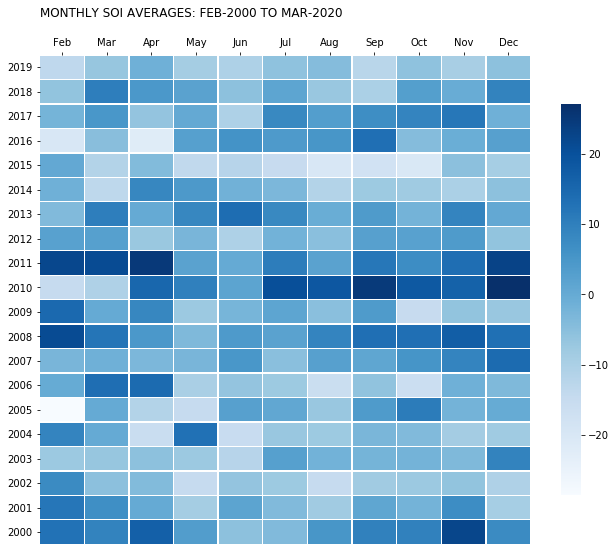

In [30]:
# use Seaborn’s .heatmap

'''use a sequential cmap with only two colors.
We can also make the limits of the colormap explicit by defining vmin and vmax.
Pandas .min and .max can help us figure out what are the best values for those.
'''

fig, ax = plt.subplots(figsize=(11, 9))

# plot heatmap
sns.heatmap(soi, cmap="Blues", vmin= soi.min().min(), vmax=soi.max().max(), #square=True,
           linewidth=0.3, cbar_kws={"shrink": .8})

# xticks - move the ticks to the top of the chart to improve the visualization 
# and make it look more like a table.
ax.xaxis.tick_top()
# xticks_labels = dict_mon.values()  # includes Jan but we have no data for Jan
xticks_labels =['Feb', 'Mar', 'Apr', 'May', 'Jun','Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(np.arange(11) + .5, labels=xticks_labels)


# get rid of the x and y labels since the values in our axis are quite self-explaining
plt.xlabel('')
plt.ylabel('')

# title

title = f'Monthly SOI Averages: \
{fg_aut.index[0].strftime("%b-%Y")} to {fg_aut.index[-1].strftime("%b-%Y")}\n'.upper()
plt.title(title, loc='left')
plt.show()

In [31]:
# we can compute correlation between monthly fog counts and monthly soi values
# now we have got data in same shape
# REFER https://towardsdatascience.com/heatmap-basics-with-pythons-seaborn-fb92ea280a6c
print(soi.shape,'\n', soi.columns,'\n', soi.index)
print(df_m.shape,'\n', df_m.columns,'\n', df_m.index)

(20, 11) 
 Index(['Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov',
       'Dec'],
      dtype='object') 
 Int64Index([2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010, 2009,
            2008, 2007, 2006, 2005, 2004, 2003, 2002, 2001, 2000],
           dtype='int64', name=0)
(20, 11) 
 Index(['Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov',
       'Dec'],
      dtype='object', name='month') 
 Int64Index([2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010, 2009,
            2008, 2007, 2006, 2005, 2004, 2003, 2002, 2001, 2000],
           dtype='int64', name='year')


In [32]:
# Use corrwith() function to find the correlation among two dataframe objects along the column axis
# To find the correlation among the 
# columns of df1 and df2 along the column axis  (default)
df_m.corrwith(soi, axis = 'rows') 

month
Feb    0.192491
Mar   -0.089219
Apr    0.003035
May    0.003736
Jun    0.267253
Jul    0.373143
Aug   -0.080858
Sep   -0.010918
Oct    0.056382
Nov   -0.131793
Dec   -0.303537
dtype: float64

```
Some correlation between LaNina (+ve SOI) months and high number of fog days - about +30 to +40% for Months June and July. This makes sense as LaNina associated with high moisture content (above average ocean temps and above average rainfall over eastern QLD).

Strong -ve correlation for Dec -30% i.e LaNina years have fewer fog days while ElNino years deliver more fog days - makes sense.

TODO

Do a lagged correlation - so number of fog days in a month with SOI from previous month

Correlation between Monthly rainfall values (or rain days) and SOI index - test the hypothesis that LaNina equates to above average rainfall over SE QLD.

Correlation between Monthly rainfall values or even betetr number of rain days per month) and monthly fog counts - to see if more rain days give us more fog days.

Might need to use time series correlation for lagged correlation..

see https://towardsdatascience.com/finding-correlations-in-time-series-data-845e5dc538c4

```

In [33]:
# Use corrwith() function to find the correlation among two dataframe objects along the column axis
# To find the correlation among the 
# columns of df1 and df2 along the column axis 
df_m.corrwith(soi, axis = 'columns') 

year
2019    0.356106
2018   -0.705861
2017    0.091420
2016    0.359738
2015   -0.375963
2014    0.179359
2013    0.434312
2012   -0.263725
2011   -0.377253
2010    0.323022
2009   -0.215569
2008   -0.389593
2007   -0.262990
2006   -0.286639
2005    0.721102
2004    0.143654
2003   -0.275740
2002   -0.511291
2001   -0.369828
2000   -0.616723
dtype: float64

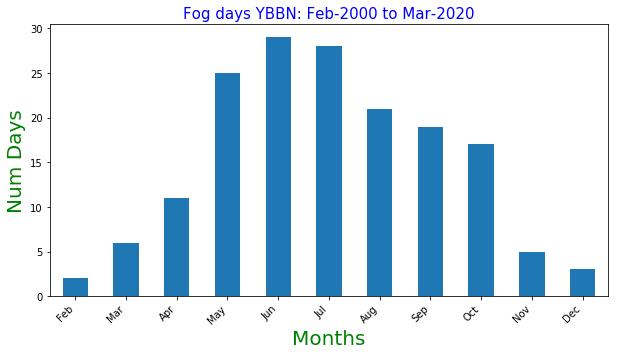

In [34]:
fg_days_by_month = fg_days.groupby(fg_days.index.month).size()
fig, ax = plt.subplots(figsize=(10,5), nrows=1, ncols=1 )
fg_days_by_month.plot( kind='bar', ax=ax)
title = f'Fog days {station}: {fg_aut.index[0].strftime("%b-%Y")} to {fg_aut.index[-1].strftime("%b-%Y")}'
ax.set_title(title, color='b',fontsize=15)
ax.set_ylabel('Num Days', color='g', fontsize=20)
ax.set_xlabel('Months', color='g', fontsize=20)
# g.get_xticks() [ 0  1  2  3  4  5  6  7  8  9 10]

if fg_days.groupby(fg_days.index.month).size().index[0] == 1:
    xlabels=[dict_mon[x+1] for x in ax.get_xticks()]
elif fg_days.groupby(fg_days.index.month).size().index[0] == 2:
    xlabels=[dict_mon[x+2] for x in ax.get_xticks()]
    
# xlabels=list( map( lambda x : dict_mon[x], ax.get_xticks()+2) )  # both give same result

# xlabels = ['{:,.2f}'.format(x) + 'K' for x in ax.get_xticks()/1000]
ax.set_xticklabels(xlabels,rotation=45, horizontalalignment='right')
#g.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.tick_params(labelsize=10)

[ 0  1  2  3  4  5  6  7  8  9 10]


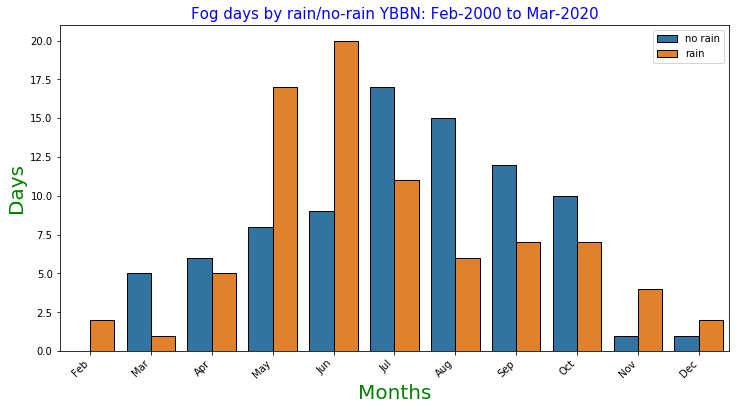

In [35]:
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.countplot(x=fg_days.index.month,
              hue='rain_flag',
              data=fg_days,
              ax=ax, edgecolor='k');
title = f'Fog days by rain/no-rain {station}: {fg_aut.index[0].strftime("%b-%Y")} to {fg_aut.index[-1].strftime("%b-%Y")}'
ax.set_title(title, color='b',fontsize=15)
ax.set_ylabel('Days', color='g', fontsize=20)
ax.set_xlabel('Months', color='g', fontsize=20)
print(ax.get_xticks()) #[ 0  1  2  3  4  5  6  7  8  9 10]

if fg_days.groupby(fg_days.index.month).size().index[0] == 1:
    xlabels=[dict_mon[x+1] for x in ax.get_xticks()]
elif fg_days.groupby(fg_days.index.month).size().index[0] == 2:
    xlabels=[dict_mon[x+2] for x in ax.get_xticks()]
    
ax.set_xticklabels(xlabels, rotation=45, 
                  horizontalalignment='right',fontsize=20)
ax.tick_params(labelsize=10)
my_labels = ['no rain', 'rain']
plt.legend(labels = my_labels)

In [36]:
#```
# Handling Axes object to label x-axis tick marks etc
# 
# https://stackoverflow.com/questions/23969619/plotting-with-seaborn-using-the-matplotlib-object-oriented-interface
# see also
# https://stackoverflow.com/questions/27019079/move-seaborn-plot-legend-to-a-different-position/
# 
# The plotting functions in seaborn are broadly divided into two classes
# 
# - "Axes-level" functions, including regplot, boxplot, kdeplot, and many others
# - "Figure-level" functions, including lmplot, factorplot, jointplot and one or two others
# 
# The first group is identified by taking an explicit ax argument and returning an Axes object. 
# As this suggests, you can use them in an "object oriented" style by passing your Axes to them:
# 
# f, (ax1, ax2) = plt.subplots(2)
# sns.regplot(x, y, ax=ax1)
# sns.kdeplot(x, ax=ax2)
# 
# Axes-level functions will only draw onto an Axes and won't otherwise mess with the figure, 
# so they can coexist perfectly happily in an object-oriented matplotlib script.
# 
# The second group of functions (Figure-level) are distinguished by the fact that the resulting plot can 
# potentially include several Axes which are always organized in a "meaningful" way. 
# That means that the functions need to have total control over the figure, so it isn't possible to plot,
# say, an lmplot onto one that already exists. Calling the function always initializes a figure and 
# sets it up for the specific plot it's drawing.
# 
# However, once you've called lmplot, it will return an object of the type FacetGrid. 
# This object has some methods for operating on the resulting plot that know a bit about the structure of the plot. 
# It also exposes the underlying figure and array of axes at the FacetGrid.fig and FacetGrid.axes arguments.
# The jointplot function is very similar, but it uses a JointGrid object.
# So you can still use these functions in an object-oriented context, but all of your customization has to come 
# after you've called the function.
#```
bad_fg_days.columns
bad_fg_days.tail()


,avID,man,aut,rain24hr,fogflag,min_vis,fg_onset,fg_finish,fg_duration,wind5,...,wdir8,wspd8,wdir11,wspd11,wdir14,wspd14,wdir17,wspd17,wdir20,wspd20
2018-09-08,YBBN,10,3,5.2,True,0.05,14.23,19.49,5.26,030/09,...,40.0,6.0,330.0,4.0,200.0,7.0,200.0,3.0,240.0,6.0
2019-06-15,YBBN,9,0,0.0,True,0.05,19.28,22.27,2.59,060/07,...,40.0,2.0,60.0,3.0,20.0,4.0,210.0,4.0,230.0,5.0
2019-08-07,YBBN,3,3,2.6,True,0.10,19.42,21.15,1.33,050/06,...,0.0,0.0,250.0,8.0,10.0,6.0,210.0,4.0,320.0,3.0
2019-08-18,YBBN,16,5,0.0,True,0.05,14.53,22.15,7.22,060/09,...,60.0,6.0,20.0,4.0,320.0,1.0,0.0,0.0,0.0,0.0
2019-10-19,YBBN,2,0,6.2,True,0.50,13.15,14.15,1.00,040/07,...,20.0,10.0,360.0,7.0,300.0,5.0,230.0,5.0,240.0,7.0


{1: '3 pm', 2: '6 pm', 3: '9 pm', 4: '12 am', 5: '3 am', 6: '6 am'}
[1 2 3 4 5 6]
['3 pm', '6 pm', '9 pm', '12 am', '3 am', '6 am']


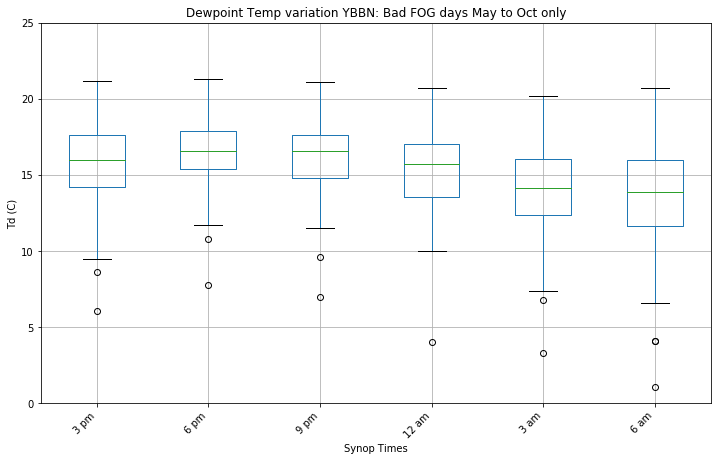

In [37]:
fig, ax = plt.subplots(1, 1, figsize=(12,7))
bad_fg_days.loc[bad_fg_days.index.month.isin([5,6,7,8,9,10])].boxplot(column=['Td5','Td8','Td11','Td14','Td17','Td20'], ax=ax)
ax.set_title(f'Dewpoint Temp variation {station}: Bad FOG days May to Oct only')


dict_synop_times=dict(zip(ax.get_xticks(),
                          ['3 pm','6 pm','9 pm','12 am','3 am','6 am']))
print(dict_synop_times)
print(ax.get_xticks())  # interestingly xticks starts at 1 not 0??
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
print(xlabels)

xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_ylabel("Td (C)")  
ax.set_xlabel("Synop Times")  
ax.set_ylim(0,25)    # seems good y-axis range for coastal locations
if station in ['YTWB','YBOK','YBWW']:
    ax.set_ylim(-10,20)
plt.show()


[1 2 3 4 5 6]


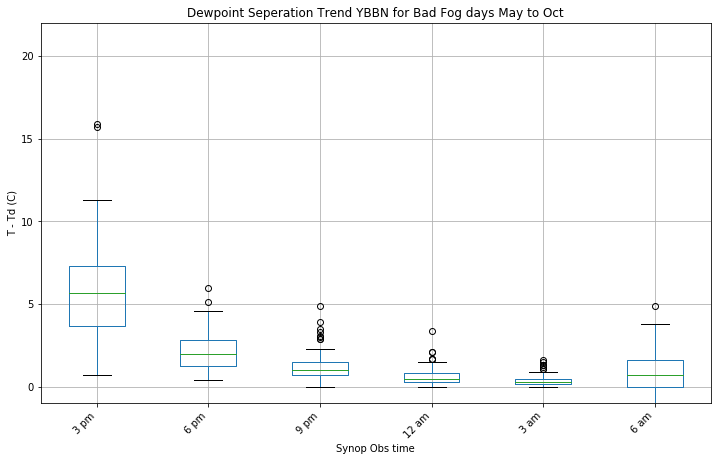

In [38]:
fig, ax = plt.subplots(1, 1, figsize=(12,7))
bad_fg_days.loc[bad_fg_days.index.month.isin([5,6,7,8,9,10])].boxplot(column=['TmTd5','TmTd8','TmTd11','TmTd14','TmTd17','TmTd20'],ax=ax)
ax.set_title(f'Dewpoint Seperation Trend {station} for Bad Fog days May to Oct')
print(ax.get_xticks())  
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_ylabel("T - Td (C)")  
ax.set_xlabel("Synop Obs time")  
ax.set_ylim(-1,22)    # seems good y-axis range for YBBN (5, 25)
plt.show()

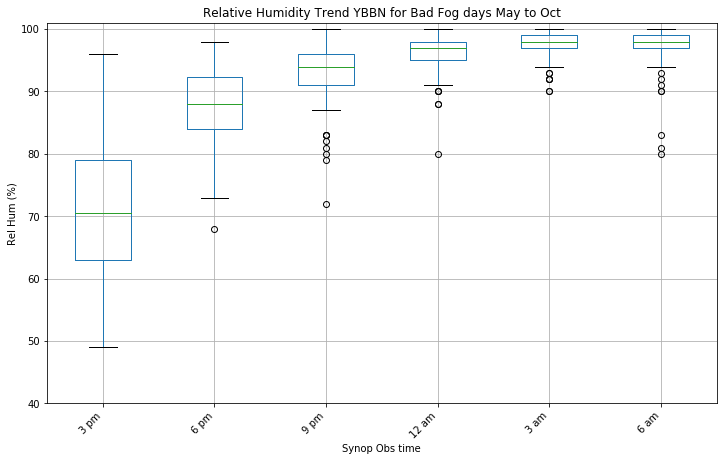

In [39]:
fig, ax = plt.subplots(1, 1, figsize=(12,7))
bad_fg_days.loc[bad_fg_days.index.month.isin([5,6,7,8,9,10])].boxplot(column=['RH5','RH8','RH11','RH14','RH17','RH20'], ax=ax)
ax.set_title(f'Relative Humidity Trend {station} for Bad Fog days May to Oct')
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_ylabel("Rel Hum (%)")  
ax.set_xlabel("Synop Obs time")  
ax.set_ylim(40,101)
plt.show()

In [40]:
fg_month_rain = fg_days['rain_flag'].groupby(fg_days.index.month).value_counts()
fg_month_rain

    rain_flag
2   True          2
3   False         5
    True          1
4   False         6
    True          5
5   True         17
    False         8
6   True         20
    False         9
7   False        17
    True         11
8   False        15
    True          6
9   False        12
    True          7
10  False        10
    True          7
11  True          4
    False         1
12  True          2
    False         1
Name: rain_flag, dtype: int64

[ 0  1  2  3  4  5  6  7  8  9 10 11]


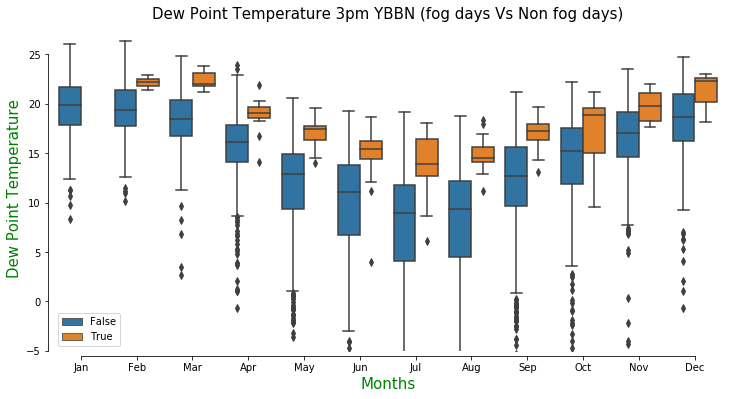

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x=fg_aut.index.month, 
              y='Td5',
              hue='fogflag',
              data=fg_aut,ax=ax)
ax.set_title(f'Dew Point Temperature 3pm {station} (fog days Vs Non fog days)', fontsize=15)
ax.set_xlabel('Months', color='g', fontsize=15)
ax.set_ylabel('Dew Point Temperature', color='g', fontsize=15)
print(ax.get_xticks())# [ 0  1  2  3  4  5  6  7  8  9 10 11]  NB counts from 0, Jan is 1
xlabels = [dict_mon[x+1] for x in ax.get_xticks()] 
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_ylim(-5,28)
if station in ['YTWB','YBOK','YBWW']:
    ax.set_ylim(-10,25)
ax.legend(loc='lower left')#,labels=['no fog','fog'])
sns.despine(offset=5, trim=True)

In [42]:
fg_aut.loc[fg_aut.index.month.isin([6,7,8]),['fogflag','Td14']].\
    groupby([pd.Grouper(freq="y"),'fogflag']).describe().info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 39 entries, (2000-12-31 00:00:00, False) to (2019-12-31 00:00:00, True)
Data columns (total 8 columns):
(Td14, count)    39 non-null float64
(Td14, mean)     39 non-null float64
(Td14, std)      38 non-null float64
(Td14, min)      39 non-null float64
(Td14, 25%)      39 non-null float64
(Td14, 50%)      39 non-null float64
(Td14, 75%)      39 non-null float64
(Td14, max)      39 non-null float64
dtypes: float64(8)
memory usage: 2.8 KB


In [43]:
fg_aut.loc[fg_aut.index.month.isin([6,7,8]),['fogflag','Td11']].\
    groupby([pd.Grouper(freq="y"),'fogflag']).quantile(q=(0.2,0.8)).tail()

Td11
           fogflag           
2018-12-31 True    0.8  14.82
2019-12-31 False   0.2   6.40
                   0.8  14.10
           True    0.2  14.10
                   0.8  15.88

In [44]:
# July 12am Td variation fog VS no fog days
JJA_Td = fg_aut.loc[fg_aut.index.month.isin([6,7,8]),
                    ['rain_flag','fogflag','Td5','Td8','Td11','Td14','Td17','Td20']].\
        groupby(['rain_flag','fogflag']).\
        quantile(q=(0.2,0.5,0.8))

julyTd = fg_aut.loc[fg_aut.index.month.isin([6,7,8]),
                    ['rain_flag','fogflag','Td5','Td8','Td11','Td14','Td17','Td20']].\
        groupby(['rain_flag','fogflag']).\
        quantile(q=(0.2,0.5,0.8))

print(julyTd.info(),"\n\n", julyTd.index,"\n\n", julyTd.columns)
julyTd

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 12 entries, (False, False, 0.2) to (True, True, 0.8)
Data columns (total 6 columns):
Td5     12 non-null float64
Td8     12 non-null float64
Td11    12 non-null float64
Td14    12 non-null float64
Td17    12 non-null float64
Td20    12 non-null float64
dtypes: float64(6)
memory usage: 870.0 bytes
None 

 MultiIndex(levels=[[False, True], [False, True], [0.2, 0.5, 0.8]],
           codes=[[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2]],
           names=['rain_flag', 'fogflag', None]) 

 Index(['Td5', 'Td8', 'Td11', 'Td14', 'Td17', 'Td20'], dtype='object')


Td5    Td8   Td11   Td14   Td17   Td20
rain_flag fogflag                                              
False     False   0.2   2.30   5.50   4.90   4.40   3.80   3.30
                  0.5   8.40  10.55   9.90   8.70   7.90   7.15
                  0.8  12.08  13.50  12.90  11.90  11.00  10.30
          True    0.2  12.90  14.10  13.60  11.30  10.50   8.60
                  0.5  14.20  15.40  15.30  14.30  12.50  11.50
                  0.8  16.00  16.90  16.50  16.10  14.10  13.30
True      False   0.2   9.74  10.70  10.40  10.00   9.44   8.90
                  0.5  12.70  13.25  13.20  12.80  12.30  11.80
                  0.8  15.20  15.50  15.30  14.80  14.66  14.26
          True    0.2  13.90  14.32  14.02  12.82  11.26  11.00
                  0.5  15.50  15.70  15.00  14.40  13.90  13.20
                  0.8  16.86  16.92  17.16  16.48  15.98  15.14

In [45]:
idx = pd.IndexSlice
postrain_fog_Td_stats = julyTd.loc[idx[True,True,:], ['Td5','Td8','Td11','Td14']]
#postrain_fog_Td_stats.drop(labels=['rain_flag','fogflag'], axis=0, level = [0,1])
# https://www.w3resource.com/pandas/dataframe/dataframe-drop.php

postrain_fog_Td_stats.drop(index='rain_flag', level=0, inplace=True)
postrain_fog_Td_stats.drop(index='fogflag', level=0, inplace=True)
postrain_fog_Td_stats

Td5    Td8   Td11   Td14
rain_flag fogflag                                
True      True    0.2  13.90  14.32  14.02  12.82
                  0.5  15.50  15.70  15.00  14.40
                  0.8  16.86  16.92  17.16  16.48

In [46]:
dry_fg = julyTd.loc[idx[False,True,:], ['Td5']].droplevel(level=[0,1]).values.flatten()
dry_fg

array([12.9, 14.2, 16. ])

In [47]:
dry_no_fg=julyTd.loc[idx[False,False,:], ['Td5']].droplevel(level=[0,1]).values.flatten()
dry_no_fg

array([ 2.3 ,  8.4 , 12.08])

                        Td5   Td8
rain_flag fogflag                
False     True    0.2  12.9  14.1
                  0.5  14.2  15.4
                  0.8  16.0  16.9


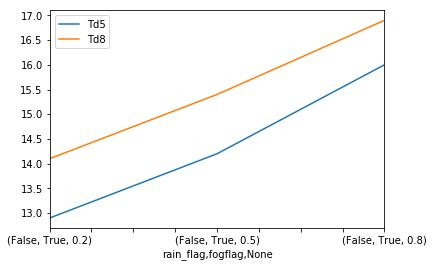

In [48]:
'''dry = rain24 > 0
if dry:
    if (Td_3pm > dry_fg[0]) & (Td_3pm > dry_fg[1])
'''

idx = pd.IndexSlice
print(julyTd.loc[idx[False,True,:], ['Td5','Td8']])
julyTd.loc[idx[False,True,:], ['Td5','Td8']].plot()

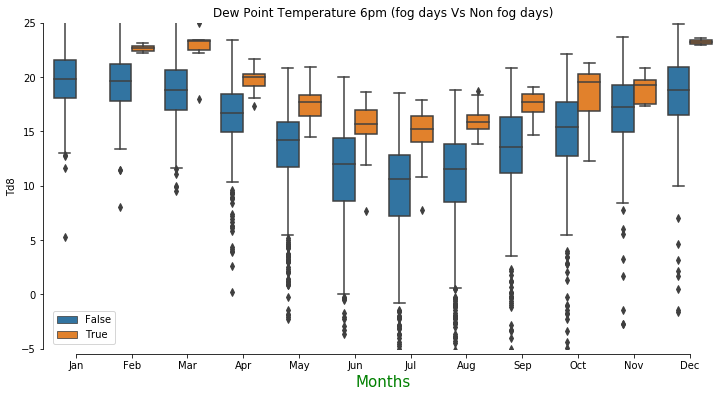

In [49]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# sns.set(style="ticks", palette="pastel")
sns.boxplot(x=fg_aut.index.month, 
            y='Td8', 
            hue='fogflag',
            ax=ax, data=fg_aut)
ax.set_title("Dew Point Temperature 6pm (fog days Vs Non fog days)")
ax.set_xlabel('Months', color='g', fontsize=15)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.legend(loc='lower left')
ax.set_ylim(-5,25)
if station in ['YTWB','YBOK','YBWW']:
    ax.set_ylim(-10,28)
sns.despine(offset=5, trim=True)

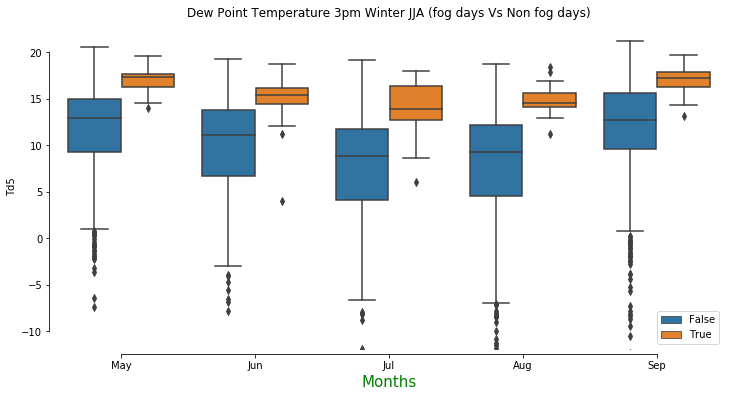

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# sns.set(style="ticks", palette="pastel")
dat = fg_aut.loc[fg_aut.index.month.isin([5,6,7,8,9]),:]
sns.boxplot(x=dat.index.month, 
            y='Td5', 
            hue='fogflag',
            ax=ax, data=dat)
ax.set_title("Dew Point Temperature 3pm Winter JJA (fog days Vs Non fog days)")
ax.set_xlabel('Months', color='g', fontsize=15)
xlabels = ['May','Jun', 'Jul','Aug','Sep']
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.legend(loc='lower right')
ax.set_ylim(dat['Td5'].min()+5,dat['Td5'].max()+2)
sns.despine(offset=5, trim=True);  # x-axis tick labels won't rotate with this line


In [51]:
fg_aut.loc[fg_aut.index.month.isin([6,7,8]),
                    ['fogflag','Td5','Td8','Td11','Td14','Td17','Td20']].\
        groupby('fogflag').\
        quantile(q=(0.05,0.2,0.5,0.8,0.95))

Td5     Td8    Td11    Td14    Td17   Td20
fogflag                                                    
False   0.05  -2.900  -0.400   0.300   0.795   0.800   0.60
        0.20   3.800   6.900   6.100   5.400   4.500   4.00
        0.50   9.800  11.400  10.800   9.900   9.200   8.50
        0.80  13.400  14.300  13.900  13.200  12.500  11.92
        0.95  16.205  16.600  16.205  15.500  15.200  14.80
True    0.05  11.035  11.640  11.670  10.085   7.485   4.10
        0.20  13.500  14.140  14.000  12.240  10.940   9.54
        0.50  14.650  15.550  15.300  14.400  13.200  12.05
        0.80  16.300  16.960  16.920  16.400  14.840  14.64
        0.95  18.060  18.215  17.715  17.430  16.845  16.30

In [52]:
MJJAS_Td = fg_aut.loc[fg_aut.index.month.isin([6,7,8]),
                    ['fogflag','Td5','Td8','Td11','Td14','Td17','Td20']].\
        groupby('fogflag').\
        quantile(q=(0.05,0.2,0.5,0.8,0.95))
idx = pd.IndexSlice
MJJAS_Td.loc[idx[True,:], ['Td5','Td8']]

Td5     Td8
fogflag                     
True    0.05  11.035  11.640
        0.20  13.500  14.140
        0.50  14.650  15.550
        0.80  16.300  16.960
        0.95  18.060  18.215

In [53]:
# grab median 3pm Td for fog (=True) days only
MJJAS_Td.loc[idx[True,0.5], 'Td5']

14.649999999999999

 https://sites.google.com/site/davidsstatistics/home/notched-box-plots
 
 https://www.nature.com/articles/nmeth.2813.pdf?origin=ppub
     
 Box plots are a simple but powerful graphing tool that can be used in place of histograms to address both goals. Whereas histograms require a sample size of at least 30 to be useful, box plots require a sample size of only 5, provide more detail in the tails of the distribution and are more readily compared across three or more samples.
 
 Box plots characterize a sample using the 25th, 50th and 75th percentiles—also known as the lower quartile (Q1), median (m or Q2) and upper quartile (Q3)—and the interquartile range (IQR = Q3 – Q1), which covers the central 50% of the data. Quartiles are insensitive to outliers and preserve information about the center and spread. Consequently, they are preferred over the mean and s.d. for population distributions that are asymmetric or irregularly shaped and for samples with extreme outliers.
 
 The core element that gives the box plot its name is a box whose length is the IQR and whose width is arbitrary. A line inside the box shows the median, which is not necessarily central. Whiskers are conventionally extended to the most extreme data point that is no more than 1.5 × IQR from the edge of the box (Tukey style) or all the way to minimum and maximum of the data values (Spear style)
 
  The 1.5 multiplier corresponds to approximately ±2.7s (where s is s.d.) and 99.3% coverage of the data for a normal distribution. Outliers beyond the whiskers may be individually plotted. Box plot construction requires a sample of at least n = 5 (preferably larger)
 
  Highly skewed distributions appear in box plot form with a markedly shorter whisker-and-box region and an absence of outliers on the side opposite the skew. Keep in mind that for small sample sizes, which do not necessarily represent the distribution well, these features may appear by chance.
 
 see also
 https://docs.scipy.org/doc/scipy/reference/tutorial/stats.html

Text(0.5, -5, 'Median 3pm Td for fog days 15.7')

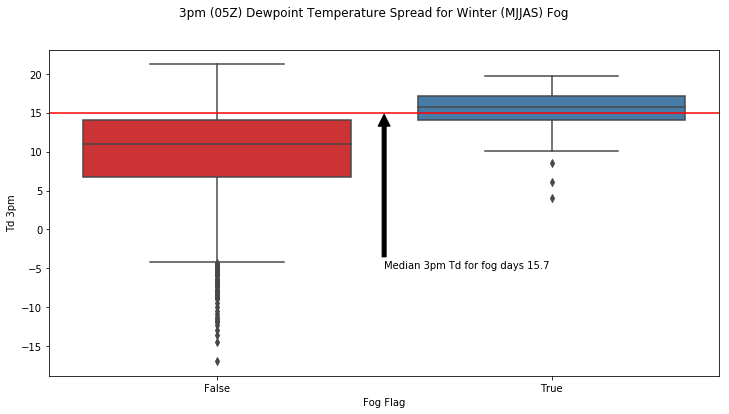

In [54]:
#print(fg_aut.columns)

'''Here we can see where the rule of thumb for 3pm Td > 16 for fog days 
come from - the median TD for winter fog is about 15C


By comparision median for non fog winter days is about 10 ~ Q1 for fog days

Better rule of thum for winter fog days - consider fog if Td > Q3 (no fog days) ~ 13
and high chance if Td > 14C '''

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='fogflag', y='Td5', data=fg_JJA,  palette='Set1',ax=ax)

fig.suptitle('3pm (05Z) Dewpoint Temperature Spread for Winter (MJJAS) Fog')
ax.set_xlabel('Fog Flag')
ax.set_ylabel('Td 3pm')
# ax.legend(['Fog', 'No Fog'],loc='lower right')
# sns.despine(offset=10, trim=True)
ax.axhline(y=15,color='red')# ymin=0, ymax=1)
ax.annotate('Median 3pm Td for fog days 15.7', xy=(0.5, 15), xytext=(0.5, -5),
            arrowprops=dict(facecolor='black', shrink=0.01))

Text(15.649999999999999, 0.35, 'Median Td for fog days')

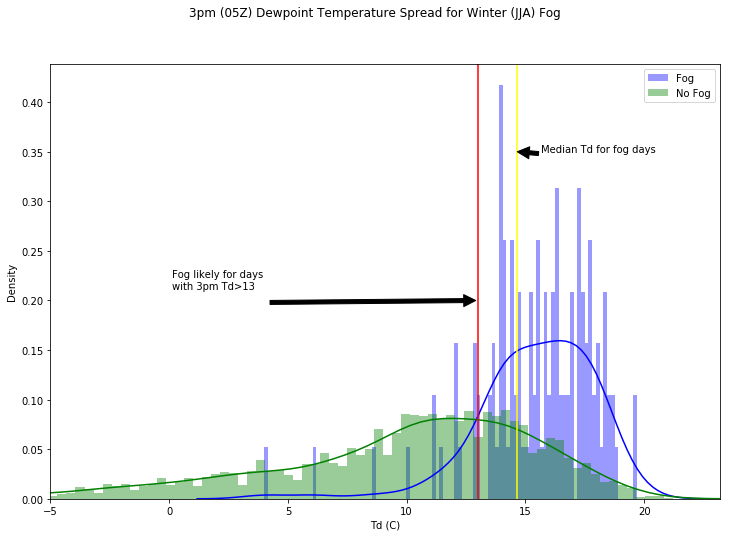

In [55]:
'''
https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.annotate.html
text : str
The text of the annotation. s is a deprecated synonym for this parameter.

xy : (float, float)
The point (x,y) to annotate.

xytext : (float, float), optional
The position (x,y) to place the text at. If None, defaults to xy.
'''
fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(12,8))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'Td5'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'Td5'].values, kde=True, color='green', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle('3pm (05Z) Dewpoint Temperature Spread for Winter (JJA) Fog\n')
ax.set_xlabel('Td (C)')
#ax.set_xlim(fg_JJA['Td8'].min()+1,fg_JJA['Td8'].max()+1)
ax.set_xlim(-5,fg_JJA['Td5'].max()+2)
ax.set_ylabel('Density')

ax.axvline(x=13,color='red')# ymin=0, ymax=1)
ax.annotate('Fog likely for days \nwith 3pm Td>13\n', xy=(13, 0.2), xytext=(0.1, 0.2),
            arrowprops=dict(facecolor='black', shrink=0.01))

ax.axvline(x=MJJAS_Td.loc[idx[True,0.5], 'Td5'],color='yellow')# ymin=0, ymax=1)
ax.annotate('Median Td for fog days',
            xy=(MJJAS_Td.loc[idx[True,0.5], 'Td5'], 0.35),
            xytext=(MJJAS_Td.loc[idx[True,0.5], 'Td5']+1, 0.35),
            arrowprops=dict(facecolor='black', shrink=0.01))
# see more annotation shere

# https://jakevdp.github.io/PythonDataScienceHandbook/04.09-text-and-annotation.html

Text(16.55, 0.35, 'Median Td for fog days')

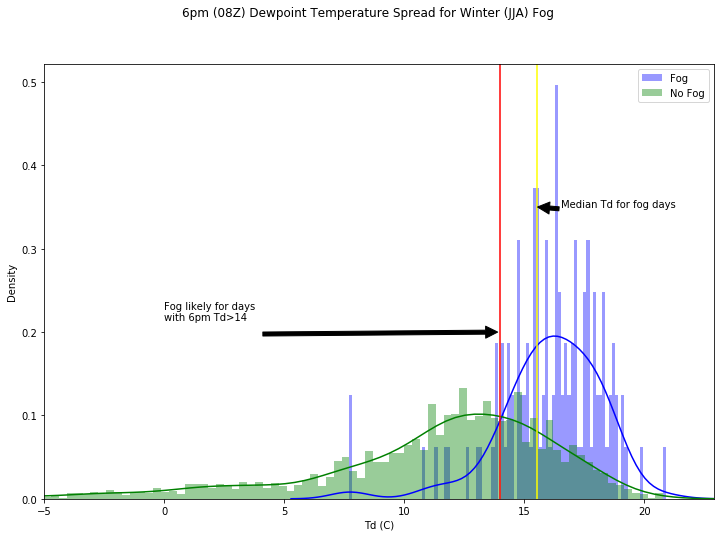

In [56]:
fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(12,8))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'Td8'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'Td8'].values, kde=True, color='green', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle('6pm (08Z) Dewpoint Temperature Spread for Winter (JJA) Fog\n')
ax.set_xlabel('Td (C)')
#ax.set_xlim(fg_JJA['Td8'].min()+1,fg_JJA['Td8'].max()+1)
ax.set_xlim(-5,fg_JJA['Td8'].max()+2)
ax.set_ylabel('Density')

ax.axvline(x=14,color='red')# ymin=0, ymax=1)
ax.annotate('Fog likely for days \nwith 6pm Td>14\n', xy=(14, 0.2), xytext=(0, 0.2),
            arrowprops=dict(facecolor='black', shrink=0.01))

ax.axvline(x=MJJAS_Td.loc[idx[True,0.5], 'Td8'],color='yellow')# ymin=0, ymax=1)
ax.annotate('Median Td for fog days',
            xy=    (MJJAS_Td.loc[idx[True,0.5], 'Td8'], 0.35),
            xytext=(MJJAS_Td.loc[idx[True,0.5], 'Td8']+1, 0.35),
            arrowprops=dict(facecolor='black', shrink=0.01))

Text(4, 0.16, 'Fog likely given increasing Td 3pm last 4 days')

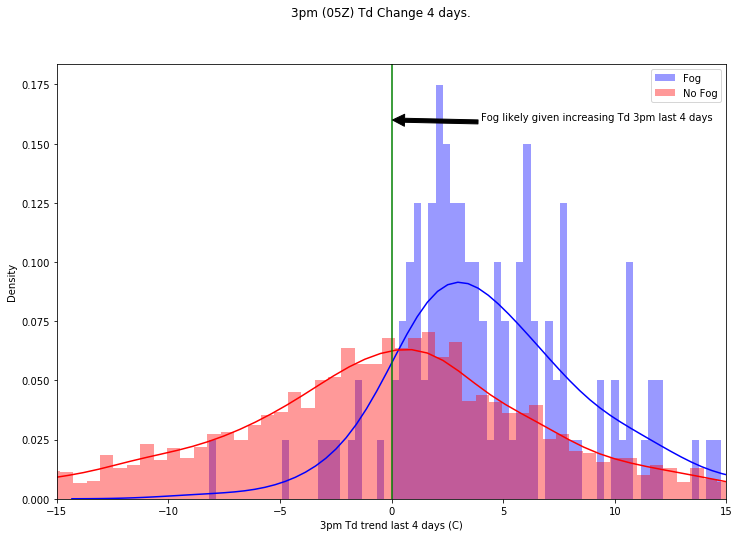

In [57]:
fg_aut['Td5_4day']=fg_aut['Td5'].diff(periods=4) # 4day trend Td Sep 12am
fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(12,8))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'Td5_4day'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'Td5_4day'].values, kde=True, color='red', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle(f'3pm (05Z) Td Change 4 days.')
ax.set_xlabel('3pm Td trend last 4 days (C)')
ax.set_ylabel('Density')
ax.set_xlim(-15,15)
ax.axvline(x=0,color='green')# ymin=0, ymax=1)
ax.annotate('Fog likely given increasing Td 3pm last 4 days', xy=(0, 0.16), xytext=(4, 0.16),
            arrowprops=dict(facecolor='black', shrink=0.01))


In [58]:
from scipy import stats

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
td5_fg_days    = fg_JJA.loc[fg_JJA['fogflag'],'Td5'].dropna().values
td5_no_fg_days = fg_JJA.loc[~fg_JJA['fogflag'],'Td5'].dropna().values

mean_td5_fg =np.median(td5_fg_days) #.mean()
mean_td5_no_fg =np.median(td5_no_fg_days) #.mean()

std_err_fg = td5_fg_days.std()/np.sqrt(len(td5_fg_days))
std_err_no_fg = td5_no_fg_days.std()/np.sqrt(len(td5_no_fg_days))

print(f'Mean Td at 3pm for fog days = {mean_td5_fg} with standard error of {std_err_fg}') 
print(f'Mean Td at 3pm for fog days = {mean_td5_no_fg} with standard error of {std_err_no_fg}') 

confidence = 0.9  # 90% CI
h=std_err_fg*stats.t.ppf((1+confidence)/2,len(td5_fg_days))
if mean_td5_fg-h <= 20 <= mean_td5_fg+h:
    interval_90_count*=1
       
'''
https://machinelearningmastery.com/confidence-intervals-for-machine-learning/

A confidence interval is a bounds on the estimate of a population variable. 
It is an interval statistic used to quantify the uncertainty on an estimate.

Commonly used number of standard deviations from the Gaussian distribution and their 
corresponding significance level are as follows:

1.64 (90%)
1.96 (95%)
2.33 (98%)
2.58 (99%)

interval = z * sqrt( (error * (1 - error)) / n)
'''
# Note Median Td 3 pm for fog days ~ 16C

# binomial confidence interval
from math import sqrt
interval = 1.64 * sqrt( (std_err_fg * (1 - std_err_fg)) / len(td5_fg_days))
print('%.3f' % interval)

Mean Td at 3pm for fog days = 15.75 with standard error of 0.2228761118647029
Mean Td at 3pm for fog days = 11.0 with standard error of 0.11057195958107269
0.062


In [59]:
'''
fg_days = fg_aut.loc[fg_aut['fogflag']]; 
fg_free_days = fg_aut.loc[~fg_aut['fogflag']]

mask = (fg_days['min_vis']<=2) & (fg_days['fg_duration']>=1)
bad_fg_days = fg_days.loc[mask]
not_in_bad_fg_days = \
    fg_aut.loc[(fg_aut.index).difference(bad_fg_days.index)]
'''

#  https://www.kite.com/python/answers/how-to-compute-the-confidence-interval-of-a-sample-statistic-in-python
'''
confidence_level = 0.95
degrees_freedom = sample.size - 1
sample_mean = np.mean(sample)
sample_standard_error = scipy.stats.sem(sample)
confidence_interval = scipy.stats.t.interval(confidence_level, degrees_freedom, sample_mean, sample_standard_error)
'''

from scipy import stats
from scipy.stats import sem, t
confidence_level = 0.90  # 90% confidence interval

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
td5_fg_days    = fg_JJA.loc[fg_JJA['fogflag'],'Td5'].dropna().values
td5_no_fg_days = fg_JJA.loc[~fg_JJA['fogflag'],'Td5'].dropna().values

mean_fg =    np.median(td5_fg_days) #.mean()
mean_fg =    np.mean(td5_fg_days)
mean_no_fg = np.median(td5_no_fg_days) #.mean()
mean_no_fg = np.mean(td5_no_fg_days)

se_fg =    td5_fg_days.std() / np.sqrt(len(td5_fg_days))
se_fg =   sem(td5_fg_days)  # sample_standard_error=scipy.stats.sem(sample)
se_no_fg = td5_no_fg_days.std()/np.sqrt(len(td5_no_fg_days))
se_no_fg= sem(td5_no_fg_days)

# n = len(data)  m = mean(data)  std_err = sem(data)


h1 = se_fg    * t.ppf((1 + confidence_level) / 2, len(td5_fg_days)    - 1)
h2 = se_no_fg * t.ppf((1 + confidence_level) / 2, len(td5_no_fg_days) - 1)

print(f'Mean Td at 3pm for fog days = {mean_fg:.1f} with standard error of {se_fg:.1f}\n90% Confidence Interval : {(mean_fg-h1):.1f} to {(mean_fg+h1):.1f}') 
print(f'Mean Td at 3pm for no fog days = {mean_no_fg:.1f} with standard error of {se_no_fg:.1f}\n90% Confidence Interval : {(mean_no_fg-h2):.1f} to {(mean_no_fg+h2):.1f}') 

degrees_freedom=len(td5_fg_days)- 1
confidence_interval = np.round(stats.t.interval(confidence_level, degrees_freedom, mean_fg, se_fg),1)
confidence_interval


Mean Td at 3pm for fog days = 15.4 with standard error of 0.2
90% Confidence Interval : 15.1 to 15.8
Mean Td at 3pm for no fog days = 9.8 with standard error of 0.1
90% Confidence Interval : 9.6 to 9.9


array([15.1, 15.8])

In [60]:
print(td5_fg_days.std()/np.sqrt(len(td5_fg_days)),sem(td5_fg_days))
print(td5_no_fg_days.std()/np.sqrt(len(td5_no_fg_days)),sem(td5_no_fg_days))

0.2228761118647029 0.22379519251387786
0.11057195958107269 0.11059161157795429


In [61]:
'''Dat is in wide/fat table format at the moment - makes some plotting tasks difficult with seaborn
We need to transform data into narrow but long format - using stack() to get columns into rows
stack(),pivot(),melt() basically do similar things - we use melt()

So only the columns where index/label starts with T or Td followed by one or more digit
only one or two digits \d{1,2}, \d* (says zero or more), \d+ (one or more)
'''
fg_aut.loc[:,(fg_aut.columns.str.contains(pat = '^(T|Td)\d+', regex = True))].tail()


/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/ipykernel_launcher.py:8: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  


,T5,Td5,T8,Td8,T11,Td11,T14,Td14,T17,Td17,T20,Td20,Td8to14,Td11to17,Td5_4day,T14_48hr
2020-03-24,22.6,18.6,22.4,18.2,21.3,18.1,20.8,18.2,20.2,18.8,19.6,19.1,0.0,0.7,2.7,-2.1
2020-03-25,25.7,16.0,21.8,16.0,20.7,16.6,19.1,17.3,17.5,16.1,17.0,15.8,1.3,-0.5,-0.9,-3.6
2020-03-26,26.6,17.5,23.7,18.1,23.5,18.6,20.4,19.0,19.9,18.0,18.6,17.3,0.9,-0.6,-1.9,-0.4
2020-03-27,23.0,17.9,21.0,16.2,20.8,15.9,19.7,15.5,18.8,15.0,18.5,15.2,-0.7,-0.9,-1.0,0.6
2020-03-28,25.7,18.6,23.1,19.7,22.3,19.6,21.5,19.1,19.2,18.7,20.0,18.7,-0.6,-0.9,0.0,1.1


In [62]:
''' ******   Temperature Melt()  '''
dfT = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains(pat = '^T\d+', regex = True))].reset_index(),
              id_vars='index',
              value_vars=['T5','T8','T11','T14','T17','T20'],
              var_name='T',
              value_name="T_val")
#print(dfT.loc[dfT['index']=='2020-03-17'].tail(),"\n")
dfT.set_index(keys=pd.to_datetime(dfT['index']), drop=True,inplace=bool(1))
#print(dfT.loc[dfT['index']=='2020-03-17'].tail(),"\n")
dfT.drop(columns=['index'],inplace=bool(1))
dfT.loc['2020-03-17'].tail(6)

,T,T_val
index,,
2020-03-17,T5,24.9
2020-03-17,T8,23.0
2020-03-17,T11,21.7
2020-03-17,T14,18.7
2020-03-17,T17,17.3
2020-03-17,T20,17.0


In [63]:
# Now the data for each synop time is in different rows we can plot data for different synop times in same plot


''' ******   Temperature Melt()  '''
dfT = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains(pat = '^T\d+', regex = True))].reset_index(),
              id_vars='index',
              value_vars=['T5','T8','T11','T14','T17','T20'],
              var_name='T',
              value_name="T_val")
dfT.set_index(keys=pd.to_datetime(dfT['index']), drop=True,inplace=bool(1))
dfT.drop(columns=['index'],inplace=bool(1))

''' ******   Dewpoint Melt()  '''
dfTd = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains(pat = '^Td\d+',
                                                         regex = True))].reset_index(),
              id_vars='index',
              value_vars=['Td5','Td8','Td11','Td14','Td17','Td20'],
              var_name='Td',
              value_name="Td_val")
dfTd.set_index(keys=pd.to_datetime(dfTd['index']), drop=True,inplace=bool(1))
dfTd.drop(columns=['index'],inplace=bool(1))

''' ******   Seperation Melt()  '''
dfTmTd =  pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains("TmTd\d+"))].reset_index(),
              id_vars='index',
              value_vars=['TmTd5','TmTd8','TmTd11','TmTd14','TmTd17','TmTd20'],
              var_name='TmTd',
              value_name="TmTd_val")
dfTmTd.set_index(keys=pd.to_datetime(dfTmTd['index']), drop=True,inplace=bool(1))
dfTmTd.drop(columns=['index'],inplace=bool(1))

''' ******   RH Melt()  '''
dfRH = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains("RH\d+"))].reset_index(),
              id_vars='index',
              value_vars=['RH5','RH8','RH11','RH14','RH17','RH20'],
              var_name='RH',
              value_name="RH_val")
dfRH.set_index(keys=pd.to_datetime(dfRH['index']), drop=True,inplace=bool(1))
dfRH.drop(columns=['index'],inplace=bool(1))

''' ******   QNH Melt()  '''
dfQNH = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains("QNH\d+"))].reset_index(),
              id_vars='index',
              value_vars=['QNH5','QNH8','QNH11','QNH14','QNH17','QNH20'],
              var_name='QNH',
              value_name="QNH_val")
dfQNH.set_index(keys=pd.to_datetime(dfQNH['index']), drop=True,inplace=bool(1))
dfQNH.drop(columns=['index'],inplace=bool(1))

''' ******   Precip Melt()  '''
dfpptn = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains("pptn\d+"))].reset_index(),
              id_vars='index',
              value_vars=['pptn5','pptn8','pptn11','pptn14','pptn17','pptn20'],
              var_name='pptn',
              value_name="pptn_val")
dfpptn.set_index(keys=pd.to_datetime(dfpptn['index']), drop=True,inplace=bool(1))
dfpptn.drop(columns=['index'],inplace=bool(1))

''' ******   Surface Wind SPD Melt()  '''
dfwspd = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains("wspd\d+"))].reset_index(),
              id_vars='index',
              value_vars=['wspd5','wspd8','wspd11','wspd14','wspd17','wspd20'],
              var_name='wspd',
              value_name="wspd_val")
dfwspd.set_index(keys=pd.to_datetime(dfwspd['index']), drop=True,inplace=bool(1))
dfwspd.drop(columns=['index'],inplace=bool(1))

''' ******   Surface Wind DIR Melt()  '''
dfwdir = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains("wdir\d+"))].reset_index(),
              id_vars='index',
              value_vars=['wdir5','wdir8','wdir11','wdir14','wdir17','wdir20'],
              var_name='wdir',
              value_name="wdir_val")
dfwdir.set_index(keys=pd.to_datetime(dfwdir['index']), drop=True,inplace=bool(1))
dfwdir.drop(columns=['index'],inplace=bool(1))

''' JOIN THE INDIVIDUAL DATA FRAMES - COLUMN WISE JOIN AXIS=1 '''
fg_temp = pd.concat([dfT,dfTd,dfTmTd,dfRH,dfQNH,dfpptn,dfwspd,dfwdir], axis=1,join='inner')
fg_temp.shape
fg_temp.head()

'''  MERGE fogflag from original fg data '''
fg_melt = fg_temp.merge(fg_aut['fogflag'],left_index=True,right_index=True,how='left')
fg_melt.loc['2019-06-20']

,T,T_val,Td,Td_val,TmTd,TmTd_val,RH,RH_val,QNH,QNH_val,pptn,pptn_val,wspd,wspd_val,wdir,wdir_val,fogflag
2019-06-20,T5,19.6,Td5,11.0,TmTd5,8.6,RH5,58.0,QNH5,1019.3,pptn5,0.0,wspd5,5.0,wdir5,180.0,False
2019-06-20,T8,18.2,Td8,12.0,TmTd8,6.2,RH8,67.0,QNH8,1020.3,pptn8,0.0,wspd8,4.0,wdir8,170.0,False
2019-06-20,T11,17.3,Td11,12.4,TmTd11,4.9,RH11,73.0,QNH11,1020.5,pptn11,0.0,wspd11,5.0,wdir11,180.0,False
2019-06-20,T14,16.5,Td14,11.7,TmTd14,4.8,RH14,73.0,QNH14,1019.7,pptn14,0.0,wspd14,7.0,wdir14,210.0,False
2019-06-20,T17,16.1,Td17,11.5,TmTd17,4.6,RH17,74.0,QNH17,1018.8,pptn17,0.0,wspd17,8.0,wdir17,210.0,False
2019-06-20,T20,14.5,Td20,10.9,TmTd20,5.2,RH20,79.0,QNH20,1018.4,pptn20,0.0,wspd20,7.0,wdir20,210.0,False


In [64]:
print(fg_melt.columns)
fg_aut.loc[:,(fg_aut.columns.str.contains("wdir\d+"))].tail(2)

Index(['T', 'T_val', 'Td', 'Td_val', 'TmTd', 'TmTd_val', 'RH', 'RH_val', 'QNH',
       'QNH_val', 'pptn', 'pptn_val', 'wspd', 'wspd_val', 'wdir', 'wdir_val',
       'fogflag'],
      dtype='object')


,wdir5,wdir8,wdir11,wdir14,wdir17,wdir20
2020-03-27,170.0,150.0,190.0,200.0,200.0,220.0
2020-03-28,120.0,90.0,120.0,130.0,210.0,250.0


Int64Index([2017, 2014, 2013, 2019, 2018, 2016, 2012, 2009, 2010, 2015, 2007,
            2003, 2004, 2008, 2011, 2006, 2005, 2002, 2001, 2000, 2020],
           dtype='int64')


[Text(0, 0, '2000'),
 Text(0, 0, '2001'),
 Text(0, 0, '2002'),
 Text(0, 0, '2003'),
 Text(0, 0, '2004'),
 Text(0, 0, '2005'),
 Text(0, 0, '2006'),
 Text(0, 0, '2007'),
 Text(0, 0, '2008'),
 Text(0, 0, '2009'),
 Text(0, 0, '2010'),
 Text(0, 0, '2011'),
 Text(0, 0, '2012'),
 Text(0, 0, '2013'),
 Text(0, 0, '2014'),
 Text(0, 0, '2015'),
 Text(0, 0, '2016'),
 Text(0, 0, '2017'),
 Text(0, 0, '2018'),
 Text(0, 0, '2019')]

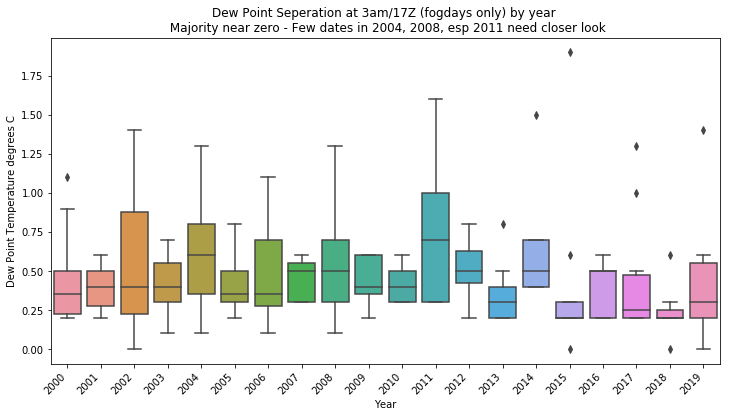

In [65]:
# simple way to get unique values for range of years for data
print(fg_aut.index.year.value_counts().index)

# xlabels = [dict_mon[x+1] for x in g.get_xticks()]
# g.set_xticklabels(xlabels)

fg_MJJAS = fg_melt[( fg_melt.index.month.isin([5,6,7,8,9]))]
'''
https://www.drawingfromdata.com/how-to-rotate-axis-labels-in-seaborn-and-matplotlib
https://medium.com/@neuralnets/data-visualization-with-python-and-seaborn-part-1-29c9478a8700
'''
fig, ax = plt.subplots(1, 1, figsize=(12,6))
#ax.set_xlim=(5,9)
#ax.set_ylim=0,5
dat = fg_aut.loc[fg_aut['fogflag'] & (fg_aut['TmTd17']< 2)]
sns.boxplot(x=dat.index.year,
            y='TmTd17', 
            ax=ax, data=dat)
ax.set_title("Dew Point Seperation at 3am/17Z (fogdays only) by year "+"\n"+" Majority near zero - Few dates in 2004, 2008, esp 2011 need closer look")
ax.set_xlabel("Year")
ax.set_ylabel("Dew Point Temperature degrees C")
#print(list(ax.get_xticklabels()))
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

{0: '3 pm', 1: '6 pm', 2: '9 pm', 3: '12 am', 4: '3 am', 5: '6 am'}
['3 pm', '6 pm', '9 pm', '12 am', '3 am', '6 am']


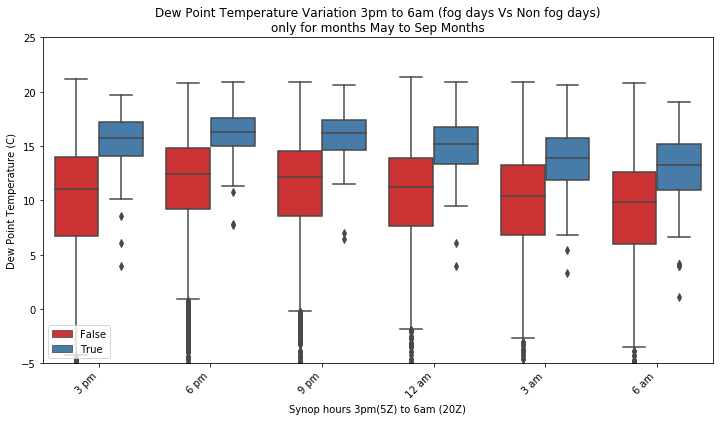

In [66]:
fg_MJJAS = fg_melt[( fg_melt.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='Td',
            y='Td_val',
            data=fg_MJJAS,
            ax=ax,hue='fogflag', palette='Set1')

dict_synop_times=dict(zip(ax.get_xticks(),['3 pm','6 pm','9 pm','12 am','3 am','6 am']))
print(dict_synop_times)

ax.set_title("Dew Point Temperature Variation 3pm to 6am (fog days Vs Non fog days)"+"\n"+"only for months May to Sep Months")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
print(xlabels)
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
#ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("Dew Point Temperature (C)")
if station in ['YTWB','YBOK','YBWW']:
    ax.set_ylim(-10,20)#fg_MJJAS['Td_val'].max())
else:
    ax.set_ylim(-5,25)#fg_MJJAS['Td_val'].max())
ax.legend(loc='lower left')

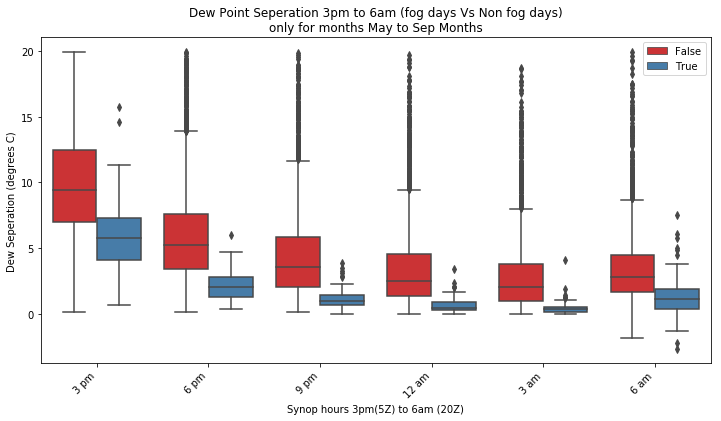

In [67]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='TmTd',
            y='TmTd_val',
            data=fg_MJJAS.loc[fg_MJJAS['TmTd_val'] < 20],
            ax=ax,hue='fogflag', palette='Set1')

ax.set_title("Dew Point Seperation 3pm to 6am (fog days Vs Non fog days)"+             "\nonly for months May to Sep Months")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
#ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("Dew Seperation (degrees C)")
#ax.set_xlim=(5,9)
#ax.set_ylim=(0,25)
ax.legend(loc='upper right')

Text(0, 0.5, 'Dew Point Seperation (degrees Celcius)')

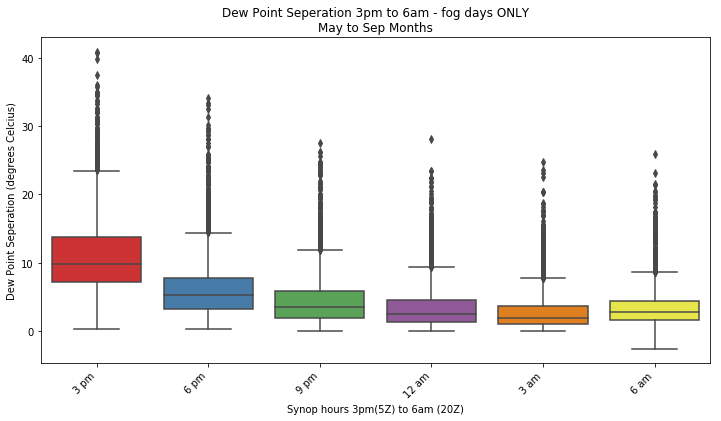

In [68]:
fg_aut.loc[:,(fg_aut.columns.str.contains("TmTd"))].describe()
tmtd_fog_days = fg_aut.loc[fg_aut['fogflag']]

'''Note that for fog days the 14Z and 17Z seperation is <1C in about 75% of the fog cases
Actually middle 50% of cases is between 0.4 to 0.6 @ 14Z, lowest 0.2 to 0.4 @17Z
Replace fog search using Temeprature (no predictabily - see below - with Td Seperation)
'''
tmtd_fog_days.loc[:,(tmtd_fog_days.columns.str.contains("TmTd"))].describe()
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='TmTd',
            y='TmTd_val',
            data=fg_MJJAS, #.loc[fg_MJJAS['TmTd_val'] < 20],
            ax=ax,palette='Set1')

ax.set_title("Dew Point Seperation 3pm to 6am - fog days ONLY"+"\nMay to Sep Months")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("Dew Point Seperation (degrees Celcius)")
#ax.legend(loc='upper right')

Text(10, 0.2, '6pm T-Td<3.5\nfor about 95% of days with fog')

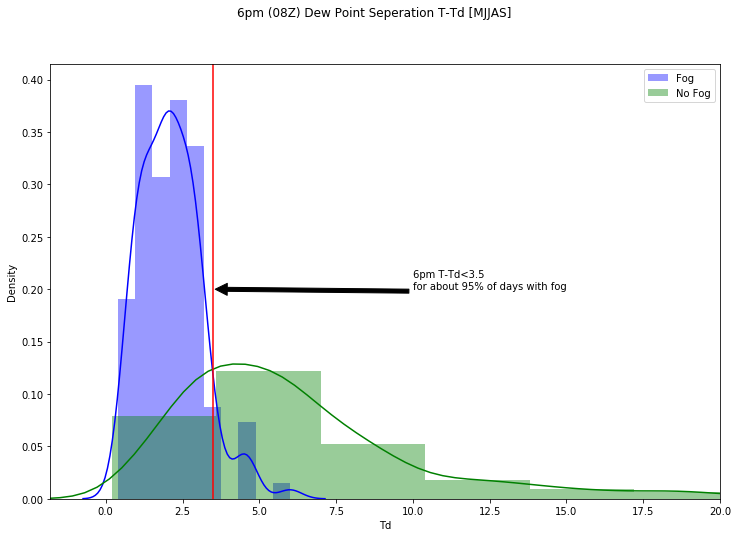

In [69]:

'''
Note that for 6pm Td depression between 0 and about 3, 
the density of fog outcomes is 3 to 4 times density of no fog outcomes
i.e chance of fog on such days 3 to 4 times higher than no fog outcome
'''

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(12,8))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'TmTd8'].values, kde=True, color='blue', bins=10,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'TmTd8'].values, kde=True, color='green', bins=10,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle(f'6pm (08Z) Dew Point Seperation T-Td [MJJAS]')
ax.set_xlabel('Td')
ax.set_xlim(fg_JJA['TmTd8'].min()-2,20)
ax.set_ylabel('Density')
ax.axvline(x=3.5,color='red')# ymin=0, ymax=1)
ax.annotate('6pm T-Td<3.5\nfor about 95% of days with fog', xy=(3.5, 0.2), xytext=(10, 0.2),
            arrowprops=dict(facecolor='black', shrink=0.01))


In [70]:
#https://mode.com/example-gallery/python_dataframe_styling/
# https://towardsdatascience.com/style-pandas-dataframe-like-a-master-6b02bf6468b0
def color_tmtd(value):
  """
  Colors elements in a dateframe green if TmTd < 1 
  and red if TmTd < 1. Else leave it black.
  """

  if value < 1:
    color = 'green'
  elif value > 2:
    color = 'red'
  else:
    color = 'black'

  return 'color: %s' % color

# see 95% quantile value for 6pm T-Td for fog =True days
julyTmTd = fg_aut.loc[fg_aut.index.month.isin([6,7,8]),\
                      ['fogflag','TmTd5','TmTd8','TmTd11','TmTd14','TmTd17','TmTd20']].\
                groupby(['fogflag']).\
                quantile(q=(0.05,0.2,0.5,0.8,0.95))

#julyTmTd.loc[idx[True,:], ['TmTd5','TmTd8']].style.\
julyTmTd.loc[:, ['TmTd5','TmTd8']].style.\
applymap(color_tmtd, subset=['TmTd8']) # only styling 3pm T-Td
#format({'TmTd8': "{:.2%}"}) to applay any foramting as well

In [71]:
# can also check for rain/no rain seperation as well
julyTmTd = fg_aut.loc[fg_aut.index.month.isin([6,7,8]),\
                      ['rain_flag','fogflag','TmTd5','TmTd8','TmTd11','TmTd14','TmTd17','TmTd20']].\
                groupby(['rain_flag','fogflag']).\
                quantile(q=(0.05,0.2,0.5,0.8,0.95))

julyTmTd.loc[idx[:,True,:], ['TmTd5','TmTd8']].style.\
applymap(color_tmtd, subset=['TmTd8']) # only styling 3pm T-Td

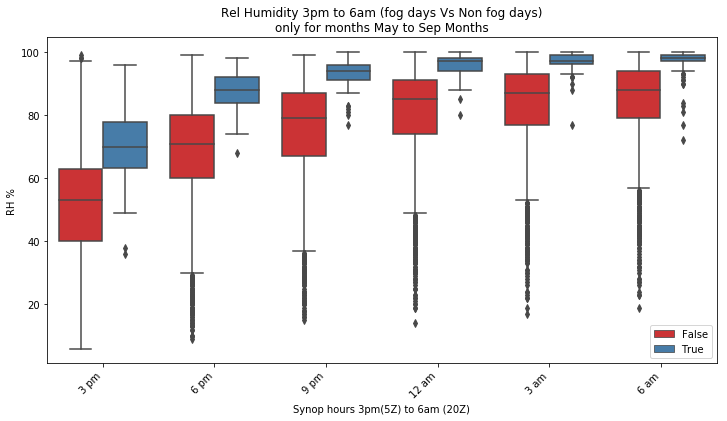

In [72]:
'''Note that for fog days the 14Z and 17Z RH is 94% or 96% in about 75% of the fog cases
Actually middle 50% of cases is between 94 to 96 @ 14Z, and 96-97% @17Z
Note no overlap of mid 50% distribution between fog and non fog days
    Fog days 75% of cases have RH > 94/96% @14/17Z
non Fog days 75% of cases have RH < 89/92% @14/17Z
Excellent prediction variable for fog
Replace fog search using Temperature (no predictabily - see below - with RH)
'''
# fog_days.loc[:,(fog_days.columns.str.contains("RH"))].describe()

#fig=plt.figure(figsize=(10,5))
#ax = fig.add_axes([0, 0, 1, 1])
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='RH',
            y='RH_val',
            data=fg_MJJAS,#.loc[fg_MJJAS['RH_val'] > 40],
            ax=ax,hue='fogflag', palette='Set1')

ax.set_title("Rel Humidity 3pm to 6am (fog days Vs Non fog days)"+             "\nonly for months May to Sep Months")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("RH %")
ax.legend(loc='lower right')

Text(10, 0.08, 'Fog days likely given 3pm RH>=60%')

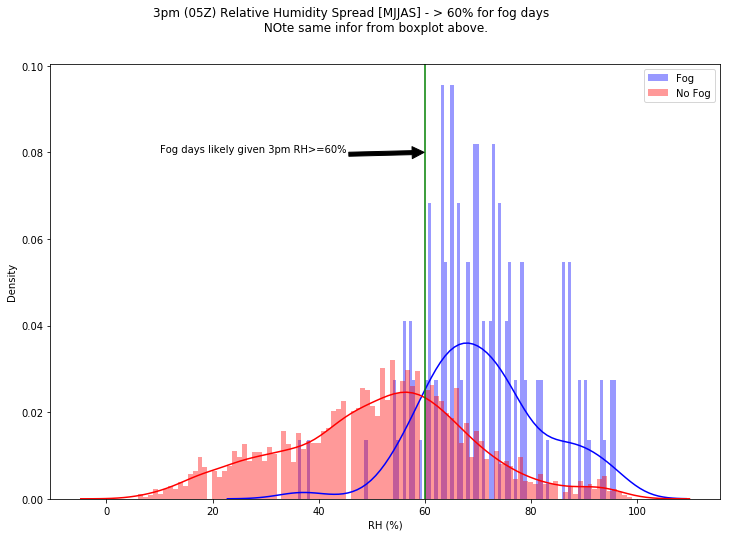

In [73]:
fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(12,8))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'RH5'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'RH5'].values, kde=True, color='red', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle(f'3pm (05Z) Relative Humidity Spread [MJJAS] - > 60% for fog days            \n NOte same infor from boxplot above.')
ax.set_xlabel('RH (%)')
ax.set_ylabel('Density')
ax.axvline(x=60,color='green')# ymin=0, ymax=1)
ax.annotate('Fog days likely given 3pm RH>=60%', xy=(60, 0.08), xytext=(10, 0.08),
            arrowprops=dict(facecolor='black', shrink=0.01))

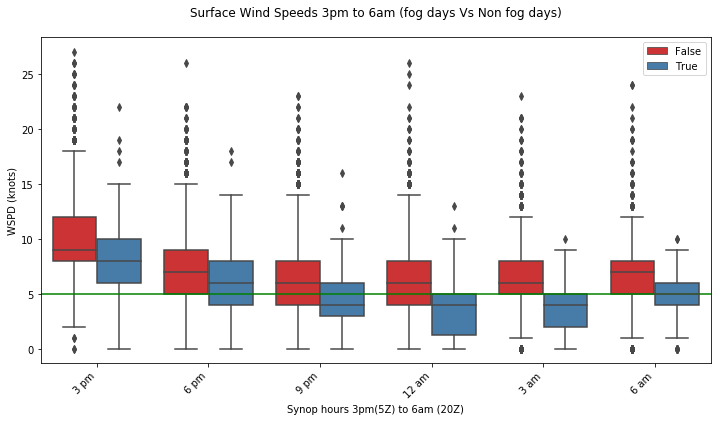

In [74]:
# Rule out fog at YBBN if winds greater than 10 knots 9pm onwards 
# best conditions winds less than 5 knots 12am onwards.

fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='wspd',
            y='wspd_val',
            data=fg_MJJAS,
            ax=ax,hue='fogflag', palette='Set1')

ax.set_title("Surface Wind Speeds 3pm to 6am (fog days Vs Non fog days)"+
             "\n"+"")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("WSPD (knots)")
ax.legend(loc='upper right')
ax.axhline(y=5,color='green',linestyle='-')# ymin=0, ymax=1)
#ax.axhline(y=10,color='green',linestyle='-')# ymin=0, ymax=1)
#ax.annotate('Fog days likely given 3pm RH>=60%', xy=(60, 0.08), xytext=(10, 0.08),
#            arrowprops=dict(facecolor='black', shrink=0.01))

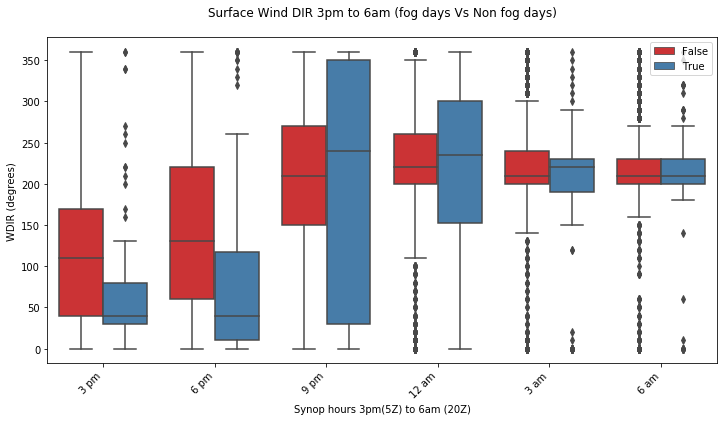

In [75]:
# Note this is not the best plot cause it treats wind dir as a numeric quantity
# However visual does suggest that fog more likely at YBBN for winds from NE quadrant 3pm and 6pm - actually about 3 times as likely for winds about and north of NE, ie.e for directions NE,NNE and N.

fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='wdir',
            y='wdir_val',
            data=fg_MJJAS,
            ax=ax,hue='fogflag', palette='Set1')

ax.set_title("Surface Wind DIR 3pm to 6am (fog days Vs Non fog days)"+
             "\n"+"")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("WDIR (degrees)")
ax.legend(loc='upper right')

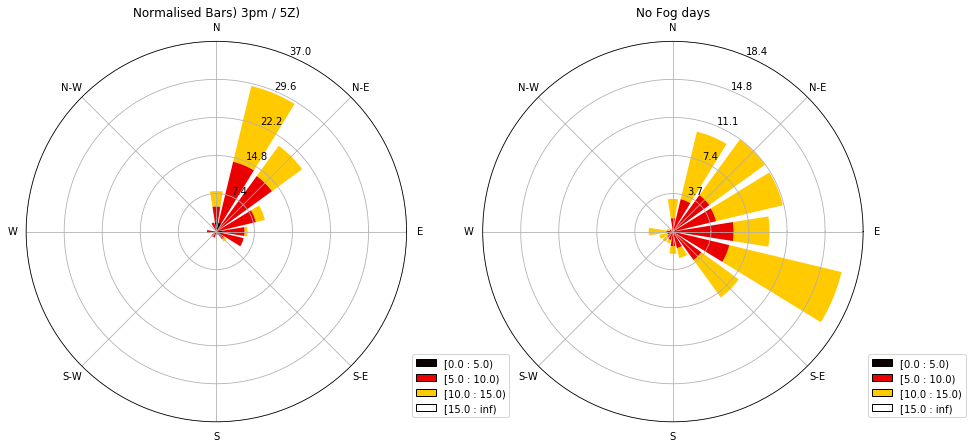

In [76]:
from windrose import WindroseAxes
from windrose import plot_windrose
import matplotlib.cm as cm

wind_3pm_fg = fg_days[['wdir5', 'wspd5']].rename( columns={'wdir5': 'direction', 'wspd5': 'speed'})
wind_3pm_nofg = fg_free_days[['wdir5', 'wspd5']].rename( columns={'wdir5': 'direction', 'wspd5': 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)

if station == 'YTWB':
    plot_windrose(wind_3pm_fg, kind='bar', 
              normed=True, bins=np.arange(0,30,5), 
              cmap=cm.hot, lw=3,ax=ax1)
    plot_windrose(wind_3pm_nofg, kind='bar', 
              normed=True, bins=np.arange(0,30,5), 
              cmap=cm.hot, lw=3,ax=ax2)
else:
    plot_windrose(wind_3pm_fg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)
    plot_windrose(wind_3pm_nofg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
    
    
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Normalised Bars) 3pm / 5Z)")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
    
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")

plt.show()

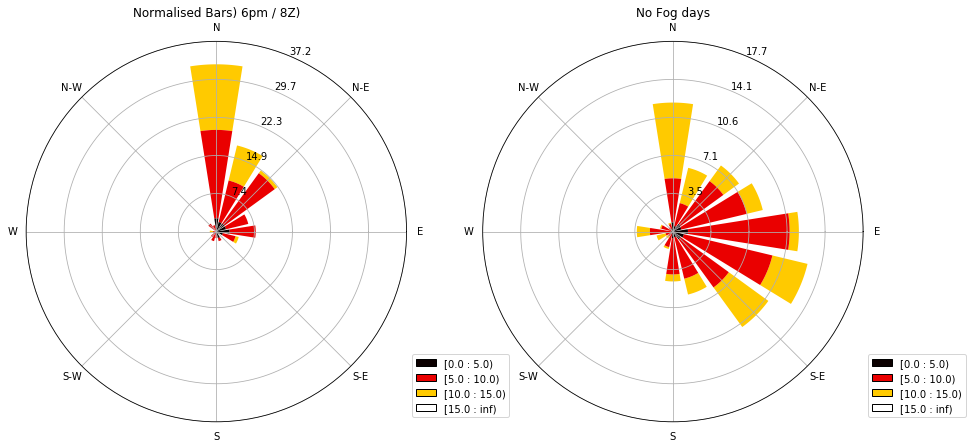

In [77]:
wind_6pm_fg = fg_days[['wdir8', 'wspd8']].rename( columns={'wdir8': 'direction', 'wspd8': 'speed'})
wind_6pm_nofg = fg_free_days[['wdir8', 'wspd8']].rename( columns={'wdir8': 'direction', 'wspd8': 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)

if station == 'YTWB':
    plot_windrose(wind_6pm_fg, kind='bar', 
              normed=True, bins=np.arange(0,30,5), 
              cmap=cm.hot, lw=3,ax=ax1)

    plot_windrose(wind_6pm_nofg, kind='bar', 
              normed=True, bins=np.arange(0,30,5), 
              cmap=cm.hot, lw=3,ax=ax2)
else:
    plot_windrose(wind_6pm_fg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)

    plot_windrose(wind_6pm_nofg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
   
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Normalised Bars) 6pm / 8Z)")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)

ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()


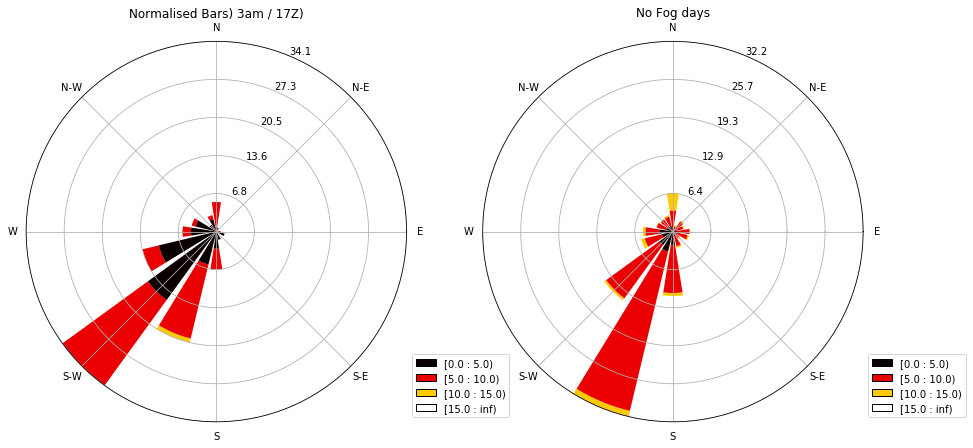

In [78]:
wind_3am_fg = fg_days[['wdir17', 'wspd17']].rename( columns={'wdir17': 'direction', 'wspd17': 'speed'})
wind_3am_nofg = fg_free_days[['wdir17', 'wspd17']].rename( columns={'wdir17': 'direction', 'wspd17': 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)

if station == 'YTWB':
    plot_windrose(wind_3am_fg, kind='bar', 
              normed=True, bins=np.arange(0,30,5), 
              cmap=cm.hot, lw=3,ax=ax1)
    plot_windrose(wind_3am_nofg, kind='bar', 
              normed=True, bins=np.arange(0,30,5), 
              cmap=cm.hot, lw=3,ax=ax2)
else:
    plot_windrose(wind_3am_fg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)
    plot_windrose(wind_3am_nofg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
    
    
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Normalised Bars) 3am / 17Z)")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
    
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")

plt.show()

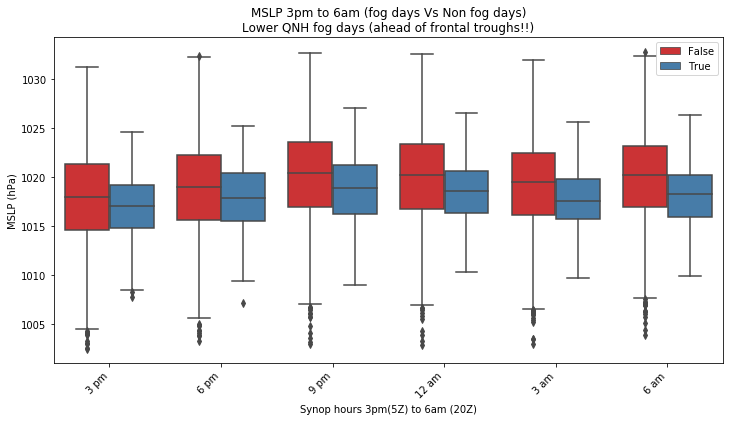

In [79]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='QNH',
            y='QNH_val',
            data=fg_MJJAS.loc[fg_MJJAS['QNH_val'] > 1002],
            ax=ax,hue='fogflag', palette='Set1')

ax.set_title("MSLP 3pm to 6am (fog days Vs Non fog days)"+
             "\n"+"Lower QNH fog days (ahead of frontal troughs!!)")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("MSLP (hPa)")
ax.legend(loc='upper right')

Text(0, 0.5, 'Density')

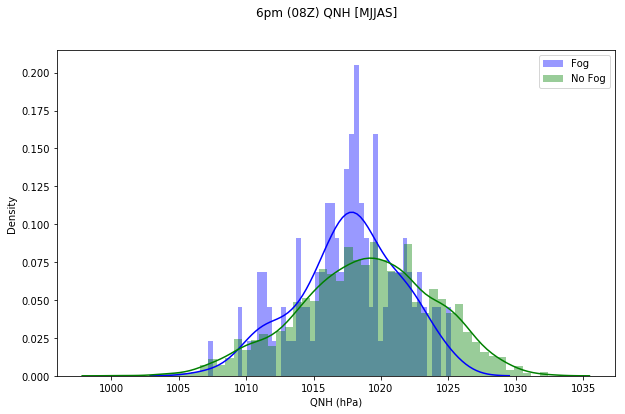

In [80]:
fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'QNH8'].values, kde=True, color='blue', bins=50,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'QNH8'].values, kde=True, color='green', bins=50,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle(f'6pm (08Z) QNH [MJJAS]')
ax.set_xlabel('QNH (hPa)')
ax.set_ylabel('Density')

Text(5, 0.1, 'Fog more likely with\nfalling pressure last 24/48hr')

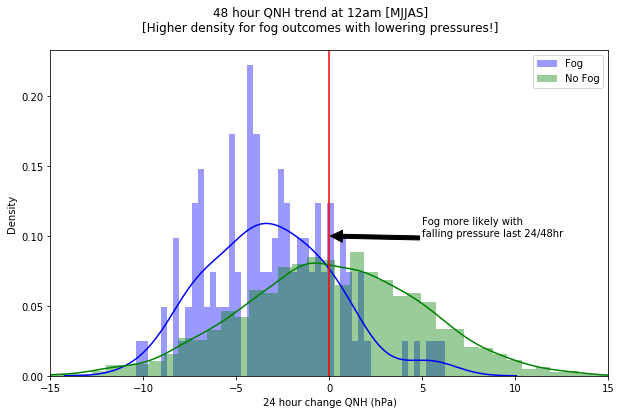

In [81]:
# QNH at synop times are NOT VERY GOOD DISCRIMINATOR between Fog/No Fog Events! BUT QNH trends do.
# 
# Note the quite Bell shaped/normal distribution 48hr change in QNH trend QNH(12am)
# QNH(-48hr) at for no fog outcomes. For fog days however, strongly skewed with majority lowering QNH trend - i.e below 0hpa. Some overlap with no fog outcomes but lowering QNH more convinving for fog outcomes. Some value in considering 24/28 hr QNH trend as fog predictor for YBBN at least.


'''
Density of fog outcomes at least 2 times that of non fog for QNH trend between -3 and -8
'''

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]#.dropna(subset=['TmTd_trend_5to14'])
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'QNH14_48hr'].values, kde=True, color='blue', bins=50,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'QNH14_48hr'].values, kde=True, color='green', bins=50,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle('48 hour QNH trend at 12am [MJJAS]\n[Higher density for fog outcomes with lowering pressures!]')
ax.set_xlabel('24 hour change QNH (hPa)')
ax.set_ylabel('Density')
ax.set_xlim(-15,15)
ax.axvline(x=0,color='red')# ymin=0, ymax=1)
ax.annotate('Fog more likely with\nfalling pressure last 24/48hr', xy=(0, 0.1), xytext=(5, 0.1),
            arrowprops=dict(facecolor='black', shrink=0.01))

Text(0, 0.5, 'Temperature (degrees C)')

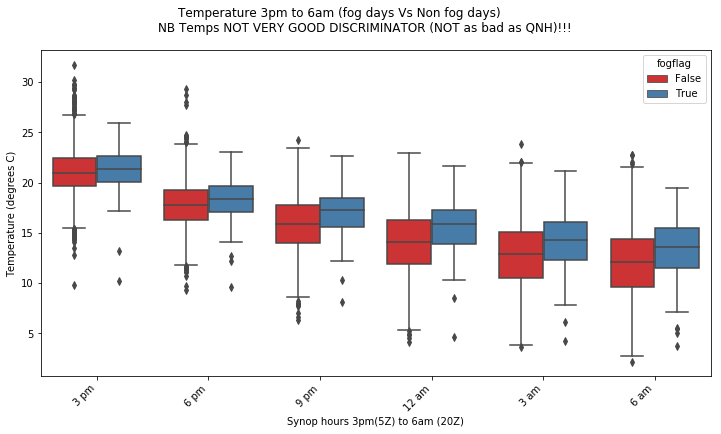

In [82]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='T',
            y='T_val',
            data=fg_MJJAS,
            ax=ax,hue='fogflag', palette='Set1')

fig.suptitle(f'Temperature 3pm to 6am (fog days Vs Non fog days)             \nNB Temps NOT VERY GOOD DISCRIMINATOR (NOT as bad as QNH)!!!')
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("Temperature (degrees C)")

Text(0, 0.5, 'Density')

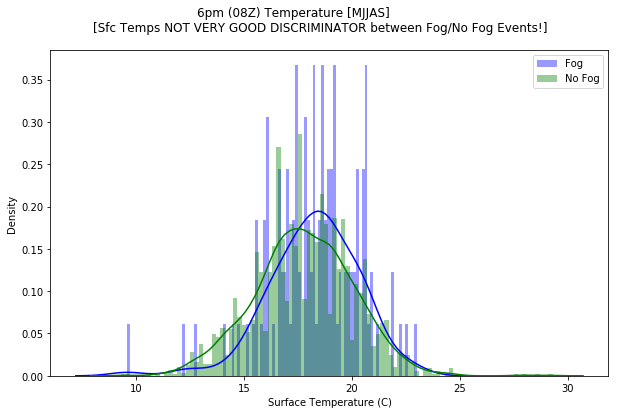

In [83]:
fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'T8'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'T8'].values, kde=True, color='green', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle('6pm (08Z) Temperature [MJJAS]              \n[Sfc Temps NOT VERY GOOD DISCRIMINATOR between Fog/No Fog Events!]')
ax.set_xlabel('Surface Temperature (C)')
ax.set_ylabel('Density')

Text(2.5, 0.4, 'Fog more likely with\nlowering seperation last 24/48hr')

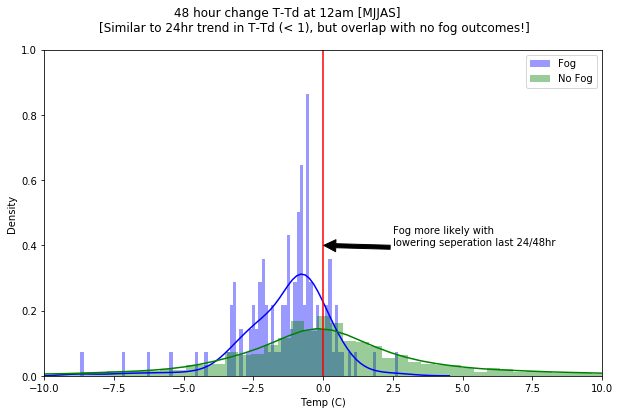

In [84]:
# HIgher chance fog if Td sep trend 48hr 0 to -3
# Normally distributed 24hr change in Td seperation T-Td around 0deg at 12am for no fog outcomes. 
# For fog days however, strongly skewed with majority 80 to 90% less than 1.
# No surprise here although this part of distribution also overlaps with no fog outcomes So marginal value at best.

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'TmTd14_48hr'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'TmTd14_48hr'].values, kde=True, color='green', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle('48 hour change T-Td at 12am [MJJAS]              \n[Similar to 24hr trend in T-Td (< 1), but overlap with no fog outcomes!]')
ax.set_xlabel('Temp (C)')
ax.set_ylabel('Density')
ax.set_ylim(0,1)
ax.set_xlim(-10,10)
ax.axvline(x=0,color='red')# ymin=0, ymax=1)
ax.annotate('Fog more likely with\nlowering seperation last 24/48hr', xy=(0, 0.4), xytext=(2.5, 0.4),
            arrowprops=dict(facecolor='black', shrink=0.01))

In [85]:
'''
Decreasing T-Td trend 3pm to 3am and depression below defined threholds at certain synop times

fg_aut['TmTd_trend_8to17']=\
    (fg_aut['TmTd17']<fg_aut['TmTd14'])&(fg_aut['TmTd14']<fg_aut['TmTd11'])&\
    (fg_aut['TmTd11']<fg_aut['TmTd8'])&(fg_aut['TmTd8']<fg_aut['TmTd5'])&\
    (fg_aut['TmTd17']<1.5) & (fg_aut['TmTd14']<2.5) & (fg_aut['TmTd11']<3.5) # 133 days and 59 had fog
    
Out of about 7000 events,
800 days trend is true - of these about 90 days lead to fog
6200 days trend false - but 74 of this days end up getting fog - not much discrimination!!
'''
# https://pbpython.com/pandas-crosstab.html
pd.crosstab(fg_aut['TmTd_trend_5to14'],fg_aut['fogflag'],margins=True, margins_name="Total")


fogflag,False,True,Total
TmTd_trend_5to14,,,
False,5871,44,5915
True,956,122,1078
Total,6827,166,6993


In [86]:
round(pd.crosstab(fg_aut['TmTd_trend_5to14'],fg_aut['fogflag'],margins=True, margins_name="Total",normalize=True)*100,1)

fogflag,False,True,Total
TmTd_trend_5to14,,,
False,84.0,0.6,84.6
True,13.7,1.7,15.4
Total,97.6,2.4,100.0


In [87]:
round(fg_aut['fogflag'].groupby(fg_aut['TmTd_trend_5to14']).value_counts(normalize=True)*100,0)


TmTd_trend_5to14  fogflag
False             False      99.0
                  True        1.0
True              False      89.0
                  True       11.0
Name: fogflag, dtype: float64

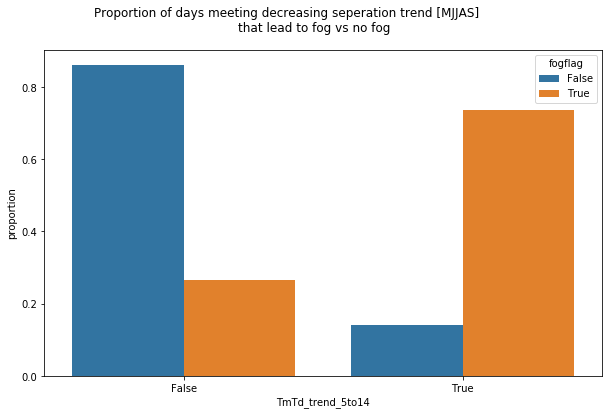

In [88]:
'''
Fog outcome higher (75%) for days meeting decreasing Td seperation between 5Z and 17Z - false alarms 10%
For days not meeting trend about 85% of days did not have fog, but about 25% did - can miss 25% of events!!

good predictive skills!!!
'''

fg_aut['fogflag'].groupby(fg_aut['TmTd_trend_5to14']).value_counts(normalize=True)
percentage = lambda i: len(i) / float(len(x)) * 100

#fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))
#sns.countplot(x="TmTd_trend_8to17", hue="fogflag",  estimator=percentage,data=fg_aut)

# https://stackoverflow.com/questions/35692781/python-plotting-percentage-in-seaborn-bar-plot

fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))
fig.suptitle('Proportion of days meeting decreasing seperation trend [MJJAS]              \nthat lead to fog vs no fog')
x, y, hue = "TmTd_trend_5to14", "proportion","fogflag"

(fg_aut['TmTd_trend_5to14']
 .groupby(fg_aut['fogflag'])
 .value_counts(normalize=True)
 .rename(y)
 .reset_index()
 .pipe((sns.barplot, "data"), x='TmTd_trend_5to14', y='proportion', hue='fogflag'));


In [89]:
pd.crosstab(fg_aut['TmTd_trend_5to14'],fg_aut['fogflag']) == \
fg_aut.groupby(['TmTd_trend_5to14', 'fogflag'])['fogflag'].count().unstack().fillna(0)

fogflag,False,True
TmTd_trend_5to14,,
False,True,True
True,True,True


In [90]:
fg_aut.pivot_table(index='TmTd_trend_5to14', columns='fogflag', aggfunc={'fogflag':len}, fill_value=0)

fogflag      
fogflag            False True 
TmTd_trend_5to14              
False               5871    44
True                 956   122

(0.2, 12.119002552042598)

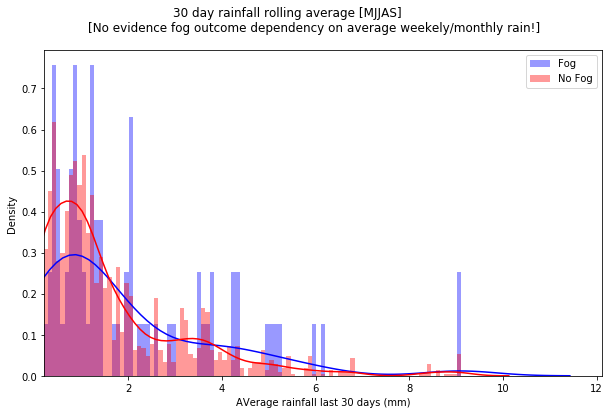

In [91]:
# fg_aut['avg_mthly_rain'] = fg_aut.loc[:,'rain24hr'].rolling(window=30).mean() # 30 day rolling mean`

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))].dropna(subset=['avg_mthly_rain'])
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'avg_mthly_rain'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'avg_mthly_rain'].values, kde=True, color='red', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle('30 day rainfall rolling average [MJJAS]              \n[No evidence fog outcome dependency on average weekely/monthly rain!]')
ax.set_xlabel('AVerage rainfall last 30 days (mm)')
ax.set_ylabel('Density')
ax.set_xlim(0.2,)

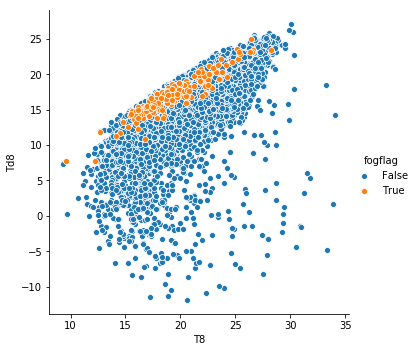

In [92]:
bad_fg_days.columns

sns.pairplot(x_vars=['T8'], y_vars=['Td8'], 
             data=fg_aut,  hue="fogflag", height=5)


In [93]:
fg_aut['T17'].corr(fg_aut['Td17'], method='spearman') #pearson') 90-92%
fg_aut['Td17'].corr(fg_aut['QNH17'], method='spearman') #pearson')


-0.5138121415780554

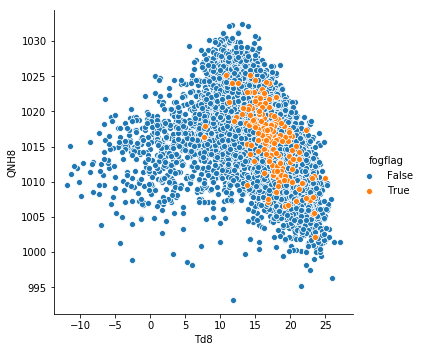

In [94]:
sns.pairplot(x_vars=['Td8'], y_vars=['QNH8'], 
             data=fg_aut,  hue="fogflag", height=5)

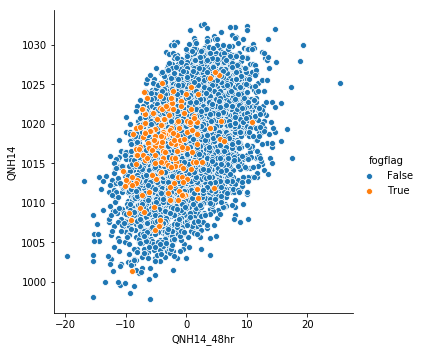

In [95]:
'''Higher Td > 10 associated with fog events
No sig relatiosnhip with QNH
However majority of fog cases in YBBN ssociated with falling
QNH trend ove 48 hours - most Brissy fog events with approaching 
westerly trough/frontal systems'''
sns.pairplot(x_vars=['QNH14_48hr'], y_vars=['QNH14'], 
             data=fg_aut,  hue="fogflag", height=5)

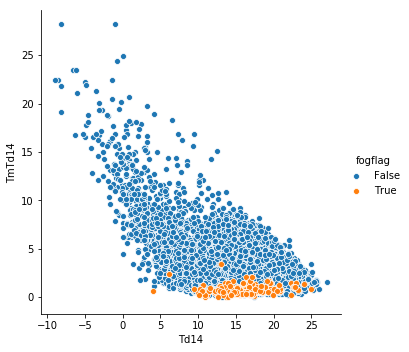

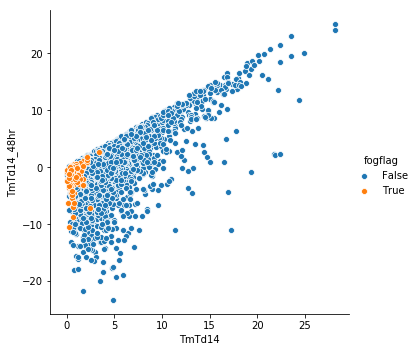

In [96]:
sns.pairplot(x_vars=['Td14'], y_vars=['TmTd14'], 
             data=fg_aut,  hue="fogflag", height=5)
sns.pairplot(x_vars=['TmTd14'], y_vars=['TmTd14_48hr'], 
             data=fg_aut,  hue="fogflag", height=5)

In [97]:
# We get fog data from Robs and align my start date with his
rob_dates = bous.get_fog_data_robs_FCT(station=station,get_dates_only="Yep")
print(f'Only {rob_dates.shape[0]} fog days for Brisbane in Robs data!')
print(f'From start_date:{rob_dates[0]} to end_date:{rob_dates[-1]}')


Getting fog data for YBBN derived using ROBS FCT
Only 46 fog days for Brisbane in Robs data!
From start_date:2008-05-16 to end_date:2018-09-08


In [98]:
#df = bous.process_climate_zone_csv_2020('app/data/HM01X_Data_040842.txt')
#ff = bous.process_climate_zone_csv_2020('YBBN')
#ff.tail()

In [99]:
'''Now grab climate zone data file for station '''
#from utility_functions_sep2018 import process_climate_zone_csv_2020
#from utility_functions_sep2018 import get_sounding_data
#from utility_functions_sep2018 import get_climatological_fog_probability

import pickle
import os
station=station
df  = pickle.load(
                open(
                os.path.join('app','data', station+'_aws.pkl'), 'rb'))

'''
# If/When data file is updated
df = bous.process_climate_zone_csv_2020('app/data/HM01X_Data_040842.txt')

# filter 1800Z - actually 3am/1700z data so between_time('16:50','17:10')
'''
print(f'Number of days in dataset: {pd.date_range(start=df.index[0],end=df.index[-1],freq="D").shape[0]},From start_date={df.index[0]} to end_date={df.index[-1]}')


Number of days in dataset: 7394,From start_date=2000-01-01 00:00:00 to end_date=2020-03-29 18:00:00


In [100]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 363438 entries, 2000-01-01 00:00:00 to 2020-03-29 18:00:00
Data columns (total 40 columns):
AvID            363438 non-null object
M_type          363438 non-null object
pptn10min       363091 non-null float64
pptnSince9      360323 non-null float64
T               363374 non-null float64
Td              363362 non-null float64
RH              363362 non-null float64
WS              363405 non-null float64
WDir            363392 non-null float64
MaxGust10min    360925 non-null float64
CL1_amnt        258605 non-null float64
CL1_ht          258545 non-null float64
CL2_amnt        147406 non-null float64
CL2_ht          147405 non-null float64
CL3_amnt        55139 non-null float64
CL3_ht          55139 non-null float64
Ceil1_amnt      363438 non-null object
Ceil1_ht        158253 non-null float64
Ceil2_amnt      363438 non-null object
Ceil2_ht        86838 non-null float64
Ceil3_amnt      363438 non-null object
Ceil3_ht        49272 n

In [101]:
# not good - have 100ft cloud in results - we want > 1000ft
df.query(('Ceil1_ht > 1000' and 'Ceil1_amnt.str.contains("SCT|BKN|OVC")') or \
         ('Ceil2_ht > 1000' and 'Ceil2_amnt.str.contains("SCT|BKN|OVC")') or  \
         ('Ceil3_ht > 1000' and 'Ceil3_amnt.str.contains("SCT|BKN|OVC")'))[['Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']].head()

,Ceil1_ht,Ceil1_amnt,Ceil2_ht,Ceil2_amnt,Ceil3_ht,Ceil3_amnt
date,,,,,,
2000-07-24 16:30:00,100.0,BKN,NaN,,NaN,
2000-07-24 17:00:00,400.0,BKN,NaN,,NaN,
2000-07-24 17:52:00,100.0,SCT,NaN,,NaN,
2000-07-24 18:30:00,100.0,SCT,NaN,,NaN,
2000-07-25 19:00:00,3500.0,SCT,NaN,,NaN,


In [102]:
# not good - still have 100ft cloud in results - we want > 1000ft
df.query('Ceil1_ht > 1000' and 'Ceil1_amnt.str.contains("SCT|BKN|OVC")')         [['Ceil1_ht','Ceil1_amnt']].head()


,Ceil1_ht,Ceil1_amnt
date,,
2000-07-24 16:30:00,100.0,BKN
2000-07-24 17:00:00,400.0,BKN
2000-07-24 17:52:00,100.0,SCT
2000-07-24 18:30:00,100.0,SCT
2000-07-25 19:00:00,3500.0,SCT


In [103]:
# chaining queries work
df.query('Ceil1_ht > 500').query('Ceil1_amnt.str.contains("SCT|BKN|OVC")')[['Ceil1_ht','Ceil1_amnt']].head()

,Ceil1_ht,Ceil1_amnt
date,,
2000-07-25 19:00:00,3500.0,SCT
2000-07-26 01:30:00,5000.0,SCT
2000-07-26 02:00:00,5200.0,OVC
2000-07-26 02:30:00,6100.0,SCT
2000-07-26 03:00:00,5500.0,SCT


In [104]:
cldy_days =   set(
    np.unique((df.query('Ceil1_ht > 500').query('Ceil1_amnt.str.contains("BKN|OVC")')).index.date))\
.union(
  set(
    np.unique((df.query('Ceil2_ht > 500').query('Ceil2_amnt.str.contains("BKN|OVC")')).index.date)))\
.union(
    set(
    np.unique((df.query('Ceil3_ht > 500').query('Ceil3_amnt.str.contains("BKN|OVC")')).index.date)))

print(len(sorted(cldy_days, reverse=True)))
# sorted(cldy_days, reverse=True)

5799


In [105]:
# no ned for np.unique - sets only have unique values anyway
cldy_days =   set(
    (df.query('Ceil1_ht > 500').query('Ceil1_amnt.str.contains("BKN|OVC")')).index.date)\
.union(
  set(
    (df.query('Ceil2_ht > 500').query('Ceil2_amnt.str.contains("BKN|OVC")')).index.date))\
.union(
    set(
    (df.query('Ceil3_ht > 500').query('Ceil3_amnt.str.contains("BKN|OVC")')).index.date))

len(sorted(cldy_days, reverse=True))

5799

In [106]:
# does it really matter if cld if FEW or SCT or BKN or OVC 
# just the fact there is cloud above 500ft is sufficient!
cldy_days =   set(
    (df.query('Ceil1_ht > 500')).index.date)\
.union(
  set(
    (df.query('Ceil2_ht > 500')).index.date))\
.union(
    set(
    (df.query('Ceil3_ht > 500')).index.date))

len(sorted(cldy_days, reverse=True))

6282

In [107]:
# thats too many cloudy days!!!!!!!!! 6282???
len(np.unique(df.index.date))


7392

In [108]:
# extract data for 12am, 3am, 5am
'''
7394 days
between_time('16:50','17:10') - 7445 rows - too many (resample('D') fix!)
between_time('16:55','17:05') - 7381 about 15 less days
between_time('16:59','17:01') - 7358 about 44 fewer days
'''
dat11 = df[['WDir','WS','T','Td','RH','pptnSince9','vis','vis_aws','PW','QNH',
   'Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']]\
.between_time('10:50','11:10').resample('D').first().loc[df.index[0]:df.index[-1]]
dat14 = df[['WDir','WS','T','Td','RH','pptnSince9','vis','vis_aws','PW','QNH',
   'Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']]\
.between_time('13:50','14:10').resample('D').first().loc[df.index[0]:df.index[-1]]
dat17 = df[['WDir','WS','T','Td','RH','pptnSince9','vis','vis_aws','PW','QNH',
   'Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']]\
.between_time('16:50','17:10').resample('D').first().loc[df.index[0]:df.index[-1]]
dat23 = df[['WDir','WS','T','Td','RH','pptnSince9','vis','vis_aws','PW','QNH',
   'Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']]\
.between_time('22:50','23:10').resample('D').first().loc[df.index[0]:df.index[-1]]



In [109]:
fg_aut.index

DatetimeIndex(['2000-02-09', '2000-02-10', '2000-02-11', '2000-02-12',
               '2000-02-13', '2000-02-16', '2000-02-17', '2000-02-18',
               '2000-02-19', '2000-02-20',
               ...
               '2020-03-18', '2020-03-19', '2020-03-21', '2020-03-22',
               '2020-03-23', '2020-03-24', '2020-03-25', '2020-03-26',
               '2020-03-27', '2020-03-28'],
              dtype='datetime64[ns]', length=6993, freq=None)

In [110]:
# print(dat14.query('Ceil3_ht > 1000').query('Ceil3_amnt.str.contains("BKN|OVC")').shape)

cldy_days =   set(
    (dat11.query('Ceil1_ht > 1000')).index.date)\
.union(
  set(
    (dat11.query('Ceil2_ht > 1000')).index.date))\
.union(
    set(
    (dat11.query('Ceil3_ht > 1000')).index.date))

print(fg_aut.shape[0],len(cldy_days))
# very handy isin() to flag days with cloud cover
print (dat11.index.isin(cldy_days))

dat11['cldy'] = dat11.index.isin(cldy_days)

cldy_days =   set(
    (dat14.query('Ceil1_ht > 1000')).index.date)\
.union(
  set(
    (dat14.query('Ceil2_ht > 1000')).index.date))\
.union(
    set(
    (dat14.query('Ceil3_ht > 1000')).index.date))

print(fg_aut.shape[0],len(cldy_days))
dat14['cldy'] = dat14.index.isin(cldy_days)

cldy_days =   set(
    (dat17.query('Ceil1_ht > 1000')).index.date)\
.union(
  set(
    (dat17.query('Ceil2_ht > 1000')).index.date))\
.union(
    set(
    (dat17.query('Ceil3_ht > 1000')).index.date))

print(fg_aut.shape[0],len(cldy_days))
dat17['cldy'] = dat17.index.isin(cldy_days)

6993 3284
[False False False ...  True False  True]
6993 3393
6993 3219


In [111]:
'''About 3200 cloud days out of 7392 days is just under half - plausible!! although still seems many

Check below confirms that days clasified cloudy has some SCT or BKN cld cove above 1000ft '''

dat14[['cldy','Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']].loc[dat14['cldy']]

#Would need pd.get_dummies() to use this flag variable for model training

,cldy,Ceil1_ht,Ceil1_amnt,Ceil2_ht,Ceil2_amnt,Ceil3_ht,Ceil3_amnt
date,,,,,,,
2000-01-09,True,6100.0,SCT,8300.0,SCT,12000.0,OVC
2000-01-12,True,9000.0,SCT,NaN,,NaN,
2000-02-08,True,3600.0,SCT,7600.0,SCT,10000.0,OVC
2000-02-11,True,6100.0,OVC,NaN,,NaN,
2000-02-12,True,3400.0,SCT,4300.0,SCT,NaN,
2000-03-08,True,8200.0,SCT,NaN,,NaN,
2000-03-10,True,3100.0,SCT,NaN,,NaN,
2000-03-12,True,3500.0,SCT,4300.0,SCT,5700.0,BKN
2000-04-08,True,11000.0,SCT,NaN,,NaN,


In [112]:
# get fog dates for YBBN and add flag in 1700Z aws data file
# fg_dates = bous.get_fog_data_vins(station = 'YBBN',get_dates_only='Yes')
# fg_dates.shape,fg_dates[0],fg_dates[-1]
# add fog flag column in 1800Z aws data
'''
dat17['any_fg'] = dat17.index.isin(fg_aut.index)
dat17['any_fg'].value_counts()  # True 7034 False 360 !!!!???
'''
# Very very silly idea - need pd.merge() !!

dat14 = pd.merge(left=dat14,right=fg_aut[['fogflag']],
                 left_index=True, right_index=True, how='left')
dat17 = pd.merge(left=dat17,right=fg_aut[['fogflag']],
                 left_index=True, right_index=True, how='left')
dat23 = pd.merge(left=dat23,right=fg_aut[['fogflag']],
                 left_index=True, right_index=True, how='left')
dat17['fogflag'].value_counts()

False    6827
True      166
Name: fogflag, dtype: int64

In [113]:
#fig, ax = plt.subplots(1, 1, figsize=(10,5))
#sns.catplot(x="cldy", y="Ceil1_ht", hue="fogflag", kind="swarm", data=dat14,ax=ax)
#ax.set_title("Dew Point Temperature 3am (fog days Vs Non fog days)")
#ax.set_xlabel('Months', color='g', fontsize=15)
#xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
#ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
#ax.legend(loc='lower left')
#sns.despine(offset=5, trim=True)  # x-axis tick labels won't rotate with this line

In [114]:
imp.reload(bous)

<module 'utility_functions_sep2018' from '/home/accounts/qdisplay/avguide/utility_functions_sep2018.py'>

In [115]:
# Now merge with sonde 900hpa data - to get 23Z sonde pass time='23'
sonde = bous.get_sounding_data(station='YBBN',time='17')
print(f'Sonde data shape {sonde.shape} - from {sonde.index[0]} to {sonde.index[-1]}')

# only keep sonde data for period we have fog dates/data
sonde = sonde.loc[fg_aut.index[0]:fg_aut.index[-1]]
print(f'Sonde data new size/shape {sonde.shape}')

'''To trully be able to capture seasonal variations
    we have to convert calendar day to a categorical variable.
    We can bin months like this '''
    # DJF 'summer',MAM  'autumn', JJA 'winter', SON 'spring'
seasons = {'summer': [12, 1, 2], 'autumn': [3, 4, 5],
               'winter': [6, 7, 8], 'spring': [9, 10, 11]}

sonde['season'] = ''
for k, v in enumerate(seasons):
    # print (v,seasons[v])
    # print(obs.index.month.isin(seasons[v]))
    sonde.loc[sonde.index.month.isin(seasons[v]), 'season'] = v

# get some lapse rates to see association between stability and fog freq
# note sfc_T is actually is lowest level temp data 
# may not be really at surface but okay for most cases

sonde['lr_sfc_850']=sonde['sfc_T'] - sonde['T850']
sonde['lr_850_500']=sonde['T850'] - sonde['T500']
#sonde['mid_rh']=    sonde['T700'] - sonde['Td700']
sonde['mid_rh']=  (
    (sonde['T850'] - sonde['Td850'])+\
    (sonde['T700'] - sonde['Td700'])+\
    (sonde['T500'] - sonde['Td500']))/3
print(sonde.shape)
print(sonde['lr_850_500'].isnull().sum())
print(sonde['lr_sfc_850'].isnull().sum())

# get fogflag into sonde data
sonde = pd.merge(left=sonde,right=fg_aut[['fogflag']],                   left_index=True, right_index=True, how='left')
sonde17 = sonde
print(sonde17.columns)
sonde17.tail(2)


Sonde data shape (7309, 25) - from 2000-06-05 00:00:00 to 2020-06-08 00:00:00
Sonde data new size/shape (7237, 25)
(7237, 29)
5249
5239
Index(['sfc_P', 'sfc_T', 'sfc_Td', 'sfc_wdir', 'sfc_wspd', 'P910', 'T910',
       'Td910', '900_wdir', '900_WS', 'P850', 'T850', 'Td850', '850_wdir',
       '850_WS', 'P700', 'T700', 'Td700', '700_wdir', '700_WS', 'P500', 'T500',
       'Td500', '500_wdir', '500_WS', 'season', 'lr_sfc_850', 'lr_850_500',
       'mid_rh', 'fogflag'],
      dtype='object')


,sfc_P,sfc_T,sfc_Td,sfc_wdir,sfc_wspd,P910,T910,Td910,900_wdir,900_WS,...,P500,T500,Td500,500_wdir,500_WS,season,lr_sfc_850,lr_850_500,mid_rh,fogflag
2020-03-27,1018.0,17.8,15.3,220.0,6.2,910.0,NaN,NaN,120.0,25.8,...,500.0,-12.7,-19.7,245.0,7.2,autumn,4.8,25.7,4.866667,False
2020-03-28,1017.0,19.4,18.7,205.0,7.2,910.0,NaN,NaN,90.0,5.2,...,500.0,-11.1,-34.1,260.0,15.4,autumn,7.4,23.1,9.400000,False


In [116]:
# Now merge with sonde 900hpa data - to get 23Z sonde pass time='23'
sonde = bous.get_sounding_data(station='YBBN',time='23')
print(f'Sonde data shape {sonde.shape} - from {sonde.index[0]} to {sonde.index[-1]}')

# only keep sonde data for period we have fog dates/data
sonde = sonde.loc[fg_aut.index[0]:fg_aut.index[-1]]
print(f'Sonde data new size/shape {sonde.shape}')

'''To trully be able to capture seasonal variations
    we have to convert calendar day to a categorical variable.
    We can bin months like this '''
    # DJF 'summer',MAM  'autumn', JJA 'winter', SON 'spring'
seasons = {'summer': [12, 1, 2], 'autumn': [3, 4, 5],
               'winter': [6, 7, 8], 'spring': [9, 10, 11]}

sonde['season'] = ''
for k, v in enumerate(seasons):
    # print (v,seasons[v])
    # print(obs.index.month.isin(seasons[v]))
    sonde.loc[sonde.index.month.isin(seasons[v]), 'season'] = v

# get some lapse rates to see association between stability and fog freq
# note sfc_T is actually is lowest level temp data 
# may not be really at surface but okay for most cases

sonde['lr_sfc_850']=sonde['sfc_T'] - sonde['T850']
sonde['lr_850_500']=sonde['T850'] - sonde['T500']
#sonde['mid_rh']=    sonde['T700'] - sonde['Td700']
sonde['mid_rh']=  (
    (sonde['T850'] - sonde['Td850'])+\
    (sonde['T700'] - sonde['Td700'])+\
    (sonde['T500'] - sonde['Td500']))/3
print(sonde.shape)
print(sonde['lr_850_500'].isnull().sum())
print(sonde['lr_sfc_850'].isnull().sum())

# get fogflag into sonde data
sonde = pd.merge(left=sonde,right=fg_aut[['fogflag']],                   left_index=True, right_index=True, how='left')
sonde23 = sonde
print(sonde23.columns)
sonde23.tail(2)

Sonde data shape (7429, 25) - from 2000-02-05 00:00:00 to 2020-06-07 00:00:00
Sonde data new size/shape (7354, 25)
(7354, 29)
502
482
Index(['sfc_P', 'sfc_T', 'sfc_Td', 'sfc_wdir', 'sfc_wspd', 'P910', 'T910',
       'Td910', '900_wdir', '900_WS', 'P850', 'T850', 'Td850', '850_wdir',
       '850_WS', 'P700', 'T700', 'Td700', '700_wdir', '700_WS', 'P500', 'T500',
       'Td500', '500_wdir', '500_WS', 'season', 'lr_sfc_850', 'lr_850_500',
       'mid_rh', 'fogflag'],
      dtype='object')


,sfc_P,sfc_T,sfc_Td,sfc_wdir,sfc_wspd,P910,T910,Td910,900_wdir,900_WS,...,P500,T500,Td500,500_wdir,500_WS,season,lr_sfc_850,lr_850_500,mid_rh,fogflag
2020-03-27,1020.0,23.8,16.8,155.0,6.2,910.0,NaN,NaN,95.0,20.6,...,500.0,-12.3,-31.3,335.0,5.2,autumn,11.6,24.5,8.366667,False
2020-03-28,1019.0,23.2,19.2,90.0,7.2,910.0,NaN,NaN,95.0,6.2,...,500.0,-11.5,-43.5,265.0,17.4,autumn,11.2,23.5,12.900000,False


In [117]:
sonde17.shape, sonde23.shape

((7237, 30), (7354, 30))

In [118]:
# merge right (for now) - note this will trim aws data outside first/last fog dates
# but ensures validity/integrity fog flag - also carries fog flag from dat to sonde
# also we bring surface conditions winds, temps etc from aws data not from sonde
aws_sonde17 = pd.merge(
    left=dat17, 
    right=sonde17[['900_wdir', '900_WS','850_wdir', '850_WS',\
                 'season', 'lr_850_500','lr_sfc_850','mid_rh']],
    left_index=True, right_index=True, how='right')

aws_sonde23 = pd.merge(
    left=dat23, 
    right=sonde23[['900_wdir', '900_WS','850_wdir', '850_WS',\
                 'season', 'lr_850_500','lr_sfc_850','mid_rh']],
    left_index=True, right_index=True, how='right')

print(aws_sonde23.shape, aws_sonde23.columns)
aws_sonde23.tail(2)

(7354, 25) Index(['WDir', 'WS', 'T', 'Td', 'RH', 'pptnSince9', 'vis', 'vis_aws', 'PW',
       'QNH', 'Ceil1_ht', 'Ceil1_amnt', 'Ceil2_ht', 'Ceil2_amnt', 'Ceil3_ht',
       'Ceil3_amnt', 'fogflag', '900_wdir', '900_WS', '850_wdir', '850_WS',
       'season', 'lr_850_500', 'lr_sfc_850', 'mid_rh'],
      dtype='object')


,WDir,WS,T,Td,RH,pptnSince9,vis,vis_aws,PW,QNH,...,Ceil3_amnt,fogflag,900_wdir,900_WS,850_wdir,850_WS,season,lr_850_500,lr_sfc_850,mid_rh
2020-03-27,170.0,7.0,23.1,16.2,65.0,0.0,10.0,10.0,NaN,1020.5,...,,False,95.0,20.6,110.0,13.4,autumn,24.5,11.6,8.366667
2020-03-28,130.0,7.0,23.4,18.5,74.0,0.0,10.0,10.0,NaN,1019.7,...,,False,95.0,6.2,80.0,8.2,autumn,23.5,11.2,12.900000


In [119]:
aws14_sonde17 = pd.merge(
    left=dat14, 
    right=sonde17[['900_wdir', '900_WS','850_wdir', '850_WS',\
                 'season', 'lr_850_500','lr_sfc_850','mid_rh']],
    left_index=True, right_index=True, how='right')


aws14_sonde23 = pd.merge(
    left=dat14, 
    right=sonde23[['900_wdir', '900_WS','850_wdir', '850_WS',\
                 'season', 'lr_850_500','lr_sfc_850','mid_rh']],
    left_index=True, right_index=True, how='right')


aws17_sonde23 = pd.merge(
    left=dat17, 
    right=sonde23[['900_wdir', '900_WS','850_wdir', '850_WS',\
                 'season', 'lr_850_500','lr_sfc_850','mid_rh']],
    left_index=True, right_index=True, how='right')


# ```  To generate aws_sonde_daily using 23Z sonde need to get new sonde data 1st aws_sonde_daily = pd.merge(
#     left=dat_1700, 
#     right=sonde[['900_wdir', '900_WS','850_wdir', '850_WS',\
#                  'season', 'lr_850_500','lr_sfc_850']],
#     left_index=True, right_index=True, how='right')

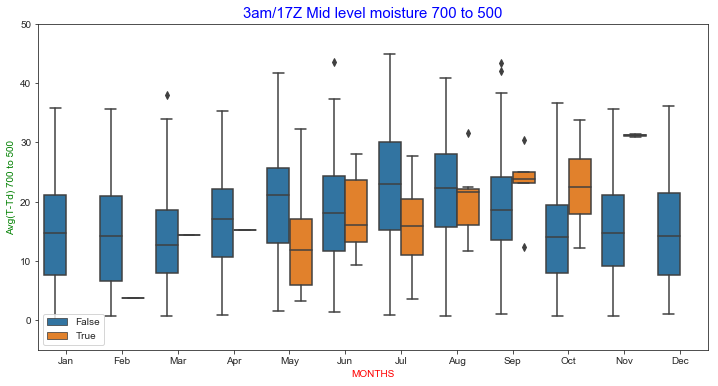

In [120]:
#Just checking for Mid level moisture
import seaborn as sns
sns.set_style('ticks')
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# fig.set_size_inches(11.7,8.27) # the size of A4 paper
sns.boxplot(ax=ax,
              x=aws_sonde17.index.month,
              y='mid_rh',#y='lr_850_500',
              hue='fogflag',
              data=aws_sonde17)

ax.set_title("3am/17Z Mid level moisture 700 to 500", color='b',fontsize=15)
ax.set_ylabel('Avg(T-Td) 700 to 500', color='g', fontsize=10)
ax.set_ylim(-5,50)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.legend(loc='lower left')
ax.tick_params(labelsize=10)

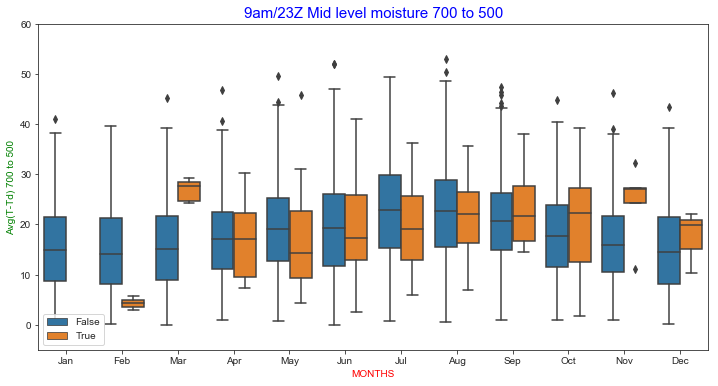

In [121]:
'''Just checking for Mid level moisture'''
import seaborn as sns
sns.set_style('ticks')
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# fig.set_size_inches(11.7,8.27) # the size of A4 paper
sns.boxplot(ax=ax,
              x=aws_sonde23.index.month,
              y='mid_rh',#y='lr_850_500',
              hue='fogflag',
              data=aws_sonde23)

ax.set_title("9am/23Z Mid level moisture 700 to 500", color='b',fontsize=15)
ax.set_ylabel('Avg(T-Td) 700 to 500', color='g', fontsize=10)
ax.set_ylim(-5,60)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.legend(loc='lower left')
ax.tick_params(labelsize=10)

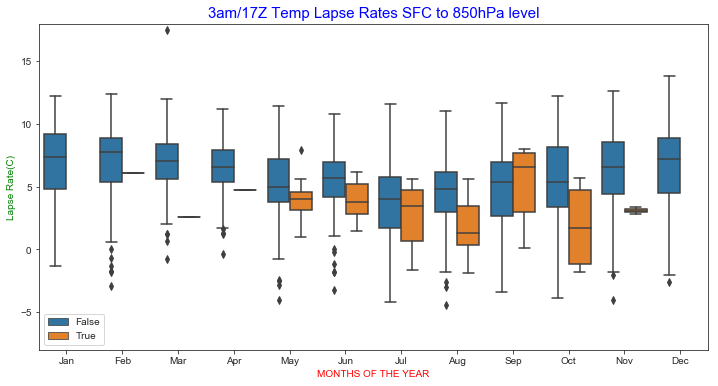

In [122]:
'''Just checking for stable lapse rates sfc to 850 @ 23Z/9am
Looks like GOOD discriminator between fog/no fog from Mar to Aug - possibly til Oct
with stable lapse rates < 10-11 with fog cases 
Little overlap of middle 50% (25th to 75th percentile)  
so looks like 9am sonde (although released around time fog is clearing)
has some predictive capability for fog that formed few hours earlier.
This would make sense esp. in winter when surface mixing starts quite late around 8/9am
'''
import seaborn as sns
sns.set_style('ticks')
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# fig.set_size_inches(11.7,8.27) # the size of A4 paper
sns.boxplot(ax=ax,
              x=aws_sonde17.index.month,
              y='lr_sfc_850',#y='lr_850_500',
              hue='fogflag',
              data=aws_sonde17)

ax.set_ylim(-8,18)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_title("3am/17Z Temp Lapse Rates SFC to 850hPa level", color='b',fontsize=15)
ax.set_ylabel('Lapse Rate(C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS OF THE YEAR', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.legend(loc='lower left')
ax.tick_params(labelsize=10)

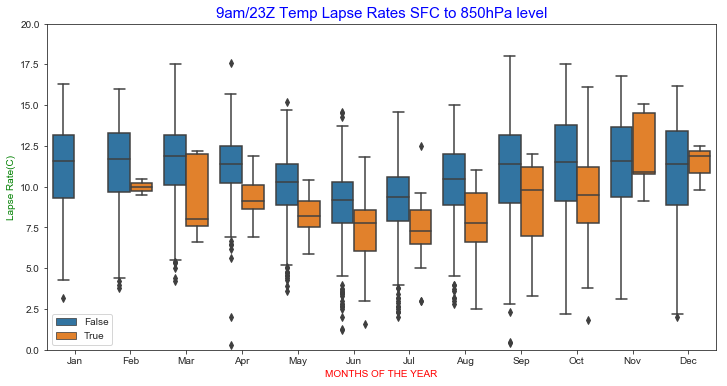

In [123]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(ax=ax,
              x=aws_sonde23.index.month,
              y='lr_sfc_850',#y='lr_850_500',
              hue='fogflag',
              data=aws_sonde23)

ax.set_ylim(0,20)#plt.ylim(0,20) #plt.ylim(10,36)
ax.set_title("9am/23Z Temp Lapse Rates SFC to 850hPa level", color='b',fontsize=15)
ax.set_ylabel('Lapse Rate(C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS OF THE YEAR', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.legend(loc='lower left')
ax.tick_params(labelsize=10)

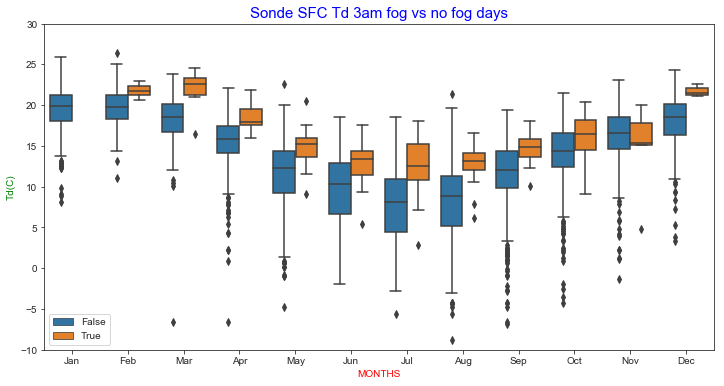

In [124]:
'''Using Td from lowest level of sondeflight - sfc_Td 
23Z sonde flight Td has better discrimination than 17Z sonde and aws 17z Td!! 
'''
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# the size of A4 paper
# fig.set_size_inches(11.7,8.27)
#fig,ax = plt.subplots(figsize=(10,6))
sns.boxplot(ax=ax,
              x=sonde17.index.month,
              y='sfc_Td',
              hue='fogflag',
              data=sonde17)

ax.set_ylim(-10,30)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_title("Sonde SFC Td 3am fog vs no fog days", color='b',fontsize=15)
ax.set_ylabel('Td(C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.legend(loc='lower left')
ax.tick_params(labelsize=10)

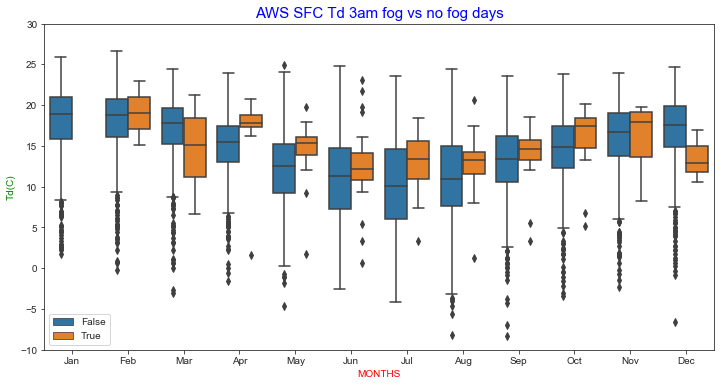

In [125]:
'''Using Td from aws data at 17z/3am Td'''
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# the size of A4 paper
# fig.set_size_inches(11.7,8.27)
#fig,ax = plt.subplots(figsize=(10,6))
sns.boxplot(ax=ax,
              x=aws_sonde17.index.month,
              y='Td',
              hue='fogflag',
              data=aws_sonde17)

ax.set_ylim(-10,30)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_title("AWS SFC Td 3am fog vs no fog days", color='b',fontsize=15)
ax.set_ylabel('Td(C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.legend(loc='lower left')
ax.tick_params(labelsize=10)


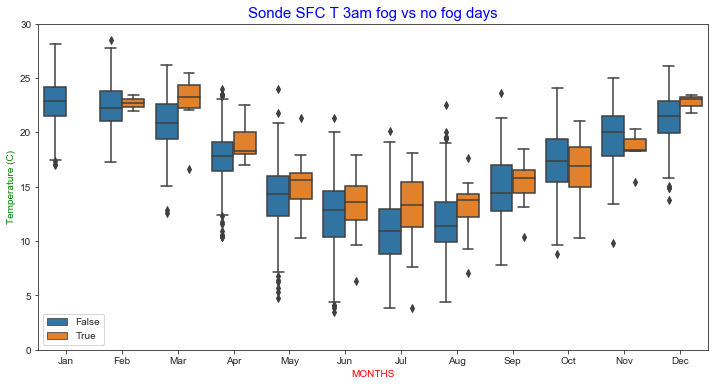

In [126]:

'''Using T from aws data at 17z/3am'''
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# the size of A4 paper
# fig.set_size_inches(11.7,8.27)
#fig,ax = plt.subplots(figsize=(10,6))
sns.boxplot(ax=ax,
              x=sonde17.index.month,
              y='sfc_T',
              hue='fogflag',
              data=sonde17)

ax.set_ylim(0,30)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_title("Sonde SFC T 3am fog vs no fog days", color='b',fontsize=15)
ax.set_ylabel('Temperature (C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.tick_params(labelsize=10)
ax.legend(loc='lower left')

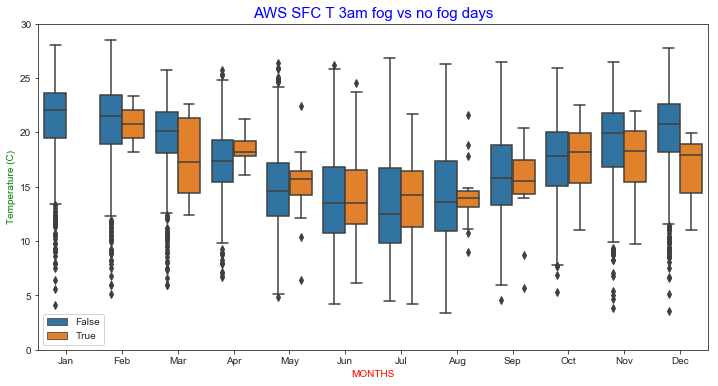

In [127]:

'''Surface T not great discriminator for fog/no fog seperation'''
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# the size of A4 paper
# fig.set_size_inches(11.7,8.27)
#fig,ax = plt.subplots(figsize=(10,6))
sns.boxplot(ax=ax,
              x=aws_sonde17.index.month,
              y='T',
              hue='fogflag',
              data=aws_sonde17)

ax.set_ylim(0,30)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_title("AWS SFC T 3am fog vs no fog days", color='b',fontsize=15)
ax.set_ylabel('Temperature (C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.tick_params(labelsize=10)
ax.legend(loc='lower left')


In [128]:
aws_sonde17['TmTd'] = aws_sonde17['T'] - aws_sonde17['Td']
print(aws_sonde17.shape)
aws = aws_sonde17[pd.notnull(aws_sonde17['TmTd'])]
print(aws.shape)

(7237, 27)
(7179, 27)


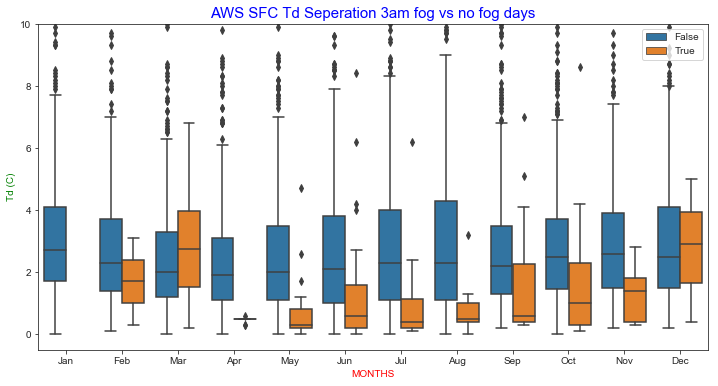

In [129]:

'''Surface Td seperation great discriminator for fog/no fog seperation
TmTd means all below 1 for fog days, fog non-fog days means all above 2
so possible use for seperation
'''
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(ax=ax,
            x=aws.index.month,
            y='TmTd',
            hue='fogflag',
            data=aws)

ax.set_ylim(-0.5,10)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_title("AWS SFC Td Seperation 3am fog vs no fog days", color='b',fontsize=15)
ax.set_ylabel('Td (C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.tick_params(labelsize=10)
ax.legend(loc='upper right')

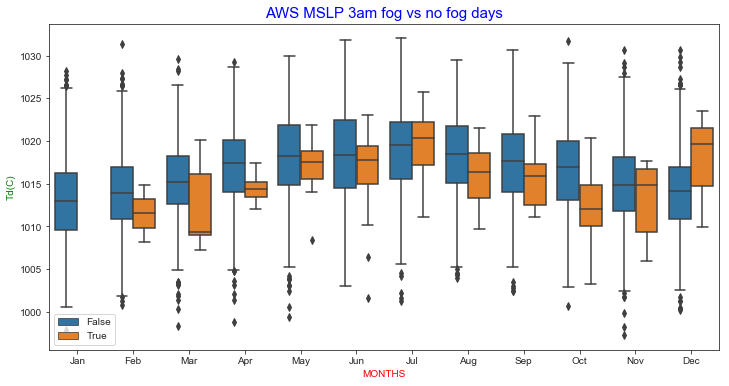

In [130]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# the size of A4 paper
# fig.set_size_inches(11.7,8.27)
#fig,ax = plt.subplots(figsize=(10,6))
ax=sns.boxplot(ax=ax,
            x=aws_sonde17.index.month,
            y='QNH',
            hue='fogflag',
            data=aws_sonde17)

ax.set_title("AWS MSLP 3am fog vs no fog days", color='b',fontsize=15)
ax.set_ylabel('Td(C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.tick_params(labelsize=10)
ax.legend(loc='lower left')

Strongest wind at 3am/1700Z = 10.0, lightest = 0.0


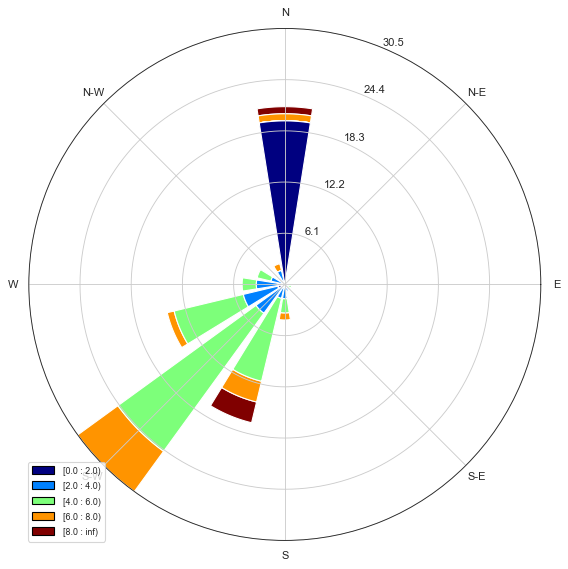

In [131]:
from windrose import WindroseAxes
import matplotlib.cm as cm

#bad_fg_days
#not_in_bad_fg_days

fg_days=fg_aut.loc[fg_aut['fogflag']]; fg_days.shape
fg_free_days=fg_aut.loc[~fg_aut['fogflag']]
# fg_aut.columns
'''
https://windrose.readthedocs.io/en/latest/usage.html
Other possible type of windrose plots
stacked histogram representation, not normed, with bins limits'''
# ax.box(wd, ws, bins=np.arange(0, 10, 2))
'''windrose in filled representation, with a controled colormap'''
# ax.contourf(wd, ws, bins=np.arange(0, 10, 2), cmap=cm.hot)
'''Same as above, but with contours over each filled region'''
# ax.contourf(wd, ws, bins=np.arange(0, 10, 2), cmap=cm.hot)
# ax.contour(wd, ws, bins=np.arange(0, 10, 2), colors='black')
'''without filled regions'''
# ax.contour(wd, ws, bins=np.arange(0, 10, 2), cmap=cm.hot, lw=3)

#wd=not_in_bad_fg_days['wdir17'].values
#ws=not_in_bad_fg_days['wspd17'].values
# BOTH fg_free and no_in_bad_fg give SAME result
#wd=fg_free_days['wdir17'].values
#ws=fg_free_days['wspd17'].values
'''
Fog-less days twice as likely to have S'thly winds - 10% vs <5%
and also      twice as likely to have SSW    winds 31% vs 14% 
So less likely fog with SE to SSW sector winds

The higher freq of nthly winds for fog days could be calm winds
translated to nthly winds
SW winds - more than twice as likely for fog days 31% vs 12%
Fog days have cases with winds with any easterly component
'''

#wd=fg_days['wdir17'].values
#ws=fg_days['wspd17'].values
# BOTH fg_days and bad_fg_days give SIMILAR result
wd=bad_fg_days['wdir17'].values
ws=bad_fg_days['wspd17'].values

print(f'Strongest wind at 3am/1700Z = {ws.max()}, lightest = {ws.min()}')
'''Hardly any fog cases with winds stronger than 10 knots at 17Z'''
np.arange(0, 10, 2)
ax = WindroseAxes.from_ax()
#ax.contour(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot, lw=3)
#ax.set_legend()
'''A stacked histogram with normed (displayed in percent) results'''
ax.bar(wd, ws, bins=np.arange(0, 10, 2), normed=True, nsector=16)
ax.set_legend()


# The computed values used to plot the windrose with the ax._info dictionnary :
# - ax._info['bins'] : list of bins (limits) used for wind speeds. If not set in the call, bins will be set to 6 parts between wind speed min and max.
# 
# - ax._info['dir'] : list of directions “bundaries” used to compute the distribution by wind direction sector. This can be set by the nsector parameter (see below).
# 
# - ax._info['table'] : the resulting table of the computation. It’s a 2D histogram, where each line represents a wind speed class, and each column represents a wind direction class.
# 

In [132]:
'''
wd=bad_fg_days['wdir17'].values
ws=bad_fg_days['wspd17'].values
ax.bar(wd, ws, bins=np.arange(0, 10, 2), normed=True, nsector=16)
'''
table = ax._info['table']
print(table.shape)
'''  5 rows for each speed class
    16 cols for each direction class '''
print(table[2,:])
print(f'Frequency of 2 to 4 kt winds {sum(table[2,:]):.0f}%')  #2-4 knot wind speed class


(5, 16)
[ 0.          0.          0.          0.          0.          0.84745763
  0.          0.          1.69491525 10.16949153 20.33898305  8.47457627
  1.69491525  1.69491525  0.          0.        ]
Frequency of 2 to 4 kt winds 45%


In [133]:

print(ax._info['bins'])
# https://realpython.com/how-to-use-numpy-arange/
np.arange(10,step=2)
for i,n in enumerate(np.arange(10,step=2)):
    print(f'Frequency of {n} to {n+2} kt winds:{table[i,:].sum():.1f}%')

[0, 2, 4, 6, 8, inf]
Frequency of 0 to 2 kt winds:21.2%
Frequency of 2 to 4 kt winds:18.6%
Frequency of 4 to 6 kt winds:44.9%
Frequency of 6 to 8 kt winds:11.9%
Frequency of 8 to 10 kt winds:3.4%


In [134]:

''' ->axis=1 - horizontal row sums i.e ACROSS column axis
20% 0-2, 19% 2-4kt, 44% 4-6kt, 12% 5-8kt, 4% 8-10kt '''
table.sum(axis=1)


array([21.18644068, 18.6440678 , 44.91525424, 11.86440678,  3.38983051])

In [135]:
dirs=('N','NNE','NE','ENE','E','ESE','SE','SSE','S'      ,'SSW','SW','WSW','W','WNW','NW','NNW')
# these are the direction bins
list(zip(dirs,ax._info['dir']))


[('N', 348.75),
 ('NNE', 11.25),
 ('NE', 33.75),
 ('ENE', 56.25),
 ('E', 78.75),
 ('ESE', 101.25),
 ('SE', 123.75),
 ('SSE', 146.25),
 ('S', 168.75),
 ('SSW', 191.25),
 ('SW', 213.75),
 ('WSW', 236.25),
 ('W', 258.75),
 ('WNW', 281.25),
 ('NW', 303.75),
 ('NNW', 326.25)]

In [136]:
'''For FOG days 
SW winds most common - 31% of cases, followed by N (21%) - mostly calm
SSW 17%, WSW 15%'''

table.sum(axis=0) # OR  np.sum(table, axis=0) sum ACROSS rows so column sums
sorted(
       list(zip(dirs,np.around(table.sum(axis=0),decimals=1),ax._info['dir'])), 
       key = lambda x: x[1],
       reverse=True)

# list(zip(dirs,np.around(table.sum(axis=0),decimals=1)))


[('SW', 30.5, 213.75),
 ('N', 21.2, 348.75),
 ('SSW', 16.9, 191.25),
 ('WSW', 14.4, 236.25),
 ('W', 5.1, 258.75),
 ('S', 4.2, 168.75),
 ('WNW', 3.4, 281.25),
 ('NNW', 2.5, 326.25),
 ('ESE', 0.8, 101.25),
 ('SSE', 0.8, 146.25),
 ('NNE', 0.0, 11.25),
 ('NE', 0.0, 33.75),
 ('ENE', 0.0, 56.25),
 ('E', 0.0, 78.75),
 ('SE', 0.0, 123.75),
 ('NW', 0.0, 303.75)]

In [137]:
#dict_dir=dict(zip(np.arange(16), dirs))
#dict_dir


# In[120]:


np.sum(table, axis=0)


array([21.18644068,  0.        ,  0.        ,  0.        ,  0.        ,
        0.84745763,  0.        ,  0.84745763,  4.23728814, 16.94915254,
       30.50847458, 14.40677966,  5.08474576,  3.38983051,  0.        ,
        2.54237288])

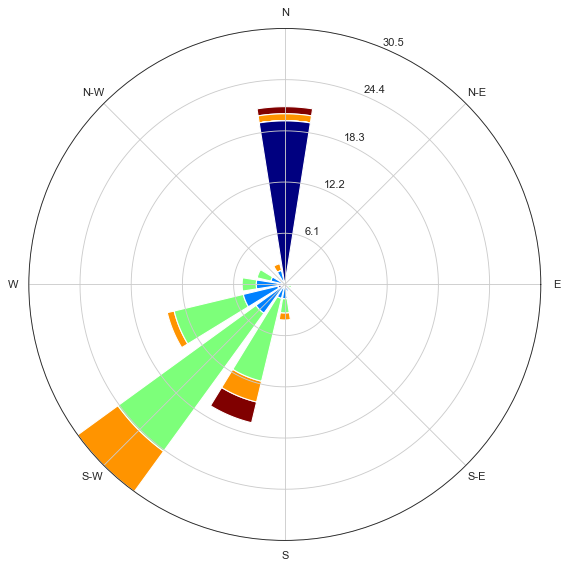

In [138]:

wd=bad_fg_days['wdir17'].values
ws=bad_fg_days['wspd17'].values
ax = WindroseAxes.from_ax()
ax.bar(wd, ws, bins=np.arange(0, 10, 2), normed=True, nsector=16)


In [139]:
wd_freq=np.sum(table, axis=0)
wd_freq

array([21.18644068,  0.        ,  0.        ,  0.        ,  0.        ,
        0.84745763,  0.        ,  0.84745763,  4.23728814, 16.94915254,
       30.50847458, 14.40677966,  5.08474576,  3.38983051,  0.        ,
        2.54237288])

In [140]:

list(zip(ax._info['dir']))

[(348.75,),
 (11.25,),
 (33.75,),
 (56.25,),
 (78.75,),
 (101.25,),
 (123.75,),
 (146.25,),
 (168.75,),
 (191.25,),
 (213.75,),
 (236.25,),
 (258.75,),
 (281.25,),
 (303.75,),
 (326.25,)]

[Text(0.0, 0, 'N'),
 Text(0.7853981633974483, 0, 'NNE'),
 Text(1.5707963267948966, 0, 'NE'),
 Text(2.356194490192345, 0, 'ENE'),
 Text(3.141592653589793, 0, 'E'),
 Text(3.9269908169872414, 0, 'ESE'),
 Text(4.71238898038469, 0, 'SE'),
 Text(5.497787143782138, 0, 'SSE')]

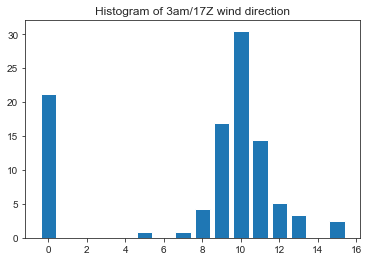

In [141]:
# Frequency bar plot for each direction - vertical column sums i.e ACROSS axis=0
wd=bad_fg_days['wdir17'].values
ws=bad_fg_days['wspd17'].values
wd_freq = np.sum(table, axis=0)
direction = ax._info['dir']
plt.bar(np.arange(16), wd_freq, align='center')
xlabels = ('N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW')
#xticks=np.arange(16)

dict_dir=dict(zip(np.arange(16), dirs))
plt.title('Histogram of 3am/17Z wind direction')

ax.set_xticklabels(xlabels)
xlabels = [dict_dir[x] for x in np.arange(16)]
ax.set_xticklabels(xlabels)

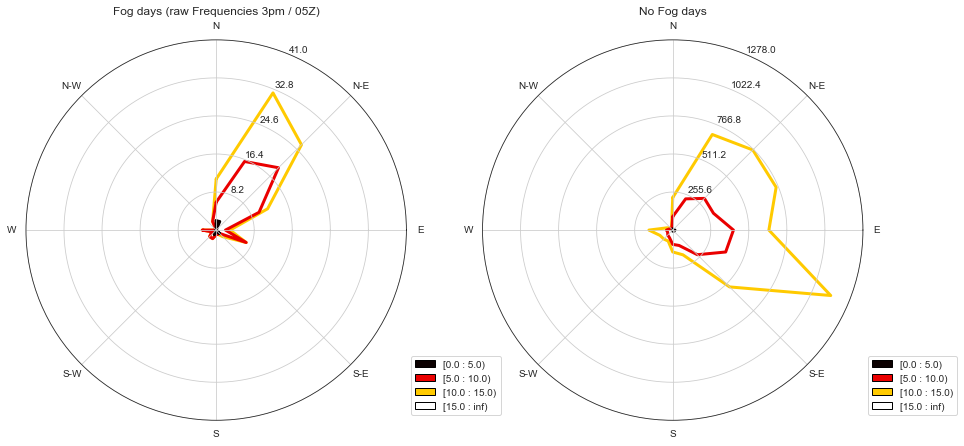

In [173]:
'''
df: Pandas DataFrame with DateTimeIndex as index and at least 2 columns ('speed' and 'direction').
var_name : name of var column name ; default value is VAR_DEFAULT='speed'
direction_name : name of direction column name ; default value is DIR_DEFAULT='direction'
kind : kind of plot (might be either, 'contour', 'contourf', 'bar', 'box', 'pdf')
'''
from windrose import plot_windrose
wdir='wdir5'
wspd='wspd5'
wind_df_fg = bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})
wind_df_nofg = not_in_bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')

plot_windrose(wind_df_fg, kind='contour', 
              normed=False, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Fog days (raw Frequencies 3pm / 05Z)")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)

plot_windrose(wind_df_nofg, kind='contour', 
              normed=False, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()

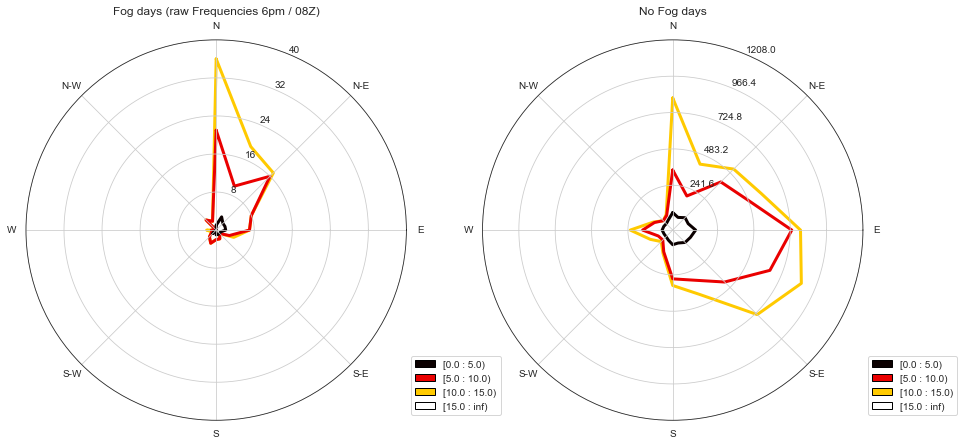

In [174]:
wdir='wdir8'
wspd='wspd8'
wind_df_fg = bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})
wind_df_nofg = not_in_bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')

plot_windrose(wind_df_fg, kind='contour', 
              normed=False, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Fog days (raw Frequencies 6pm / 08Z)")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)

plot_windrose(wind_df_nofg, kind='contour', 
              normed=False, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()

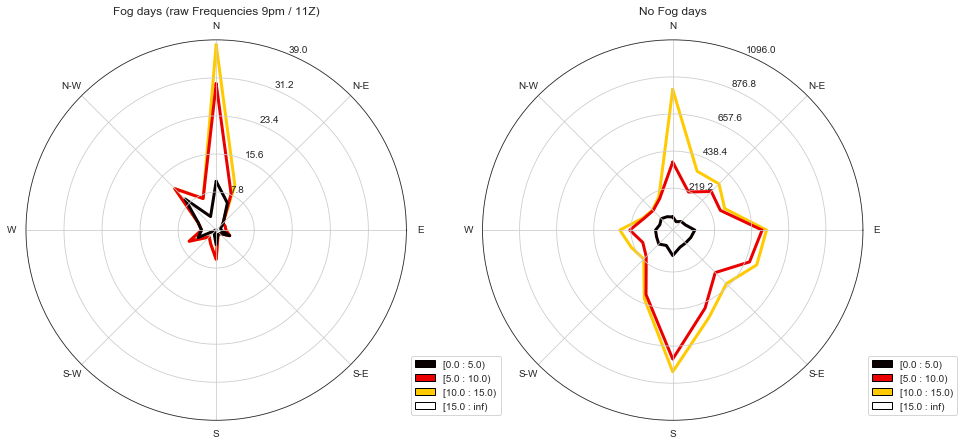

In [175]:
wdir='wdir11'
wspd='wspd11'
wind_df_fg = bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})
wind_df_nofg = not_in_bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')

plot_windrose(wind_df_fg, kind='contour', 
              normed=False, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Fog days (raw Frequencies 9pm / 11Z)")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)

plot_windrose(wind_df_nofg, kind='contour', 
              normed=False, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()

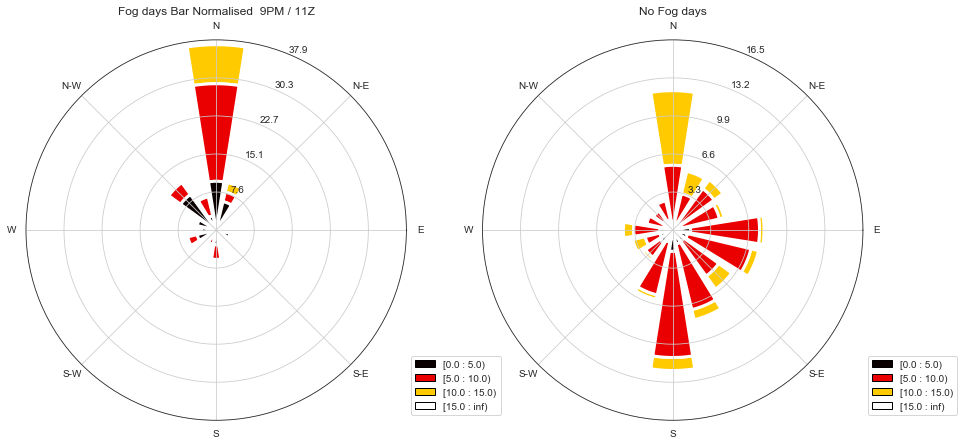

In [176]:
'''
For fog days, 17Z sfc winds are more SW (Avg direction about 225 degrees) than non-fog days when its more SSW (about 202 deg)
Better look at winds earlier in the night or evening cause by 17Z/3am winds by default from SW quarter around this time

Afternoon/evening sfc winds 3pm 6pm 9pm are best for discriminating bet fog and no fog events 

For fog days                            For fog free days
~10/7% cases sfc winds SW'lies 2-4 knots   ~10 cases sfc winds SSW'lies 2-4 knots
~40/28% cases sfc winds SW'lies 4-6 knots   ~450/7% cases sfc winds SSW'lies 4-6 knots
~50/35% cases sfc winds SW'lies 6-8 knots   ~1500/20% cases sfc winds SSW'lies 6-8 knots

Just based on 17Z/3am surface winds - more than 60% of fog cases associated with at least 4 knots winds (so generally advected fog)
'''

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')

plot_windrose(wind_df_fg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Fog days Bar Normalised  9PM / 11Z")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)

plot_windrose(wind_df_nofg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()

In [145]:
snd=bous.get_sounding_data(station='YBBN',time='23')
snd900 = snd.loc[:,['900_wdir','900_WS']].rename(columns={'900_wdir': 'direction', '900_WS': 'speed'})

snd900 = pd.merge(left=snd900,
                  right=fg_aut['fogflag'],
                  how="inner",left_index=True, right_index=True)

snd900 = snd900.dropna(subset=['direction','speed'])

snd900_fg =   snd900.loc[snd900['fogflag']]
snd900_nofg = snd900.loc[~snd900['fogflag']]
snd900.tail()

,direction,speed,fogflag
2020-03-24,90.0,16.4,False
2020-03-25,115.0,8.2,False
2020-03-26,150.0,13.4,False
2020-03-27,95.0,20.6,False
2020-03-28,95.0,6.2,False


In [146]:
snd900.info()
snd900.isnull().sum()
# snd900['direction']=snd900['direction'].astype("Float32").astype("Int32")
# snd900['speed']=snd900['speed'].astype("Int32")
print(snd900[snd900['speed'].isnull()])
snd900['speed'].isnull().any()
#snd900['speed'] = pd.to_numeric(snd900['speed'], errors='coerce')
#snd900['speed'] = snd900.dropna(subset=['speed'])
#snd900['speed'] = snd900['speed'].astype(int)



<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6377 entries, 2000-02-17 to 2020-03-28
Data columns (total 3 columns):
direction    6377 non-null float64
speed        6377 non-null float64
fogflag      6377 non-null bool
dtypes: bool(1), float64(2)
memory usage: 155.7 KB
Empty DataFrame
Columns: [direction, speed, fogflag]
Index: []


False

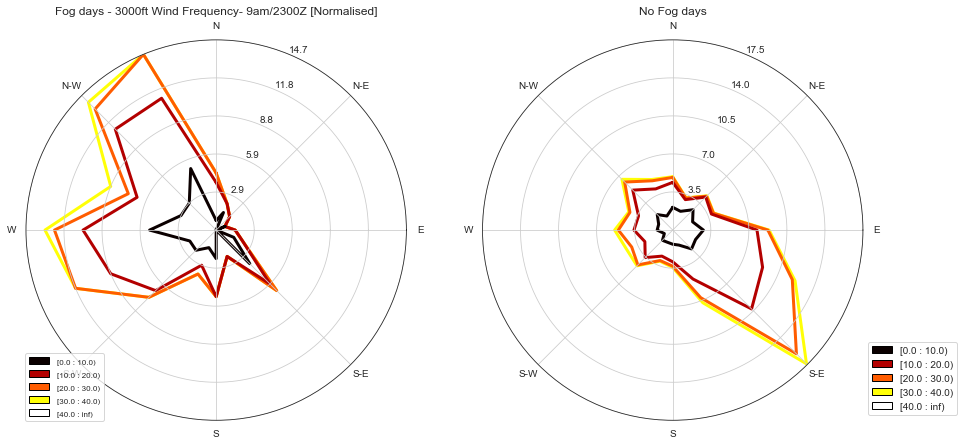

In [147]:
import matplotlib.pyplot as plt
from windrose import plot_windrose
import matplotlib.cm as cm


fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) 
#,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')
plot_windrose(snd900_fg, 
              kind='contour', 
              normed=True, 
              bins=np.arange(0,50,10), 
              cmap=cm.hot, lw=3,ax=ax1)
#ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Fog days - 3000ft Wind Frequency- 9am/2300Z [Normalised]")

#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
plot_windrose(snd900_nofg, 
              kind='contour', 
              normed=True, 
              bins=np.arange(0,50,10), 
              cmap=cm.hot, lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()


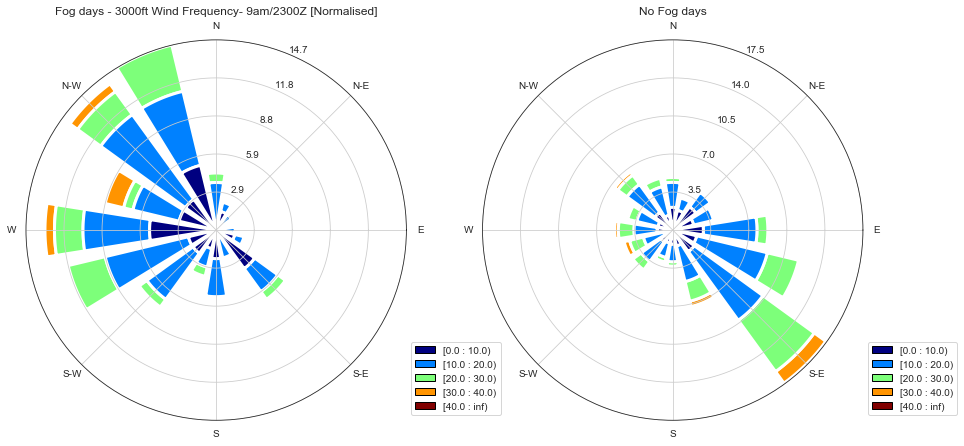

In [148]:
fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) 
#,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')
plot_windrose(snd900_fg, 
              kind='bar', 
              normed=True, 
              bins=np.arange(0,50,10),lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
# cmap=cm.hot does not look good here
ax1.set_title("Fog days - 3000ft Wind Frequency- 9am/2300Z [Normalised]")

#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
plot_windrose(snd900_nofg, 
              kind='bar', 
              normed=True, 
              bins=np.arange(0,50,10),lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()


Index(['direction', 'speed', 'fogflag'], dtype='object') (138, 3)


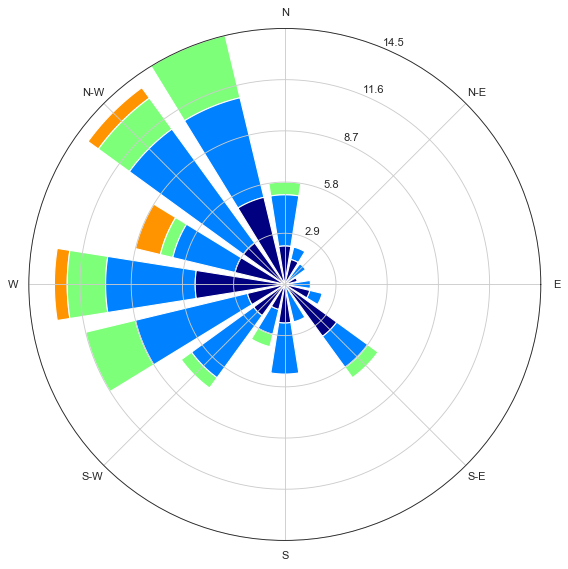

In [149]:

'''
Looks like 3000ft direction can be quite good discriminator fog days vs non-fog Days
Fog days winds predominantly from NW to SW sectors
Non-Fog days winds predominantly from E thru S i.e SE sector
wid speeds not really strong discriminator
'''
from windrose import WindroseAxes
print(snd900_fg.columns,snd900_fg.shape)
wd=snd900_fg['direction'].values
ws=snd900_fg['speed'].values
ax = WindroseAxes.from_ax()
ax.bar(wd, ws, bins=np.arange(0,50,10), normed=True, nsector=16)

/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/ipykernel_launcher.py:4: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  after removing the cwd from sys.path.


(93, 3)


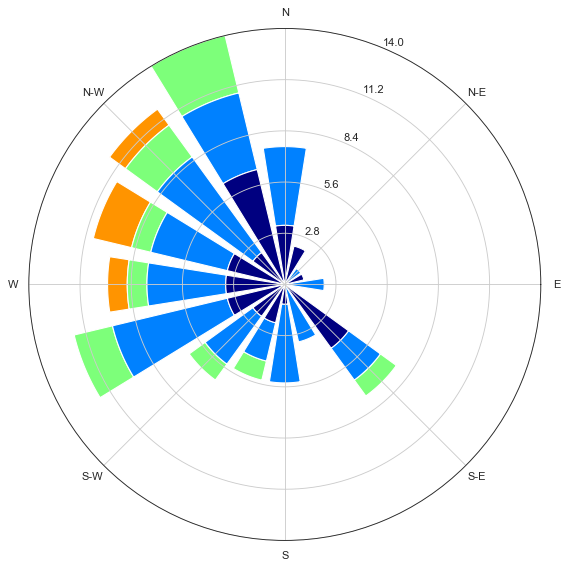

In [150]:
mask1 = (fg_days['min_vis']<=1) & (fg_days['fg_duration']>=1)

#real bad fog days
snd_900_bad_fg_days = snd900.loc[(fg_days.loc[mask1]).index].dropna(subset=['direction'])
print(snd_900_bad_fg_days.shape)
wd=snd_900_bad_fg_days['direction'].values
ws=snd_900_bad_fg_days['speed'].values
ax = WindroseAxes.from_ax()
ax.bar(wd, ws, bins=np.arange(0,50,10), normed=True, nsector=16)


In [151]:
table = ax._info['table']  # 5 rows for each speed bin, 16 cols for direction bin
table.shape
dirs=('N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW')
print(table[0,:].sum(),table[1,:].sum(),table[2,:].sum(),table[3,:].sum(),table[4,:].sum())
# row sums Percentage or ferquency of wind speeds in this bin
'''40% of fog cases had 3000ft winds 0-10 knots
   42% of fog cases had 3000ft winds 10-20 knots
   15% of fog cases had 3000ft winds 20-30 knots, only 3% 30-40, 0% 40+
   > 83% of fog cases wind below 20 knots
   > 97% of fog cases wind below 30 knots
'''
table.sum(axis=1)

34.40860215053763 48.38709677419355 12.903225806451612 4.301075268817204 0.0


array([34.40860215, 48.38709677, 12.90322581,  4.30107527,  0.        ])

In [152]:
table.sum(axis=0) # OR  np.sum(table, axis=0) sum ACROSS rows so column sums
dir_frq=list(zip(dirs,table.sum(axis=0)))
'''
6 most common gradient wind direction for fog days in the NW and SW sectors
NNW,NW,WNW,W,WSW  ~ 60% and including SW,SSW,S 7%,4%,6%  
about 75% or 3/4 of all fog cases
Least likely gradient wind directions (freq <5%) N through E to S
'''
sorted(
       list(zip(dirs,np.around(table.sum(axis=0),decimals=0))), 
       key = lambda x: x[1],
       reverse=True)

[('NNW', 14.0),
 ('WSW', 12.0),
 ('NW', 12.0),
 ('WNW', 11.0),
 ('W', 10.0),
 ('N', 8.0),
 ('SE', 8.0),
 ('SW', 6.0),
 ('S', 5.0),
 ('SSW', 5.0),
 ('SSE', 3.0),
 ('NNE', 2.0),
 ('E', 2.0),
 ('NE', 1.0),
 ('ENE', 1.0),
 ('ESE', 0.0)]

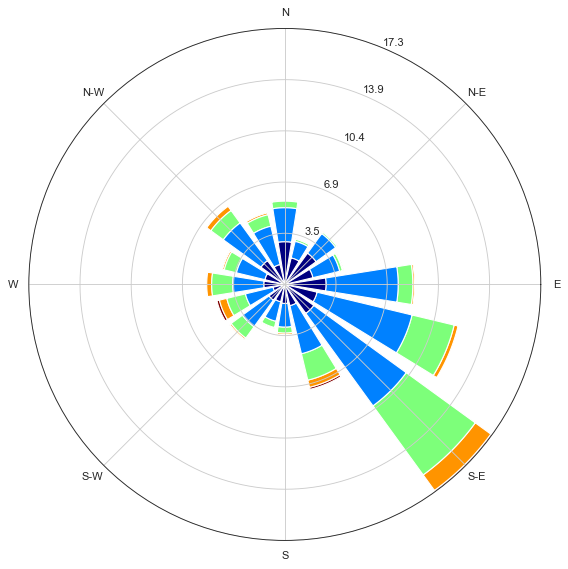

In [153]:
wd=snd900_nofg['direction'].values
ws=snd900_nofg['speed'].values
ax = WindroseAxes.from_ax()
ax.bar(wd, ws, bins=np.arange(0,50,10), normed=True, nsector=16)


In [154]:
table = ax._info['table']  # 5 rows for each speed bin, 16 cols for direction bin
table.shape
dirs=('N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW')
table[0,:].sum(),table[1,:].sum(),table[2,:].sum(),table[3,:].sum(),table[4,:].sum()
# row sums Percentage or ferquency of wind speeds in this bin
table.sum(axis=1)


array([28.99503126, 46.61003366, 19.65058503,  4.08719346,  0.6571566 ])

In [155]:

'''23% of fog cases had 3000ft winds 0-10 knots
   48% of fog cases had 3000ft winds 10-20 knots
   21% of fog cases had 3000ft winds 20-30 knots, only 4% 30-40, <1% 40+
   > 85% of fog cases wind below 20 knots
   > 97% of fog cases wind below 30 knots
'''
table.sum(axis=0)
dir_frq=list(zip(dirs,table.sum(axis=0)))
'''
6 most common gradient wind direction (>10%) for no fog days in the SE,ESE,E sectors
Least likely gradient wind directions (freq <5%) N through E to S
'''
sorted(
       list(zip(dirs,np.around(table.sum(axis=0),decimals=0))), 
       key = lambda x: x[1],
       reverse=True)

[('SE', 17.0),
 ('ESE', 12.0),
 ('E', 9.0),
 ('SSE', 7.0),
 ('NW', 7.0),
 ('N', 6.0),
 ('SW', 5.0),
 ('WSW', 5.0),
 ('W', 5.0),
 ('NNW', 5.0),
 ('NE', 4.0),
 ('ENE', 4.0),
 ('WNW', 4.0),
 ('NNE', 3.0),
 ('S', 3.0),
 ('SSW', 3.0)]

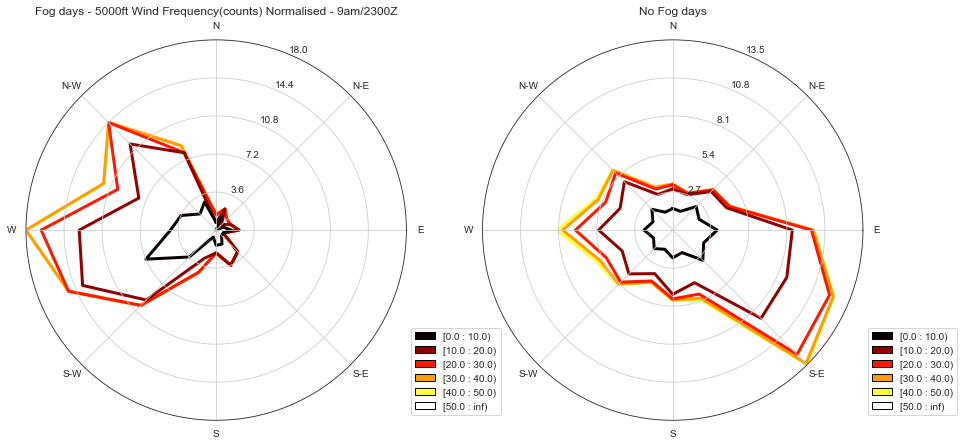

In [156]:
snd850 = snd.loc[:,['850_wdir','850_WS']].rename(columns={'850_wdir': 'direction', '850_WS': 'speed'})

snd850 = pd.merge(left=snd850,right=fg_aut['fogflag'],
                  how="inner",left_index=True, right_index=True)

snd850_fg =   snd850.loc[snd850['fogflag']]
snd850_nofg = snd850.loc[~snd850['fogflag']]

snd850_fg['speed'].max(),snd850_nofg['speed'].max()

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')
plot_windrose(snd850_fg, kind='contour', 
              normed=True, bins=np.arange(0,60,10), 
              cmap=cm.hot, lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Fog days - 5000ft Wind Frequency(counts) Normalised - 9am/2300Z")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
plot_windrose(snd850_nofg, kind='contour', 
              normed=True, bins=np.arange(0,60,10), 
              cmap=cm.hot, lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()

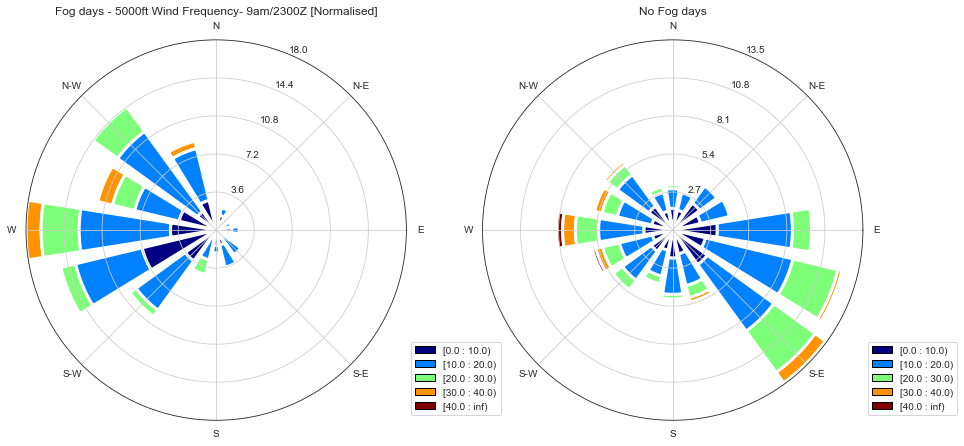

In [157]:
fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) 
#,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')
plot_windrose(snd850_fg, 
              kind='bar', 
              normed=True, 
              bins=np.arange(0,50,10),lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
# cmap=cm.hot does not look good here
ax1.set_title("Fog days - 5000ft Wind Frequency- 9am/2300Z [Normalised]")

#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
plot_windrose(snd850_nofg, 
              kind='bar', 
              normed=True, 
              bins=np.arange(0,50,10),lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()

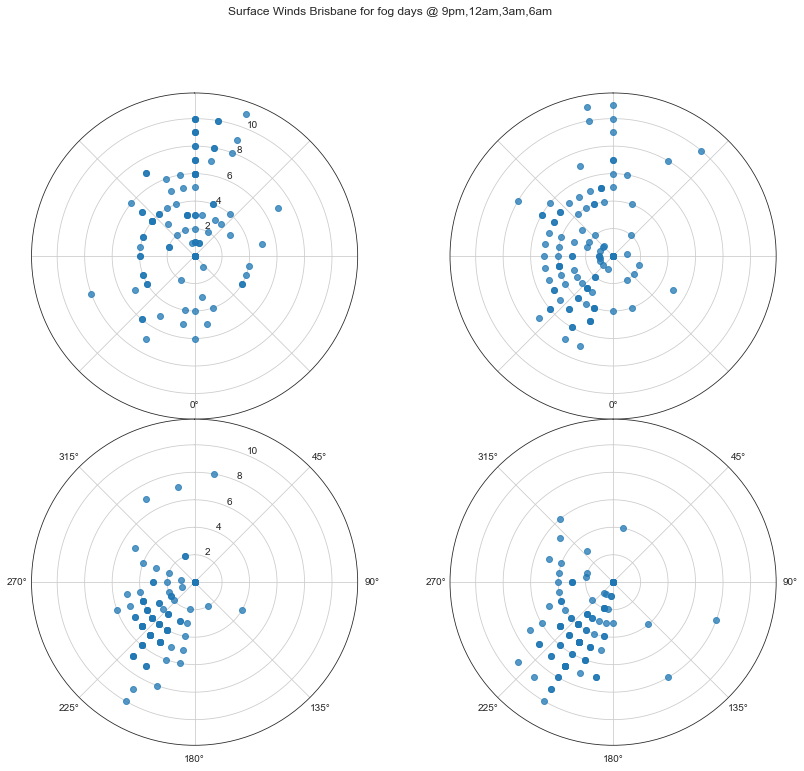

In [158]:
'''
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11Z,14Z,17Z,20Z as 2by2 grid subplots 2 rows, 2 cols
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
'''

fig, axs = plt.subplots(
    nrows=2,ncols=2,
    figsize=(15,12), 
    subplot_kw=dict(projection='polar'),
    sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0})

(ax1, ax2), (ax3, ax4) = axs

fig.suptitle('Surface Winds Brisbane for fog days @ 9pm,12am,3am,6am')
ax1.scatter(x=np.deg2rad(bad_fg_days['wdir11'].values), 
            y=bad_fg_days['wspd11'].values, cmap='hsv', alpha=0.75)
ax2.scatter(x=np.deg2rad(bad_fg_days['wdir14'].values), 
            y=bad_fg_days['wspd14'].values, cmap='hsv', alpha=0.75)
ax3.scatter(x=np.deg2rad(bad_fg_days['wdir17'].values), 
            y=bad_fg_days['wspd17'].values, cmap='hsv', alpha=0.75)
ax4.scatter(x=np.deg2rad(bad_fg_days['wdir20'].values), 
            y=bad_fg_days['wspd20'].values, cmap='hsv', alpha=0.75)

for ax in axs.flat:
    ax.label_outer()
    #ax.set_title('11Z') #'Text' object is not callable
    ax.set_theta_zero_location('N', offset=0)
    ax.set_theta_direction('clockwise')


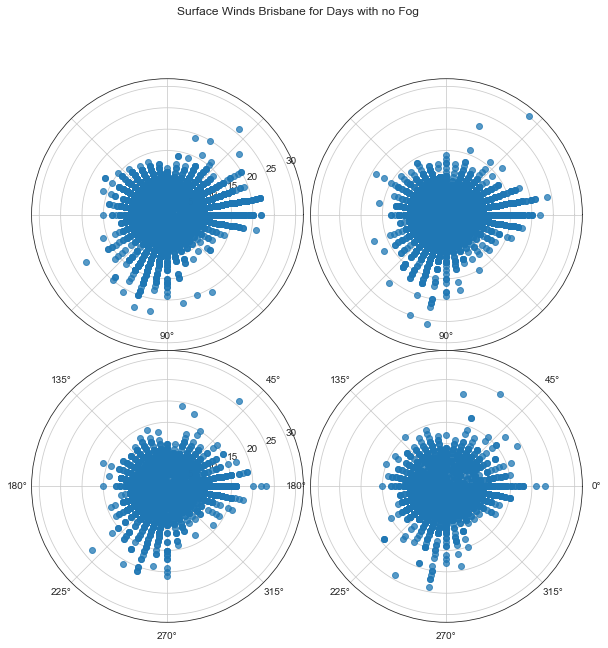

In [159]:
'''
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11Z,14Z,17Z,20Z as 2by2 grid subplots 2 rows, 2 cols Fog Free days
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
'''

fig, axs = plt.subplots(
    nrows=2,ncols=2,
    figsize=(10,10), 
    subplot_kw=dict(projection='polar'),
    sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0})

(ax1, ax2), (ax3, ax4) = axs

fig.suptitle('Surface Winds Brisbane for Days with no Fog')
ax1.scatter(x=np.deg2rad(fg_free_days['wdir11'].values), 
            y=fg_free_days['wspd11'].values, cmap='hsv', alpha=0.75)
ax2.scatter(x=np.deg2rad(fg_free_days['wdir14'].values), 
            y=fg_free_days['wspd14'].values, cmap='hsv', alpha=0.75)
ax3.scatter(x=np.deg2rad(fg_free_days['wdir17'].values), 
            y=fg_free_days['wspd17'].values, cmap='hsv', alpha=0.75)
ax4.scatter(x=np.deg2rad(fg_free_days['wdir20'].values), 
            y=fg_free_days['wspd20'].values, cmap='hsv', alpha=0.75)

for ax in axs.flat:
    ax.label_outer()
    #ax.set_title('11Z') #'Text' object is not callable
    ax.set_theta_zero_location


In [160]:
'''
Make some rules around Td, Td trends, TmTd, gradient wind dir and predict for outcome
'''

'\nMake some rules around Td, Td trends, TmTd, gradient wind dir and predict for outcome\n'

In [161]:
dat17.columns,dat17.index

(Index(['WDir', 'WS', 'T', 'Td', 'RH', 'pptnSince9', 'vis', 'vis_aws', 'PW',
        'QNH', 'Ceil1_ht', 'Ceil1_amnt', 'Ceil2_ht', 'Ceil2_amnt', 'Ceil3_ht',
        'Ceil3_amnt', 'cldy', 'fogflag'],
       dtype='object'),
 DatetimeIndex(['2000-01-01', '2000-01-02', '2000-01-03', '2000-01-04',
                '2000-01-05', '2000-01-06', '2000-01-07', '2000-01-08',
                '2000-01-09', '2000-01-10',
                ...
                '2020-03-20', '2020-03-21', '2020-03-22', '2020-03-23',
                '2020-03-24', '2020-03-25', '2020-03-26', '2020-03-27',
                '2020-03-28', '2020-03-29'],
               dtype='datetime64[ns]', name='date', length=7394, freq='D'))

In [162]:
#obs_4day=aws17_sonde23.loc[dat17.index[-1]]
obs_4day=aws14_sonde17.loc['2020-03-25']

print(obs_4day.isnull()['T'] or obs_4day.isnull()['Td'] or 
      obs_4day.isnull()['lr_sfc_850'] or obs_4day.isnull()['QNH'] or 
      obs_4day.isnull()['900_wdir'] or obs_4day.isnull()['900_WS'])

obs_4day

False


WDir                0
WS                  0
T                19.1
Td               17.3
RH                 89
pptnSince9          0
vis                10
vis_aws            10
PW                NaN
QNH            1019.8
Ceil1_ht          NaN
Ceil1_amnt           
Ceil2_ht          NaN
Ceil2_amnt           
Ceil3_ht          NaN
Ceil3_amnt           
cldy            False
fogflag         False
900_wdir          105
900_WS           10.2
850_wdir          120
850_WS           11.4
season         autumn
lr_850_500       23.3
lr_sfc_850        5.2
mid_rh        18.3667
Name: 2020-03-25 00:00:00, dtype: object

In [163]:
aws14_sonde17.index[0],aws14_sonde17.index[-1]


dat14.index[0],dat14.index[-1]

(Timestamp('2000-01-01 00:00:00', freq='D'),
 Timestamp('2020-03-29 00:00:00', freq='D'))

In [164]:
print(aws17_sonde23['fogflag'].unique())
aws17_sonde23['fogflag'].value_counts()
aws_sonde_daily=aws17_sonde23.dropna(subset=['fogflag'])
#aws_sonde_daily['fogflag'].astype(bool,inplace=True)
aws_sonde_daily['fogflag'].value_counts()

nan_value = float("NaN")

# Convert NaN values to empty string

aws_sonde_daily.replace("", nan_value, inplace=True)
aws_sonde_daily.dropna(subset=['fogflag'],inplace=True)


[False nan True]


/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/pandas/core/frame.py:4042: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  method=method)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':


In [165]:

aws_sonde_daily['fogflag'].astype(bool,inplace=True)
aws_sonde_daily['fogflag'].value_counts()



False    6827
True      166
Name: fogflag, dtype: int64

In [166]:

# about 160 fog days
print(aws_sonde_daily.loc[
    aws_sonde_daily['fogflag']==True]['fogflag'].value_counts())
# about 6400 fog free days
print(aws_sonde_daily.loc[
    aws_sonde_daily['fogflag']==False]['fogflag'].value_counts())
aws_sonde_daily['fogflag'].value_counts()

True    166
Name: fogflag, dtype: int64
False    6827
Name: fogflag, dtype: int64


False    6827
True      166
Name: fogflag, dtype: int64

In [167]:
# ### Resample only 50% of no fog days

# In[151]:


# grab all fog days
fg_days_sample = aws_sonde_daily.loc[aws_sonde_daily['fogflag']==True]

print("Fog_days_sample.shape=",fg_days_sample.shape)
# grab ONLY 1/2 or 50% of the no fog days
no_fog_days_sample = aws_sonde_daily.loc[aws_sonde_daily['fogflag']==False]    .sample(frac=0.5, replace=False,random_state=99,axis=0)

# we still have 20 times as many no fog days 
print("No_fog_days_sample.shape=",no_fog_days_sample.shape)
no_fog_days_sample['fogflag'].value_counts()  # none true so great

# MERGE / join with fg days
sample = pd.concat([fg_days_sample,no_fog_days_sample],axis=0)
print("Sample shape=",sample.shape)
sample['fogflag'].value_counts()

Fog_days_sample.shape= (166, 26)
No_fog_days_sample.shape= (3414, 26)
Sample shape= (3580, 26)


False    3414
True      166
Name: fogflag, dtype: int64

In [168]:
imp.reload(bous)

<module 'utility_functions_sep2018' from '/home/accounts/qdisplay/avguide/utility_functions_sep2018.py'>

In [180]:
what

NameError: name 'what' is not defined

In [183]:
fg_aut['fogflag'].value_counts()

False    6827
True      166
Name: fogflag, dtype: int64

In [327]:
dat  = pickle.load(
                open(
                os.path.join('app','data', station+'_aws.pkl'), 'rb'))

dat5 = \
dat[['WDir','WS','T','Td','RH','pptnSince9','vis','vis_aws','PW','QNH',
   'Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']]\
.between_time('04:45','05:15').resample('D').first().loc[dat.index[0]:dat.index[-1]]

dat5 = pd.merge(left=dat5,right=fg_aut[['fogflag']],
                 left_index=True, right_index=True, how='left')

dat8 = \
dat[['WDir','WS','T','Td','RH','pptnSince9','vis','vis_aws','PW','QNH',
   'Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']]\
.between_time('07:45','08:15').resample('D').first().loc[dat.index[0]:dat.index[-1]]


dat11 = \
dat[['WDir','WS','T','Td','RH','pptnSince9','vis','vis_aws','PW','QNH',
   'Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']]\
.between_time('10:45','11:15').resample('D').first().loc[dat.index[0]:dat.index[-1]]

dat11 = pd.merge(left=dat11,right=fg_aut[['fogflag']],
                 left_index=True, right_index=True, how='left')

aws_sonde_daily = pd.merge(
    left=dat11, 
    right=sonde23[['900_wdir', '900_WS','850_wdir', '850_WS',\
                 'season', 'lr_850_500','lr_sfc_850','mid_rh']],
    left_index=True, right_index=True, how='right')

print(aws_sonde_daily['fogflag'].value_counts())
aws_sonde_daily.dropna(subset=['fogflag'], inplace=True)
print(aws_sonde_daily['fogflag'].value_counts())
aws_sonde_daily['fogflag'] = aws_sonde_daily['fogflag'].astype(bool)

aws_sonde_daily['fogflag'].value_counts()

False    6827
True      166
Name: fogflag, dtype: int64
False    6827
True      166
Name: fogflag, dtype: int64


False    6827
True      166
Name: fogflag, dtype: int64

In [328]:
# search window 5 weeks/35 days wide either side of day
# generate dates for which forecast sought
# dates = pd.date_range(start='2000-01-01' , end='2020-03-08', freq='D')


#dates = pd.date_range(
#    start=aws_sonde_daily.index[0],
#    end=aws_sonde_daily.index[-1],freq='D')


# generate climatological fog probs

fogger_aws17_sonde23=\
    bous.get_climatological_fog_probability(
    station='YBBN',
    dates=aws_sonde_daily.index.sort_values(),
    aws_sonde_daily=aws_sonde_daily)



Processing date:2000-02-09 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1013.6 --> 1009.6 to 1017.6
SFC TD:				0.5 --> -2.5 to 3.5
SFC TmTd (+/- 3):		15.3 --> 12.3 to 18.3
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-02-10 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1019.7 --> 1015.7 to 1023.7
SFC TD:				13.1 --> 10.1 to 16.1
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-02-11 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelop

QNH envelope:			nan --> nan to nan
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		5.0 --> 2.0 to 8.0
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-03-02 00:00:00
Missing values for synop search parameters
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			nan --> nan to nan
SFC TD:				17.3 --> 14.3 to 20.3
SFC TmTd (+/- 3):		6.1 --> 3.1 to 9.1
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-03-03 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				18.9 --> 15.9 to 21.9
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching s

SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-03-25 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1015.8 --> 1011.8 to 1019.8
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=119
2000-02-29    False
2000-03-25    False
2000-03-26    False
2001-03-03    False
2001-03-05    False
2001-03-10    False
2001-03-27    False
2001-03-28    False
2001-03-29    False
2001-04-01    False
2001-04-02    False
2001-04-28    False
2002-02-23    False
2002-02-24    False
2002-03-04    False
2002-03-08    False
2002-04-09    False
2003-03-01    False
2003-03-14    False
2003-03-16    False
2003-03-31    False
2003-04-03    False
2003-04-30    False
2004-03-16    False
2004-03-24    False
2004-0

SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		1.1 --> -1.9 to 4.1
Num days matching synop pattern=99
2000-03-29    False
2000-04-05    False
2001-03-10    False
2001-04-17    False
2001-04-28    False
2002-04-04    False
2002-04-09    False
2002-04-15    False
2002-04-24    False
2002-04-27    False
2003-03-06    False
2003-03-12    False
2003-03-13    False
2003-03-14    False
2003-03-25    False
2003-04-06    False
2003-04-15    False
2003-04-29    False
2003-05-02    False
2004-03-01    False
2004-03-18    False
2004-03-26    False
2004-03-28    False
2004-04-10    False
2004-04-25    False
2005-03-28    False
2005-04-13    False
2005-04-15    False
2005-04-16    False
2006-03-22    False
              ...  
2013-04-13    False
2013-04-23    False
2013-05-02    False
2013-05-07    False
2014-04-26    False
2015-03-11    False
2016-03-05    False
2016-03-13    False
2016-03-15    False
2016-03-16    False
2016-04-12    False
2016-04-22    False
2016-05-05    False
2017-04-11   

900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1014.9 --> 1010.9 to 1018.9
SFC TD:				16.8 --> 13.8 to 19.8
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=56
2000-04-03    False
2000-04-17    False
2000-04-20    False
2001-05-18    False
2002-04-09    False
2002-04-23    False
2002-04-24    False
2003-03-14    False
2003-03-24    False
2004-03-17    False
2004-03-18    False
2004-03-30    False
2004-04-10    False
2004-04-18    False
2005-03-18    False
2005-04-14    False
2005-04-15    False
2006-04-14    False
2006-05-11    False
2007-04-20    False
2007-05-12    False
2008-03-24    False
2008-03-31    False
2008-05-09    False
2008-05-10    False
2009-03-22    False
2009-04-09    False
2009-04-10    False
2009-04-17    False
2010-04-05    False
2010-05-05    False
2010-05-09    False
2011-04-22    False
2011-04-23    False
2012-03-29    False
2012-04-04    False
2012-04-05    False
2012-04-17    False
2013-03-29    False
2013-03-31    False


900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1022.0 --> 1018.0 to 1026.0
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-04-29 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1018.8 --> 1014.8 to 1022.8
SFC TD:				16.5 --> 13.5 to 19.5
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=91
2000-04-29    False
2001-03-29    False
2001-04-01    False
2001-04-02    False
2001-04-17    False
2001-04-28    False
2001-04-29    False
2001-05-18    False
2002-04-14    False
2002-04-15    False
2003-03-31    False
2003-04-24    False
2003-04-25    False
2004-03-27    False
2004-03-28    False
2004-04-02    False
2004-04-03    False
2004-04-10    False
2004-04-21    False
200

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-05-21 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1025.0 --> 1021.0 to 1029.0
SFC TD:				10.5 --> 7.5 to 13.5
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop pattern=66
2000-04-23    False
2000-05-08    False
2000-05-17    False
2000-05-21    False
2000-05-22    False
2000-06-24    False
2001-06-17    False
2003-04-17    False
2003-05-05    False
2003-05-07    False
2003-05-27    False
2003-06-09    False
2003-06-17    False
2004-05-21    False
2004-05-22    False
2005-06-06    False
2006-05-16    False
2006-06-17    False
2006-06-18    False
2006-06-19    False
2008-05-22    False
2008-05-27    False
2008-05-28    False
2008-06-22    False
2009-05-05    False
2009-05-08    False
2009-05-30    False
2009-06-17    False
2010-06-13    False
2010-06-14    False
              ...  
2012-05-29 

Num days matching synop pattern=4
2000-05-30    False
2002-05-21    False
2007-06-27    False
2016-06-07    False
Name: fogflag, dtype: bool
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-05-31 00:00:00
900Hpa wind direction envelop:	210.0 -->180.0 to 240.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				0.9 --> -2.1 to 3.9
SFC TmTd (+/- 3):		10.1 --> 7.1 to 13.1
Num days matching synop pattern=9
2000-05-29    False
2000-05-31    False
2002-05-22    False
2005-06-16    False
2007-06-20    False
2013-06-17    False
2013-06-18    False
2016-06-07    False
2016-06-24    False
Name: fogflag, dtype: bool
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-06-02 00:00:00
Missing values for synop search parameters
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4


900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				11.0 --> 8.0 to 14.0
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=26
2000-06-22    False
2001-06-20    False
2002-06-25    False
2002-07-24    False
2004-05-18    False
2004-06-28    False
2004-06-30    False
2005-06-22    False
2006-06-30    False
2009-06-07    False
2009-06-14    False
2009-07-22    False
2010-06-09    False
2011-06-16    False
2011-06-20    False
2011-07-05    False
2011-07-06    False
2012-07-14    False
2012-07-26    False
2014-06-14    False
2014-07-05    False
2015-06-18    False
2016-05-25    False
2016-06-26    False
2016-06-30    False
2017-06-23    False
Name: fogflag, dtype: bool
False    26
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-06-23 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1020

900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1016.1 --> 1012.1 to 1020.1
SFC TD:				11.9 --> 8.9 to 14.9
SFC TmTd (+/- 3):		1.7 --> -1.3 to 4.7
Num days matching synop pattern=27
2000-07-18    False
2001-08-09    False
2004-06-24    False
2004-07-25     True
2004-08-17    False
2005-08-07    False
2005-08-20    False
2008-06-30     True
2008-07-09    False
2009-06-14    False
2009-07-26    False
2010-06-26    False
2010-06-28    False
2011-06-14    False
2011-07-24    False
2012-07-26    False
2012-08-16    False
2013-07-21    False
2013-08-18    False
2015-08-17    False
2017-06-24    False
2017-06-25    False
2018-07-15    False
2018-07-23    False
2018-07-24     True
2018-08-15    False
2019-07-22    False
Name: fogflag, dtype: bool
False    24
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-07-19 00:00:00
Missing values for synop search paramete

QNH envelope:			1018.4 --> 1014.4 to 1022.4
SFC TD:				12.9 --> 9.9 to 15.9
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=20
2000-08-11    False
2001-07-29    False
2002-08-23    False
2004-07-09    False
2006-08-05    False
2007-08-13    False
2007-08-24    False
2007-08-25    False
2007-08-26    False
2007-09-08    False
2009-07-08    False
2010-07-09    False
2011-09-04    False
2013-07-31    False
2014-08-25    False
2015-08-18    False
2017-07-11    False
2017-07-23    False
2018-09-03    False
2018-09-09    False
Name: fogflag, dtype: bool
False    20
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-08-12 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1009.0 --> 1005.0 to 1013.0
SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		4.0 --> 1.0 to 7.0
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Se

Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-09-05 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1024.2 --> 1020.2 to 1028.2
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-09-06 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1023.3 --> 1019.3 to 1027.3
SFC TD:				13.3 --> 10.3 to 16.3
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-09-07 00:00:00
Missing values for synop sea

Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-09-20 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1021.4 --> 1017.4 to 1025.4
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-09-21 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1022.2 --> 1018.2 to 1026.2
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		4.0 --> 1.0 to 7.0
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching 

SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-09-30 00:00:00
900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1011.3 --> 1007.3 to 1015.3
SFC TD:				19.8 --> 16.8 to 22.8
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=36
2000-09-30    False
2000-10-26    False
2001-10-25    False
2001-10-28    False
2001-10-29    False
2002-10-25    False
2003-09-12    False
2003-09-24    False
2003-09-25    False
2004-10-22    False
2005-10-25    False
2005-10-26    False
2007-09-10    False
2007-09-14    False
2007-09-15    False
2007-09-16     True
2007-10-02     True
2007-10-03    False
2007-10-10    False
2009-09-21    False
2009-09-22    False
2010-09-04    False
2012-09-22    False
2013-09-18   

Name: fogflag, dtype: bool
False    31
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-10-13 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1008.6 --> 1004.6 to 1012.6
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-10-14 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1010.5 --> 1006.5 to 1014.5
SFC TD:				4.8 --> 1.8 to 7.8
SFC TmTd (+/- 3):		14.1 --> 11.1 to 17.1
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-10-15 00:00:00
90

Did not find any FG days found in matching synops

Processing date:2000-10-25 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1014.5 --> 1010.5 to 1018.5
SFC TD:				18.6 --> 15.6 to 21.6
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=79
2000-10-25    False
2000-11-28    False
2001-10-24    False
2001-10-28    False
2001-11-10    False
2001-11-25    False
2002-10-13    False
2002-10-20    False
2002-10-31    False
2003-09-24    False
2003-09-25    False
2003-09-26    False
2003-10-21    False
2004-09-29    False
2004-10-18    False
2004-10-20    False
2004-11-21    False
2004-11-28    False
2004-11-29    False
2005-09-25    False
2005-10-25    False
2005-11-14    False
2005-11-22    False
2006-09-24    False
2006-10-02    False
2006-11-11    False
2006-11-25    False
2007-09-26    False
2007-09-27    False
2007-09-29    False
              ...  
2012-10-21    False
2012-11-14    False

Num days matching synop pattern=56
2000-10-18    False
2000-11-10    False
2000-11-11    False
2001-11-14    False
2002-11-05    False
2002-11-17    False
2002-11-18    False
2002-11-20    False
2002-11-23    False
2003-10-14    False
2003-10-16    False
2003-11-14    False
2003-11-29    False
2003-11-30    False
2004-10-16    False
2004-10-31    False
2005-11-01    False
2006-10-29    False
2006-11-20    False
2007-10-13    False
2007-11-13    False
2007-11-20    False
2007-12-11    False
2008-10-11    False
2008-10-26    False
2009-10-10    False
2009-10-28    False
2009-10-29    False
2009-11-05    False
2010-10-29    False
2010-10-30    False
2010-11-24    False
2010-11-26    False
2011-10-21    False
2011-10-22    False
2012-10-07    False
2012-10-24    False
2013-10-19    False
2014-10-22    False
2015-10-19    False
2015-10-23    False
2015-11-11    False
2016-10-20    False
2016-11-17    False
2016-11-18    False
2017-11-04    False
2017-11-14    False
2018-11-09    False
2018-

False    41
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-11-25 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				15.8 --> 12.8 to 18.8
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=73
2000-11-25    False
2000-12-04    False
2002-11-22    False
2002-12-17    False
2002-12-26    False
2002-12-28    False
2002-12-29    False
2003-12-17    False
2003-12-28    False
2003-12-29    False
2003-12-30    False
2003-12-31    False
2004-12-15    False
2004-12-30    False
2005-11-13    False
2006-12-04    False
2006-12-17    False
2006-12-29    False
2007-11-19    False
2007-11-25    False
2007-11-26    False
2007-12-13    False
2007-12-18    False
2007-12-25    False
2008-12-20    False
2008-12-21    False
2009-12-01    False
2009-12-11    False
2011-10-26    False
2011-10-27    False
              ...  

Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1012.4 --> 1008.4 to 1016.4
SFC TD:				2.9 --> -0.1 to 5.9
SFC TmTd (+/- 3):		9.1 --> 6.1 to 12.1
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-12-08 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1027.8 --> 1023.8 to 1031.8
SFC TD:				11.4 --> 8.4 to 14.4
SFC TmTd (+/- 3):		4.4 --> 1.4 to 7.4
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-12-09 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1021.9 --> 1017.9 to 1025.9
SFC TD:				

Num days matching synop pattern=96
2000-11-24    False
2000-12-18    False
2000-12-20    False
2001-01-05    False
2001-01-10    False
2001-01-13    False
2001-11-16    False
2001-12-18    False
2002-01-16    False
2002-01-17    False
2003-01-15    False
2003-12-30    False
2004-12-15    False
2004-12-31    False
2005-01-19    False
2006-12-04    False
2006-12-29    False
2006-12-30    False
2007-01-14    False
2007-01-16    False
2007-01-17    False
2007-11-16    False
2007-11-17    False
2007-11-18    False
2007-11-24    False
2007-11-25    False
2007-11-26    False
2007-11-27    False
2007-11-28    False
2007-11-30    False
              ...  
2014-01-13    False
2014-01-18    False
2014-11-28    False
2014-12-21    False
2014-12-22    False
2015-11-16    False
2015-12-13    False
2015-12-16    False
2015-12-18    False
2016-11-21    False
2016-11-27    False
2016-12-22    False
2016-12-25    False
2016-12-26    False
2017-01-22    False
2017-11-16    False
2017-11-21    False
2017-

900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1006.7 --> 1002.7 to 1010.7
SFC TD:				21.4 --> 18.4 to 24.4
SFC TmTd (+/- 3):		1.6 --> -1.4 to 4.6
Num days matching synop pattern=23
2001-01-02    False
2001-12-15    False
2002-01-13    False
2004-01-17    False
2005-01-27    False
2005-01-30    False
2007-02-03    False
2008-01-13    False
2008-01-21    False
2008-12-19    False
2009-01-16    False
2010-12-12    False
2011-01-03    False
2011-12-23    False
2011-12-24    False
2012-01-11    False
2013-01-02    False
2013-01-03    False
2013-12-29    False
2014-02-01    False
2015-01-03    False
2018-01-03    False
2019-01-12    False
Name: fogflag, dtype: bool
False    23
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-01-03 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1016.5 --> 1

900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1010.5 --> 1006.5 to 1014.5
SFC TD:				22.3 --> 19.3 to 25.3
SFC TmTd (+/- 3):		2.2 --> -0.8 to 5.2
Num days matching synop pattern=41
2001-01-12    False
2001-01-25    False
2001-01-26    False
2002-01-12    False
2003-12-12    False
2003-12-21    False
2003-12-25    False
2004-01-23    False
2004-01-24    False
2004-01-25    False
2004-01-27    False
2004-12-22    False
2004-12-23    False
2004-12-24    False
2005-01-02    False
2005-01-20    False
2005-12-24    False
2006-01-23    False
2006-12-25    False
2007-01-24    False
2007-01-26    False
2010-01-27    False
2010-02-15    False
2010-12-17    False
2012-01-25    False
2012-12-17    False
2012-12-19    False
2013-01-13    False
2014-01-21    False
2015-01-31    False
2016-12-17    False
2016-12-30    False
2017-01-01    False
2017-12-20    False
2017-12-22    False
2017-12-23    False
2017-12-31    False
2018-

Did not find any FG days found in matching synops

Processing date:2001-01-26 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	9.6 --> -0.4 to 19.6
QNH envelope:			1008.7 --> 1004.7 to 1012.7
SFC TD:				21.9 --> 18.9 to 24.9
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=47
2001-01-12    False
2001-01-26    False
2002-01-12    False
2002-02-28    False
2003-12-25    False
2004-01-25    False
2004-01-27    False
2004-01-28    False
2004-01-29    False
2004-02-24    False
2004-12-22    False
2004-12-24    False
2005-01-02    False
2005-01-20    False
2005-01-29    False
2005-12-24    False
2006-01-23    False
2006-12-25    False
2007-01-26    False
2009-02-19    False
2009-02-28    False
2010-02-14    False
2010-02-15    False
2012-01-25    False
2014-01-20    False
2014-01-21    False
2014-02-15    False
2014-02-16    False
2014-02-17    False
2014-12-28    False
2015-01-16    False
2015-01-24    False
2015-01-30    False

SFC TD:				8.6 --> 5.6 to 11.6
SFC TmTd (+/- 3):		8.4 --> 5.4 to 11.4
Num days matching synop pattern=11
2001-02-08    False
2003-02-08    False
2003-03-11    False
2004-02-05    False
2005-03-07    False
2010-01-08    False
2010-01-10    False
2013-01-09    False
2015-02-06    False
2017-01-08    False
2017-02-06    False
Name: fogflag, dtype: bool
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-02-09 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				6.6 --> 3.6 to 9.6
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=4
2001-02-09    False
2003-02-07    False
2011-02-12    False
2019-03-06    False
Name: fogflag, dtype: bool
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-02-10 00:00:00
900Hpa wind direction envelop:	145.0 

2000-02-25    False
2000-02-26    False
2000-03-04    False
2001-01-21    False
2001-01-22    False
2001-02-12    False
2001-02-21    False
2001-02-22    False
2001-02-23    False
2001-02-26    False
2001-02-27    False
2001-03-02    False
2001-03-27    False
2002-02-03    False
2002-02-12    False
2002-03-01    False
2002-03-11    False
2002-03-21    False
2002-03-24    False
2003-01-19    False
2003-01-22    False
2003-01-27    False
2003-02-13    False
2003-02-14    False
2003-03-04    False
2003-03-06    False
2003-03-12    False
2003-03-13    False
2003-03-24    False
2004-02-16    False
              ...  
2016-03-16    False
2016-03-20    False
2016-03-21    False
2016-03-22    False
2017-01-26    False
2017-02-20    False
2017-02-23    False
2017-03-13    False
2017-03-14    False
2017-03-24    False
2017-03-26    False
2018-01-21    False
2018-01-22    False
2018-02-04    False
2018-02-17    False
2018-02-27    False
2018-03-15    False
2018-03-19    False
2018-03-23    False


Num days matching synop pattern=34
2000-03-25    False
2001-02-16    False
2001-02-18    False
2001-03-05    False
2001-03-28    False
2002-03-13    False
2002-03-23    False
2002-04-04    False
2003-03-16    False
2003-04-03    False
2004-02-03    False
2005-03-28    False
2006-03-24    False
2007-03-25    False
2007-03-31    False
2007-04-06    False
2008-04-03    False
2009-03-28    False
2009-03-29    False
2010-03-11    False
2012-02-15    False
2012-03-18    False
2012-03-31    False
2012-04-01    False
2013-02-12    False
2013-03-12    False
2014-02-04    False
2014-02-22    False
2014-04-06    False
2016-02-11    False
2016-04-04    False
2017-04-01    False
2019-04-09    False
2020-03-15    False
Name: fogflag, dtype: bool
False    34
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-03-06 00:00:00
900Hpa wind direction envelop:	175.0 -->145.0 to 205.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1027.3 -->

900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1013.3 --> 1009.3 to 1017.3
SFC TD:				21.2 --> 18.2 to 24.2
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2001-03-18 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1010.6 --> 1006.6 to 1014.6
SFC TD:				22.9 --> 19.9 to 25.9
SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2001-03-19 00:00:00
900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1011.0 --> 1007.0 to 1015.0
SFC TD:				20.5 --> 17.5 to 23.5
SFC TmTd (+/- 3):		2.9 --> -0.1 to

900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1023.3 --> 1019.3 to 1027.3
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=129
2000-04-25    False
2000-04-26    False
2000-04-27    False
2001-03-29    False
2001-03-30    False
2001-03-31    False
2001-04-04    False
2001-04-13    False
2001-04-14    False
2001-04-17    False
2001-04-29    False
2002-03-04    False
2002-03-13    False
2002-03-14    False
2002-03-22    False
2002-03-23    False
2002-04-05    False
2002-04-06    False
2002-04-15    False
2002-04-28    False
2002-04-29    False
2002-05-05    False
2003-03-16    False
2003-03-17    False
2003-04-23    False
2003-04-24    False
2003-04-25    False
2003-05-01    False
2004-03-27    False
2004-03-28    False
              ...  
2016-04-25    False
2016-04-26    False
2017-03-07    False
2017-04-18    False
2017-04-19    False
2017-04-20    False
2017

Num days matching synop pattern=137
2000-04-07    False
2000-05-16    False
2001-03-14    False
2001-03-30    False
2001-03-31    False
2001-04-04    False
2001-04-14    False
2001-04-16    False
2001-04-17    False
2001-04-29    False
2001-04-30    False
2002-04-06    False
2002-04-14    False
2002-04-27    False
2002-04-28    False
2002-04-29    False
2002-05-04    False
2002-05-05    False
2002-05-06    False
2003-03-26    False
2003-04-22    False
2004-03-27    False
2004-04-14    False
2004-04-15    False
2004-04-21    False
2004-04-27    False
2004-05-05    False
2005-03-30    False
2005-03-31    False
2005-04-05    False
              ...  
2016-05-13    False
2017-04-18    False
2017-04-20    False
2017-04-21    False
2017-04-23    False
2017-04-30    False
2017-05-17    False
2018-04-07    False
2018-04-18    False
2019-04-04    False
2019-04-15    False
2019-04-16    False
2019-04-17    False
2019-04-21    False
2019-04-22    False
2019-04-23    False
2019-04-24    False
2019

SFC TD:				19.7 --> 16.7 to 22.7
SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days matching synop pattern=26
2001-04-27    False
2002-04-26    False
2002-05-09    False
2003-03-28    False
2003-04-14    False
2003-04-28     True
2004-04-17     True
2004-05-10    False
2004-05-12    False
2005-05-10    False
2006-03-29    False
2007-04-05    False
2007-05-18    False
2011-05-03    False
2012-04-21    False
2013-03-28    False
2014-04-18    False
2014-04-30    False
2014-05-04    False
2014-05-28    False
2015-04-05    False
2015-04-19    False
2015-05-02    False
2017-05-19    False
2017-05-23     True
2018-05-08    False
Name: fogflag, dtype: bool
False    23
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-04-28 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1018.7 --> 1014.7 to 1022.7
SFC TD:				19.2 --> 16.2 to 22.2
SFC TmTd (+/- 3):		2.5 --> 

900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1014.5 --> 1010.5 to 1018.5
SFC TD:				15.8 --> 12.8 to 18.8
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=27
2001-05-05    False
2001-05-10    False
2001-05-16    False
2007-04-29    False
2008-04-24    False
2008-04-25    False
2009-04-26    False
2009-04-29    False
2009-05-12    False
2009-06-14    False
2010-04-11    False
2012-04-24    False
2013-04-17    False
2013-04-22    False
2013-05-03    False
2013-05-13    False
2013-05-14    False
2014-04-16    False
2014-04-29    False
2014-05-23    False
2015-04-23    False
2016-05-18     True
2016-05-19    False
2017-04-09     True
2017-05-14     True
2018-04-23    False
2018-04-25    False
Name: fogflag, dtype: bool
False    24
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-05-11 00:00:00
900Hpa wind direction envelop:	205.0 -->

QNH envelope:			1014.8 --> 1010.8 to 1018.8
SFC TD:				11.7 --> 8.7 to 14.7
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=15
2001-05-20    False
2001-05-21    False
2002-05-10    False
2003-05-04    False
2003-05-06    False
2009-04-21    False
2009-05-17    False
2010-05-06    False
2010-05-22    False
2011-05-05    False
2011-06-12    False
2012-06-05    False
2013-05-24    False
2014-05-07    False
2019-06-05    False
Name: fogflag, dtype: bool
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-05-22 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1018.3 --> 1014.3 to 1022.3
SFC TD:				12.7 --> 9.7 to 15.7
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=76
2000-04-19    False
2000-04-22    False
2000-06-07    False
2001-05-13    False
2001-05-18    False
2001-05-22    False
2002-05-28    False
2002

Num days matching synop pattern=11
2001-06-01    False
2001-06-02    False
2001-06-11    False
2005-05-09    False
2005-06-03    False
2006-05-12    False
2009-05-01    False
2014-07-03    False
2016-07-01    False
2016-07-02    False
2019-06-11    False
Name: fogflag, dtype: bool
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-06-02 00:00:00
900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1017.8 --> 1013.8 to 1021.8
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=13
2001-06-01    False
2001-06-02    False
2002-06-10    False
2004-05-02    False
2005-06-03    False
2011-07-02    False
2013-04-28    False
2014-07-03    False
2015-05-11    False
2016-07-01    False
2016-07-02    False
2017-07-01    False
2019-05-01    False
Name: fogflag, dtype: bool
False    13
Name: fogflag, dtype: int64
Did not find

Num days matching synop pattern=2
2001-06-15    False
2017-07-20    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-06-16 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1020.4 --> 1016.4 to 1024.4
SFC TD:				3.6 --> 0.6 to 6.6
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=6
2001-06-16    False
2008-06-14    False
2009-07-17    False
2014-07-19    False
2018-06-20    False
2019-06-22    False
Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-06-17 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1022.9 --> 1018.9 to 1026.9
SFC TD:				9.4 --> 6.4 to 12.4
SFC TmTd (+/- 3):		2.2 --> -0.8 to 5.2
Num days matching synop pattern

SFC TD:				12.7 --> 9.7 to 15.7
SFC TmTd (+/- 3):		1.2 --> -1.8 to 4.2
Num days matching synop pattern=21
2001-06-26    False
2003-05-27    False
2003-05-28    False
2003-06-09    False
2003-07-13    False
2005-05-31    False
2007-06-23    False
2007-07-09    False
2008-05-29    False
2008-05-31    False
2008-06-16    False
2009-06-19    False
2009-07-07    False
2010-07-09    False
2012-06-27    False
2013-06-28    False
2013-06-29    False
2015-06-25    False
2018-05-22    False
2018-05-24    False
2019-06-05    False
Name: fogflag, dtype: bool
False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-06-27 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1025.9 --> 1021.9 to 1029.9
SFC TD:				12.0 --> 9.0 to 15.0
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=54
2000-05-22    False
2000-05-23    False
2000-06-17    False
2001-06

Name: fogflag, dtype: bool
False    36
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-07-10 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1011.3 --> 1007.3 to 1015.3
SFC TD:				-4.6 --> -7.6 to -1.6
SFC TmTd (+/- 3):		28.3 --> 25.3 to 31.3
Num days matching synop pattern=1
2001-07-10    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-07-11 00:00:00
900Hpa wind direction envelop:	50.0 -->20.0 to 80.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1011.3 --> 1007.3 to 1015.3
SFC TD:				19.3 --> 16.3 to 22.3
SFC TmTd (+/- 3):		1.1 --> -1.9 to 4.1
Num days matching synop pattern=8
2001-07-11    False
2003-08-03    False
2004-06-12    False
2004-07-10    False
2004-07-12    False
2005-06-10    False
2013-06-10    False
2018-07-11    False
Name: f

900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				10.1 --> 7.1 to 13.1
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=8
2000-08-11    False
2001-07-29    False
2001-07-30    False
2012-07-19    False
2012-07-20    False
2014-08-25    False
2014-08-27    False
2017-08-25    False
Name: fogflag, dtype: bool
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-07-30 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1020.9 --> 1016.9 to 1024.9
SFC TD:				9.8 --> 6.8 to 12.8
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop pattern=45
2000-06-24    False
2001-06-30    False
2001-07-20    False
2001-07-29    False
2001-07-30    False
2002-07-15    False
2002-08-16    False
2002-08-17    False
2002-08-18    False


SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=11
2001-08-12    False
2002-09-12    False
2007-07-10    False
2011-09-12    False
2012-08-03    False
2013-07-10    False
2013-09-12    False
2017-07-12    False
2017-08-01    False
2019-08-01    False
2019-09-11    False
Name: fogflag, dtype: bool
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-08-13 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1025.0 --> 1021.0 to 1029.0
SFC TD:				11.8 --> 8.8 to 14.8
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=24
2001-08-13    False
2003-07-13    False
2003-07-18    False
2003-07-19    False
2003-08-15    False
2004-07-21    False
2005-08-16    False
2005-08-24    False
2006-08-06    False
2007-08-18    False
2007-08-23    False
2010-07-09    False
2010-07-23    False
2010-0

900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1019.3 --> 1015.3 to 1023.3
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		0.6 --> -2.4 to 3.6
Num days matching synop pattern=19
2001-08-06    False
2001-09-06    False
2002-10-11    False
2005-09-06    False
2006-08-11    False
2006-08-28    False
2007-08-17    False
2009-09-11    False
2010-09-20    False
2010-09-21    False
2012-09-30    False
2013-08-28    False
2013-09-04    False
2014-08-04    False
2014-10-01    False
2015-09-20    False
2018-09-04    False
2018-09-05    False
2019-08-04    False
Name: fogflag, dtype: bool
False    19
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-09-07 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1016.9 --> 1012.9 to 1020.9
SFC TD:				3.2 --> 0.2 to 6.2
SFC TmTd (+/- 3):		10.3 --> 7.3 to 

Num days matching synop pattern=67
2001-08-14    False
2001-09-17    False
2001-09-18    False
2001-09-21    False
2001-09-27    False
2001-09-28    False
2002-08-18    False
2002-08-19    False
2003-08-27    False
2003-08-28    False
2003-10-13    False
2004-09-20    False
2004-10-10    False
2005-08-16    False
2005-08-17    False
2005-08-24    False
2005-08-27    False
2006-08-30    False
2006-09-15    False
2006-10-22    False
2007-08-18    False
2007-10-17    False
2007-10-18    False
2007-10-19    False
2008-09-24    False
2008-09-25    False
2008-10-17    False
2009-10-19    False
2010-08-28    False
2010-09-30    False
              ...  
2012-09-09    False
2012-09-15    False
2012-10-07    False
2013-10-18    False
2014-08-14    False
2014-09-05    False
2014-09-06    False
2014-09-20    False
2014-09-21    False
2014-09-22    False
2014-10-18    False
2015-08-15    False
2015-08-19    False
2015-09-09    False
2015-09-26    False
2015-10-06    False
2015-10-09    False
2015-

Did not find any FG days found in matching synops

Processing date:2001-09-28 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1024.0 --> 1020.0 to 1028.0
SFC TD:				10.7 --> 7.7 to 13.7
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=41
2000-09-17    False
2001-09-17    False
2001-09-18    False
2001-09-26    False
2001-09-27    False
2001-09-28    False
2003-08-27    False
2003-10-13    False
2004-09-13    False
2004-09-20    False
2004-10-30    False
2006-10-22    False
2008-08-23    False
2008-09-24    False
2008-09-25    False
2008-10-16    False
2008-10-17    False
2009-10-17    False
2009-10-19    False
2010-08-29    False
2010-09-30    False
2010-10-07    False
2011-09-14    False
2011-09-21    False
2012-09-09    False
2012-09-14    False
2012-10-28    False
2013-10-31    False
2014-09-06    False
2014-09-20    False
2014-09-21    False
2014-10-18    False
2014-10-21    False


SFC TD:				13.5 --> 10.5 to 16.5
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=36
2000-09-25    False
2001-10-10    False
2001-10-23    False
2003-09-30    False
2003-10-18    False
2004-11-10    False
2006-09-05    False
2006-09-19    False
2006-10-18    False
2006-10-19    False
2006-10-24    False
2006-11-07    False
2006-11-12    False
2008-10-20    False
2008-10-30    False
2009-09-16    False
2009-10-11     True
2011-09-22    False
2012-11-13    False
2013-09-06    False
2013-10-15    False
2013-10-16    False
2013-10-27    False
2014-09-29    False
2015-10-20    False
2015-10-31    False
2016-09-09    False
2016-09-17    False
2016-10-21    False
2016-10-29    False
2017-09-18    False
2018-09-18    False
2018-10-30    False
2019-09-18    False
2019-09-26    False
2019-10-24    False
Name: fogflag, dtype: bool
False    35
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-10-11 00:00:00
Missing 

QNH envelope:			1009.5 --> 1005.5 to 1013.5
SFC TD:				18.1 --> 15.1 to 21.1
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=21
2000-09-30    False
2000-10-26    False
2001-10-25    False
2003-09-26    False
2003-11-21    False
2005-10-25    False
2005-11-26    False
2007-10-02     True
2007-10-26    False
2008-11-02    False
2008-11-26    False
2010-11-16    False
2011-11-22    False
2013-10-09    False
2013-10-12    False
2013-11-22    False
2014-10-13    False
2015-11-13    False
2017-10-02    False
2017-10-03    False
2018-11-02    False
Name: fogflag, dtype: bool
False    20
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-10-26 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1010.9 --> 1006.9 to 1014.9
SFC TD:				18.1 --> 15.1 to 21.1
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=14
2001-10-

Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2001-11-05 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1012.3 --> 1008.3 to 1016.3
SFC TD:				12.3 --> 9.3 to 15.3
SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2001-11-06 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1026.6 --> 1022.6 to 1030.6
SFC TD:				14.5 --> 11.5 to 17.5
SFC TmTd (+/- 3):		2.8 --> -0.2 to 5.8
Num days matching synop pattern=12
2000-11-04    False
2001-11-06    False
2002-10-08    False
2004-10-04    False
2008-12-10    False
2009-12-09    False
2010

SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=87
2000-10-21    False
2000-11-15    False
2000-12-20    False
2001-11-14    False
2001-11-16    False
2001-12-12    False
2002-11-11    False
2002-11-21    False
2002-11-23    False
2003-10-16    False
2003-11-04    False
2003-12-14    False
2004-11-20    False
2004-12-15    False
2005-10-19    False
2005-10-31    False
2005-11-21    False
2005-11-24    False
2005-12-10     True
2006-12-12    False
2007-11-11    False
2007-11-13    False
2007-11-16    False
2007-11-17    False
2007-11-18    False
2007-11-24    False
2007-11-25    False
2007-11-26    False
2007-11-28    False
2007-12-19    False
              ...  
2015-11-08    False
2015-11-16    False
2015-11-21    False
2015-12-13    False
2015-12-18    False
2016-11-17    False
2016-11-18    False
2016-11-20    False
2016-11-21    False
2016-11-27    False
2016-12-09    False
2017-11-10    False
2017-11-18    False
2017-11-22    

Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2001-11-27 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1011.5 --> 1007.5 to 1015.5
SFC TD:				17.0 --> 14.0 to 20.0
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2001-11-28 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1012.9 --> 1008.9 to 1016.9
SFC TD:				12.4 --> 9.4 to 15.4
SFC TmTd (+/- 3):		6.6 --> 3.6 to 9.6
Num days matching synop pattern=7
2000-11-24    False
2001-11-28    False
2008-12-20    False
2011-12-31    False
2013-11-26    False
2014-12-14    False
2016-01-01    False
Name: fogflag, dtyp

False    44
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-12-15 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1007.8 --> 1003.8 to 1011.8
SFC TD:				21.3 --> 18.3 to 24.3
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=31
2000-11-20    False
2000-12-02    False
2001-01-02    False
2001-12-15    False
2003-01-10    False
2004-01-17    False
2005-01-16    False
2005-12-14    False
2006-11-13    False
2006-11-29    False
2007-01-03    False
2007-11-10    False
2008-01-13    False
2008-12-19    False
2009-01-16    False
2010-12-12    False
2011-01-03    False
2011-01-14    False
2011-12-01    False
2011-12-23    False
2011-12-24    False
2012-01-11    False
2013-01-02    False
2013-01-03    False
2013-11-25    False
2013-12-01    False
2013-12-29    False
2013-12-30    False
2014-12-26    False
2015-01-03    False
2015-1

900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1011.3 --> 1007.3 to 1015.3
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=49
2000-11-30    False
2000-12-13    False
2000-12-22    False
2001-12-19    False
2001-12-27    False
2002-01-12    False
2002-01-15    False
2002-12-22    False
2002-12-23    False
2003-01-30    False
2003-12-12    False
2003-12-20    False
2003-12-21    False
2004-11-29    False
2004-12-11     True
2004-12-21    False
2005-01-01    False
2005-12-15    False
2006-12-24    False
2008-12-16    False
2008-12-23    False
2009-11-22    False
2010-01-16    False
2010-01-25    False
2010-01-26    False
2011-11-22    False
2012-12-15    False
2013-11-22    False
2013-12-03    False
2013-12-23    False
2014-01-01    False
2014-11-24    False
2014-12-15    False
2015-01-30    False
2015-12-25    False
2016-11-29    False
2016-11-30    False
2016-12-02    False
2016-12-14    False
2017-01-31    False
2

SFC TmTd (+/- 3):		4.4 --> 1.4 to 7.4
Num days matching synop pattern=69
2001-01-11    False
2001-01-24    False
2001-02-13    False
2002-01-21    False
2002-02-18    False
2002-02-19    False
2002-02-25    False
2003-01-29    False
2003-02-20    False
2004-01-21    False
2005-02-22    False
2005-02-23    False
2005-02-24    False
2006-01-11    False
2006-01-12    False
2006-01-13    False
2006-01-16    False
2006-02-12    False
2007-01-01    False
2007-01-19    False
2007-01-20    False
2007-02-24    False
2008-12-26    False
2009-12-23    False
2009-12-31    False
2010-01-12    False
2010-01-22    False
2010-01-23    False
2010-02-04    False
2013-01-21    False
              ...  
2016-01-24    False
2016-12-19    False
2016-12-27    False
2017-01-12    False
2017-01-16    False
2017-01-28    False
2017-01-30    False
2017-02-05    False
2017-02-15    False
2017-12-17    False
2017-12-27    False
2018-01-23    False
2018-12-19    False
2018-12-28    False
2018-12-29    False
2018-12

Did not find any FG days found in matching synops

Processing date:2002-02-03 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1013.5 --> 1009.5 to 1017.5
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=36
2001-01-21    False
2001-01-22    False
2001-02-10    False
2001-02-12    False
2001-02-21    False
2001-02-22    False
2001-02-23    False
2001-02-26    False
2002-01-16    False
2002-02-03    False
2003-01-02    False
2003-03-04    False
2007-02-11    False
2007-02-13    False
2007-02-23    False
2007-03-03    False
2009-01-04    False
2009-02-03    False
2010-12-30    False
2011-01-12    False
2011-01-19    False
2011-12-30    False
2012-01-17    False
2012-01-18    False
2012-02-13    False
2012-02-21    False
2013-02-04    False
2013-02-10    False
2015-03-02    False
2015-03-05    False
2016-01-12    False
2016-01-26    False
2016-03-05    False

Did not find any FG days found in matching synops

Processing date:2002-02-18 00:00:00
900Hpa wind direction envelop:	15.0 -->345.0 to 45.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1016.8 --> 1012.8 to 1020.8
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=60
2001-01-14    False
2001-03-16    False
2002-01-21    False
2002-02-18    False
2003-01-17    False
2003-01-26    False
2003-02-20    False
2003-03-20    False
2004-01-21    False
2004-02-17    False
2005-02-03    False
2005-02-20    False
2005-02-22    False
2005-02-23    False
2005-02-24    False
2005-03-16    False
2006-01-16    False
2006-02-11    False
2006-02-14    False
2006-03-16    False
2007-01-20    False
2007-02-27    False
2007-02-28    False
2007-03-02    False
2007-03-19    False
2008-02-27    False
2009-01-20    False
2009-01-21    False
2009-02-27    False
2009-03-03    False
2010-01-22    False
2010-01-23    False
2010-01-24    False
2

900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1011.7 --> 1007.7 to 1015.7
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=110
2001-02-03    False
2001-02-21    False
2001-02-22    False
2001-02-27    False
2001-03-10    False
2002-01-27    False
2002-01-28    False
2002-02-13    False
2002-02-14    False
2002-02-15    False
2002-02-22    False
2002-03-01    False
2002-03-02    False
2002-03-12    False
2002-04-01    False
2002-04-02    False
2003-01-27    False
2003-02-13    False
2003-02-25    False
2003-03-01    False
2003-03-04    False
2003-03-14    False
2004-03-01    False
2004-03-11    False
2004-03-16    False
2004-03-17    False
2004-03-20    False
2005-01-25    False
2005-01-26    False
2005-02-16    False
              ...  
2016-02-26    False
2016-02-27    False
2016-03-14    False
2016-03-15    False
2016-03-16    False
2016-03-19    False
2016-03-20    False
2016-03-21    False
2016-04-02    False


Name: fogflag, Length: 89, dtype: bool
False    89
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-03-15 00:00:00
900Hpa wind direction envelop:	50.0 -->20.0 to 80.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1016.6 --> 1012.6 to 1020.6
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=28
2000-03-19    False
2001-02-20    False
2001-03-16    False
2002-02-16    False
2002-02-17    False
2002-02-25    False
2002-03-15    False
2003-03-15    False
2003-04-01    False
2005-02-22    False
2005-02-23    False
2005-02-24    False
2005-03-16    False
2006-03-15    False
2007-03-04    False
2007-03-18    False
2008-02-27    False
2008-04-12    False
2009-02-23    False
2009-03-14    False
2011-04-15    False
2014-02-25    False
2014-02-26    False
2014-03-22    False
2014-03-23    False
2015-03-16    False
2017-02-15    False
2020-03-01    False
Name: fogflag, dtype: b

Name: fogflag, dtype: bool
False    44
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-03-26 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1011.8 --> 1007.8 to 1015.8
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matching synop pattern=19
2001-03-19    False
2001-03-20    False
2002-03-26    False
2003-03-20    False
2006-03-16    False
2007-04-27    False
2009-02-27    False
2009-03-15    False
2009-04-03    False
2011-02-26    False
2011-02-28    False
2011-04-14    False
2012-02-20    False
2012-02-29    False
2013-02-28    False
2013-03-30    False
2015-02-26    False
2017-03-27    False
2019-03-24    False
Name: fogflag, dtype: bool
False    19
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-03-27 00:00:00
900Hpa wind direction envelop:	40.0 -->10.0 to 

900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1026.0 --> 1022.0 to 1030.0
SFC TD:				16.2 --> 13.2 to 19.2
SFC TmTd (+/- 3):		1.3 --> -1.7 to 4.3
Num days matching synop pattern=35
2001-03-30    False
2001-03-31    False
2001-04-14    False
2001-04-29    False
2002-03-05    False
2002-04-05    False
2002-04-06    False
2002-04-28    False
2002-04-29    False
2002-05-04    False
2002-05-05    False
2002-05-06    False
2004-04-13    False
2004-04-14    False
2004-05-05    False
2005-03-05    False
2005-03-06    False
2005-04-05    False
2005-04-24    False
2005-04-27    False
2005-05-04    False
2010-03-13    False
2010-03-14    False
2010-03-17    False
2011-03-28    False
2012-04-13    False
2013-05-06    False
2014-03-03    False
2015-04-10    False
2016-04-14    False
2016-04-26    False
2017-04-23    False
2019-03-04    False
2019-04-17    False
2019-04-22    False
Name: fogflag, dtype: bool
False    35
Name: 

900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1012.6 --> 1008.6 to 1016.6
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=24
2000-05-05    False
2002-04-20    False
2003-04-14    False
2003-05-15    False
2006-03-31     True
2006-04-30    False
2007-05-18    False
2007-05-21     True
2008-03-26    False
2009-03-30    False
2009-04-14    False
2009-04-26    False
2011-05-23    False
2012-04-21    False
2012-04-24    False
2014-04-18    False
2014-04-30    False
2015-04-05    False
2015-05-05    False
2017-03-17    False
2017-05-14     True
2018-04-16    False
2018-05-08    False
2019-03-18    False
Name: fogflag, dtype: bool
False    21
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-04-21 00:00:00
900Hpa wind direction envelop:	205.0 -->175.0 to 235.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1010.9 --> 1006.9 to 1014.9
SFC TD

SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=90
2000-04-07    False
2000-04-23    False
2000-04-25    False
2000-04-26    False
2000-04-27    False
2000-05-17    False
2001-03-30    False
2001-03-31    False
2001-04-04    False
2001-04-13    False
2001-04-14    False
2001-04-16    False
2001-04-29    False
2002-04-05    False
2002-04-06    False
2002-04-28    False
2002-04-29    False
2002-05-04    False
2002-05-05    False
2002-05-06    False
2003-04-17    False
2003-04-20    False
2003-04-22    False
2003-04-25    False
2003-05-28    False
2004-04-14    False
2004-05-05    False
2005-03-30    False
2005-03-31    False
2005-04-05    False
              ...  
2015-05-17    False
2016-04-14    False
2016-04-15    False
2016-04-19    False
2016-04-26    False
2017-04-18    False
2017-04-19    False
2017-04-20    False
2017-04-21    False
2017-05-05    False
2018-04-09    False
2018-04-18    False
2018-05-23    False
2018-05-24    False
2018-05-26    False
2018-0

Num days matching synop pattern=2
2002-05-12    False
2011-05-01    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-05-14 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1017.0 --> 1013.0 to 1021.0
SFC TD:				15.6 --> 12.6 to 18.6
SFC TmTd (+/- 3):		1.7 --> -1.3 to 4.7
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2002-05-16 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1014.5 --> 1010.5 to 1018.5
SFC TD:				15.6 --> 12.6 to 18.6
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find an

QNH envelope:			1018.4 --> 1014.4 to 1022.4
SFC TD:				11.9 --> 8.9 to 14.9
SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=7
2002-06-08    False
2002-06-25    False
2010-06-09    False
2010-07-06    False
2011-07-06    False
2012-06-05    False
2017-05-30    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-06-09 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1015.8 --> 1011.8 to 1019.8
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		0.9 --> -2.1 to 3.9
Num days matching synop pattern=18
2000-05-25    False
2002-06-09    False
2004-07-11    False
2005-06-13    False
2005-06-29    False
2007-05-19    False
2007-06-03    False
2007-06-06    False
2007-06-25    False
2008-05-16     True
2009-06-12    False
2010-05-10    False
2014-05-27    False
2015-05-20     True
2015-05-30    False
2019-

900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				5.4 --> 2.4 to 8.4
SFC TmTd (+/- 3):		9.5 --> 6.5 to 12.5
Num days matching synop pattern=14
2000-06-30    False
2002-06-26    False
2004-05-27    False
2004-05-29    False
2004-06-16    False
2009-07-27    False
2010-06-07    False
2010-07-20    False
2011-07-23    False
2012-05-26    False
2014-06-05    False
2014-06-15    False
2015-07-17    False
2019-06-17    False
Name: fogflag, dtype: bool
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-06-27 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1019.5 --> 1015.5 to 1023.5
SFC TD:				7.9 --> 4.9 to 10.9
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=7
2002-06-27    False
2002-07-24    False
2003-07-25    False
20

Did not find any FG days found in matching synops

Processing date:2002-07-17 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1023.5 --> 1019.5 to 1027.5
SFC TD:				0.3 --> -2.7 to 3.3
SFC TmTd (+/- 3):		10.8 --> 7.8 to 13.8
Num days matching synop pattern=5
2002-07-17    False
2003-07-26    False
2005-07-17    False
2014-06-30    False
2015-07-17    False
Name: fogflag, dtype: bool
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-07-18 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1030.9 --> 1026.9 to 1034.9
SFC TD:				7.6 --> 4.6 to 10.6
SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=19
2000-06-17    False
2002-07-18    False
2003-07-17    False
2004-07-21    False
2005-07-18    False
2006-07-21    False
2007-07-21    False
2007-07-22    F

False    26
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-08-08 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1025.0 --> 1021.0 to 1029.0
SFC TD:				12.1 --> 9.1 to 15.1
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=39
2000-07-31    False
2001-07-22    False
2002-08-08    False
2002-08-17    False
2002-08-19    False
2003-08-28    False
2004-07-15    False
2004-07-23    False
2004-07-30    False
2005-07-05    False
2005-08-28    False
2006-07-06    False
2006-07-13    False
2006-08-30    False
2007-08-13    False
2007-08-14    False
2008-08-27    False
2009-08-05    False
2011-07-29    False
2011-07-30    False
2011-08-13    False
2012-08-06    False
2012-08-27    False
2012-09-09    False
2013-07-09    False
2013-07-17    False
2013-07-29    False
2014-07-23    False
2014-08-05    False
2014-09-08    False
2015-07-19    False
2

QNH envelope:			1021.0 --> 1017.0 to 1025.0
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		1.0 --> -2.0 to 4.0
Num days matching synop pattern=22
2000-09-22    False
2001-08-25    False
2002-08-21    False
2002-09-05    False
2002-09-16    False
2003-07-23     True
2004-08-29    False
2008-09-13    False
2011-09-19    False
2012-08-22     True
2012-09-20     True
2013-07-19    False
2014-09-09     True
2014-09-24    False
2015-07-25    False
2016-08-19    False
2016-09-09    False
2016-09-13    False
2017-07-17     True
2017-08-21    False
2018-08-05    False
2018-08-30    False
Name: fogflag, dtype: bool
False    17
True      5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-08-22 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		0.5 --> -2.5 to 3.5
Num days matching sy

900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1018.3 --> 1014.3 to 1022.3
SFC TD:				8.9 --> 5.9 to 11.9
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days matching synop pattern=13
2000-08-18    False
2002-09-07     True
2004-08-19    False
2005-08-22    False
2009-10-05    False
2009-10-07    False
2009-10-08    False
2015-08-30    False
2016-08-07    False
2016-08-13    False
2018-08-27    False
2019-08-29    False
2019-08-31    False
Name: fogflag, dtype: bool
False    12
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-09-08 00:00:00
900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1026.8 --> 1022.8 to 1030.8
SFC TD:				12.8 --> 9.8 to 15.8
SFC TmTd (+/- 3):		2.1 --> -0.9 to 5.1
Num days matching synop pattern=9
2002-09-08    False
2003-08-05    False
2003-10-06    False
2004-09-0

Did not find any FG days found in matching synops

Processing date:2002-09-25 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1017.1 --> 1013.1 to 1021.1
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=45
2000-09-18    False
2000-09-27    False
2000-10-02    False
2000-10-12    False
2000-10-20    False
2002-09-20    False
2002-09-25    False
2002-09-26    False
2002-10-05    False
2003-09-21    False
2003-10-24    False
2004-08-28    False
2004-09-26    False
2005-09-24    False
2005-09-27    False
2005-10-01    False
2005-10-20     True
2006-08-27    False
2006-09-21    False
2007-09-13    False
2007-10-30    False
2008-09-14    False
2009-08-27    False
2009-09-20    False
2010-09-01    False
2010-10-23    False
2011-10-29    False
2012-09-04    False
2012-10-18    False
2013-09-29    False
2013-10-21    False
2014-10-04    False
2014-10-09    False


Did not find any FG days found in matching synops

Processing date:2002-10-06 00:00:00
900Hpa wind direction envelop:	15.0 -->345.0 to 45.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1019.5 --> 1015.5 to 1023.5
SFC TD:				7.0 --> 4.0 to 10.0
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=6
2002-10-06    False
2005-09-18    False
2011-11-07    False
2014-09-18    False
2016-10-15    False
2017-09-09    False
Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-10-07 00:00:00
900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1019.6 --> 1015.6 to 1023.6
SFC TD:				4.8 --> 1.8 to 7.8
SFC TmTd (+/- 3):		9.0 --> 6.0 to 12.0
Num days matching synop pattern=3
2001-09-07    False
2002-10-07    False
2009-09-06    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find a

SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=31
2001-10-18     True
2001-10-29    False
2001-11-11     True
2002-09-27    False
2002-10-13    False
2002-10-16    False
2002-10-18    False
2003-09-23    False
2003-09-25    False
2003-10-19    False
2004-09-23    False
2004-10-22    False
2005-09-15    False
2006-11-14    False
2007-09-19    False
2007-09-25    False
2009-09-22    False
2011-10-14    False
2012-11-15    False
2013-09-23     True
2013-10-02    False
2013-11-02    False
2014-09-15    False
2016-09-15    False
2016-10-02    False
2016-10-30    False
2017-09-23    False
2017-09-24    False
2017-10-25    False
2017-10-29    False
2019-11-11    False
Name: fogflag, dtype: bool
False    28
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-10-17 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1007.8 --> 1003.8 to 1

Num days matching synop pattern=48
2000-10-25    False
2000-11-28    False
2000-11-30    False
2001-10-28    False
2002-10-13    False
2002-10-31    False
2003-09-26    False
2003-10-02    False
2004-09-27    False
2004-09-29    False
2004-11-11    False
2004-11-15    False
2004-11-21    False
2005-11-14    False
2006-11-25    False
2007-09-26    False
2007-09-29    False
2007-10-01    False
2007-10-22    False
2007-10-25    False
2008-09-28     True
2008-10-14    False
2008-11-18    False
2008-12-03    False
2009-11-19    False
2010-09-27    False
2010-11-01    False
2011-11-02    False
2011-11-14    False
2011-11-27    False
2012-10-19    False
2012-10-21    False
2013-10-04    False
2013-11-02    False
2013-11-14    False
2013-11-17    False
2014-10-25    False
2014-11-22    False
2016-10-09    False
2016-11-03    False
2016-11-04    False
2016-12-01    False
2016-12-02    False
2018-10-23    False
2018-11-03    False
2019-09-27    False
2019-11-14    False
2019-11-19    False
Name:

Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1013.5 --> 1009.5 to 1017.5
SFC TD:				11.2 --> 8.2 to 14.2
SFC TmTd (+/- 3):		9.1 --> 6.1 to 12.1
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2002-11-13 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1018.4 --> 1014.4 to 1022.4
SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2002-11-14 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1019.1 --> 1015.1 to 1023.1
SFC TD:		

SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=35
2000-11-25    False
2000-12-04    False
2002-11-22    False
2002-12-16    False
2003-11-28    False
2004-10-30    False
2004-11-26    False
2005-12-10     True
2006-12-04    False
2007-11-18    False
2007-11-19    False
2007-11-25    False
2008-10-17    False
2008-12-21    False
2009-12-11    False
2010-10-21    False
2011-10-21    False
2011-10-26    False
2011-10-27    False
2011-10-31    False
2011-12-17    False
2012-10-29    False
2013-10-30    False
2013-10-31    False
2013-11-04    False
2013-12-17    False
2014-12-21    False
2015-10-23    False
2016-11-21    False
2017-11-16    False
2017-12-12    False
2018-10-19    False
2018-11-18    False
2018-12-23    False
2018-12-24    False
Name: fogflag, dtype: bool
False    34
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-11-23 00:00:00
900Hpa wind direction envelop:	65.0 -->35.0 to 95.0
900Hpa w

QNH envelope:			997.8 --> 993.8 to 1001.8
SFC TD:				26.6 --> 23.6 to 29.6
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=1
2002-12-01    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-12-02 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1011.9 --> 1007.9 to 1015.9
SFC TD:				17.3 --> 14.3 to 20.3
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=40
2000-12-13    False
2001-11-22    False
2001-11-23    False
2001-12-02    False
2001-12-14    False
2002-12-02    False
2002-12-22    False
2003-12-19    False
2004-12-11     True
2004-12-21    False
2005-11-29    False
2005-12-15    False
2007-11-21    False
2007-12-21    False
2008-11-25    False
2008-12-23    False
2009-11-01    False
2009-12-10    False
2009-12-18    False
2010-11-15    False
2010-11-16    False
2010-

Name: fogflag, dtype: bool
False    45
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-12-18 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1019.3 --> 1015.3 to 1023.3
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=38
2001-01-22    False
2002-01-22    False
2002-12-17    False
2002-12-18    False
2002-12-28    False
2002-12-29    False
2003-01-02    False
2003-01-05    False
2003-01-12    False
2003-01-16    False
2003-01-22    False
2004-12-01    False
2005-01-18    False
2005-11-13    False
2006-12-04    False
2007-01-15    False
2007-12-13    False
2007-12-18    False
2009-12-01    False
2010-01-04    False
2010-12-30    False
2011-12-30    False
2013-12-02    False
2013-12-16    False
2013-12-17    False
2014-01-04    False
2014-11-27    False
2014-12-21    False
2015-12-04    False


SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop pattern=32
2000-11-25    False
2001-01-04    False
2002-01-17    False
2002-12-18    False
2002-12-28    False
2002-12-29    False
2003-01-05    False
2003-01-12    False
2003-01-16    False
2003-12-28    False
2005-01-11    False
2005-01-18    False
2006-12-03    False
2006-12-04    False
2006-12-29    False
2007-02-01    False
2008-01-11    False
2008-01-23    False
2012-12-13    False
2013-01-06    False
2013-12-16    False
2013-12-17    False
2014-01-04    False
2014-01-27    False
2014-01-28    False
2015-12-11    False
2016-01-17    False
2017-12-04    False
2018-12-04    False
2019-01-11    False
2019-01-13    False
2019-12-17    False
Name: fogflag, dtype: bool
False    32
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-12-29 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1020.9 --> 10

Processing date:2003-01-11 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1012.2 --> 1008.2 to 1016.2
SFC TD:				-2.4 --> -5.4 to 0.6
SFC TmTd (+/- 3):		22.5 --> 19.5 to 25.5
Num days matching synop pattern=1
2003-01-11    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-01-12 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1019.9 --> 1015.9 to 1023.9
SFC TD:				16.4 --> 13.4 to 19.4
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=45
2001-01-04    False
2001-01-05    False
2002-01-17    False
2002-01-18    False
2002-02-11    False
2002-12-11    False
2002-12-18    False
2002-12-28    False
2002-12-29    False
2003-01-04    False
2003-01-05    False
2003-01-12    False
2003-01-16    False
2003-12-28    False
20

900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1016.9 --> 1012.9 to 1020.9
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=52
2002-12-22    False
2002-12-23    False
2003-01-17    False
2003-01-21    False
2003-01-26    False
2003-01-30    False
2003-02-16    False
2003-02-18    False
2003-12-24    False
2004-01-04    False
2004-01-23    False
2004-02-11    False
2004-02-17    False
2004-02-18    False
2004-12-18    False
2004-12-21    False
2004-12-26    False
2005-02-03    False
2005-02-15    False
2005-02-20    False
2005-02-21    False
2005-12-20    False
2005-12-22    False
2006-02-11    False
2006-02-16    False
2007-01-23    False
2009-12-18    False
2009-12-21    False
2010-01-24    False
2010-01-25    False
2010-01-26    False
2010-01-27    False
2010-02-12    False
2012-02-19    False
2012-12-27    False
2013-01-10    False
2013-01-17    False
2013-12-

Num days matching synop pattern=75
2000-02-21    False
2001-01-13    False
2001-01-20    False
2001-01-24    False
2001-02-12    False
2001-02-26    False
2001-02-27    False
2002-01-03    False
2002-02-19    False
2003-01-31    False
2003-03-04    False
2004-01-12    False
2004-02-23    False
2005-03-01    False
2006-01-14    False
2006-01-20    False
2006-01-22    False
2006-01-25    False
2006-02-02    False
2006-02-19    False
2006-02-25    False
2006-02-26    False
2007-01-03    False
2007-03-03    False
2008-01-14    False
2008-01-15    False
2008-01-16    False
2008-01-17    False
2008-02-24    False
2009-02-16    False
              ...  
2015-01-19    False
2015-01-21    False
2015-01-26    False
2016-01-12    False
2016-01-23    False
2016-01-24    False
2016-01-25    False
2016-02-15    False
2016-03-01    False
2017-01-26    False
2017-01-27    False
2017-03-02    False
2017-03-03    False
2018-01-21    False
2018-01-25    False
2018-01-26    False
2018-01-27    False
2019-

SFC TmTd (+/- 3):		20.4 --> 17.4 to 23.4
Num days matching synop pattern=1
2003-02-11    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-02-12 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	6.6 --> -3.4 to 16.6
QNH envelope:			1018.2 --> 1014.2 to 1022.2
SFC TD:				18.6 --> 15.6 to 21.6
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=10
2003-02-12    False
2007-03-05    False
2008-01-25    False
2009-02-26    False
2012-02-04    False
2012-02-05    False
2012-02-06    False
2015-03-01    False
2016-02-25    False
2017-03-09    False
Name: fogflag, dtype: bool
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-02-13 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1013.9 --> 1009.9 to 10

900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1007.8 --> 1003.8 to 1011.8
SFC TD:				23.0 --> 20.0 to 26.0
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=14
2001-01-25    False
2003-02-22    False
2004-01-27    False
2005-01-20    False
2006-01-23    False
2009-02-19    False
2010-02-15    False
2012-01-25    False
2014-02-16    False
2015-01-24    False
2015-01-31    False
2017-03-12    False
2018-02-13    False
2020-02-14    False
Name: fogflag, dtype: bool
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-02-23 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1005.6 --> 1001.6 to 1009.6
SFC TD:				22.0 --> 19.0 to 25.0
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=17
2002-01-28    False
2003-02-23    False
2003-02-24    False
2006-01-30    False
2008-02-01    False
2012-01-26   

Name: fogflag, dtype: bool
False    60
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-03-05 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1022.8 --> 1018.8 to 1026.8
SFC TD:				13.6 --> 10.6 to 16.6
SFC TmTd (+/- 3):		2.8 --> -0.2 to 5.8
Num days matching synop pattern=18
2003-02-05    False
2003-03-05    False
2004-02-06    False
2005-03-06    False
2005-03-08    False
2005-03-31    False
2009-02-05    False
2009-02-06    False
2009-03-05    False
2009-04-08    False
2011-02-09    False
2012-03-11    False
2013-04-06    False
2018-04-07    False
2019-02-06    False
2019-02-07    False
2019-03-07    False
2020-03-27    False
Name: fogflag, dtype: bool
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-03-06 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelop

SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=166
2000-02-17    False
2000-02-18    False
2000-02-25    False
2000-02-26    False
2000-02-29    False
2000-03-25    False
2001-02-17    False
2001-03-05    False
2001-03-27    False
2001-03-28    False
2001-03-31    False
2001-04-01    False
2001-04-02    False
2001-04-16    False
2001-04-17    False
2002-02-11    False
2002-02-23    False
2002-02-24    False
2002-03-04    False
2002-03-13    False
2002-03-14    False
2002-03-23    False
2002-04-09    False
2002-04-14    False
2002-04-15    False
2003-02-14    False
2003-03-03    False
2003-03-12    False
2003-03-16    False
2003-03-17    False
              ...  
2016-02-20    False
2016-02-21    False
2016-02-22    False
2016-02-23    False
2016-04-03    False
2016-04-04    False
2016-04-19    False
2017-02-21    False
2017-02-24    False
2017-02-25    False
2017-02-26    False
2017-02-27    False
2017-03-24    False
2017-04-11    False
2017-04-15    False
2018-0

False    139
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-03-27 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1017.7 --> 1013.7 to 1021.7
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=97
2000-02-26    False
2000-03-30    False
2001-03-27    False
2001-04-01    False
2002-02-24    False
2002-03-11    False
2002-03-14    False
2002-04-14    False
2002-04-23    False
2003-03-01    False
2003-03-03    False
2003-03-14    False
2003-03-24    False
2003-03-26    False
2003-03-27    False
2003-03-31    False
2004-03-17    False
2004-03-24    False
2004-03-25    False
2004-04-18    False
2004-04-21    False
2005-03-13    False
2005-03-14    False
2005-04-17    False
2006-02-24    False
2006-02-26    False
2006-03-13    False
2006-03-25    False
2006-03-28    False
2006-04-13    False
              ... 

900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1015.9 --> 1011.9 to 1019.9
SFC TD:				17.3 --> 14.3 to 20.3
SFC TmTd (+/- 3):		0.5 --> -2.5 to 3.5
Num days matching synop pattern=45
2000-04-05    False
2000-05-09    False
2002-03-08    False
2002-04-04    False
2003-04-06    False
2003-04-15    False
2003-05-02    False
2004-03-26    False
2004-03-28    False
2004-04-07    False
2005-03-25    False
2005-03-28    False
2006-04-21    False
2007-03-25    False
2008-03-04    False
2008-04-06    False
2008-04-09    False
2009-03-21    False
2009-04-06    False
2009-04-15    False
2011-03-05    False
2011-04-05    False
2011-04-16    False
2011-04-29    False
2012-03-05    False
2012-03-30    False
2012-04-05    False
2012-04-28    False
2012-04-29    False
2013-04-03    False
2013-04-13    False
2013-05-02    False
2013-05-07    False
2015-03-02    False
2015-04-27    False
2016-03-15    False
2017-04-07    False
2017

Num days matching synop pattern=57
2000-04-22    False
2000-04-23    False
2001-03-29    False
2001-04-04    False
2001-04-13    False
2003-03-17    False
2003-04-16    False
2003-04-18    False
2003-04-19    False
2003-05-11    False
2004-04-27    False
2005-03-30    False
2005-04-20    False
2005-05-05    False
2006-03-21    False
2006-05-10    False
2007-03-31    False
2008-04-03    False
2008-04-04    False
2008-04-15    False
2008-04-16    False
2008-04-17    False
2010-03-15    False
2010-03-16    False
2010-04-13    False
2010-04-16    False
2011-04-25    False
2011-05-05    False
2012-03-27    False
2012-04-10    False
2012-04-11    False
2013-03-19    False
2013-04-04    False
2013-04-05    False
2015-03-12    False
2015-04-09    False
2015-04-28    False
2016-04-23    False
2016-04-24    False
2016-04-25    False
2016-04-26    False
2017-04-04    False
2017-04-18    False
2017-04-21    False
2017-04-28    False
2018-04-18    False
2018-04-22    False
2018-04-27    False
2018-

SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=11
2001-04-20    False
2003-04-26    False
2007-05-12    False
2009-04-09    False
2009-04-12    False
2013-03-26    False
2014-05-30    False
2015-04-01    False
2015-04-17    False
2019-04-24    False
2020-03-24    False
Name: fogflag, dtype: bool
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-04-27 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1017.5 --> 1013.5 to 1021.5
SFC TD:				19.3 --> 16.3 to 22.3
SFC TmTd (+/- 3):		0.6 --> -2.4 to 3.6
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2003-04-28 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	8.8 --> -1.2 t

QNH envelope:			1017.5 --> 1013.5 to 1021.5
SFC TD:				10.8 --> 7.8 to 13.8
SFC TmTd (+/- 3):		4.0 --> 1.0 to 7.0
Num days matching synop pattern=18
2001-05-20    False
2001-05-21    False
2002-05-10    False
2003-05-04    False
2003-05-06    False
2008-04-05    False
2008-04-15    False
2011-04-06    False
2011-04-07    False
2011-05-05    False
2012-05-27    False
2013-06-08    False
2014-05-07    False
2015-04-09    False
2017-04-04    False
2017-05-08    False
2018-04-29    False
2018-05-22    False
Name: fogflag, dtype: bool
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-05-07 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1028.2 --> 1024.2 to 1032.2
SFC TD:				8.2 --> 5.2 to 11.2
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=10
2000-05-08    False
2000-05-21    False
2003-05-05    False
2003-05-07    False
200

QNH envelope:			1010.3 --> 1006.3 to 1014.3
SFC TD:				13.6 --> 10.6 to 16.6
SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=12
2003-05-16    False
2005-06-19    False
2006-04-30    False
2007-04-29    False
2007-06-18    False
2008-04-24    False
2009-06-06    False
2010-05-25    False
2010-05-29    False
2011-05-23    False
2011-06-13    False
2013-05-22    False
Name: fogflag, dtype: bool
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-05-17 00:00:00
900Hpa wind direction envelop:	240.0 -->210.0 to 270.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1009.5 --> 1005.5 to 1013.5
SFC TD:				8.0 --> 5.0 to 11.0
SFC TmTd (+/- 3):		9.0 --> 6.0 to 12.0
Num days matching synop pattern=8
2000-05-27    False
2001-05-27    False
2002-06-17    False
2003-05-17    False
2011-05-24    False
2013-06-14    False
2016-06-06    False
2016-06-20    False
Name: fogflag, dtype: bool
False    8
Name:

900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1028.6 --> 1024.6 to 1032.6
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=38
2000-04-26    False
2003-05-28    False
2003-05-30    False
2005-06-07    False
2005-06-26    False
2005-06-27    False
2006-06-18    False
2006-06-19    False
2007-05-26    False
2007-05-28    False
2008-05-29    False
2011-06-24    False
2012-05-30    False
2012-05-31    False
2012-06-26    False
2013-05-06    False
2013-05-29    False
2013-05-30    False
2013-06-09    False
2014-05-14    False
2014-05-15    False
2014-05-17    False
2015-04-29    False
2015-05-17    False
2015-06-06    False
2015-06-14    False
2016-06-13    False
2018-05-26    False
2018-05-27    False
2018-06-25    False
2018-06-26    False
2019-05-15    False
2019-05-16    False
2019-05-17    False
2019-05-22    False
2019-06-26    False
2019-06-27    False
2019-0

900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1017.0 --> 1013.0 to 1021.0
SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=19
2002-07-10    False
2003-06-08    False
2003-06-10    False
2009-07-10    False
2010-05-09    False
2013-05-07    False
2013-06-03    False
2014-06-11    False
2016-05-05    False
2017-05-07    False
2017-05-10    False
2017-05-20     True
2017-05-24     True
2017-06-08    False
2018-06-03    False
2018-06-07    False
2018-06-10    False
2018-07-09    False
2018-07-10    False
Name: fogflag, dtype: bool
False    17
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-06-12 00:00:00
900Hpa wind direction envelop:	20.0 -->350.0 to 50.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1008.8 --> 1004.8 to 1012.8
SFC TD:				13.3 --> 10.3 to 16.3
SFC TmTd (+/- 3):		3.

Did not find any FG days found in matching synops

Processing date:2003-06-22 00:00:00
900Hpa wind direction envelop:	205.0 -->175.0 to 235.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				6.5 --> 3.5 to 9.5
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=14
2000-06-30    False
2001-07-21    False
2003-06-21    False
2003-06-22    False
2005-07-25    False
2008-06-15    False
2008-06-21    False
2010-07-20    False
2010-07-21    False
2011-07-26    False
2012-06-17    False
2016-07-26    False
2018-07-17    False
2019-06-23    False
Name: fogflag, dtype: bool
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-06-23 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1023.1 --> 1019.1 to 1027.1
SFC TD:				4.7 --> 1.7 to 7.7
SFC TmTd (+/- 3):		6.6 --> 3.6 to 9.6
Num days mat

Did not find any FG days found in matching synops

Processing date:2003-07-08 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1022.2 --> 1018.2 to 1026.2
SFC TD:				12.2 --> 9.2 to 15.2
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=38
2001-06-19    False
2001-07-13     True
2002-07-08    False
2003-07-08    False
2003-08-07    False
2004-06-13    False
2004-07-06    False
2004-07-16    False
2004-07-24    False
2005-07-28    False
2006-06-29    False
2006-07-23    False
2007-07-16    False
2007-07-31    False
2008-06-29    False
2009-06-13    False
2009-07-20     True
2009-07-28    False
2010-06-25    False
2010-06-28    False
2010-07-18    False
2012-06-15    False
2012-06-20     True
2013-07-21    False
2014-06-22    False
2014-07-15    False
2014-07-30     True
2015-06-23    False
2016-07-28    False
2017-06-24    False
2017-07-16    False
2018-06-28     True
2018-06-29     True

900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1027.3 --> 1023.3 to 1031.3
SFC TD:				9.9 --> 6.9 to 12.9
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=44
2000-06-17    False
2001-06-18    False
2001-06-22    False
2002-07-18    False
2002-08-18    False
2002-08-19    False
2003-07-15    False
2003-07-17    False
2003-07-19    False
2004-07-15    False
2004-07-22    False
2005-07-18    False
2005-08-17    False
2006-06-13    False
2006-06-17    False
2006-06-26    False
2006-06-27    False
2006-06-28    False
2006-07-13    False
2006-07-21    False
2007-07-21    False
2009-07-24    False
2009-08-18    False
2010-06-15    False
2010-07-23    False
2011-06-25    False
2011-07-28    False
2011-07-29    False
2012-06-25    False
2013-07-25    False
2014-06-17    False
2014-07-14    False
2014-08-08    False
2014-08-13    False
2015-06-21    False
2015-06-22    False
2015-07-19    False
2015-08-15    False
2016-07-14    False
2016-08-15    False
201

SFC TD:				5.8 --> 2.8 to 8.8
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=5
2001-06-22    False
2002-07-07    False
2003-07-27    False
2008-08-17    False
2012-08-19    False
Name: fogflag, dtype: bool
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-07-28 00:00:00
900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1023.0 --> 1019.0 to 1027.0
SFC TD:				6.9 --> 3.9 to 9.9
SFC TmTd (+/- 3):		2.2 --> -0.8 to 5.2
Num days matching synop pattern=3
2003-07-25    False
2003-07-28    False
2004-06-28    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-07-29 00:00:00
900Hpa wind direction envelop:	230.0 -->200.0 to 260.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1018.7 --> 1014.7 to 1022.7
SFC TD:				-1.0 --> -4.0 to 2.

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-08-11 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1019.4 --> 1015.4 to 1023.4
SFC TD:				16.0 --> 13.0 to 19.0
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=31
2001-07-31    False
2002-08-05    False
2003-08-05    False
2003-08-11    False
2003-08-22    False
2003-09-10    False
2004-08-04    False
2004-08-09    False
2004-08-27    False
2005-09-03    False
2008-09-11    False
2009-07-26    False
2009-08-15    False
2009-08-16    False
2010-09-13    False
2012-08-29    False
2013-08-27    False
2013-08-30    False
2013-09-09    False
2013-09-10    False
2014-09-15    False
2015-08-23    False
2015-08-24    False
2015-09-15    False
2016-07-20    False
2016-08-01    False
2017-08-04    False
2018-08-03    False
2018-08-04    False
2018-08-15    False
2019-09-13    False
Name: fogfl

Name: fogflag, dtype: bool
False    47
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-08-28 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1028.3 --> 1024.3 to 1032.3
SFC TD:				10.1 --> 7.1 to 13.1
SFC TmTd (+/- 3):		6.5 --> 3.5 to 9.5
Num days matching synop pattern=31
2000-07-31    False
2001-08-14    False
2001-09-18    False
2002-08-08    False
2003-08-27    False
2003-08-28    False
2004-09-20    False
2005-08-16    False
2005-08-17    False
2005-08-25    False
2005-08-27    False
2005-08-28    False
2006-09-13    False
2006-09-14    False
2008-08-24    False
2009-07-24    False
2009-08-18    False
2011-07-28    False
2011-07-29    False
2011-08-24    False
2013-07-25    False
2014-08-08    False
2014-08-13    False
2014-08-14    False
2014-09-21    False
2015-08-20    False
2016-08-14    False
2016-08-15    False
2016-08-16    False
2018-09-21    

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-09-12 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1013.1 --> 1009.1 to 1017.1
SFC TD:				21.0 --> 18.0 to 24.0
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=15
2000-09-30    False
2001-09-12    False
2003-08-12     True
2003-09-12    False
2003-09-23    False
2004-10-14    False
2007-09-10    False
2007-10-01    False
2009-08-23     True
2009-08-28    False
2009-10-12    False
2011-10-14    False
2016-08-23    False
2016-10-02    False
2017-09-24    False
Name: fogflag, dtype: bool
False    13
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-09-13 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1006.6 --> 1002.6 to 1010.6
SFC TD:				5.6 

900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1015.9 --> 1011.9 to 1019.9
SFC TD:				18.4 --> 15.4 to 21.4
SFC TmTd (+/- 3):		2.8 --> -0.2 to 5.8
Num days matching synop pattern=54
2000-09-26    False
2000-09-28    False
2001-09-25    False
2001-10-24    False
2001-10-28    False
2002-08-31    False
2002-09-27    False
2002-10-13    False
2002-10-16    False
2002-10-18    False
2003-09-12    False
2003-09-22    False
2003-09-23    False
2003-09-24    False
2003-09-25    False
2004-08-30    False
2004-10-20    False
2005-09-24    False
2006-08-24     True
2006-09-24    False
2007-09-14    False
2007-09-16     True
2007-09-19    False
2007-09-25    False
2008-09-19    False
2009-08-22     True
2009-08-28    False
2009-09-21    False
2009-10-24    False
2010-09-04    False
2010-09-12    False
2012-08-23    False
2012-09-20     True
2012-10-19    False
2013-09-09    False
2013-09-23     True
2013-09-25    False
2013

Num days matching synop pattern=31
2000-09-12    False
2001-11-02    False
2001-11-03    False
2002-09-12    False
2002-10-11    False
2003-09-03    False
2003-10-03    False
2003-11-03    False
2005-10-17    False
2007-09-01    False
2008-11-01    False
2009-10-03    False
2010-10-01    False
2010-11-02    False
2010-11-04    False
2011-09-12    False
2011-10-25    False
2012-10-02    False
2012-10-20     True
2012-11-02    False
2014-11-02    False
2015-09-03    False
2015-10-01    False
2016-10-11    False
2018-09-02    False
2018-09-10    False
2018-10-01    False
2018-10-10    False
2018-10-26    False
2018-10-28    False
2019-09-04    False
Name: fogflag, dtype: bool
False    30
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-10-04 00:00:00
900Hpa wind direction envelop:	45.0 -->15.0 to 75.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1018.8 --> 1014.8 to 1022.8
SFC TD:				19.6 --> 16.6 to 22.6
S

Did not find any FG days found in matching synops

Processing date:2003-10-19 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1016.0 --> 1012.0 to 1020.0
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=39
2000-09-28    False
2000-10-24    False
2001-09-25    False
2001-11-10    False
2001-11-17    False
2001-11-23    False
2002-09-27    False
2002-10-16    False
2002-10-18    False
2003-10-19    False
2004-09-23    False
2004-09-30    False
2005-09-15    False
2005-09-28    False
2005-11-05    False
2006-11-14    False
2007-09-19    False
2007-09-25    False
2011-09-19    False
2011-09-24    False
2011-09-28    False
2012-09-20     True
2013-09-23     True
2013-10-02    False
2013-10-28    False
2014-09-15    False
2015-10-21    False
2016-09-20    False
2016-09-28    False
2016-10-16    False
2016-11-09    False
2017-09-21    False
2017-09-23    Fals

900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1004.3 --> 1000.3 to 1008.3
SFC TD:				-2.9 --> -5.9 to 0.1
SFC TmTd (+/- 3):		27.7 --> 24.7 to 30.7
Num days matching synop pattern=1
2003-10-29    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-10-30 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1010.1 --> 1006.1 to 1014.1
SFC TD:				15.6 --> 12.6 to 18.6
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2003-10-31 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	29.8 --> 19.8 to 39.8
QNH envelope:			1007.2 --> 1003.2 to 1011.2
SFC TD:				18.4 --> 15.4 to 21.4
SFC TmTd (+/- 3):		3.0 

900Hpa wind direction envelop:	50.0 -->20.0 to 80.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				6.6 --> 3.6 to 9.6
SFC TmTd (+/- 3):		8.9 --> 5.9 to 11.9
Num days matching synop pattern=5
2003-11-10    False
2007-12-06    False
2012-12-08    False
2016-10-06    False
2016-11-06    False
Name: fogflag, dtype: bool
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-11-11 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1019.3 --> 1015.3 to 1023.3
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		4.0 --> 1.0 to 7.0
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2003-11-13 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envel

Num days matching synop pattern=47
2000-10-26    False
2001-10-24    False
2001-10-25    False
2001-10-28    False
2001-10-29    False
2001-11-24    False
2001-12-09    False
2002-10-25    False
2002-11-26    False
2002-12-13    False
2003-11-21    False
2003-12-12    False
2004-10-22    False
2004-11-11    False
2004-12-12    False
2005-10-25    False
2006-11-14    False
2006-11-28    False
2006-12-24    False
2007-12-16    False
2008-11-27    False
2008-12-23    False
2009-10-24    False
2009-11-15    False
2009-11-27    False
2010-11-16    False
2010-12-15    False
2011-11-22    False
2011-12-10    False
2012-11-15    False
2013-11-28    False
2013-12-09    False
2013-12-10    False
2014-11-14    False
2014-11-20    False
2014-11-23    False
2015-11-20    False
2015-11-25    False
2015-12-26    False
2016-10-30    False
2016-11-04    False
2017-10-25    False
2017-10-28    False
2017-10-29    False
2018-12-01    False
2019-11-29    False
2019-12-13    False
Name: fogflag, dtype: boo

900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1022.0 --> 1018.0 to 1026.0
SFC TD:				15.9 --> 12.9 to 18.9
SFC TmTd (+/- 3):		1.0 --> -2.0 to 4.0
Num days matching synop pattern=9
2002-01-04    False
2003-12-07    False
2008-01-05    False
2008-12-09    False
2008-12-10    False
2012-11-07    False
2014-11-05    False
2016-11-09    False
2017-01-10    False
Name: fogflag, dtype: bool
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-12-08 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1020.1 --> 1016.1 to 1024.1
SFC TD:				16.5 --> 13.5 to 19.5
SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=16
2000-12-11    False
2002-01-04    False
2002-11-08    False
2003-12-08    False
2004-11-21    False
2005-11-14    False
2006-12-11    False
2007-01-10    False


Num days matching synop pattern=22
2001-11-17    False
2001-11-22    False
2001-11-23    False
2001-12-14    False
2002-12-02    False
2003-12-11    False
2003-12-19    False
2004-12-21    False
2005-11-29    False
2006-12-23    False
2008-11-25    False
2009-12-10    False
2012-12-01    False
2013-01-10    False
2013-12-22    False
2014-12-02    False
2014-12-03    False
2016-01-20    False
2016-12-19    False
2017-01-23    False
2018-12-12    False
2019-11-27    False
Name: fogflag, dtype: bool
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-12-20 00:00:00
900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1012.3 --> 1008.3 to 1016.3
SFC TD:				19.2 --> 16.2 to 22.2
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=76
2000-11-28    False
2000-11-30    False
2000-12-22    False
2001-11-24    False
2001-12-19    False
2001-12-27    Fal

Did not find any FG days found in matching synops

Processing date:2003-12-27 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1013.2 --> 1009.2 to 1017.2
SFC TD:				21.9 --> 18.9 to 24.9
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=50
2000-12-02    False
2003-12-27    False
2004-01-17    False
2004-12-01    False
2005-01-12    False
2005-01-14    False
2005-01-17    False
2005-01-26    False
2005-12-14    False
2006-01-19    False
2006-01-20    False
2006-01-26    False
2007-01-31    False
2007-12-12    False
2007-12-17    False
2007-12-31    False
2008-01-12    False
2008-01-21    False
2008-01-25    False
2008-01-28    False
2008-01-31    False
2009-01-02    False
2009-01-04    False
2009-01-26    False
2009-01-27    False
2010-01-03    False
2010-01-04    False
2010-01-29    False
2010-12-13    False
2010-12-30    False
2011-01-20    False
2011-12-01    False
2011-12-02    Fals

Num days matching synop pattern=3
2002-01-05    False
2004-01-06    False
2010-12-10    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-01-07 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1022.1 --> 1018.1 to 1026.1
SFC TD:				8.8 --> 5.8 to 11.8
SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2004-01-08 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	31.8 --> 21.8 to 41.8
QNH envelope:			1016.9 --> 1012.9 to 1020.9
SFC TD:				14.0 --> 11.0 to 17.0
SFC TmTd (+/- 3):		1.6 --> -1.4 to 4.6
Num days matching synop pattern=4
2001-02-07    False
2004-01-08    False
2013-01-06    False
2015-02-09    Fal

SFC TD:				21.9 --> 18.9 to 24.9
SFC TmTd (+/- 3):		4.4 --> 1.4 to 7.4
Num days matching synop pattern=11
2002-12-27    False
2004-01-18    False
2005-01-24    False
2006-02-21    False
2006-02-22    False
2010-01-04    False
2015-02-18    False
2016-02-04    False
2016-02-05    False
2016-02-20    False
2017-01-03    False
Name: fogflag, dtype: bool
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-01-19 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1022.7 --> 1018.7 to 1026.7
SFC TD:				14.2 --> 11.2 to 17.2
SFC TmTd (+/- 3):		9.2 --> 6.2 to 12.2
Num days matching synop pattern=34
2000-02-17    False
2002-01-18    False
2002-12-16    False
2002-12-29    False
2003-01-24    False
2003-12-17    False
2003-12-29    False
2004-01-03    False
2004-01-19    False
2005-01-11    False
2006-12-17    False
2006-12-20    False
2006-12-29    False
2007-0

SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=25
2001-01-26    False
2004-01-28    False
2004-01-29    False
2004-01-30    False
2004-12-27    False
2005-01-02    False
2005-01-20    False
2005-02-02    False
2005-12-24    False
2006-12-25    False
2008-12-29    False
2009-01-23    False
2013-01-13    False
2013-12-28    False
2014-01-24    False
2014-02-14    False
2014-02-16    False
2014-12-29    False
2015-01-24    False
2015-01-31    False
2016-01-22    False
2018-01-12    False
2018-02-13    False
2020-01-20    False
2020-02-02    False
Name: fogflag, dtype: bool
False    25
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-01-29 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1007.4 --> 1003.4 to 1011.4
SFC TD:				21.3 --> 18.3 to 24.3
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=38
2001-01-26    Fal

Name: fogflag, dtype: bool
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-02-15 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1012.5 --> 1008.5 to 1016.5
SFC TD:				23.5 --> 20.5 to 26.5
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2004-02-16 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1013.8 --> 1009.8 to 1017.8
SFC TD:				23.3 --> 20.3 to 26.3
SFC TmTd (+/- 3):		5.1 --> 2.1 to 8.1
Num days matching synop pattern=42
2001-02-21    False
2001-02-22    False
2002-03-02    False
2002-03-12    False
2003-01-22    False
2003-02-13    False
2003-02-25    False
2004-02-16    False
2004-02-19

900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1009.0 --> 1005.0 to 1013.0
SFC TD:				19.2 --> 16.2 to 22.2
SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=25
2001-02-24    False
2004-02-25    False
2005-03-25    False
2008-02-12    False
2008-02-28    False
2008-03-01    False
2008-03-04    False
2008-03-12    False
2009-02-21    False
2011-01-25    False
2012-02-21    False
2012-03-23    False
2013-03-14    False
2015-01-23    False
2015-02-23    False
2015-02-24    False
2015-03-02    False
2016-02-09    False
2016-02-14    False
2016-03-20    False
2017-02-12    False
2018-02-16    False
2019-02-19    False
2019-03-30    False
2020-02-13    False
Name: fogflag, dtype: bool
False    25
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-02-27 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	11.4 -->

SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2004-03-16 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1014.6 --> 1010.6 to 1018.6
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=165
2000-02-25    False
2000-02-26    False
2000-02-29    False
2000-03-25    False
2000-03-29    False
2000-03-30    False
2001-02-21    False
2001-02-22    False
2001-02-26    False
2001-02-27    False
2001-03-02    False
2001-03-10    False
2001-03-27    False
2001-04-02    False
2002-02-13    False
2002-02-14    False
2002-02-15    False
2002-03-01    False
2002-03-02    False
2002-03-12    False
2002-03-21    False
2002-04-01    False
2003-02-13    False
2003-02-14    False
2003-03-01    False
2003-0

900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1019.0 --> 1015.0 to 1023.0
SFC TD:				18.7 --> 15.7 to 21.7
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=158
2000-02-25    False
2000-02-26    False
2000-02-29    False
2000-03-25    False
2000-03-30    False
2000-04-05    False
2001-02-21    False
2001-03-27    False
2001-04-02    False
2001-04-16    False
2001-04-17    False
2001-04-28    False
2001-04-29    False
2002-03-13    False
2002-03-23    False
2002-04-04    False
2002-04-09    False
2002-04-14    False
2002-04-15    False
2002-04-24    False
2002-04-27    False
2003-03-06    False
2003-03-12    False
2003-03-16    False
2003-03-25    False
2003-03-26    False
2003-03-30    False
2003-04-06    False
2003-04-15    False
2003-04-29    False
              ...  
2016-04-22    False
2017-02-27    False
2017-03-24    False
2017-03-26    False
2017-04-11    False
2017-04-14    False
2017-04-23    False
2018-02-27    False
2018-03-11    False


QNH envelope:			1015.7 --> 1011.7 to 1019.7
SFC TD:				16.8 --> 13.8 to 19.8
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=119
2000-02-29    False
2000-03-25    False
2000-03-26    False
2000-04-29    False
2001-03-10    False
2001-03-27    False
2001-03-28    False
2001-04-01    False
2001-04-02    False
2001-05-02    False
2002-03-04    False
2002-04-24    False
2003-03-01    False
2003-03-03    False
2003-03-14    False
2003-03-16    False
2003-03-31    False
2003-04-03    False
2003-05-03    False
2003-05-08    False
2004-03-11    False
2004-03-17    False
2004-03-19    False
2004-03-24    False
2004-03-26    False
2004-03-28    False
2004-04-02    False
2004-04-03    False
2004-04-10    False
2004-05-02    False
              ...  
2014-04-27    False
2015-03-02    False
2015-03-13    False
2016-02-27    False
2016-03-11    False
2016-03-12    False
2016-03-14    False
2016-03-21    False
2016-03-31    False
2016-04-04    False
2016-04-07    False
2016-04-1

900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1024.7 --> 1020.7 to 1028.7
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=62
2001-03-30    False
2001-04-04    False
2001-04-14    False
2001-04-16    False
2001-04-29    False
2002-03-13    False
2002-04-05    False
2002-04-06    False
2002-04-14    False
2002-04-27    False
2002-04-28    False
2002-04-29    False
2002-05-04    False
2002-05-05    False
2002-05-06    False
2003-03-26    False
2003-05-01    False
2004-04-13    False
2004-04-14    False
2004-05-04    False
2005-03-11    False
2005-03-30    False
2005-04-05    False
2005-04-10    False
2005-04-11    False
2005-04-20    False
2005-04-23    False
2005-04-27    False
2006-05-19    False
2007-03-21    False
              ...  
2008-03-10    False
2008-03-14    False
2010-03-13    False
2010-03-14    False
2010-03-17    False
2010-03-25    False
2012-03-27    False
2012-04-13    False
2013-04-25    False
2

Name: fogflag, dtype: bool
False    39
True      4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-04-24 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				18.7 --> 15.7 to 21.7
SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=21
2003-03-29    False
2003-04-28     True
2004-04-24    False
2005-03-27    False
2005-05-11    False
2006-03-27    False
2006-04-20    False
2007-05-18    False
2008-05-03    False
2010-04-24     True
2013-05-13    False
2014-04-16    False
2014-04-29    False
2015-05-02    False
2015-05-29     True
2016-04-18    False
2016-05-18     True
2016-05-19    False
2017-05-23     True
2018-04-13    False
2019-05-25    False
Name: fogflag, dtype: bool
False    16
True      5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-04-25 00:

SFC TmTd (+/- 3):		0.7 --> -2.3 to 3.7
Num days matching synop pattern=1
2004-05-03    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-05-04 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1022.7 --> 1018.7 to 1026.7
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		2.8 --> -0.2 to 5.8
Num days matching synop pattern=14
2003-04-30    False
2004-04-14    False
2004-04-20    False
2004-05-04    False
2007-04-14    False
2011-05-03    False
2014-04-25    False
2014-05-20    False
2015-06-09    False
2016-04-19    False
2016-05-04    False
2016-05-14    False
2017-05-19    False
2017-05-22    False
Name: fogflag, dtype: bool
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-05-05 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind

Did not find any FG days found in matching synops

Processing date:2004-05-13 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1014.6 --> 1010.6 to 1018.6
SFC TD:				7.6 --> 4.6 to 10.6
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2004-05-14 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1014.1 --> 1010.1 to 1018.1
SFC TD:				12.5 --> 9.5 to 15.5
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=22
2001-05-08    False
2004-05-14    False
2005-06-15    False
2007-04-16    False
2007-06-15    False
2009-05-09    False
2009-06-10    False
2009-06-15     True
2010-05-15    False
2010-05-17    False
2010-05-18    False
2010-06-11    False

Did not find any FG days found in matching synops

Processing date:2004-05-22 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1024.9 --> 1020.9 to 1028.9
SFC TD:				12.7 --> 9.7 to 15.7
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=56
2000-05-16    False
2000-05-21    False
2000-05-22    False
2000-06-17    False
2001-06-27    False
2003-04-22    False
2003-05-11    False
2004-05-21    False
2004-05-22    False
2005-06-05    False
2005-06-06    False
2006-05-16    False
2006-06-26    False
2007-05-25    False
2008-05-22    False
2008-05-28    False
2009-05-05    False
2009-05-25    False
2010-06-15    False
2011-04-25    False
2011-05-17    False
2011-05-18    False
2011-06-26    False
2012-04-30    False
2012-05-16    False
2012-06-25    False
2013-05-05    False
2013-05-09    False
2013-05-11    False
2013-05-27    False
2014-04-28    False
2014-05-06    False
2014-05-18    False

900Hpa wind direction envelop:	30.0 -->360.0 to 60.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1004.6 --> 1000.6 to 1008.6
SFC TD:				24.3 --> 21.3 to 27.3
SFC TmTd (+/- 3):		2.1 --> -0.9 to 5.1
Num days matching synop pattern=1
2004-06-01    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-06-02 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1018.5 --> 1014.5 to 1022.5
SFC TD:				16.9 --> 13.9 to 19.9
SFC TmTd (+/- 3):		7.1 --> 4.1 to 10.1
Num days matching synop pattern=12
2003-06-01    False
2003-07-01    False
2004-06-02    False
2004-07-02    False
2005-06-11    False
2007-05-01    False
2007-05-04     True
2008-05-04    False
2011-07-03     True
2013-06-01    False
2014-06-02     True
2018-06-12    False
Name: fogflag, dtype: bool
False    9
True     3
Name: fogflag, dtype: int64
Did n

Name: fogflag, dtype: bool
False    19
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-06-17 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1017.8 --> 1013.8 to 1021.8
SFC TD:				5.7 --> 2.7 to 8.7
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=8
2001-05-25    False
2004-06-17    False
2006-05-23    False
2006-05-30    False
2007-07-07    False
2011-06-19     True
2016-07-07    False
2018-07-18    False
Name: fogflag, dtype: bool
False    7
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-06-18 00:00:00
900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	32.6 --> 22.6 to 42.6
QNH envelope:			1012.1 --> 1008.1 to 1016.1
SFC TD:				3.1 --> 0.1 to 6.1
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=4
2002-05-21    False


Num days matching synop pattern=7
2004-07-03    False
2005-07-12    False
2008-06-11    False
2010-08-04    False
2014-06-01    False
2015-06-03    False
2019-06-12    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-07-04 00:00:00
900Hpa wind direction envelop:	220.0 -->190.0 to 250.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1020.8 --> 1016.8 to 1024.8
SFC TD:				14.9 --> 11.9 to 17.9
SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=16
2002-07-04    False
2004-06-10    False
2004-07-04    False
2006-08-02    False
2007-06-11    False
2009-06-05    False
2009-06-10    False
2009-07-04    False
2010-06-18    False
2011-06-03    False
2011-06-04    False
2012-07-14    False
2014-06-06    False
2014-07-04    False
2015-07-01    False
2019-06-20    False
Name: fogflag, dtype: bool
False    16
Name: fogflag, dtype: int64
Did not find any FG days found 

900Hpa wind speed envelope:	29.8 --> 19.8 to 39.8
QNH envelope:			1021.0 --> 1017.0 to 1025.0
SFC TD:				5.6 --> 2.6 to 8.6
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=13
2004-07-19    False
2005-06-24    False
2008-07-22    False
2009-08-07    False
2010-07-08    False
2011-08-20    False
2012-07-19    False
2012-07-20    False
2013-06-19    False
2013-07-24    False
2014-07-19    False
2015-06-20    False
2019-06-22    False
Name: fogflag, dtype: bool
False    13
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-07-20 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1024.7 --> 1020.7 to 1028.7
SFC TD:				7.8 --> 4.8 to 10.8
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=36
2001-06-17    False
2001-07-30    False
2003-06-17    False
2003-07-19    False
2004-07-20    False
2004-07-21    False
2004-07-22    F

Did not find any FG days found in matching synops

Processing date:2004-07-30 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1022.0 --> 1018.0 to 1026.0
SFC TD:				11.2 --> 8.2 to 14.2
SFC TmTd (+/- 3):		3.9 --> 0.9 to 6.9
Num days matching synop pattern=54
2000-08-14    False
2001-06-30    False
2001-07-20    False
2001-07-22    False
2001-07-30    False
2002-07-15    False
2002-07-29    False
2002-08-07    False
2002-08-08    False
2002-08-16    False
2002-08-17    False
2002-08-18    False
2002-08-19    False
2003-08-09    False
2003-08-27    False
2004-07-14    False
2004-07-30    False
2004-08-16    False
2005-06-26    False
2005-07-05    False
2005-07-27    False
2006-06-26    False
2006-06-27    False
2006-07-06    False
2006-07-13    False
2006-08-15    False
2006-08-26    False
2007-08-13    False
2008-06-27    False
2008-06-28    False
2008-08-27    False
2010-07-09    False
2010-08-29    False


Did not find any FG days found in matching synops

Processing date:2004-08-16 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				10.9 --> 7.9 to 13.9
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=34
2001-07-22    False
2001-07-23    False
2002-08-17    False
2002-08-18    False
2004-07-30    False
2004-08-16    False
2004-09-16    False
2006-08-15    False
2007-07-30    False
2007-08-14    False
2007-09-09    False
2008-08-27    False
2009-08-26    False
2011-07-30    False
2011-08-13    False
2011-08-15    False
2011-08-16    False
2011-09-21    False
2012-08-06    False
2012-08-26    False
2012-08-27    False
2012-09-09    False
2012-09-14    False
2012-09-15    False
2012-09-17    False
2013-07-29    False
2014-08-05    False
2016-08-08    False
2016-09-07    False
2016-09-10    False
2016-09-16    False
2017-07-26    False
2018-08-24    False
2

QNH envelope:			1023.0 --> 1019.0 to 1027.0
SFC TD:				13.6 --> 10.6 to 16.6
SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=64
2000-08-08     True
2000-09-18    False
2000-09-25    False
2003-08-07    False
2003-08-21    False
2003-08-29    False
2004-07-24    False
2004-07-25     True
2004-08-24    False
2004-08-25    False
2004-08-26    False
2004-09-25    False
2005-07-28    False
2005-07-29    False
2005-08-19    False
2005-08-31     True
2005-09-23    False
2005-09-24    False
2006-07-23    False
2006-08-17    False
2006-08-20    False
2006-08-23    False
2006-08-27    False
2006-09-05    False
2006-09-19    False
2007-07-31    False
2007-08-15    False
2008-08-28    False
2008-08-29    False
2008-09-18    False
              ...  
2010-08-31    False
2010-09-19    False
2010-09-23    False
2010-09-24    False
2012-07-25    False
2012-08-21    False
2013-08-26     True
2014-07-30     True
2014-08-09    False
2015-07-23     True
2015-08-21    False
2015-09-0

SFC TD:				6.9 --> 3.9 to 9.9
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matching synop pattern=3
2003-09-28    False
2004-09-07    False
2014-09-18    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-09-08 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1018.6 --> 1014.6 to 1022.6
SFC TD:				6.4 --> 3.4 to 9.4
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=1
2004-09-08    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-09-10 00:00:00
900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1019.4 --> 1015.4 to 1023.4
SFC TD:				13.3 --> 10.3 to 16.3
SFC TmTd (+/- 3):		6.8 --> 3.8 to 9.8
Num days matching synop pattern=14
2001-09

SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=20
2001-10-04    False
2003-10-07    False
2003-10-11    False
2004-09-19    False
2005-10-06    False
2006-08-19    False
2006-08-21     True
2006-09-27    False
2006-10-03    False
2007-09-30    False
2010-08-20    False
2010-09-02    False
2010-09-05    False
2010-10-05    False
2011-08-27    False
2011-09-11    False
2012-08-24    False
2013-09-27    False
2015-09-16    False
2018-10-18    False
Name: fogflag, dtype: bool
False    19
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-09-20 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1026.1 --> 1022.1 to 1030.1
SFC TD:				12.0 --> 9.0 to 15.0
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=49
2001-09-17    False
2001-09-18    False
2001-09-21    False
2001-09-22    False
2001-09-27    False
2001-09-

Num days matching synop pattern=65
2000-09-26    False
2000-10-25    False
2001-09-25    False
2001-10-24    False
2001-10-28    False
2002-10-13    False
2002-10-30    False
2002-10-31    False
2003-09-10    False
2003-09-24    False
2003-09-25    False
2004-09-18    False
2004-09-27    False
2004-09-29    False
2004-10-11    False
2004-10-13    False
2004-10-18    False
2004-10-20    False
2005-09-25    False
2005-10-10    False
2006-09-20    False
2006-09-24    False
2007-09-14    False
2007-09-26    False
2007-09-29    False
2007-10-22    False
2007-10-25    False
2007-10-29    False
2008-10-04    False
2008-10-05    False
              ...  
2010-09-26     True
2011-09-17    False
2011-10-24    False
2011-10-28    False
2011-11-02    False
2012-09-19    False
2012-10-21    False
2012-10-25    False
2013-08-27    False
2013-09-09    False
2013-10-02    False
2013-11-02    False
2014-10-16    False
2014-10-30    False
2014-10-31    False
2015-08-26    False
2015-09-15    False
2015-

900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1017.7 --> 1013.7 to 1021.7
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		6.1 --> 3.1 to 9.1
Num days matching synop pattern=43
2000-09-26    False
2001-10-15    False
2002-09-20    False
2003-11-01    False
2003-11-15    False
2004-09-18    False
2004-09-22    False
2004-09-25    False
2004-09-29    False
2004-10-11    False
2005-09-25    False
2005-10-10    False
2006-10-25    False
2006-11-04     True
2006-11-11    False
2008-10-14    False
2009-09-30    False
2009-10-23    False
2009-11-14    False
2010-09-25    False
2010-10-13    False
2010-10-23    False
2010-11-15    False
2011-10-28    False
2012-11-13    False
2012-11-14    False
2014-09-14    False
2014-09-29    False
2014-10-02    False
2014-10-04    False
2014-10-16    False
2014-11-10    False
2015-09-28    False
2015-10-11    False
2016-10-25    False
2017-09-20    False
2017-10-20    False
2017-1

Did not find any FG days found in matching synops

Processing date:2004-10-21 00:00:00
900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1013.6 --> 1009.6 to 1017.6
SFC TD:				14.1 --> 11.1 to 17.1
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=14
2001-09-25    False
2001-10-24    False
2001-11-20    False
2003-11-01    False
2004-10-20    False
2004-10-21    False
2004-11-05    False
2005-11-05    False
2007-10-22    False
2012-10-06    False
2012-10-25    False
2012-11-21    False
2014-10-13    False
2016-09-24    False
Name: fogflag, dtype: bool
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-10-22 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1009.8 --> 1005.8 to 1013.8
SFC TD:				19.2 --> 16.2 to 22.2
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num d

900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1021.9 --> 1017.9 to 1025.9
SFC TD:				13.5 --> 10.5 to 16.5
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=52
2000-10-04    False
2000-10-18    False
2000-10-21    False
2000-11-10    False
2001-09-30    False
2001-11-14    False
2002-10-04    False
2002-11-05    False
2002-11-17    False
2002-11-18    False
2002-11-20    False
2002-11-21    False
2002-11-23    False
2003-10-14    False
2003-10-16    False
2003-11-14    False
2003-11-29    False
2003-11-30    False
2004-10-31    False
2005-11-01    False
2006-10-29    False
2006-11-20    False
2007-11-13    False
2007-11-20    False
2008-09-30    False
2009-10-10    False
2009-10-28    False
2009-10-29    False
2009-11-05    False
2010-10-29    False
2011-10-21    False
2011-10-22    False
2012-10-07    False
2012-10-15    False
2012-10-24    False
2013-10-19    False
2014-10-22    False
2014-11-

Num days matching synop pattern=33
2001-10-10    False
2002-11-24    False
2003-10-18    False
2003-11-06    False
2004-11-10    False
2006-10-18    False
2006-10-19    False
2006-10-24    False
2007-12-04    False
2007-12-05    False
2008-10-13    False
2008-10-20    False
2008-10-27    False
2008-10-30    False
2009-10-20    False
2009-10-21    False
2009-10-22    False
2011-10-23    False
2013-10-15    False
2013-10-16    False
2013-10-25    False
2013-10-27    False
2014-11-05    False
2015-10-16    False
2015-10-20    False
2015-10-24    False
2015-10-31    False
2016-10-21    False
2017-10-19    False
2018-10-30    False
2018-10-31    False
2019-10-24    False
2019-12-09    False
Name: fogflag, dtype: bool
False    33
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-11-11 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1015.9 --> 1011.9 to 1019.9
SF

SFC TD:				11.8 --> 8.8 to 14.8
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=6
2004-11-22    False
2004-11-24    False
2005-11-16    False
2015-11-15    False
2016-11-16    False
2018-11-11    False
Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-11-23 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1021.6 --> 1017.6 to 1025.6
SFC TD:				9.5 --> 6.5 to 12.5
SFC TmTd (+/- 3):		9.5 --> 6.5 to 12.5
Num days matching synop pattern=8
2001-10-20    False
2002-10-28    False
2004-11-23    False
2004-11-24    False
2006-11-17    False
2013-11-30    False
2017-12-11    False
2019-10-21    False
Name: fogflag, dtype: bool
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-11-24 00:00:00
900Hpa wind direction envelop:	170.0 -->140.0 to 200.0
90

Num days matching synop pattern=3
2004-11-06    False
2004-12-06    False
2014-12-05    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-12-07 00:00:00
900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1021.2 --> 1017.2 to 1025.2
SFC TD:				13.7 --> 10.7 to 16.7
SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days matching synop pattern=4
2004-12-07    False
2011-11-06    False
2012-11-07    False
2019-12-09    False
Name: fogflag, dtype: bool
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-12-08 00:00:00
900Hpa wind direction envelop:	15.0 -->345.0 to 45.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1020.7 --> 1016.7 to 1024.7
SFC TD:				8.8 --> 5.8 to 11.8
SFC TmTd (+/- 3):		4.4 --> 1.4 to 7.4
Num days matching synop pattern=9
2002-11-07    False

900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				17.0 --> 14.0 to 20.0
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=59
2000-11-18    False
2000-11-26    False
2001-11-22    False
2002-11-14    False
2002-11-24    False
2002-11-25    False
2002-11-26    False
2003-01-17    False
2003-01-21    False
2003-11-15    False
2003-11-17    False
2003-11-20    False
2003-12-11    False
2004-12-18    False
2005-12-31    False
2006-11-27    False
2006-11-30    False
2006-12-13    False
2008-11-14    False
2008-12-09    False
2009-01-20    False
2009-12-17    False
2009-12-18    False
2010-01-12    False
2010-12-11    False
2011-11-19    False
2011-11-20    False
2011-12-03    False
2012-11-13    False
2012-11-24    False
2012-11-26    False
2012-11-29    False
2012-11-30    False
2013-12-10    False
2013-12-14    False
2013-12-22    False
2013-12-25    False
2014-11

900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1014.1 --> 1010.1 to 1018.1
SFC TD:				11.8 --> 8.8 to 14.8
SFC TmTd (+/- 3):		10.0 --> 7.0 to 13.0
Num days matching synop pattern=8
2003-01-13    False
2004-12-29    False
2004-12-30    False
2013-11-26    False
2014-12-13    False
2014-12-14    False
2015-12-30    False
2018-01-15    False
Name: fogflag, dtype: bool
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-12-30 00:00:00
900Hpa wind direction envelop:	170.0 -->140.0 to 200.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				13.3 --> 10.3 to 16.3
SFC TmTd (+/- 3):		8.7 --> 5.7 to 11.7
Num days matching synop pattern=17
2000-11-25    False
2003-01-13    False
2003-01-14    False
2004-12-29    False
2004-12-30    False
2005-01-13    False
2008-12-20    False
2011-12-31    False
2012-01-01    Fals

900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1027.6 --> 1023.6 to 1031.6
SFC TD:				14.2 --> 11.2 to 17.2
SFC TmTd (+/- 3):		2.3 --> -0.7 to 5.3
Num days matching synop pattern=6
2005-01-08    False
2006-12-05    False
2006-12-08    False
2008-01-09    False
2009-02-06    False
2011-02-09    False
Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-01-10 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1019.3 --> 1015.3 to 1023.3
SFC TD:				14.0 --> 11.0 to 17.0
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=45
2001-01-04    False
2001-01-05    False
2002-01-17    False
2002-01-18    False
2002-02-11    False
2002-12-29    False
2003-01-05    False
2003-01-12    False
2003-01-15    False
2003-12-28    False
2004-02-03    False
2005-01-10    False
2005-01-11    False
2006-12-17   

900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1016.1 --> 1012.1 to 1020.1
SFC TD:				17.4 --> 14.4 to 20.4
SFC TmTd (+/- 3):		6.9 --> 3.9 to 9.9
Num days matching synop pattern=115
2000-02-17    False
2000-02-18    False
2000-02-20    False
2000-02-21    False
2000-12-18    False
2000-12-20    False
2001-01-03    False
2001-01-05    False
2001-01-10    False
2001-01-13    False
2001-02-03    False
2001-02-05    False
2001-02-20    False
2001-12-18    False
2002-01-17    False
2002-01-19    False
2002-02-14    False
2002-02-15    False
2002-02-16    False
2002-02-17    False
2002-02-23    False
2003-01-27    False
2003-01-28    False
2003-02-14    False
2003-02-15    False
2003-12-30    False
2004-12-15    False
2004-12-31    False
2005-01-19    False
2005-02-17    False
              ...  
2014-01-18    False
2014-01-28    False
2014-01-31    False
2014-02-02    False
2014-02-03    False
2014-02-11    False
2014-0

QNH envelope:			1009.0 --> 1005.0 to 1013.0
SFC TD:				20.8 --> 17.8 to 23.8
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=19
2001-02-24    False
2005-01-30    False
2005-01-31    False
2006-01-18    False
2008-01-20    False
2008-02-20    False
2011-01-03    False
2011-01-25    False
2012-02-21    False
2012-12-28    False
2013-02-02    False
2013-12-31    False
2014-01-11    False
2014-02-20    False
2016-02-16    False
2017-02-12    False
2018-02-17    False
2018-02-18    False
2019-02-19    False
Name: fogflag, dtype: bool
False    19
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-02-01 00:00:00
900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1011.5 --> 1007.5 to 1015.5
SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=24
2002-01-12    False
2002-01-15    False
2002-02-28    False
20

Num days matching synop pattern=23
2002-03-16    False
2002-03-19    False
2002-03-20    False
2003-01-21    False
2003-02-16    False
2005-02-15    False
2005-02-21    False
2005-03-04    False
2005-03-09    False
2006-02-16    False
2007-01-23    False
2007-03-16    False
2012-02-19    False
2012-02-28    False
2013-03-22    False
2015-03-03    False
2015-03-04    False
2016-01-19    False
2017-01-31    False
2017-03-11    False
2019-02-11    False
2019-03-11    False
2019-03-21    False
Name: fogflag, dtype: bool
False    23
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-02-16 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1014.1 --> 1010.1 to 1018.1
SFC TD:				20.4 --> 17.4 to 23.4
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days matching synop pattern=185
2001-01-13    False
2001-01-21    False
2001-01-22    False
2001-02-03    False
2001-02-12    Fal

QNH envelope:			1016.9 --> 1012.9 to 1020.9
SFC TD:				19.4 --> 16.4 to 22.4
SFC TmTd (+/- 3):		5.6 --> 2.6 to 8.6
Num days matching synop pattern=62
2000-03-14    False
2000-03-19    False
2001-01-24    False
2001-03-16    False
2002-01-21    False
2002-02-18    False
2002-02-19    False
2002-02-25    False
2002-03-15    False
2003-01-29    False
2003-02-20    False
2003-03-15    False
2004-01-21    False
2005-02-22    False
2005-02-23    False
2005-02-24    False
2005-03-16    False
2006-03-15    False
2007-01-19    False
2007-01-20    False
2007-02-24    False
2007-02-27    False
2007-02-28    False
2007-03-02    False
2007-03-19    False
2007-03-20    False
2008-02-27    False
2009-01-20    False
2009-03-14    False
2010-01-22    False
              ...  
2010-03-26    False
2010-03-28    False
2010-03-29    False
2011-02-04    False
2012-02-01    False
2012-02-27    False
2013-03-21    False
2014-02-26    False
2014-03-14    False
2014-03-17    False
2014-03-22    False
2014-03-23

900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1024.8 --> 1020.8 to 1028.8
SFC TD:				14.5 --> 11.5 to 17.5
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=43
2001-03-30    False
2001-03-31    False
2001-04-04    False
2002-02-11    False
2002-04-05    False
2002-04-06    False
2003-02-05    False
2003-03-05    False
2004-02-03    False
2004-02-06    False
2004-04-06    False
2005-03-06    False
2005-03-08    False
2005-03-30    False
2005-03-31    False
2005-04-05    False
2005-04-07    False
2007-02-18    False
2008-02-09    False
2008-02-10    False
2008-03-03    False
2008-03-07    False
2008-03-10    False
2009-02-05    False
2009-02-06    False
2010-02-07    False
2010-03-24    False
2011-02-09    False
2012-03-27    False
2013-02-05    False
2014-02-10    False
2015-04-10    False
2016-02-06    False
2017-02-10    False
2017-04-06    False
2018-02-05    False
2018-02-07    False
2018-04

SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=47
2000-04-17    False
2001-02-23    False
2001-02-24    False
2001-03-27    False
2002-03-11    False
2002-04-09    False
2002-04-16    False
2003-03-13    False
2003-03-14    False
2005-02-16    False
2005-02-26    False
2005-03-18    False
2005-04-15    False
2006-04-14    False
2006-04-15    False
2007-02-11    False
2007-02-23    False
2007-03-05    False
2007-03-30    False
2009-02-25    False
2009-02-26    False
2009-03-22    False
2009-04-15    False
2009-04-17    False
2010-03-22    False
2010-04-04    False
2011-04-22    False
2012-02-13    False
2012-03-15    False
2012-04-05    False
2012-04-17    False
2012-04-18    False
2012-04-19    False
2012-04-20    False
2013-03-29    False
2013-03-31    False
2013-04-16    False
2014-03-12    False
2015-02-24    False
2015-03-02    False
2015-03-05    False
2016-03-15    False
2016-03-21    False
2016-04-17    False
2017-03-09   

900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1022.4 --> 1018.4 to 1026.4
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop pattern=141
2000-04-22    False
2000-04-23    False
2000-04-29    False
2001-03-14    False
2001-03-29    False
2001-03-30    False
2001-03-31    False
2001-04-01    False
2001-04-04    False
2001-04-13    False
2001-04-14    False
2001-04-16    False
2001-04-17    False
2001-04-29    False
2002-02-24    False
2002-03-04    False
2002-03-13    False
2002-03-14    False
2002-03-23    False
2002-04-04    False
2002-04-05    False
2002-04-14    False
2002-04-15    False
2002-04-29    False
2002-05-04    False
2003-03-16    False
2003-03-17    False
2003-03-26    False
2003-04-16    False
2003-04-17    False
              ...  
2016-04-15    False
2016-04-25    False
2016-04-26    False
2017-04-04    False
2017-04-17    False
2017-04-18    False
2017-04-19    False
2017-04-20    False
2017-04-21    False

Did not find any FG days found in matching synops

Processing date:2005-04-10 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1021.9 --> 1017.9 to 1025.9
SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=178
2000-03-15    False
2000-03-16    False
2000-03-30    False
2000-04-13    False
2000-04-20    False
2000-04-29    False
2001-03-14    False
2001-03-30    False
2001-03-31    False
2001-04-04    False
2001-04-14    False
2001-04-16    False
2001-04-17    False
2001-04-28    False
2001-04-29    False
2002-04-04    False
2002-04-14    False
2002-04-15    False
2002-04-27    False
2002-04-29    False
2002-05-04    False
2002-05-05    False
2002-05-06    False
2003-03-16    False
2003-03-17    False
2003-03-18    False
2003-03-25    False
2003-03-26    False
2003-04-25    False
2003-05-02    False
              ...  
2017-04-14    False
2017-04-15    False

Num days matching synop pattern=75
2000-04-13    False
2001-04-16    False
2001-04-17    False
2002-03-24    False
2002-04-09    False
2002-04-14    False
2002-04-15    False
2002-04-24    False
2002-04-25    False
2002-04-27    False
2002-05-05    False
2003-03-24    False
2003-03-25    False
2003-04-29    False
2004-03-26    False
2004-04-10    False
2004-04-13    False
2004-04-20    False
2004-04-25    False
2005-04-10    False
2005-04-13    False
2005-04-14    False
2005-04-15    False
2005-04-18    False
2005-04-19    False
2006-03-19    False
2006-04-13    False
2006-04-14    False
2006-05-19    False
2007-03-21    False
              ...  
2011-04-23    False
2012-03-14    False
2012-03-28    False
2012-03-29    False
2012-04-04    False
2012-04-16    False
2013-03-25    False
2013-04-25    False
2014-03-30    False
2014-04-26    False
2015-03-27    False
2015-04-14    False
2016-04-05    False
2016-04-17    False
2016-04-19    False
2016-04-22    False
2016-05-05    False
2017-

Did not find any FG days found in matching synops

Processing date:2005-05-02 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	37.0 --> 27.0 to 47.0
QNH envelope:			1006.5 --> 1002.5 to 1010.5
SFC TD:				23.5 --> 20.5 to 26.5
SFC TmTd (+/- 3):		2.8 --> -0.2 to 5.8
Num days matching synop pattern=2
2005-05-02    False
2014-05-12    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-05-03 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	31.8 --> 21.8 to 41.8
QNH envelope:			1011.8 --> 1007.8 to 1015.8
SFC TD:				22.3 --> 19.3 to 25.3
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=18
2001-04-12    False
2002-04-01    False
2002-05-01    False
2005-04-12    False
2005-05-03    False
2010-04-25    False
2011-04-03    False
2012-04-03    False
2013-04-03    False
2014-04-13    False
2014-05-12

Num days matching synop pattern=2
2005-05-12    False
2006-05-01    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-05-13 00:00:00
900Hpa wind direction envelop:	195.0 -->165.0 to 225.0
900Hpa wind speed envelope:	29.8 --> 19.8 to 39.8
QNH envelope:			1008.4 --> 1004.4 to 1012.4
SFC TD:				14.6 --> 11.6 to 17.6
SFC TmTd (+/- 3):		1.7 --> -1.3 to 4.7
Num days matching synop pattern=1
2005-05-13    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-05-14 00:00:00
900Hpa wind direction envelop:	205.0 -->175.0 to 235.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1010.7 --> 1006.7 to 1014.7
SFC TD:				7.2 --> 4.2 to 10.2
SFC TmTd (+/- 3):		9.4 --> 6.4 to 12.4
Num days matching synop pattern=2
2005-05-14    False
2007-04-30    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, 

SFC TmTd (+/- 3):		2.1 --> -0.9 to 5.1
Num days matching synop pattern=69
2000-05-16    False
2001-06-18    False
2002-06-23    False
2003-06-18    False
2004-05-05    False
2004-05-23    False
2004-06-05    False
2004-06-06    False
2005-04-24    False
2005-04-28    False
2005-05-23    False
2005-06-07    False
2005-06-26    False
2006-05-18    False
2006-06-07    False
2006-06-17    False
2006-06-18    False
2006-06-19    False
2006-06-20    False
2006-06-21    False
2006-06-22    False
2006-06-24     True
2007-05-24    False
2007-05-26    False
2007-06-23    False
2007-06-24    False
2008-05-07    False
2008-05-13    False
2008-05-23    False
2008-05-26    False
              ...  
2012-04-30    False
2012-05-20    False
2012-05-21    False
2012-05-22    False
2012-05-31    False
2013-05-06    False
2013-05-09    False
2013-05-29    False
2013-05-31    False
2013-06-09    False
2014-05-06    False
2014-05-17    False
2014-05-18    False
2014-05-19    False
2015-05-25    False
2015-0

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-06-04 00:00:00
900Hpa wind direction envelop:	45.0 -->15.0 to 75.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1021.1 --> 1017.1 to 1025.1
SFC TD:				18.4 --> 15.4 to 21.4
SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=15
2005-06-04    False
2007-05-05    False
2007-05-31    False
2008-05-15    False
2009-05-28    False
2010-06-10    False
2012-05-10    False
2013-04-30    False
2013-07-03    False
2014-05-22    False
2014-05-31     True
2015-06-15    False
2016-05-17    False
2017-05-18    False
2017-06-16    False
Name: fogflag, dtype: bool
False    14
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-06-05 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1021.3 --> 1017.3 to 1025.3
SFC TD:				14.5 --> 1

900Hpa wind direction envelop:	190.0 -->160.0 to 220.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1014.5 --> 1010.5 to 1018.5
SFC TD:				11.5 --> 8.5 to 14.5
SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=19
2003-06-25    False
2004-05-14    False
2005-05-15    False
2005-06-15    False
2007-06-11    False
2007-06-15    False
2009-05-13    False
2009-06-10    False
2009-06-15     True
2010-05-17    False
2010-05-31    False
2010-06-11    False
2010-06-18    False
2010-07-19    False
2011-05-12    False
2012-06-14    False
2016-05-24    False
2018-07-16    False
2019-06-18    False
Name: fogflag, dtype: bool
False    18
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-06-16 00:00:00
900Hpa wind direction envelop:	195.0 -->165.0 to 225.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1017.0 --> 1013.0 to 1021.0
SFC TD:				2.0 --> -1.0 to 5.0
SFC TmTd (+/- 3):		9.6

Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2005-07-01 00:00:00
900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1010.7 --> 1006.7 to 1014.7
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		5.0 --> 2.0 to 8.0
Num days matching synop pattern=10
2005-07-01     True
2006-07-01    False
2007-07-02    False
2007-07-12    False
2007-08-02    False
2009-07-12    False
2009-08-02    False
2015-07-04    False
2016-07-11    False
2019-06-02    False
Name: fogflag, dtype: bool
False    9
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-07-02 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1010.2 --> 1006.2 to 1014.2
SFC TD:				23.7 --> 20.7 to 26.7
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=4
2

900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1029.0 --> 1025.0 to 1033.0
SFC TD:				8.0 --> 5.0 to 11.0
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=47
2000-06-17    False
2001-06-22    False
2002-07-18    False
2002-07-27    False
2003-07-15    False
2003-07-17    False
2003-07-19    False
2004-06-27    False
2004-07-15    False
2004-07-21    False
2004-07-22    False
2005-07-18    False
2005-08-17    False
2006-06-27    False
2006-06-28    False
2006-07-19    False
2006-07-20    False
2006-07-21    False
2007-07-21    False
2007-07-22    False
2007-07-23    False
2009-08-18    False
2010-06-13    False
2010-06-15    False
2010-07-22    False
2010-07-23    False
2011-06-25    False
2011-07-28    False
2012-06-24    False
2012-06-25    False
2012-07-16    False
2014-07-14    False
2014-08-13    False
2014-08-14    False
2015-06-21    False
2015-07-18    False
2015-07-19    False
2015-07-2

900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1015.8 --> 1011.8 to 1019.8
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		8.0 --> 5.0 to 11.0
Num days matching synop pattern=17
2003-07-09    False
2005-07-11    False
2005-08-01    False
2006-09-04    False
2011-09-03    False
2012-08-11    False
2012-08-12    False
2013-07-11    False
2013-07-12    False
2013-09-02    False
2014-08-02    False
2015-09-04    False
2016-07-01    False
2017-07-11    False
2017-08-01    False
2018-07-03    False
2018-09-02    False
Name: fogflag, dtype: bool
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-08-02 00:00:00
900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1006.3 --> 1002.3 to 1010.3
SFC TD:				23.4 --> 20.4 to 26.4
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=3
2

QNH envelope:			1030.7 --> 1026.7 to 1034.7
SFC TD:				10.8 --> 7.8 to 13.8
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=26
2000-07-30    False
2001-08-14    False
2001-09-18    False
2002-08-28    False
2002-09-13    False
2003-07-17    False
2003-08-28    False
2005-07-18    False
2005-08-17    False
2005-08-28    False
2006-07-21    False
2006-07-22    False
2006-09-14    False
2006-09-15    False
2007-07-23    False
2008-08-24    False
2010-07-23    False
2013-07-25    False
2013-07-28    False
2014-08-14    False
2015-07-19    False
2015-08-15    False
2016-07-14    False
2016-07-16    False
2016-08-16    False
2016-08-29    False
Name: fogflag, dtype: bool
False    26
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-08-18 00:00:00
900Hpa wind direction envelop:	40.0 -->10.0 to 70.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1028.5 --> 1024.5 to 1032.5
SFC TD:				10.6 --> 7.6 to 13.6


900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1027.8 --> 1023.8 to 1031.8
SFC TD:				9.8 --> 6.8 to 12.8
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=21
2000-07-31    False
2001-08-14    False
2002-08-08    False
2002-08-18    False
2003-08-28    False
2004-07-23    False
2005-08-17    False
2005-08-28    False
2005-09-21    False
2006-09-14    False
2006-09-18    False
2009-07-24    False
2011-07-28    False
2013-07-27    False
2014-08-14    False
2014-09-21    False
2014-09-23    False
2016-08-14    False
2016-08-15    False
2016-08-16    False
2018-09-21    False
Name: fogflag, dtype: bool
False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-08-29 00:00:00
900Hpa wind direction envelop:	45.0 -->15.0 to 75.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1026.9 --> 1022.9 to 1030.9
SFC TD:				15.4 --> 12.4 to 18.

900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1020.1 --> 1016.1 to 1024.1
SFC TD:				10.5 --> 7.5 to 13.5
SFC TmTd (+/- 3):		2.2 --> -0.8 to 5.2
Num days matching synop pattern=16
2003-09-08    False
2004-09-16    False
2005-09-08    False
2009-08-26    False
2009-09-15    False
2010-08-08    False
2010-08-17    False
2011-08-16    False
2012-08-19    False
2013-08-24    False
2013-09-08    False
2015-08-28    False
2016-08-18    False
2016-08-21    False
2018-08-23    False
2019-08-17    False
Name: fogflag, dtype: bool
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-09-09 00:00:00
900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1018.7 --> 1014.7 to 1022.7
SFC TD:				11.5 --> 8.5 to 14.5
SFC TmTd (+/- 3):		5.1 --> 2.1 to 8.1
Num days matching synop pattern=21
2003-08-21    False
2003-09-30    False
2005-09-09    False
2005-09-18    Fa

900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1019.6 --> 1015.6 to 1023.6
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=106
2000-09-18    False
2000-09-23    False
2000-09-26    False
2000-09-27    False
2000-09-28    False
2000-10-24    False
2001-09-25    False
2001-10-15    False
2002-09-04    False
2002-09-05    False
2002-09-20    False
2002-09-25    False
2002-09-27    False
2003-09-21    False
2003-09-23    False
2003-10-24    False
2004-08-26    False
2004-08-28    False
2004-09-17    False
2004-09-25    False
2004-09-26    False
2004-09-27    False
2005-08-31     True
2005-09-23    False
2005-09-24    False
2005-09-25    False
2005-10-04    False
2005-10-10    False
2006-08-20    False
2006-08-27    False
              ...  
2014-09-29    False
2014-10-16    False
2015-08-25    False
2015-09-27    False
2015-09-28    False
2015-10-24    False
2015-

900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1022.4 --> 1018.4 to 1026.4
SFC TD:				18.3 --> 15.3 to 21.3
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=31
2000-09-18    False
2000-09-25    False
2000-09-26    False
2000-09-27    False
2000-11-04    False
2002-09-26    False
2003-09-21    False
2004-09-26    False
2004-09-27    False
2005-08-31     True
2005-09-24    False
2005-10-04    False
2006-10-20    False
2007-10-30    False
2008-09-14    False
2008-10-13    False
2009-11-04    False
2010-09-01    False
2010-09-25    False
2010-09-26     True
2010-10-23    False
2012-10-18    False
2012-11-07    False
2013-08-30    False
2014-10-16    False
2015-10-24    False
2015-10-25    False
2015-11-02    False
2016-08-31    False
2018-10-03    False
2018-10-31    False
Name: fogflag, dtype: bool
False    29
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching syn

2000-09-18    False
2000-09-27    False
2000-11-18    False
2002-09-20    False
2002-09-25    False
2003-11-17    False
2003-11-18    False
2003-11-19    False
2003-11-20    False
2004-09-26    False
2004-10-26    False
2005-10-20     True
2006-09-21    False
2007-10-10    False
2008-10-01    False
2008-11-14    False
2009-09-20    False
2010-10-23    False
2010-11-11    False
2011-09-23    False
2014-10-09    False
2014-11-09    False
2014-11-19    False
2016-10-19    False
2018-10-05    False
2018-10-24    False
2018-11-14    False
2019-11-10    False
2019-11-22    False
Name: fogflag, dtype: bool
False    28
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-10-22 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1010.2 --> 1006.2 to 1014.2
SFC TD:				20.6 --> 17.6 to 23.6
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=19

Name: fogflag, dtype: bool
False    23
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-11-03 00:00:00
900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1022.8 --> 1018.8 to 1026.8
SFC TD:				17.5 --> 14.5 to 20.5
SFC TmTd (+/- 3):		6.8 --> 3.8 to 9.8
Num days matching synop pattern=36
2000-10-04    False
2000-11-15    False
2001-11-14    False
2002-10-04    False
2002-11-20    False
2002-11-21    False
2002-11-23    False
2003-10-18    False
2003-11-30    False
2004-11-17    False
2004-11-18    False
2004-11-20    False
2005-10-28    False
2005-10-31    False
2005-11-03    False
2007-11-13    False
2007-11-24    False
2008-10-25    False
2009-10-27    False
2009-10-28    False
2009-11-25    False
2010-10-29    False
2010-11-13    False
2010-11-23    False
2010-11-25    False
2012-11-25    False
2013-10-19    False
2014-10-03    False
2014-11-03    False
201

900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1011.9 --> 1007.9 to 1015.9
SFC TD:				20.4 --> 17.4 to 23.4
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=39
2000-12-02    False
2000-12-03    False
2001-11-02    False
2001-11-03    False
2002-12-25    False
2003-11-03    False
2004-12-20    False
2005-11-20    False
2007-11-10    False
2007-11-12    False
2007-12-02    False
2008-11-01    False
2009-11-17    False
2009-12-22    False
2010-11-04    False
2010-12-18    False
2011-10-25    False
2011-11-04    False
2011-12-02    False
2012-10-20     True
2012-11-02    False
2012-11-22    False
2012-12-21    False
2012-12-22    False
2013-11-21    False
2014-12-19    False
2015-11-21    False
2015-11-26    False
2015-12-15    False
2017-11-26    False
2017-12-03    False
2017-12-10    False
2018-10-26    False
2018-12-17    False
2018-12-18    False
2019-10-17    False
2019-11-17    False
2019-1

SFC TD:				14.6 --> 11.6 to 17.6
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=39
2000-12-22    False
2001-11-17    False
2001-12-19    False
2002-10-29    False
2002-10-30    False
2002-12-08    False
2003-11-01    False
2003-11-15    False
2004-11-28    False
2004-12-16    False
2004-12-21    False
2005-01-01    False
2005-12-01    False
2006-11-04     True
2006-12-23    False
2006-12-24    False
2008-12-03    False
2008-12-16    False
2008-12-23    False
2009-11-14    False
2010-11-15    False
2010-11-16    False
2011-10-28    False
2012-11-13    False
2012-12-01    False
2013-11-27    False
2014-01-01    False
2014-01-02    False
2014-12-06    False
2014-12-10    False
2016-10-26    False
2016-11-10    False
2016-11-28    False
2016-12-14    False
2017-10-31    False
2018-11-16    False
2018-11-19    False
2018-11-20    False
2019-11-18    False
Name: fogflag, dtype: bool
False    38
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in 

Num days matching synop pattern=23
2002-01-02    False
2003-12-26    False
2004-12-13    False
2005-12-13    False
2005-12-16    False
2005-12-24    False
2007-12-22    False
2008-11-20    False
2008-11-29    False
2008-12-30    False
2009-01-01    False
2009-11-29    False
2011-01-17    False
2011-12-12    False
2013-01-13    False
2014-12-29    False
2014-12-30    False
2015-01-15    False
2015-01-17    False
2016-01-11    False
2017-12-30    False
2019-12-02    False
2019-12-15    False
Name: fogflag, dtype: bool
False    23
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-12-14 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1011.5 --> 1007.5 to 1015.5
SFC TD:				21.1 --> 18.1 to 24.1
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop pattern=44
2000-11-21    False
2000-12-02    False
2000-12-03    False
2001-12-15    False
2002-01-16    Fals

Did not find any FG days found in matching synops

Processing date:2005-12-27 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1015.7 --> 1011.7 to 1019.7
SFC TD:				22.8 --> 19.8 to 25.8
SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=37
2001-11-25    False
2002-12-13    False
2003-12-12    False
2004-01-23    False
2004-01-24    False
2004-01-25    False
2004-12-22    False
2004-12-23    False
2004-12-24    False
2005-12-27    False
2005-12-28    False
2005-12-29    False
2007-01-23    False
2007-01-24    False
2009-01-22    False
2010-01-26    False
2010-01-27    False
2011-11-22    False
2012-12-19    False
2014-11-22    False
2014-11-23    False
2014-11-24    False
2014-12-28    False
2015-11-22    False
2015-11-25    False
2015-11-29    False
2015-11-30    False
2016-12-03    False
2016-12-17    False
2017-01-17    False
2017-01-31    False
2017-12-19    False
2017-12-21    False

False    44
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-01-13 00:00:00
900Hpa wind direction envelop:	25.0 -->355.0 to 55.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				20.0 --> 17.0 to 23.0
SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=63
2001-01-11    False
2001-01-14    False
2001-02-13    False
2002-01-21    False
2003-01-26    False
2006-01-12    False
2006-01-13    False
2006-01-16    False
2006-02-11    False
2006-02-12    False
2006-02-14    False
2007-01-13    False
2007-01-20    False
2008-12-26    False
2009-01-20    False
2009-01-21    False
2009-12-13    False
2009-12-31    False
2010-01-20    False
2010-01-22    False
2010-01-23    False
2010-01-24    False
2010-02-04    False
2012-12-27    False
2013-01-31    False
2013-12-14    False
2013-12-21    False
2013-12-22    False
2013-12-27    False
2014-02-13    False
              ...  
2

SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=81
2001-01-20    False
2001-01-28    False
2001-02-12    False
2001-02-21    False
2001-02-26    False
2002-01-03    False
2003-01-27    False
2003-01-31    False
2003-02-13    False
2004-02-23    False
2004-12-20    False
2005-01-14    False
2005-01-16    False
2005-01-23    False
2005-02-16    False
2005-02-18    False
2006-01-14    False
2006-01-20    False
2006-01-21    False
2006-01-22    False
2006-01-25    False
2006-02-02    False
2006-02-13    False
2006-02-19    False
2006-02-20    False
2006-02-25    False
2006-02-26    False
2007-01-03    False
2008-01-15    False
2008-01-16    False
              ...  
2014-02-01    False
2014-12-19    False
2014-12-26    False
2015-01-03    False
2015-01-19    False
2015-01-21    False
2015-01-26    False
2015-02-19    False
2015-02-25    False
2016-01-12    False
2016-01-23    False
2016-01-25    False
2016-02-15    False
2016-02-19    False
2017-01-15    False
2017-01

900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1013.6 --> 1009.6 to 1017.6
SFC TD:				16.9 --> 13.9 to 19.9
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=74
2000-02-29    False
2001-01-19    False
2001-02-05    False
2001-02-16    False
2001-02-17    False
2001-03-10    False
2002-01-16    False
2003-01-02    False
2003-01-04    False
2003-02-04    False
2003-03-04    False
2003-03-06    False
2005-01-17    False
2005-01-26    False
2006-02-04    False
2007-01-15    False
2007-02-13    False
2007-02-23    False
2007-02-25    False
2008-01-12    False
2008-01-17    False
2008-01-26    False
2008-01-31    False
2008-02-15    False
2008-02-24    False
2008-03-04    False
2009-01-10    False
2009-01-12    False
2009-02-22    False
2009-02-25    False
              ...  
2012-02-06    False
2012-02-16    False
2012-02-17    False
2013-01-04    False
2013-01-14    False
2013-02-04    False
2013-

900Hpa wind direction envelop:	45.0 -->15.0 to 75.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1018.1 --> 1014.1 to 1022.1
SFC TD:				22.5 --> 19.5 to 25.5
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=36
2000-03-14    False
2002-02-18    False
2002-02-19    False
2003-02-20    False
2004-03-14    False
2006-01-13    False
2006-01-16    False
2006-02-14    False
2007-02-24    False
2007-02-27    False
2007-03-02    False
2007-03-20    False
2010-01-22    False
2010-02-28    False
2011-01-31    False
2011-02-02    False
2012-02-26    False
2012-02-27    False
2014-03-17    False
2015-01-12    False
2017-01-12    False
2017-01-16    False
2017-01-28    False
2017-01-30    False
2017-03-19    False
2017-03-21    False
2019-01-25    False
2019-01-28    False
2019-01-30    False
2019-03-05    False
2020-01-26    False
2020-01-27    False
2020-01-30    False
2020-01-31    False
2020-02-17    False
2020-02-25    False
Name: fogflag, dtype: bool
Fa

QNH envelope:			1015.2 --> 1011.2 to 1019.2
SFC TD:				20.2 --> 17.2 to 23.2
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=132
2000-02-18    False
2000-02-26    False
2000-03-04    False
2000-03-15    False
2000-03-27    False
2000-03-30    False
2000-03-31    False
2001-01-21    False
2001-01-23    False
2001-02-03    False
2001-02-12    False
2001-02-20    False
2001-02-26    False
2001-02-27    False
2002-02-14    False
2002-02-15    False
2002-02-16    False
2002-02-17    False
2002-02-25    False
2002-03-11    False
2002-03-21    False
2002-03-24    False
2003-01-27    False
2003-01-28    False
2003-01-29    False
2003-01-31    False
2003-02-14    False
2003-02-15    False
2003-03-02    False
2003-03-04    False
              ...  
2017-02-14    False
2017-02-20    False
2017-02-23    False
2017-02-28    False
2017-03-02    False
2017-03-03    False
2017-03-13    False
2017-03-14    False
2017-03-24    False
2017-03-25    False
2017-03-28    False
2018-01-2

Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-03-09 00:00:00
900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1017.2 --> 1013.2 to 1021.2
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=56
2000-02-26    False
2000-03-11    False
2000-03-21    False
2000-03-30    False
2000-04-03    False
2001-02-05    False
2001-02-20    False
2002-02-25    False
2003-02-06    False
2003-02-15    False
2003-03-12    False
2003-03-15    False
2003-03-24    False
2004-03-17    False
2004-03-30    False
2005-02-19    False
2005-03-13    False
2006-02-26    False
2006-03-09    False
2006-03-12    False
2006-03-14    False
2006-03-28    False
2006-04-13    False
2007-02-26    False
2008-03-06    False
2008-03-24    False
2008-04-12    False
2009-03-13    False
2009-03-14    False
2009-03-18    

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-03-21 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				15.1 --> 12.1 to 18.1
SFC TmTd (+/- 3):		8.7 --> 5.7 to 11.7
Num days matching synop pattern=41
2000-04-22    False
2001-02-16    False
2001-03-28    False
2003-04-16    False
2004-04-03    False
2005-02-28    False
2005-03-29    False
2006-03-21    False
2007-02-16    False
2007-03-31    False
2008-02-17    False
2008-03-18    False
2008-04-03    False
2008-04-04    False
2008-04-15    False
2009-03-25    False
2009-03-27    False
2010-02-25    False
2010-03-11    False
2010-03-16    False
2010-04-13    False
2011-03-27    False
2012-03-18    False
2012-03-26    False
2012-04-11    False
2013-03-19    False
2014-02-22    False
2014-02-23    False
2015-03-12    False
2016-02-22    False
2016-04-03    False
2016-04-04

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-03-31 00:00:00
900Hpa wind direction envelop:	240.0 -->210.0 to 270.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1010.4 --> 1006.4 to 1014.4
SFC TD:				18.1 --> 15.1 to 21.1
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=14
2002-03-29    False
2002-04-20    False
2006-03-31     True
2006-04-29    False
2006-04-30    False
2008-03-26    False
2009-03-30    False
2009-04-14    False
2009-04-26    False
2012-04-24    False
2013-04-22    False
2017-03-17    False
2018-02-28    False
2018-04-14    False
Name: fogflag, dtype: bool
False    13
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-04-01 00:00:00
900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1013.3 --> 1009.3 to 1017.3
SFC TD:				22.1 --> 19.1 to 25.1
SF

Name: fogflag, Length: 123, dtype: bool
False    123
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-04-14 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1018.4 --> 1014.4 to 1022.4
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		2.5 --> -0.5 to 5.5
Num days matching synop pattern=76
2000-03-30    False
2000-04-13    False
2000-04-17    False
2001-03-27    False
2001-04-16    False
2002-03-11    False
2002-03-21    False
2002-03-24    False
2002-04-09    False
2002-04-14    False
2002-04-23    False
2002-04-24    False
2002-04-25    False
2002-04-27    False
2003-03-24    False
2003-03-25    False
2003-03-26    False
2003-03-30    False
2003-04-29    False
2004-03-13    False
2004-04-20    False
2004-04-25    False
2004-05-02    False
2005-03-18    False
2005-04-15    False
2005-04-18    False
2005-04-19    False
2006-04-13    False
2006-04-14    Fal

Num days matching synop pattern=37
2000-04-22    False
2001-03-28    False
2001-05-13    False
2002-05-11    False
2003-05-10    False
2004-03-24    False
2004-03-25    False
2004-04-06    False
2005-03-26    False
2005-05-05    False
2005-05-18    False
2006-03-25    False
2006-04-23    False
2006-04-24    False
2006-05-10    False
2006-05-12    False
2007-03-27    False
2007-03-31    False
2008-04-04    False
2009-04-30    False
2010-04-04    False
2010-05-18    False
2012-03-26    False
2012-03-31    False
2013-04-02    False
2013-05-05    False
2013-05-10    False
2014-04-27    False
2014-05-11    False
2015-04-12    False
2017-04-14    False
2017-04-28    False
2018-04-10    False
2018-04-22    False
2018-05-14    False
2018-05-15    False
2019-03-31    False
Name: fogflag, dtype: bool
False    37
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-04-24 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind spee

Did not find any FG days found in matching synops

Processing date:2006-05-04 00:00:00
900Hpa wind direction envelop:	20.0 -->350.0 to 50.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1008.9 --> 1004.9 to 1012.9
SFC TD:				21.7 --> 18.7 to 24.7
SFC TmTd (+/- 3):		2.8 --> -0.2 to 5.8
Num days matching synop pattern=8
2000-05-04    False
2001-05-12    False
2006-05-04    False
2009-04-03    False
2015-04-03    False
2015-06-03    False
2016-04-01    False
2019-05-02    False
Name: fogflag, dtype: bool
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-05-05 00:00:00
900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1017.6 --> 1013.6 to 1021.6
SFC TD:				15.1 --> 12.1 to 18.1
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=27
2001-05-16    False
2002-05-24    False
2005-04-29    False
2006-04-11    False
2006-04-26   

Did not find any FG days found in matching synops

Processing date:2006-05-18 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1024.9 --> 1020.9 to 1028.9
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=61
2000-05-16    False
2001-04-14    False
2001-04-16    False
2001-04-30    False
2001-06-18    False
2002-05-04    False
2002-05-06    False
2003-04-17    False
2004-05-05    False
2004-05-23    False
2004-06-06    False
2005-04-24    False
2005-04-25    False
2005-04-28    False
2005-05-23    False
2005-06-05    False
2006-05-18    False
2006-05-19    False
2006-06-20    False
2006-06-22    False
2007-04-14    False
2007-05-06    False
2007-05-13    False
2007-05-14    False
2007-05-16    False
2008-05-07    False
2008-05-13    False
2008-05-23    False
2009-05-25    False
2010-04-30    False
              ...  
2012-05-17    False
2012-05-21    False


Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1015.2 --> 1011.2 to 1019.2
SFC TD:				3.5 --> 0.5 to 6.5
SFC TmTd (+/- 3):		5.1 --> 2.1 to 8.1
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2006-06-01 00:00:00
900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1011.2 --> 1007.2 to 1015.2
SFC TD:				22.6 --> 19.6 to 25.6
SFC TmTd (+/- 3):		1.3 --> -1.7 to 4.3
Num days matching synop pattern=12
2002-07-02    False
2006-04-29    False
2006-05-01    False
2006-06-01    False
2006-07-01    False
2007-05-03    False
2007-07-03    False
2008-07-01    False
2010-06-01    False
2015-06-04    False
2016-05-11    False
2018-06-11    False
Name: fogflag, dtype: bool
False    12
Name: fogflag, dtype: int64
Did not find any FG

QNH envelope:			1026.1 --> 1022.1 to 1030.1
SFC TD:				12.8 --> 9.8 to 15.8
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=93
2000-05-20    False
2000-05-21    False
2000-05-22    False
2000-05-23    False
2001-06-18    False
2002-06-23    False
2003-05-28    False
2003-05-30    False
2003-06-07    False
2003-06-18    False
2003-07-05    False
2003-07-16    False
2003-07-18    False
2003-07-20    False
2004-05-23    False
2004-06-05    False
2004-07-14    False
2004-07-15    False
2005-05-22    False
2005-05-23    False
2005-06-07    False
2005-06-26    False
2006-06-13    False
2006-06-17    False
2006-06-18    False
2006-06-19    False
2006-06-21    False
2006-06-22    False
2006-06-24     True
2006-06-26    False
              ...  
2014-05-18    False
2014-05-20    False
2015-05-16    False
2015-05-25    False
2015-06-06    False
2015-06-22    False
2015-06-25    False
2015-06-26    False
2016-05-21    False
2016-05-30    False
2016-07-16    False
2017-06-04

Name: fogflag, dtype: bool
False    35
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-06-29 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1026.1 --> 1022.1 to 1030.1
SFC TD:				12.0 --> 9.0 to 15.0
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=14
2001-06-19    False
2002-07-22    False
2003-07-08    False
2004-07-06    False
2006-06-29    False
2006-07-23    False
2007-07-16    False
2009-07-28    False
2010-07-18    False
2013-07-07    False
2015-06-23    False
2016-07-28    False
2017-06-22    False
2019-07-20    False
Name: fogflag, dtype: bool
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-06-30 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1020.1 --> 1016.1 to 1024.1
SFC TD:				1

QNH envelope:			1021.4 --> 1017.4 to 1025.4
SFC TD:				15.9 --> 12.9 to 18.9
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=15
2000-07-05    False
2001-07-04    False
2002-07-10    False
2005-07-03    False
2006-07-12    False
2008-06-17    False
2008-07-03    False
2010-06-11    False
2013-07-12    False
2013-08-09    False
2014-08-05    False
2017-06-17    False
2017-07-10    False
2018-08-12    False
2019-06-10    False
Name: fogflag, dtype: bool
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-07-13 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1024.3 --> 1020.3 to 1028.3
SFC TD:				12.3 --> 9.3 to 15.3
SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop pattern=47
2001-06-18    False
2001-06-30    False
2001-07-22    False
2001-07-30    False
2002-08-08    False
2002-08-16    False
2002-08-17    False
2003

900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1028.5 --> 1024.5 to 1032.5
SFC TD:				11.4 --> 8.4 to 14.4
SFC TmTd (+/- 3):		2.8 --> -0.2 to 5.8
Num days matching synop pattern=37
2000-07-31    False
2000-08-06    False
2001-08-14    False
2002-06-23    False
2003-07-05    False
2003-07-16    False
2004-07-23    False
2005-06-26    False
2005-07-31     True
2005-08-17    False
2006-06-18    False
2006-06-19    False
2006-06-20    False
2006-06-22    False
2006-06-28    False
2006-07-22    False
2007-07-23    False
2009-07-29    False
2010-06-20    False
2010-06-24    False
2011-06-26    False
2013-07-14    False
2013-07-17    False
2013-07-26    False
2013-07-28    False
2014-08-14    False
2015-06-22    False
2015-06-27    False
2015-07-19    False
2015-07-21    False
2015-07-29    False
2015-08-14    False
2016-06-29    False
2016-07-16    False
2018-06-27    False
2019-08-13    False
2019-08-23    False
Name: fo

900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1027.1 --> 1023.1 to 1031.1
SFC TD:				5.8 --> 2.8 to 8.8
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=4
2006-08-08    False
2008-08-23    False
2011-07-27    False
2018-09-08     True
Name: fogflag, dtype: bool
False    3
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-08-09 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1013.3 --> 1009.3 to 1017.3
SFC TD:				2.3 --> -0.7 to 5.3
SFC TmTd (+/- 3):		14.8 --> 11.8 to 17.8
Num days matching synop pattern=3
2000-08-20    False
2006-08-09    False
2018-07-07    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-08-10 00:00:00
900Hpa wind direction envelop:	145.0 

900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1022.3 --> 1018.3 to 1026.3
SFC TD:				13.7 --> 10.7 to 16.7
SFC TmTd (+/- 3):		2.3 --> -0.7 to 5.3
Num days matching synop pattern=16
2000-08-18    False
2001-09-04    False
2004-09-19    False
2005-08-06    False
2006-08-14     True
2006-08-19    False
2006-08-21     True
2006-09-07    False
2010-08-06    False
2010-09-05    False
2011-07-17    False
2011-08-30    False
2011-09-16    False
2017-07-31    False
2019-08-16    False
2019-08-25    False
Name: fogflag, dtype: bool
False    14
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-08-20 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1022.9 --> 1018.9 to 1026.9
SFC TD:				14.7 --> 11.7 to 17.7
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=73
2000-08-08     True
2000-08-13    False
2000-09-23    False
2

Num days matching synop pattern=29
2000-07-31    False
2000-08-06    False
2002-09-15    False
2004-08-06    False
2004-09-06    False
2004-09-16    False
2005-07-30    False
2005-07-31     True
2006-08-29    False
2007-08-14    False
2007-08-19    False
2007-08-27    False
2009-09-14    False
2009-09-15    False
2010-08-08    False
2010-08-17    False
2010-09-22    False
2011-08-16    False
2011-08-26    False
2012-09-16    False
2014-08-15    False
2015-07-31    False
2016-08-18    False
2016-09-08    False
2018-08-23    False
2018-08-24    False
2019-07-25    False
2019-08-13    False
2019-09-19    False
Name: fogflag, dtype: bool
False    28
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-08-30 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1025.6 --> 1021.6 to 1029.6
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Nu

SFC TD:				9.5 --> 6.5 to 12.5
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2006-09-12 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1024.1 --> 1020.1 to 1028.1
SFC TD:				15.8 --> 12.8 to 18.8
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=13
2001-09-17    False
2005-09-05    False
2006-09-12    False
2007-08-18    False
2007-08-26    False
2007-09-05    False
2010-09-21    False
2011-09-02    False
2011-09-04    False
2014-10-17    False
2015-10-02    False
2018-09-03    False
2018-09-24    False
Name: fogflag, dtype: bool
False    13
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-09-13 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa 

Name: fogflag, Length: 74, dtype: bool
False    69
True      5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-09-23 00:00:00
900Hpa wind direction envelop:	340.0 -->310.0 to 10.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1020.4 --> 1016.4 to 1024.4
SFC TD:				16.8 --> 13.8 to 19.8
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=98
2000-09-22    False
2000-09-23    False
2000-09-25    False
2000-09-27    False
2000-10-24    False
2001-10-15    False
2002-09-05    False
2002-09-20    False
2002-09-26    False
2003-09-21    False
2003-09-22    False
2004-08-25    False
2004-08-28    False
2004-09-25    False
2004-09-26    False
2004-09-28    False
2004-10-26    False
2005-08-31     True
2005-09-24    False
2005-09-25    False
2005-09-27    False
2005-10-10    False
2005-10-13    False
2006-08-20    False
2006-08-27    False
2006-09-21    False
2006-09-23    False
2006-09-24    False
2006-10-2

900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1011.7 --> 1007.7 to 1015.7
SFC TD:				21.1 --> 18.1 to 24.1
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=13
2000-10-25    False
2004-10-27    False
2006-10-02    False
2007-09-26    False
2007-09-27    False
2007-09-28     True
2007-10-25    False
2009-11-02    False
2012-09-22    False
2013-09-11    False
2015-09-01    False
2019-10-03    False
2019-11-03    False
Name: fogflag, dtype: bool
False    12
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-10-03 00:00:00
900Hpa wind direction envelop:	180.0 -->150.0 to 210.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				19.2 --> 16.2 to 22.2
SFC TmTd (+/- 3):		4.4 --> 1.4 to 7.4
Num days matching synop pattern=28
2001-10-04    False
2001-11-01    False
2002-09-10    False
2004-0

SFC TD:				17.8 --> 14.8 to 20.8
SFC TmTd (+/- 3):		3.9 --> 0.9 to 6.9
Num days matching synop pattern=7
2001-09-23    False
2006-10-16    False
2010-10-19    False
2011-10-21    False
2011-10-22    False
2015-10-14    False
2015-10-17    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-10-17 00:00:00
900Hpa wind direction envelop:	20.0 -->350.0 to 50.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1029.3 --> 1025.3 to 1033.3
SFC TD:				14.7 --> 11.7 to 17.7
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=8
2000-10-04    False
2003-11-06    False
2006-10-17    False
2006-10-18    False
2008-10-10    False
2012-10-15    False
2018-09-22    False
2019-09-25    False
Name: fogflag, dtype: bool
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-10-18 00:00:00
900Hpa wind direction envelop:	350.0 -

900Hpa wind direction envelop:	360.0 -->330.0 to 30.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1019.6 --> 1015.6 to 1023.6
SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=39
2000-09-22    False
2000-09-23    False
2000-10-24    False
2001-11-17    False
2003-09-22    False
2003-11-18    False
2003-11-19    False
2003-11-20    False
2004-09-28    False
2004-10-26    False
2004-11-03    False
2005-09-27    False
2005-09-28    False
2006-09-21    False
2006-09-23    False
2006-10-26    False
2006-11-12    False
2008-09-21    False
2008-09-22    False
2008-10-03    False
2009-11-25    False
2010-09-24    False
2011-09-24    False
2011-11-19    False
2011-11-21    False
2011-11-25    False
2012-10-18    False
2012-11-07    False
2013-10-22    False
2013-10-28    False
2014-11-13    False
2014-11-19    False
2015-10-21    False
2015-10-25    False
2016-10-21    False
2016-10-29    False
2018-11-01    False
2019-1

False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-11-08 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1025.6 --> 1021.6 to 1029.6
SFC TD:				11.5 --> 8.5 to 14.5
SFC TmTd (+/- 3):		1.1 --> -1.9 to 4.1
Num days matching synop pattern=6
2000-11-06    False
2003-12-06    False
2006-11-08    False
2009-10-08    False
2013-10-18    False
2014-10-08    False
Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-11-09 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1026.0 --> 1022.0 to 1030.0
SFC TD:				9.1 --> 6.1 to 12.1
SFC TmTd (+/- 3):		6.1 --> 3.1 to 9.1
Num days matching synop pattern=15
2006-11-09    False
2006-11-17    False
2006-12-06    False
2007-10-18    False
2007-10-19    Fa

900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1026.3 --> 1022.3 to 1030.3
SFC TD:				13.1 --> 10.1 to 16.1
SFC TmTd (+/- 3):		6.9 --> 3.9 to 9.9
Num days matching synop pattern=25
2000-12-04    False
2002-12-16    False
2003-10-17    False
2003-11-28    False
2004-10-30    False
2004-11-26    False
2006-11-17    False
2006-11-18    False
2006-11-19    False
2007-10-19    False
2008-10-17    False
2009-10-19    False
2009-10-29    False
2010-10-20    False
2010-10-21    False
2011-10-20    False
2011-10-21    False
2011-10-22    False
2012-10-28    False
2012-11-04    False
2014-10-18    False
2014-10-22    False
2015-10-19    False
2016-10-14    False
2019-10-22    False
Name: fogflag, dtype: bool
False    25
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-11-20 00:00:00
900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	7.2 --> -2.8 

SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=67
2001-12-02    False
2002-12-24    False
2003-11-18    False
2003-11-19    False
2003-11-20    False
2003-12-02    False
2004-12-26    False
2005-11-26    False
2005-11-30    False
2005-12-26    False
2006-11-01    False
2006-11-02    False
2006-11-27    False
2006-12-01    False
2007-11-01    False
2008-11-14    False
2008-12-26    False
2009-11-20    False
2009-12-13    False
2009-12-23    False
2009-12-27    False
2009-12-28    False
2009-12-31    False
2010-01-01    False
2010-11-11    False
2010-11-29    False
2010-12-02    False
2010-12-25    False
2011-11-25    False
2012-11-28    False
              ...  
2014-11-26    False
2014-12-04    False
2014-12-25    False
2014-12-31    False
2015-01-01    False
2015-11-27    False
2015-11-28    False
2016-11-25    False
2016-12-15    False
2016-12-16    False
2016-12-28    False
2017-11-28    False
2017-12-01    False
2017-12-17    False
2017-12-24    False
2017-12

SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=21
2000-11-28    False
2002-11-27    False
2003-12-08    False
2004-11-15    False
2004-11-21    False
2005-12-02    False
2006-12-11    False
2007-12-15    False
2009-11-12    False
2009-11-19    False
2011-11-27    False
2012-12-24    False
2013-01-01    False
2013-11-17    False
2013-12-11    False
2013-12-20    False
2014-11-22    False
2016-12-01    False
2017-12-18    False
2017-12-22    False
2019-11-19    False
Name: fogflag, dtype: bool
False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-12-12 00:00:00
900Hpa wind direction envelop:	65.0 -->35.0 to 95.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1021.1 --> 1017.1 to 1025.1
SFC TD:				17.8 --> 14.8 to 20.8
SFC TmTd (+/- 3):		6.1 --> 3.1 to 9.1
Num days matching synop pattern=51
2001-11-14    False
2001-11-16    False
2002-11-21    False
2002-11-23    False
2003-11-30    False
20

Did not find any FG days found in matching synops

Processing date:2006-12-23 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1017.3 --> 1013.3 to 1021.3
SFC TD:				13.8 --> 10.8 to 16.8
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=19
2000-12-10    False
2001-12-14    False
2002-11-24    False
2002-11-25    False
2002-12-08    False
2003-12-19    False
2005-01-01    False
2005-12-01    False
2005-12-19    False
2006-11-30    False
2006-12-23    False
2008-12-16    False
2009-12-08    False
2012-11-24    False
2012-12-01    False
2016-01-18    False
2016-01-20    False
2017-01-23    False
2018-11-19    False
Name: fogflag, dtype: bool
False    19
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-12-24 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	15.6 --> 5.6 to 25.6
QNH envelope:			1013.6

SFC TD:				20.2 --> 17.2 to 23.2
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=62
2000-12-02    False
2001-01-13    False
2001-12-15    False
2002-01-16    False
2002-01-28    False
2003-01-31    False
2005-01-12    False
2005-12-14    False
2006-01-22    False
2006-01-26    False
2006-01-27    False
2006-01-30    False
2006-02-02    False
2006-11-29    False
2007-01-03    False
2007-12-02    False
2007-12-24    False
2008-01-12    False
2008-01-15    False
2008-01-16    False
2008-01-17    False
2008-02-01    False
2009-01-16    False
2009-02-01    False
2010-01-13    False
2011-01-13    False
2011-01-14    False
2011-01-20    False
2012-01-02    False
2012-01-20    False
              ...  
2012-12-25    False
2013-01-03    False
2013-01-19    False
2013-01-20    False
2013-01-30    False
2013-12-29    False
2013-12-30    False
2014-01-18    False
2014-02-01    False
2014-12-19    False
2014-12-26    False
2015-01-02    False
2015-01-03    False
2015-01-21    

900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1016.6 --> 1012.6 to 1020.6
SFC TD:				18.9 --> 15.9 to 21.9
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=88
2000-12-18    False
2001-01-05    False
2001-01-22    False
2001-12-18    False
2002-01-16    False
2002-01-17    False
2002-01-22    False
2002-02-13    False
2002-02-14    False
2002-12-18    False
2002-12-25    False
2003-01-02    False
2003-01-12    False
2003-01-15    False
2003-01-16    False
2003-01-22    False
2003-02-13    False
2003-02-14    False
2003-12-31    False
2005-01-11    False
2005-01-14    False
2005-01-18    False
2005-02-16    False
2006-01-21    False
2006-01-26    False
2006-02-04    False
2007-01-15    False
2007-02-02    False
2007-02-11    False
2007-12-13    False
              ...  
2012-02-16    False
2012-12-28    False
2012-12-29    False
2013-02-04    False
2013-02-10    False
2013-02-13    False
2013-1

Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2007-01-22 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1013.9 --> 1009.9 to 1017.9
SFC TD:				23.4 --> 20.4 to 26.4
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=47
2002-02-26    False
2003-12-24    False
2004-01-14    False
2004-01-23    False
2004-01-24    False
2004-02-18    False
2005-01-21    False
2005-12-22    False
2005-12-26    False
2005-12-29    False
2006-01-17    False
2007-01-22    False
2007-01-25    False
2007-01-29    False
2007-01-30    False
2009-12-19    False
2009-12-28    False
2010-01-01    False
2010-01-24    False
2010-01-25    False
2011-02-01    False
2011-02-03    False
2012-01-24    False
2012-02-19    False
2012-02-20    False
2014-02-17    False
2014-12-28    False
2017-0

900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1018.6 --> 1014.6 to 1022.6
SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop pattern=109
2000-02-24    False
2000-02-25    False
2000-02-29    False
2001-01-04    False
2001-02-16    False
2001-02-17    False
2001-02-18    False
2001-02-22    False
2002-01-23    False
2002-02-22    False
2002-03-04    False
2002-12-28    False
2002-12-29    False
2003-01-04    False
2003-01-05    False
2003-01-15    False
2003-01-23    False
2003-03-01    False
2003-12-28    False
2003-12-30    False
2003-12-31    False
2004-01-03    False
2004-02-03    False
2005-02-11    False
2005-02-13    False
2005-02-28    False
2006-02-21    False
2006-02-22    False
2006-02-28    False
2007-02-01    False
              ...  
2014-01-28    False
2014-01-29    False
2014-01-30    False
2014-02-04    False
2014-02-22    False
2014-02-23    False
2015-

SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=84
2000-02-29    False
2001-01-19    False
2001-02-17    False
2001-02-21    False
2001-02-22    False
2001-03-02    False
2001-03-10    False
2002-01-16    False
2002-02-03    False
2003-02-06    False
2003-03-06    False
2003-03-12    False
2003-03-13    False
2003-03-14    False
2004-01-20    False
2004-03-13    False
2004-03-18    False
2005-01-12    False
2005-01-14    False
2005-01-17    False
2005-02-13    False
2005-03-15    False
2006-01-19    False
2006-01-20    False
2006-02-03    False
2006-02-04    False
2006-02-13    False
2006-02-22    False
2007-01-31    False
2007-02-13    False
              ...  
2013-02-04    False
2013-02-10    False
2013-02-15    False
2013-02-16    False
2013-02-17    False
2013-02-26    False
2014-01-23    False
2014-02-06    False
2014-02-21    False
2014-03-06    False
2015-02-04    False
2015-02-09    False
2015-02-11    False
2015-02-12    False
2015-03-11    False
2016-0

900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1016.5 --> 1012.5 to 1020.5
SFC TD:				19.7 --> 16.7 to 22.7
SFC TmTd (+/- 3):		5.1 --> 2.1 to 8.1
Num days matching synop pattern=200
2000-02-18    False
2000-02-21    False
2000-02-22    False
2000-02-23    False
2000-02-24    False
2000-02-25    False
2000-02-26    False
2000-03-04    False
2000-03-15    False
2000-03-16    False
2000-03-27    False
2000-03-29    False
2000-03-30    False
2000-03-31    False
2001-01-21    False
2001-01-23    False
2001-02-03    False
2001-02-12    False
2001-02-20    False
2001-02-21    False
2001-02-27    False
2001-03-10    False
2002-02-14    False
2002-02-15    False
2002-02-16    False
2002-02-17    False
2002-02-24    False
2002-03-11    False
2002-03-21    False
2002-03-24    False
              ...  
2017-02-28    False
2017-03-02    False
2017-03-03    False
2017-03-13    False
2017-03-14    False
2017-03-24    False
2017-03-26    False
2018-01-21    False
2018-01-22    False


Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-03-08 00:00:00
900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1011.5 --> 1007.5 to 1015.5
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=1
2007-03-08    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-03-09 00:00:00
900Hpa wind direction envelop:	5.0 -->335.0 to 35.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1021.8 --> 1017.8 to 1025.8
SFC TD:				14.0 --> 11.0 to 17.0
SFC TmTd (+/- 3):		2.5 --> -0.5 to 5.5
Num days matching synop pattern=5
2004-03-12    False
2006-02-10    False
2007-03-09    False
2010-02-05    False
2016-04-09    False
Name: fogflag, dtype: bool
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matchin

900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1020.1 --> 1016.1 to 1024.1
SFC TD:				17.3 --> 14.3 to 20.3
SFC TmTd (+/- 3):		6.9 --> 3.9 to 9.9
Num days matching synop pattern=87
2000-02-18    False
2000-02-24    False
2000-02-25    False
2000-02-26    False
2000-03-12    False
2000-03-16    False
2000-03-19    False
2000-03-30    False
2000-04-20    False
2002-02-17    False
2002-02-25    False
2002-03-15    False
2003-02-15    False
2003-03-03    False
2003-04-01    False
2004-04-03    False
2005-02-25    False
2005-03-13    False
2005-04-17    False
2006-02-24    False
2006-03-14    False
2006-03-15    False
2006-03-28    False
2007-02-15    False
2007-02-18    False
2007-02-19    False
2007-02-22    False
2007-02-25    False
2007-03-04    False
2007-03-18    False
              ...  
2014-03-04    False
2014-03-13    False
2014-03-19    False
2014-03-20    False
2014-03-21    False
2014-03-22    False
2014-04-03    False
2015-03-28    False
2015-03-29    False
2

SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=16
2004-03-12    False
2005-04-03    False
2006-03-26    False
2006-04-27    False
2007-03-28    False
2007-04-22    False
2007-04-26    False
2007-05-01    False
2007-05-02    False
2009-02-27    False
2009-03-01    False
2011-02-26    False
2011-04-12    False
2014-03-14    False
2014-04-17    False
2016-03-25    False
Name: fogflag, dtype: bool
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-03-29 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1012.9 --> 1008.9 to 1016.9
SFC TD:				17.8 --> 14.8 to 20.8
SFC TmTd (+/- 3):		5.6 --> 2.6 to 8.6
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2007-03-30 00:00:0

Num days matching synop pattern=4
2007-04-07    False
2010-05-06    False
2011-03-05    False
2011-04-05    False
Name: fogflag, dtype: bool
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-04-08 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1018.5 --> 1014.5 to 1022.5
SFC TD:				0.3 --> -2.7 to 3.3
SFC TmTd (+/- 3):		9.9 --> 6.9 to 12.9
Num days matching synop pattern=4
2000-05-06    False
2002-04-08    False
2007-04-08    False
2009-04-07    False
Name: fogflag, dtype: bool
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-04-12 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1012.6 --> 1008.6 to 1016.6
SFC TD:				19.7 --> 16.7 to 22.7
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop patte

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-04-21 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1017.5 --> 1013.5 to 1021.5
SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=39
2002-03-25    False
2003-03-20    False
2004-03-31    False
2004-04-23    False
2005-04-03    False
2005-04-30    False
2006-03-26    False
2006-04-18    False
2006-04-19    False
2007-04-17    False
2007-04-18    False
2007-04-19    False
2007-04-21    False
2007-04-26    False
2007-05-01    False
2007-05-05    False
2007-05-19    False
2008-03-27    False
2008-04-13    False
2008-05-16     True
2010-03-30    False
2010-03-31    False
2010-04-27    False
2012-04-22     True
2013-03-22    False
2013-03-30    False
2013-04-24    False
2014-03-23    False
2014-04-20    False
2014-04-21    False
2015-03-23    False
2015-04-18  

900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=31
2003-06-01    False
2004-03-31    False
2004-04-23    False
2004-06-02    False
2005-04-30    False
2006-03-30    False
2006-04-18    False
2006-04-19    False
2006-04-26    False
2006-04-27    False
2007-03-28    False
2007-04-17    False
2007-04-18    False
2007-04-19    False
2007-04-21    False
2007-04-22    False
2007-05-01    False
2007-05-04     True
2007-05-20    False
2008-05-04    False
2010-04-09    False
2010-04-27    False
2010-05-28    False
2013-03-30    False
2013-04-24    False
2014-04-17    False
2014-04-20    False
2014-04-21    False
2014-04-22    False
2014-06-02     True
2016-03-29    False
Name: fogflag, dtype: bool
False    29
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-05-02 00:00:00
900Hpa wind dir

900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1023.5 --> 1019.5 to 1027.5
SFC TD:				17.3 --> 14.3 to 20.3
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=66
2000-04-13    False
2001-04-14    False
2001-04-17    False
2001-06-04    False
2002-04-14    False
2002-04-15    False
2002-05-04    False
2002-05-06    False
2004-04-13    False
2004-04-22    False
2005-04-10    False
2005-04-24    False
2005-04-25    False
2005-04-27    False
2005-04-28    False
2006-05-18    False
2007-04-24    False
2007-05-06    False
2007-05-13    False
2007-05-15    False
2007-05-16    False
2007-05-24    False
2009-05-11    False
2009-05-26    False
2009-06-11    False
2010-04-17    False
2010-04-19    False
2010-04-21    False
2010-04-22    False
2010-04-29    False
              ...  
2013-04-27    False
2013-04-28    False
2013-04-30    False
2014-05-06    False
2014-05-21    False
2014-05-31     True
2015-04-14    False
2015-04-16    False
2015-05-18    False


Name: fogflag, dtype: bool
False    25
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-05-24 00:00:00
900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1023.5 --> 1019.5 to 1027.5
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		1.7 --> -1.3 to 4.7
Num days matching synop pattern=44
2001-06-24    False
2002-05-04    False
2003-06-19    False
2004-04-22    False
2004-05-23    False
2004-06-09    False
2005-04-25    False
2005-04-28    False
2005-05-23    False
2006-06-20    False
2006-06-22    False
2007-05-13    False
2007-05-15    False
2007-05-16    False
2007-05-24    False
2007-05-31    False
2008-05-13    False
2008-05-25    False
2008-05-26    False
2009-05-11    False
2009-05-26    False
2010-05-20    False
2010-06-24    False
2011-05-20    False
2012-05-21    False
2012-05-22    False
2013-04-27    False
2013-04-28    False
2013-04-30    False
2

900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1014.0 --> 1010.0 to 1018.0
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=9
2000-05-04    False
2002-06-09    False
2004-06-12    False
2005-06-11    False
2006-05-02    False
2007-06-03    False
2008-06-11    False
2009-06-12    False
2014-06-01    False
Name: fogflag, dtype: bool
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-06-04 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1020.9 --> 1016.9 to 1024.9
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=60
2000-04-29    False
2000-05-16    False
2000-05-23    False
2001-04-30    False
2001-05-22    False
2001-06-18    False
2001-07-04    False
2002-05-04    False
2

Did not find any FG days found in matching synops

Processing date:2007-06-19 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	33.0 --> 23.0 to 43.0
QNH envelope:			1008.4 --> 1004.4 to 1012.4
SFC TD:				2.1 --> -0.9 to 5.1
SFC TmTd (+/- 3):		11.4 --> 8.4 to 14.4
Num days matching synop pattern=1
2007-06-19    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-06-20 00:00:00
900Hpa wind direction envelop:	230.0 -->200.0 to 260.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1011.5 --> 1007.5 to 1015.5
SFC TD:				2.8 --> -0.2 to 5.8
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=5
2000-05-31    False
2001-05-28    False
2007-06-20    False
2007-06-30    False
2013-06-18    False
Name: fogflag, dtype: bool
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2

Num days matching synop pattern=3
2006-06-10    False
2007-07-05    False
2011-07-04    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-07-06 00:00:00
900Hpa wind direction envelop:	210.0 -->180.0 to 240.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1011.1 --> 1007.1 to 1015.1
SFC TD:				14.7 --> 11.7 to 17.7
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=9
2002-07-09    False
2003-07-03    False
2007-07-06    False
2007-08-10    False
2009-06-15     True
2009-06-25    False
2011-07-10    False
2014-06-14    False
2018-07-29    False
Name: fogflag, dtype: bool
False    8
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-07-07 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD

2000-06-17    False
2002-07-18    False
2002-07-27    False
2003-07-19    False
2004-07-21    False
2004-07-22    False
2005-07-18    False
2005-08-24    False
2005-08-25    False
2006-07-20    False
2006-07-21    False
2006-08-06    False
2007-07-21    False
2007-07-22    False
2010-06-22    False
2010-07-22    False
2010-07-23    False
2011-07-14    False
2011-07-28    False
2012-06-24    False
2012-06-25    False
2014-07-14    False
2014-08-13    False
2014-08-14    False
2015-06-21    False
2015-07-18    False
2015-07-19    False
2015-07-28    False
2016-07-14    False
2016-07-15    False
2016-08-14    False
2016-08-15    False
2016-08-16    False
2019-07-06    False
2019-07-31    False
Name: fogflag, dtype: bool
False    35
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-07-23 00:00:00
900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1029.6 --> 1025.6 to 1033.6


900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1008.9 --> 1004.9 to 1012.9
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		7.2 --> 4.2 to 10.2
Num days matching synop pattern=6
2005-07-01     True
2007-08-02    False
2009-08-02    False
2015-09-01    False
2017-08-03    False
2017-09-03    False
Name: fogflag, dtype: bool
False    5
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-08-03 00:00:00
900Hpa wind direction envelop:	230.0 -->200.0 to 260.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1011.2 --> 1007.2 to 1015.2
SFC TD:				21.8 --> 18.8 to 24.8
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=8
2001-09-03    False
2007-07-03    False
2007-07-12    False
2007-08-03    False
2008-07-01    False
2009-07-01    False
2016-07-12    False
2017-09-04    False
Name: fogflag, dtype: bool
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in mat

Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-08-22 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	38.0 --> 28.0 to 48.0
QNH envelope:			1021.6 --> 1017.6 to 1025.6
SFC TD:				9.0 --> 6.0 to 12.0
SFC TmTd (+/- 3):		8.9 --> 5.9 to 11.9
Num days matching synop pattern=7
2002-08-23    False
2007-08-22    False
2008-07-22    False
2012-07-19    False
2012-07-21    False
2014-08-20    False
2017-08-25    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-08-23 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	37.0 --> 27.0 to 47.0
QNH envelope:			1021.1 --> 1017.1 to 1025.1
SFC TD:				13.5 --> 10.5 to 16.5
SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days matching synop pattern=9
2001-08-13    False
2003-08-15    False
2007-0

Name: fogflag, dtype: bool
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-09-02 00:00:00
900Hpa wind direction envelop:	45.0 -->15.0 to 75.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1010.3 --> 1006.3 to 1014.3
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=3
2002-10-01    False
2007-09-02    False
2012-09-10    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-09-03 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1011.7 --> 1007.7 to 1015.7
SFC TD:				19.4 --> 16.4 to 22.4
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=11
2001-08-01    False
2003-09-03    False
2004-09-01    False
2007-09-03    False
2011-08-12    False
2011-09-20    False
2012-08-

Did not find any FG days found in matching synops

Processing date:2007-09-16 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1012.9 --> 1008.9 to 1016.9
SFC TD:				18.8 --> 15.8 to 21.8
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=23
2000-09-30    False
2002-09-27    False
2003-09-23    False
2007-09-10    False
2007-09-16     True
2007-09-19    False
2007-10-10    False
2009-08-22     True
2009-08-28    False
2009-09-21    False
2010-09-12    False
2010-10-14    False
2013-09-18    False
2013-09-23     True
2013-09-25    False
2014-09-15    False
2016-08-22    False
2016-08-23    False
2016-09-12    False
2017-09-10    False
2017-09-23    False
2019-10-15    False
2019-10-16    False
Name: fogflag, dtype: bool
False    20
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-09-17 00:00:00
900Hpa wind direction envelop:	12

SFC TD:				18.6 --> 15.6 to 21.6
SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=33
2000-10-25    False
2000-10-26    False
2001-09-12    False
2001-10-18     True
2001-10-28    False
2002-10-20    False
2003-09-10    False
2003-09-24    False
2003-09-25    False
2003-09-26    False
2003-10-21    False
2004-10-20    False
2005-10-22    False
2005-10-25    False
2006-10-02    False
2007-09-14    False
2007-09-15    False
2007-09-26    False
2007-09-27    False
2007-10-02     True
2007-10-25    False
2007-10-26    False
2007-10-29    False
2009-10-24    False
2010-09-27    False
2012-09-22    False
2013-09-25    False
2013-10-09    False
2014-10-30    False
2014-10-31    False
2015-10-12    False
2018-10-20    False
2018-10-27    False
Name: fogflag, dtype: bool
False    31
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-09-28 00:00:00
900Hpa wind direction envelop:	240.0 -->210.0 to 270.0
900Hpa wind 

Num days matching synop pattern=3
2003-09-28    False
2007-10-07    False
2018-09-07    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-10-08 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				10.5 --> 7.5 to 13.5
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=13
2002-10-29    False
2004-09-10    False
2005-09-14    False
2005-09-19    False
2007-09-24    False
2007-10-08    False
2007-10-14    False
2008-09-27    False
2009-09-07    False
2012-10-13    False
2016-11-05     True
2017-09-05    False
2017-09-06    False
Name: fogflag, dtype: bool
False    12
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-10-09 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind sp

Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2007-10-25 00:00:00
900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1013.8 --> 1009.8 to 1017.8
SFC TD:				19.2 --> 16.2 to 22.2
SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=51
2000-10-25    False
2000-11-28    False
2001-10-28    False
2002-09-21    False
2002-10-20    False
2002-10-31    False
2002-11-29    False
2003-09-24    False
2003-09-26    False
2003-10-21    False
2004-09-29    False
2004-10-27    False
2004-11-15    False
2004-11-21    False
2005-10-11    False
2005-10-22    False
2006-10-02    False
2006-11-25    False
2007-09-26    False
2007-09-27    False
2007-09-28     True
2007-09-29    False
2007-10-22    False
2007-10-25    False
2008-11-02    False
2009-11-15    False
2009-11-18    False
2009-1

900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1025.5 --> 1021.5 to 1029.5
SFC TD:				15.1 --> 12.1 to 18.1
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=15
2002-10-10    False
2002-11-10    False
2003-11-13    False
2004-10-29    False
2006-12-05    False
2007-11-05    False
2010-11-20    False
2013-10-18    False
2014-10-08    False
2014-10-17    False
2014-10-20    False
2014-10-21    False
2015-11-10    False
2017-11-11    False
2019-10-20    False
Name: fogflag, dtype: bool
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-11-06 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1018.7 --> 1014.7 to 1022.7
SFC TD:				10.9 --> 7.9 to 13.9
SFC TmTd (+/- 3):		1.7 --> -1.3 to 4.7
Num days matching synop pattern=13
2001-12-08    False
2002-11-06    Fals

Num days matching synop pattern=50
2000-10-21    False
2000-10-28    False
2000-11-14    False
2000-11-15    False
2000-12-20    False
2001-11-16    False
2002-11-11    False
2002-11-20    False
2004-10-16    False
2004-12-15    False
2005-10-19    False
2005-10-31    False
2005-11-01    False
2007-11-13    False
2007-11-16    False
2007-11-17    False
2007-11-24    False
2007-11-26    False
2007-11-27    False
2007-11-28    False
2007-11-29    False
2007-11-30    False
2010-10-29    False
2010-11-09    False
2010-11-13    False
2010-11-26    False
2010-11-27    False
2011-11-17    False
2011-12-21    False
2012-11-05    False
2012-11-22    False
2012-11-23    False
2013-10-26    False
2013-12-21    False
2014-11-02    False
2014-11-03    False
2014-11-28    False
2015-10-27    False
2015-11-11    False
2015-12-16    False
2016-11-27    False
2016-12-10    False
2017-11-17    False
2017-12-12    False
2017-12-13    False
2018-10-12    False
2018-10-15    False
2018-10-28    False
2019-

900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1016.2 --> 1012.2 to 1020.2
SFC TD:				14.5 --> 11.5 to 17.5
SFC TmTd (+/- 3):		8.3 --> 5.3 to 11.3
Num days matching synop pattern=36
2000-10-28    False
2000-11-11    False
2000-11-15    False
2000-12-20    False
2000-12-21    False
2003-12-30    False
2005-11-01    False
2006-12-30    False
2007-01-01    False
2007-11-16    False
2007-11-24    False
2007-11-25    False
2007-11-26    False
2007-11-27    False
2007-11-28    False
2007-11-30    False
2007-12-25    False
2010-11-26    False
2010-11-27    False
2010-12-21    False
2011-12-17    False
2011-12-20    False
2011-12-21    False
2012-11-23    False
2014-11-02    False
2014-11-03    False
2014-11-28    False
2015-12-18    False
2016-11-21    False
2016-12-10    False
2016-12-26    False
2017-11-22    False
2018-12-26    False
2018-12-27    False
2018-12-28    False
2019-12-29    False
Name: fogflag, dtype: bool
False    36
Name: fogflag, dtype: int64
Did not find 

QNH envelope:			1015.7 --> 1011.7 to 1019.7
SFC TD:				13.5 --> 10.5 to 16.5
SFC TmTd (+/- 3):		2.8 --> -0.2 to 5.8
Num days matching synop pattern=17
2002-12-08    False
2003-11-05    False
2003-11-15    False
2004-01-05    False
2004-11-28    False
2005-11-05    False
2007-12-09    False
2008-12-09    False
2009-12-05    False
2009-12-07    False
2009-12-08    False
2011-11-06    False
2013-11-08    False
2014-11-10    False
2016-11-07    False
2016-11-09    False
2019-11-18    False
Name: fogflag, dtype: bool
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-12-10 00:00:00
900Hpa wind direction envelop:	220.0 -->190.0 to 250.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1006.4 --> 1002.4 to 1010.4
SFC TD:				15.8 --> 12.8 to 18.8
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=3
2004-12-28    False
2005-12-18    False
2007-12-10    False
Name: fogflag, dtype: bool
False    3
Nam

900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1017.0 --> 1013.0 to 1021.0
SFC TD:				17.8 --> 14.8 to 20.8
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=89
2000-12-20    False
2001-01-03    False
2001-01-10    False
2001-01-23    False
2001-11-16    False
2002-01-19    False
2002-12-26    False
2003-01-19    False
2003-12-17    False
2004-01-11    False
2004-12-15    False
2005-01-19    False
2005-11-21    False
2005-12-10     True
2006-01-11    False
2006-01-14    False
2006-01-15    False
2006-12-30    False
2006-12-31    False
2007-01-01    False
2007-01-14    False
2007-01-16    False
2007-01-17    False
2007-01-19    False
2007-11-17    False
2007-11-18    False
2007-11-24    False
2007-11-25    False
2007-11-26    False
2007-11-28    False
              ...  
2014-01-13    False
2014-11-28    False
2014-12-22    False
2014-12-24    False
2015-11-16    False
2015-11-21    False
2015-12-

900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1013.4 --> 1009.4 to 1017.4
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=30
2001-12-17    False
2002-01-26    False
2002-01-27    False
2003-01-14    False
2003-01-15    False
2003-12-31    False
2004-01-01    False
2005-01-13    False
2007-12-23    False
2007-12-29    False
2008-01-22    False
2008-12-20    False
2009-01-12    False
2009-12-01    False
2010-12-29    False
2011-01-21    False
2011-01-22    False
2011-12-29    False
2014-12-12    False
2014-12-13    False
2015-02-02    False
2015-12-03    False
2015-12-31    False
2016-12-21    False
2016-12-22    False
2017-01-04    False
2018-01-15    False
2018-12-22    False
2019-12-16    False
2020-01-13    False
Name: fogflag, dtype: bool
False    30
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-12-30

Num days matching synop pattern=65
2001-01-13    False
2001-01-20    False
2001-01-24    False
2001-02-12    False
2002-01-03    False
2002-02-19    False
2003-01-31    False
2004-01-12    False
2004-12-20    False
2006-01-14    False
2006-01-20    False
2006-01-22    False
2006-01-25    False
2006-02-02    False
2006-02-19    False
2007-01-03    False
2008-01-14    False
2008-01-15    False
2008-01-16    False
2008-01-17    False
2009-02-02    False
2009-02-16    False
2009-02-17    False
2010-02-02    False
2011-01-01    False
2011-01-19    False
2012-01-22    False
2012-01-23    False
2012-01-26    False
2012-01-27    False
              ...  
2013-01-30    False
2013-12-30    False
2014-12-26    False
2015-01-19    False
2015-01-21    False
2015-01-22    False
2015-01-26    False
2016-01-12    False
2016-01-23    False
2016-01-24    False
2016-01-25    False
2016-02-15    False
2017-01-15    False
2017-01-26    False
2017-01-27    False
2017-12-15    False
2018-01-21    False
2018-

QNH envelope:			1016.4 --> 1012.4 to 1020.4
SFC TD:				20.5 --> 17.5 to 23.5
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=172
2000-02-23    False
2000-02-24    False
2000-02-25    False
2000-02-26    False
2000-02-29    False
2001-01-03    False
2001-01-19    False
2001-01-20    False
2001-02-03    False
2001-02-21    False
2001-02-22    False
2001-02-27    False
2001-03-02    False
2002-01-16    False
2002-02-12    False
2002-02-13    False
2002-02-22    False
2002-12-25    False
2002-12-26    False
2002-12-27    False
2003-01-02    False
2003-01-04    False
2003-01-16    False
2003-01-22    False
2003-01-23    False
2003-01-27    False
2003-01-28    False
2003-02-13    False
2003-02-14    False
2003-02-15    False
              ...  
2016-02-20    False
2016-02-23    False
2016-02-29    False
2016-03-01    False
2017-01-21    False
2017-01-27    False
2017-01-29    False
2017-02-14    False
2017-02-20    False
2017-02-23    False
2017-02-26    False
2017-02-2

SFC TD:				-1.1 --> -4.1 to 1.9
SFC TmTd (+/- 3):		14.8 --> 11.8 to 17.8
Num days matching synop pattern=1
2008-02-08    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-02-09 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1025.0 --> 1021.0 to 1029.0
SFC TD:				13.8 --> 10.8 to 16.8
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=29
2001-01-06    False
2001-03-14    False
2002-02-11    False
2003-02-09    False
2004-02-06    False
2005-03-05    False
2005-03-06    False
2005-03-08    False
2008-01-10    False
2008-01-11    False
2008-02-09    False
2008-03-03    False
2009-01-05    False
2009-01-11    False
2009-02-05    False
2009-02-06    False
2010-01-09    False
2011-02-08    False
2011-02-09    False
2013-02-05    False
2014-02-10    False
2016-01-06    False
2017-02-09    False
2017-0

900Hpa wind direction envelop:	195.0 -->165.0 to 225.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1008.8 --> 1004.8 to 1012.8
SFC TD:				19.5 --> 16.5 to 22.5
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=12
2001-02-24    False
2002-01-31    False
2005-01-31    False
2008-01-20    False
2008-02-12    False
2008-02-20    False
2008-03-26    False
2011-01-16    False
2011-01-24    False
2013-02-02    False
2017-02-19    False
2020-02-27    False
Name: fogflag, dtype: bool
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-02-21 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1009.9 --> 1005.9 to 1013.9
SFC TD:				19.3 --> 16.3 to 22.3
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop pattern=18
2001-01-25    False
2003-03-22    False
2004-01-25    False
2005-01-20    False
2005-03-24    Fals

False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-03-02 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1012.6 --> 1008.6 to 1016.6
SFC TD:				22.5 --> 19.5 to 25.5
SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2008-03-03 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1021.3 --> 1017.3 to 1025.3
SFC TD:				15.6 --> 12.6 to 18.6
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matching synop pattern=103
2000-02-17    False
2000-02-18    False
2000-02-25    False
2000-02-26    False
2001-03-14    False
2001-03-31    False
2001-04-01    False
2001-04-04    False
2002-02-11    False
2002-02-23    Fa

900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1012.8 --> 1008.8 to 1016.8
SFC TD:				21.1 --> 18.1 to 24.1
SFC TmTd (+/- 3):		2.3 --> -0.7 to 5.3
Num days matching synop pattern=94
2001-02-12    False
2001-02-21    False
2001-02-22    False
2001-02-23    False
2001-02-26    False
2001-02-27    False
2001-03-27    False
2002-02-12    False
2002-03-01    False
2002-03-21    False
2002-04-02    False
2003-02-13    False
2003-03-04    False
2003-03-13    False
2003-03-30    False
2003-04-12    False
2004-02-13    False
2004-02-16    False
2004-02-25    False
2004-03-17    False
2004-04-01    False
2005-02-16    False
2005-02-18    False
2005-03-25    False
2006-02-13    False
2006-04-15    False
2007-02-11    False
2007-02-25    False
2007-03-03    False
2007-03-30    False
              ...  
2014-03-12    False
2015-02-11    False
2015-02-19    False
2015-02-23    False
2015-02-24    False
2015-02-25    False
2015-

900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=225
2000-02-17    False
2000-02-18    False
2000-02-25    False
2000-02-26    False
2000-02-29    False
2000-03-25    False
2000-04-05    False
2000-04-13    False
2001-02-17    False
2001-02-21    False
2001-03-27    False
2001-04-02    False
2001-04-16    False
2001-04-17    False
2001-04-28    False
2002-02-22    False
2002-03-14    False
2002-03-21    False
2002-03-23    False
2002-04-04    False
2002-04-09    False
2002-04-14    False
2002-04-15    False
2002-04-23    False
2002-04-24    False
2002-04-27    False
2003-03-06    False
2003-03-12    False
2003-03-16    False
2003-03-17    False
              ...  
2018-03-23    False
2018-03-24    False
2018-03-31    False
2018-04-04    False
2018-04-05    False
2018-04-17    False
2018-0

900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1020.9 --> 1016.9 to 1024.9
SFC TD:				15.9 --> 12.9 to 18.9
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=113
2000-02-29    False
2000-04-23    False
2001-03-05    False
2001-03-29    False
2001-03-31    False
2001-04-02    False
2001-04-04    False
2001-04-14    False
2002-03-04    False
2002-03-13    False
2002-03-14    False
2002-03-23    False
2002-04-15    False
2003-03-16    False
2003-03-17    False
2003-03-31    False
2003-04-16    False
2003-04-19    False
2003-04-23    False
2003-04-24    False
2003-05-01    False
2004-03-27    False
2004-03-28    False
2004-04-03    False
2004-04-21    False
2004-04-27    False
2005-02-28    False
2005-03-13    False
2005-03-28    False
2005-03-29    False
              ...  
2015-04-12    False
2015-04-13    False
2016-03-11    False
2016-04-03    False
2016-04-04    False
2016-04-13    False
2016

900Hpa wind direction envelop:	15.0 -->345.0 to 45.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1015.2 --> 1011.2 to 1019.2
SFC TD:				18.3 --> 15.3 to 21.3
SFC TmTd (+/- 3):		1.6 --> -1.4 to 4.6
Num days matching synop pattern=22
2001-03-16    False
2001-04-20    False
2003-03-20    False
2004-04-28    False
2006-03-16    False
2006-03-26    False
2007-04-19    False
2007-04-21    False
2008-03-27    False
2008-04-13    False
2008-05-16     True
2009-03-15    False
2010-03-30    False
2011-04-14    False
2012-05-10    False
2013-04-24    False
2014-03-23    False
2014-04-20    False
2015-03-23    False
2016-04-01    False
2017-03-27    False
2019-03-16    False
Name: fogflag, dtype: bool
False    21
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-04-14 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1017.5 --> 1013.5 to

900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1013.2 --> 1009.2 to 1017.2
SFC TD:				13.5 --> 10.5 to 16.5
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=13
2001-05-10    False
2001-05-23    False
2003-05-16    False
2004-05-15    False
2006-04-30    False
2007-04-29    False
2008-04-24    False
2009-03-30    False
2009-05-13    False
2010-05-29    False
2012-04-24    False
2013-05-22    False
2015-04-24    False
Name: fogflag, dtype: bool
False    13
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-04-25 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1011.6 --> 1007.6 to 1015.6
SFC TD:				13.4 --> 10.4 to 16.4
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matching synop pattern=5
2001-05-10    False
2006-04-28    False
2008-03-29    False
2008-04-25    Fals

900Hpa wind direction envelop:	170.0 -->140.0 to 200.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1018.1 --> 1014.1 to 1022.1
SFC TD:				8.5 --> 5.5 to 11.5
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=11
2001-05-09    False
2001-05-30    False
2003-05-26    False
2004-05-07    False
2005-05-18    False
2008-05-08    False
2010-04-08    False
2010-05-18    False
2010-05-31    False
2011-05-26    False
2018-05-13    False
Name: fogflag, dtype: bool
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-05-09 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1012.2 --> 1008.2 to 1016.2
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		0.5 --> -2.5 to 3.5
Num days matching synop pattern=20
2000-04-11    False
2000-04-17    False
2001-06-10    False
2005-04-09    False
2006-04-15    False
2008-05-09    False

Did not find any FG days found in matching synops

Processing date:2008-05-19 00:00:00
900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1017.3 --> 1013.3 to 1021.3
SFC TD:				6.6 --> 3.6 to 9.6
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=8
2003-05-22    False
2004-06-08    False
2005-06-17    False
2007-05-08    False
2007-05-22    False
2008-05-19    False
2008-06-09    False
2012-06-19    False
Name: fogflag, dtype: bool
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-05-20 00:00:00
900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1019.1 --> 1015.1 to 1023.1
SFC TD:				11.7 --> 8.7 to 14.7
SFC TmTd (+/- 3):		1.7 --> -1.3 to 4.7
Num days matching synop pattern=11
2002-05-28    False
2003-06-19    False
2004-06-09    False
2008-05-20    False
2009-05-11    False


False    84
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-05-29 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	35.0 --> 25.0 to 45.0
QNH envelope:			1024.9 --> 1020.9 to 1028.9
SFC TD:				14.5 --> 11.5 to 17.5
SFC TmTd (+/- 3):		0.7 --> -2.3 to 3.7
Num days matching synop pattern=19
2000-04-25    False
2000-04-26    False
2001-06-26    False
2003-05-27    False
2003-05-29    False
2003-05-30    False
2005-05-06    False
2005-06-27    False
2008-05-29    False
2011-04-26    False
2011-06-27    False
2012-05-29    False
2012-05-30    False
2015-06-06    False
2015-06-10    False
2017-06-14    False
2019-06-25    False
2019-06-26    False
2019-06-28    False
Name: fogflag, dtype: bool
False    19
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-05-30 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	29

Did not find any FG days found in matching synops

Processing date:2008-06-19 00:00:00
900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				14.9 --> 11.9 to 17.9
SFC TmTd (+/- 3):		0.5 --> -2.5 to 3.5
Num days matching synop pattern=27
2000-06-20     True
2001-06-13    False
2004-05-16    False
2004-06-24    False
2006-05-22    False
2007-07-11    False
2008-06-19     True
2008-06-30     True
2009-05-27    False
2009-06-14    False
2010-06-26    False
2011-06-08    False
2012-06-22    False
2014-06-20    False
2014-06-21     True
2015-06-24     True
2016-05-22    False
2016-07-20    False
2016-07-21     True
2017-05-23     True
2017-05-30    False
2017-06-25    False
2018-05-29     True
2018-07-24     True
2019-07-08     True
2019-07-22    False
2019-07-23    False
Name: fogflag, dtype: bool
False    17
True     10
Name: fogflag, dtype: int64
Did not find any FG days found in match

QNH envelope:			1019.5 --> 1015.5 to 1023.5
SFC TD:				14.7 --> 11.7 to 17.7
SFC TmTd (+/- 3):		1.7 --> -1.3 to 4.7
Num days matching synop pattern=37
2000-06-20     True
2000-07-18    False
2001-06-13    False
2001-06-20    False
2001-07-26    False
2001-07-31    False
2003-06-13     True
2003-08-05    False
2004-06-24    False
2004-07-31    False
2007-07-11    False
2008-06-19     True
2008-06-30     True
2009-05-27    False
2009-07-26    False
2010-06-26    False
2010-07-29     True
2010-08-05    False
2011-06-08    False
2012-06-22    False
2012-07-26    False
2014-06-20    False
2014-06-21     True
2014-07-29    False
2015-06-24     True
2015-07-26    False
2016-07-20    False
2016-07-21     True
2017-05-30    False
2017-06-25    False
2017-07-05    False
2018-05-29     True
2018-07-24     True
2019-07-08     True
2019-07-22    False
2019-07-23    False
2019-07-26    False
Name: fogflag, dtype: bool
False    26
True     11
Name: fogflag, dtype: int64
Did not find any FG days found

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-07-14 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1022.3 --> 1018.3 to 1026.3
SFC TD:				17.4 --> 14.4 to 20.4
SFC TmTd (+/- 3):		0.3 --> -2.7 to 3.3
Num days matching synop pattern=18
2005-06-29    False
2007-08-15    False
2008-07-13    False
2008-07-14     True
2009-06-21    False
2010-07-28     True
2014-06-19    False
2014-07-30     True
2015-07-23     True
2016-07-18     True
2016-07-19     True
2017-06-27    False
2017-06-28    False
2017-07-30     True
2017-08-05    False
2018-07-05    False
2018-07-26    False
2019-06-15     True
Name: fogflag, dtype: bool
False    10
True      8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-07-16 00:00:00
900Hpa wind direction envelop:	0.0 -->330.0 to 30.0
900Hpa wind speed envelope:	0.0 --> -10.0 to 10.0
QNH

False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-08-09 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1017.9 --> 1013.9 to 1021.9
SFC TD:				14.5 --> 11.5 to 17.5
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=44
2000-09-08    False
2001-07-26    False
2001-08-16    False
2003-08-08    False
2003-08-13    False
2004-08-04    False
2004-09-11    False
2006-07-28    False
2008-08-07    False
2008-08-09    False
2009-07-22    False
2009-07-26    False
2009-08-13    False
2010-07-29     True
2010-08-05    False
2010-08-20    False
2010-08-23    False
2011-07-06    False
2011-07-09    False
2011-07-17    False
2011-08-09    False
2012-07-26    False
2012-08-04    False
2012-08-30    False
2013-08-18    False
2013-09-10    False
2014-07-16    False
2014-08-16    False
2014-08-26    False
2015-07-26    False
2015-08-26    Fals

SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		1.2 --> -1.8 to 4.2
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2008-09-01 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1013.6 --> 1009.6 to 1017.6
SFC TD:				21.0 --> 18.0 to 24.0
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2008-09-02 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1006.7 --> 1002.7 to 1010.7
SFC TD:				20.3 --> 17.3 to 23.3
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=2
2008-09-02    False
2012-10-01    False
Name: fogfla

900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1020.2 --> 1016.2 to 1024.2
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=76
2000-09-18    False
2000-09-23    False
2000-09-26    False
2000-09-27    False
2000-09-28    False
2001-09-25    False
2002-09-05    False
2002-09-20    False
2002-09-25    False
2002-09-26    False
2003-09-21    False
2003-09-22    False
2004-08-25    False
2004-08-28    False
2004-09-17    False
2004-09-25    False
2004-09-26    False
2004-09-27    False
2005-08-31     True
2005-09-24    False
2005-09-25    False
2005-10-04    False
2005-10-10    False
2005-10-13    False
2006-08-20    False
2006-08-27    False
2006-09-21    False
2006-09-23    False
2006-09-24    False
2007-08-16    False
              ...  
2010-10-13    False
2011-09-17    False
2011-09-24    False
2012-08-22     True
2012-09-20     True
2012-10-18    False
2013-

Num days matching synop pattern=54
2000-09-22    False
2000-09-23    False
2000-09-27    False
2002-09-05    False
2002-09-20    False
2002-09-26    False
2002-09-27    False
2003-09-21    False
2003-09-22    False
2004-08-28    False
2004-09-26    False
2004-09-28    False
2004-10-26    False
2005-09-24    False
2005-09-25    False
2005-09-27    False
2005-10-13    False
2006-09-21    False
2006-09-23    False
2006-09-24    False
2006-10-20    False
2006-10-26    False
2007-09-13    False
2008-09-13    False
2008-09-14    False
2008-09-21    False
2008-09-22    False
2008-10-03    False
2008-10-04    False
2008-10-13    False
2009-08-27    False
2010-09-01    False
2010-09-13    False
2010-09-24    False
2010-09-26     True
2010-10-23    False
2011-10-24    False
2012-09-20     True
2012-10-18    False
2013-08-30    False
2013-09-29    False
2013-10-21    False
2013-10-22    False
2014-09-15    False
2015-08-25    False
2015-10-25    False
2016-09-09    False
2016-09-14    False
2017-

SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=22
2000-10-12    False
2002-10-12    False
2002-10-21    False
2003-10-27    False
2004-10-23     True
2005-10-20     True
2005-11-02    False
2007-09-12    False
2007-10-23    False
2008-10-01    False
2008-10-12    False
2009-09-12    False
2009-09-18    False
2012-09-10    False
2013-10-11    False
2014-10-11    False
2016-09-11    False
2016-10-28    False
2017-10-01    False
2017-10-10    False
2018-11-01    False
2019-10-27    False
Name: fogflag, dtype: bool
False    20
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-10-02 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1013.4 --> 1009.4 to 1017.4
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		7.8 --> 4.8 to 10.8
Num days matching synop pattern=8
2001-10-05    False
2002-09-03    False
2008-09-12    False
2008-10-

False    24
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-10-12 00:00:00
900Hpa wind direction envelop:	20.0 -->350.0 to 50.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1009.8 --> 1005.8 to 1013.8
SFC TD:				21.4 --> 18.4 to 24.4
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=19
2002-10-12    False
2002-11-02    False
2003-10-26    False
2004-10-12    False
2004-10-23     True
2007-09-12    False
2007-11-01    False
2008-10-01    False
2008-10-12    False
2009-09-12    False
2010-11-12    False
2013-11-01    False
2013-11-15    False
2014-11-04    False
2014-11-12    False
2016-09-11    False
2016-09-12    False
2017-09-25    False
2019-11-02    False
Name: fogflag, dtype: bool
False    18
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-10-13 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed env

SFC TmTd (+/- 3):		10.0 --> 7.0 to 13.0
Num days matching synop pattern=2
2008-10-22    False
2015-09-24    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-10-25 00:00:00
900Hpa wind direction envelop:	35.0 -->5.0 to 65.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1019.1 --> 1015.1 to 1023.1
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=70
2000-10-20    False
2000-11-11    False
2000-11-13    False
2000-11-26    False
2001-11-22    False
2002-11-18    False
2002-11-19    False
2002-11-20    False
2002-11-23    False
2003-10-18    False
2003-11-30    False
2004-10-19    False
2004-10-25    False
2005-10-01    False
2005-11-01    False
2005-11-03    False
2006-09-26    False
2006-10-11    False
2006-11-20    False
2006-11-30    False
2007-09-21    False
2007-11-14    False
2007-11-20    False
2007-11-29    False
200

Name: fogflag, dtype: bool
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-11-07 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1022.3 --> 1018.3 to 1026.3
SFC TD:				6.6 --> 3.6 to 9.6
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=1
2008-11-07    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-11-08 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				-4.9 --> -7.9 to -1.9
SFC TmTd (+/- 3):		16.5 --> 13.5 to 19.5
Num days matching synop pattern=1
2008-11-08    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-11-09 00:0

SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=13
2007-11-11    False
2008-11-17    False
2009-10-26    False
2010-11-21    False
2015-11-08    False
2015-11-16    False
2015-12-12    False
2016-12-09    False
2017-11-18    False
2017-11-24    False
2018-10-15    False
2018-10-17    False
2018-11-12    False
Name: fogflag, dtype: bool
False    13
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-11-18 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1014.1 --> 1010.1 to 1018.1
SFC TD:				19.7 --> 16.7 to 22.7
SFC TmTd (+/- 3):		0.6 --> -2.4 to 3.6
Num days matching synop pattern=33
2000-10-25    False
2000-11-28    False
2001-10-28    False
2001-11-10    False
2001-11-11     True
2001-11-25    False
2002-10-25    False
2002-10-31    False
2003-12-04    False
2004-12-22    False
2004-12-23    False
2005-10-25    False
2005-10-26    Fal

900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1012.1 --> 1008.1 to 1016.1
SFC TD:				20.5 --> 17.5 to 23.5
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=39
2001-11-24    False
2001-12-02    False
2001-12-23    False
2002-10-25    False
2003-10-25    False
2003-11-21    False
2005-10-24    False
2005-10-25    False
2005-11-26    False
2005-11-30    False
2006-11-02    False
2007-10-28    False
2008-11-27    False
2008-11-28    False
2008-12-12    False
2009-10-24    False
2009-11-20    False
2009-11-21    False
2009-11-22    False
2010-01-01    False
2011-11-22    False
2012-11-15    False
2012-12-16    False
2013-11-10    False
2013-11-13    False
2014-12-25    False
2015-11-01    False
2015-11-20    False
2015-11-25    False
2015-11-28    False
2015-12-26    False
2016-10-30    False
2016-11-30    False
2016-12-16    False
2017-12-29    False
2019-11-25    False
2019-11-29    False
2019-12-11    False
2019-12-13    False
Name: fogflag, dtyp

900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1023.8 --> 1019.8 to 1027.8
SFC TD:				1.6 --> -1.4 to 4.6
SFC TmTd (+/- 3):		7.1 --> 4.1 to 10.1
Num days matching synop pattern=1
2008-12-08    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-12-09 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1018.5 --> 1014.5 to 1022.5
SFC TD:				15.4 --> 12.4 to 18.4
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=38
2001-11-10    False
2001-11-17    False
2001-11-23    False
2002-11-14    False
2002-11-24    False
2002-12-22    False
2003-11-15    False
2003-12-07    False
2004-01-05    False
2004-12-18    False
2004-12-21    False
2006-11-11    False
2006-11-12    False
2007-12-09    False
2008-01-05    False
2008-12-04    False
200

SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=67
2000-11-24    False
2000-11-25    False
2000-12-18    False
2001-01-10    False
2001-11-28    False
2001-12-18    False
2002-01-17    False
2003-01-12    False
2003-01-13    False
2003-01-14    False
2003-01-15    False
2003-01-16    False
2003-12-28    False
2003-12-29    False
2003-12-31    False
2004-01-01    False
2004-12-30    False
2005-01-10    False
2005-01-13    False
2005-01-18    False
2006-12-29    False
2007-01-05    False
2007-11-19    False
2007-11-25    False
2007-12-13    False
2007-12-18    False
2007-12-29    False
2008-01-22    False
2008-01-23    False
2008-12-20    False
              ...  
2011-01-22    False
2011-12-17    False
2011-12-20    False
2011-12-29    False
2011-12-31    False
2012-01-01    False
2012-11-19    False
2012-12-13    False
2013-01-15    False
2013-11-26    False
2013-12-16    False
2014-12-21    False
2015-12-11    False
2015-12-18    False
2015-12-28    False
2015-1

900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1006.3 --> 1002.3 to 1010.3
SFC TD:				23.0 --> 20.0 to 26.0
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2009-01-01 00:00:00
900Hpa wind direction envelop:	215.0 -->185.0 to 245.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1006.2 --> 1002.2 to 1010.2
SFC TD:				23.4 --> 20.4 to 26.4
SFC TmTd (+/- 3):		4.4 --> 1.4 to 7.4
Num days matching synop pattern=13
2002-01-02    False
2003-12-26    False
2005-12-13    False
2008-11-29    False
2009-01-01    False
2009-11-29    False
2011-01-17    False
2015-01-15    False
2015-01-17    False
2016-02-02    False
2017-01-20    False
2019-12-03    False
2019-12-15    False
Name: fogflag, dtype: bool
False    13
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Proce

900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	9.6 --> -0.4 to 19.6
QNH envelope:			1023.9 --> 1019.9 to 1027.9
SFC TD:				13.4 --> 10.4 to 16.4
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=24
2001-01-04    False
2001-01-06    False
2002-01-18    False
2002-02-11    False
2002-12-16    False
2003-01-24    False
2004-01-19    False
2007-02-04    False
2008-01-10    False
2008-01-11    False
2008-02-09    False
2009-01-05    False
2009-01-11    False
2009-02-05    False
2010-01-10    False
2011-02-09    False
2013-01-09    False
2013-02-05    False
2013-12-18    False
2014-02-10    False
2016-01-06    False
2017-12-11    False
2018-01-10    False
2018-12-24    False
Name: fogflag, dtype: bool
False    24
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-01-12 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH env

Name: fogflag, dtype: bool
False    33
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-01-23 00:00:00
900Hpa wind direction envelop:	240.0 -->210.0 to 270.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1010.9 --> 1006.9 to 1014.9
SFC TD:				22.3 --> 19.3 to 25.3
SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=22
2000-12-23    False
2001-01-25    False
2002-01-02    False
2004-01-28    False
2005-12-24    False
2005-12-25    False
2006-01-01    False
2006-12-25    False
2007-01-24    False
2007-01-28    False
2007-12-22    False
2009-01-23    False
2013-01-01    False
2013-01-13    False
2014-01-24    False
2014-12-29    False
2014-12-30    False
2016-01-11    False
2016-12-20    False
2017-12-30    False
2020-02-26    False
2020-02-27    False
Name: fogflag, dtype: bool
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-0

SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days matching synop pattern=44
2001-01-20    False
2001-02-26    False
2002-01-03    False
2004-01-12    False
2005-03-01    False
2006-01-22    False
2006-02-02    False
2006-02-20    False
2007-03-03    False
2008-01-14    False
2008-01-15    False
2008-01-16    False
2009-02-02    False
2009-02-16    False
2009-02-17    False
2010-02-02    False
2010-02-28    False
2011-01-01    False
2011-01-19    False
2011-02-11    False
2012-01-23    False
2012-01-26    False
2012-01-31    False
2013-01-19    False
2013-01-21    False
2013-01-30    False
2013-02-23    False
2013-02-27    False
2016-01-12    False
2016-01-23    False
2016-02-15    False
2016-02-19    False
2016-03-01    False
2017-01-15    False
2017-01-27    False
2017-03-03    False
2018-01-24    False
2018-01-25    False
2018-01-26    False
2018-02-22    False
2020-01-15    False
2020-01-25    False
2020-02-17    False
2020-02-25    False
Name: fogflag, dtype: bool
False    44
Name: f

Did not find any FG days found in matching synops

Processing date:2009-02-16 00:00:00
900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1009.7 --> 1005.7 to 1013.7
SFC TD:				20.2 --> 17.2 to 23.2
SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=31
2001-02-13    False
2003-01-31    False
2004-01-12    False
2004-02-23    False
2005-03-01    False
2007-01-13    False
2007-02-28    False
2008-01-15    False
2008-02-02    False
2008-02-27    False
2009-02-02    False
2009-02-16    False
2010-02-02    False
2011-01-23    False
2011-02-11    False
2011-03-11    False
2011-03-18    False
2012-01-23    False
2012-01-31    False
2013-01-21    False
2013-02-23    False
2015-01-19    False
2015-01-20    False
2016-01-24    False
2016-01-25    False
2016-03-17    False
2018-01-23    False
2018-01-24    False
2018-01-25    False
2019-02-18    False
2020-01-15    False
Name: fogflag, dtype: bool
False    31
Nam

Name: fogflag, Length: 114, dtype: bool
False    114
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-02-27 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1013.9 --> 1009.9 to 1017.9
SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=45
2001-03-19    False
2001-03-20    False
2002-02-18    False
2002-03-25    False
2002-03-26    False
2003-01-26    False
2003-01-30    False
2003-02-16    False
2003-03-20    False
2004-02-17    False
2005-02-20    False
2005-02-21    False
2005-04-03    False
2006-02-11    False
2006-02-12    False
2006-02-16    False
2006-03-16    False
2006-03-26    False
2007-03-16    False
2007-03-28    False
2009-02-27    False
2009-03-01    False
2009-03-15    False
2010-01-24    False
2010-01-26    False
2010-02-03    False
2010-02-12    False
2010-03-31    False
2011-02-26    False

False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-03-10 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1011.0 --> 1007.0 to 1015.0
SFC TD:				15.6 --> 12.6 to 18.6
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=26
2000-03-26    False
2003-02-04    False
2003-03-01    False
2003-04-03    False
2004-03-11    False
2004-03-19    False
2004-03-22    False
2005-04-08    False
2006-03-17    False
2007-03-12    False
2008-02-14    False
2008-02-29    False
2008-04-11    False
2009-03-10    False
2010-03-12    False
2013-03-12    False
2013-03-13    False
2013-03-17    False
2014-03-02    False
2014-04-14    False
2015-03-13    False
2016-02-13    False
2018-03-12    False
2018-03-14    False
2018-03-15    False
2020-03-13    False
Name: fogflag, dtype: bool
False    26
Name: fogflag, dtype: int64
Did not find any FG days found 

2000-02-17    False
2000-02-18    False
2000-02-21    False
2000-02-23    False
2000-02-24    False
2000-02-25    False
2000-02-26    False
2000-02-29    False
2000-03-04    False
2000-03-15    False
2000-03-16    False
2000-03-26    False
2000-03-27    False
2000-03-29    False
2000-03-30    False
2000-04-13    False
2001-02-12    False
2001-02-21    False
2001-02-22    False
2001-02-27    False
2001-03-10    False
2001-04-01    False
2001-04-02    False
2001-04-17    False
2002-02-14    False
2002-02-15    False
2002-02-17    False
2002-02-24    False
2002-03-21    False
2002-03-24    False
              ...  
2017-03-13    False
2017-03-14    False
2017-03-24    False
2017-03-26    False
2018-02-21    False
2018-02-27    False
2018-03-05    False
2018-03-11    False
2018-03-16    False
2018-03-17    False
2018-03-21    False
2018-03-23    False
2018-03-24    False
2018-03-29    False
2018-03-31    False
2018-04-01    False
2018-04-04    False
2018-04-17    False
2018-04-19    False


Name: fogflag, Length: 149, dtype: bool
False    149
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-03-29 00:00:00
900Hpa wind direction envelop:	170.0 -->140.0 to 200.0
900Hpa wind speed envelope:	30.8 --> 20.8 to 40.8
QNH envelope:			1016.5 --> 1012.5 to 1020.5
SFC TD:				16.8 --> 13.8 to 19.8
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=29
2001-03-05    False
2001-03-28    False
2003-05-03    False
2005-03-28    False
2006-03-20    False
2006-03-24    False
2007-03-25    False
2007-03-31    False
2008-04-11    False
2008-04-14    False
2009-03-21    False
2009-03-28    False
2009-03-29    False
2009-04-21    False
2009-04-22    False
2010-03-11    False
2011-04-28    False
2012-03-18    False
2012-04-01    False
2012-04-29    False
2013-03-17    False
2014-02-22    False
2014-04-14    False
2016-04-23    False
2017-03-31    False
2018-03-14    False
2018-04-26    False
2018-04-28    False
2020-03-15    Fal

Did not find any FG days found in matching synops

Processing date:2009-04-09 00:00:00
900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1016.9 --> 1012.9 to 1020.9
SFC TD:				16.8 --> 13.8 to 19.8
SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=107
2000-03-12    False
2000-03-15    False
2000-03-16    False
2000-03-21    False
2000-03-30    False
2000-04-11    False
2000-04-13    False
2000-04-17    False
2000-04-20    False
2000-04-29    False
2001-03-10    False
2001-04-17    False
2002-04-15    False
2002-04-24    False
2003-03-06    False
2003-03-12    False
2003-03-13    False
2003-04-26    False
2004-03-11    False
2004-03-17    False
2004-03-27    False
2004-03-30    False
2004-04-03    False
2004-04-10    False
2004-04-18    False
2004-04-19    False
2004-05-02    False
2005-03-13    False
2005-03-14    False
2005-04-08    False
              ...  
2013-04-23    False
2014-03-06    False


QNH envelope:			1013.0 --> 1009.0 to 1017.0
SFC TD:				11.7 --> 8.7 to 14.7
SFC TmTd (+/- 3):		8.0 --> 5.0 to 11.0
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2009-04-21 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	31.8 --> 21.8 to 41.8
QNH envelope:			1016.3 --> 1012.3 to 1020.3
SFC TD:				14.0 --> 11.0 to 17.0
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=33
2000-03-26    False
2000-05-09    False
2001-03-29    False
2001-05-20    False
2001-05-21    False
2002-05-10    False
2004-04-07    False
2006-03-24    False
2007-04-01    False
2008-04-05    False
2008-04-09    False
2008-04-14    False
2008-04-17    False
2008-04-18    False
2009-03-29    False
2009-04-21    False
2009-04-22    False
2009-05-17    False
2009-05-19    False
2009-05-23    False
2011-04-05    False
2011-04-28

Name: fogflag, dtype: bool
False    40
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-05-02 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1009.6 --> 1005.6 to 1013.6
SFC TD:				19.8 --> 16.8 to 22.8
SFC TmTd (+/- 3):		5.6 --> 2.6 to 8.6
Num days matching synop pattern=8
2004-06-03    False
2007-04-12    False
2009-05-02    False
2009-05-03    False
2010-04-02    False
2010-04-03    False
2013-04-12    False
2017-06-03    False
Name: fogflag, dtype: bool
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-05-03 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1010.7 --> 1006.7 to 1014.7
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=15
2002-04-22    False
2007-03

Processing date:2009-05-12 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1014.5 --> 1010.5 to 1018.5
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=12
2001-05-05    False
2001-05-10    False
2005-05-11    False
2006-04-28    False
2009-05-12    False
2009-06-04     True
2013-05-03    False
2014-04-16    False
2014-04-29    False
2016-05-02     True
2018-04-13    False
2019-06-02    False
Name: fogflag, dtype: bool
False    10
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-05-13 00:00:00
900Hpa wind direction envelop:	220.0 -->190.0 to 250.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1015.8 --> 1011.8 to 1019.8
SFC TD:				13.3 --> 10.3 to 16.3
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=28
2001-05-08    False
2001-06-13    False
2004-05-15

900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1022.0 --> 1018.0 to 1026.0
SFC TD:				13.2 --> 10.2 to 16.2
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days matching synop pattern=94
2000-04-22    False
2000-05-16    False
2000-05-19    False
2001-05-22    False
2001-06-18    False
2002-04-29    False
2002-05-06    False
2002-05-27    False
2002-05-28    False
2003-05-08    False
2003-05-10    False
2003-06-18    False
2004-04-27    False
2004-05-05    False
2004-05-19    False
2004-05-21    False
2004-05-22    False
2005-04-24    False
2005-05-05    False
2005-05-22    False
2005-06-05    False
2005-06-06    False
2005-06-26    False
2006-04-24    False
2006-04-25    False
2006-05-10    False
2006-05-14    False
2006-05-18    False
2006-06-17    False
2006-06-18    False
              ...  
2014-04-28    False
2014-05-06    False
2014-05-20    False
2015-04-27    False
2015-06-09    False
2016-05-10    False
2016-0

900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1013.1 --> 1009.1 to 1017.1
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=18
2002-05-02    False
2006-05-11    False
2007-05-12    False
2007-06-01    False
2007-06-02    False
2009-05-01    False
2009-05-03    False
2009-06-01    False
2010-05-01    False
2010-05-02    False
2015-05-11    False
2016-05-12    False
2016-06-02    False
2016-06-12    False
2017-06-10    False
2019-05-01    False
2019-05-12    False
2019-06-01    False
Name: fogflag, dtype: bool
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-06-02 00:00:00
900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1012.7 --> 1008.7 to 1016.7
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matchin

900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1018.3 --> 1014.3 to 1022.3
SFC TD:				10.6 --> 7.6 to 13.6
SFC TmTd (+/- 3):		1.2 --> -1.8 to 4.2
Num days matching synop pattern=23
2001-05-26    False
2001-06-20    False
2002-07-08    False
2003-06-06    False
2003-07-08    False
2004-06-14    False
2005-05-26    False
2005-07-08    False
2009-06-13    False
2009-06-29    False
2009-07-18    False
2010-06-28    False
2010-07-05    False
2012-06-15    False
2012-06-20     True
2012-06-21    False
2014-07-15    False
2016-05-25    False
2016-06-26    False
2017-06-24    False
2018-05-19    False
2018-07-15    False
2018-07-18    False
Name: fogflag, dtype: bool
False    22
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-06-14 00:00:00
900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			

QNH envelope:			1018.6 --> 1014.6 to 1022.6
SFC TD:				15.1 --> 12.1 to 18.1
SFC TmTd (+/- 3):		0.3 --> -2.7 to 3.3
Num days matching synop pattern=20
2000-07-11    False
2001-07-14    False
2004-07-05    False
2005-05-21    False
2005-05-25    False
2007-06-09    False
2008-06-20    False
2009-06-22    False
2010-06-17    False
2010-07-19    False
2011-05-29    False
2011-07-06    False
2011-07-09    False
2011-07-17    False
2012-06-22    False
2012-07-18    False
2014-07-16    False
2015-07-26    False
2017-05-30    False
2018-05-18    False
Name: fogflag, dtype: bool
False    20
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-06-23 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1017.3 --> 1013.3 to 1021.3
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=27
2003-05-23    False
2003-06-01    False
200

Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-07-12 00:00:00
900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1013.5 --> 1009.5 to 1017.5
SFC TD:				21.2 --> 18.2 to 24.2
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=14
2003-08-12     True
2004-07-11    False
2004-08-12    False
2005-07-01     True
2005-08-11    False
2006-07-01    False
2007-07-03    False
2007-07-12    False
2009-07-01    False
2009-07-12    False
2009-08-02    False
2009-08-12    False
2016-07-11    False
2018-06-11    False
Name: fogflag, dtype: bool
False    12
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-07-13 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1009.9 --> 1005.9 to 1013.

900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				1.7 --> -1.3 to 4.7
SFC TmTd (+/- 3):		14.5 --> 11.5 to 17.5
Num days matching synop pattern=2
2009-07-23    False
2019-07-24    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-07-24 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1024.4 --> 1020.4 to 1028.4
SFC TD:				7.4 --> 4.4 to 10.4
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=60
2001-06-22    False
2001-07-30    False
2002-07-27    False
2002-08-18    False
2003-06-23    False
2003-07-15    False
2003-07-17    False
2003-07-19    False
2003-08-27    False
2003-08-28    False
2004-06-27    False
2004-07-21    False
2004-07-22    False
2005-06-24    False
2005-08-13    False
2

900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1016.3 --> 1012.3 to 1020.3
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=6
2003-07-11    False
2009-08-03    False
2014-07-03    False
2014-09-04    False
2016-07-02    False
2018-08-02    False
Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-08-04 00:00:00
900Hpa wind direction envelop:	35.0 -->5.0 to 65.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1022.9 --> 1018.9 to 1026.9
SFC TD:				14.2 --> 11.2 to 17.2
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=5
2003-07-11    False
2008-07-06    False
2009-08-04    False
2011-08-26    False
2016-08-18    False
Name: fogflag, dtype: bool
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing

SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=50
2000-09-08    False
2001-07-26    False
2001-08-16    False
2002-08-31    False
2003-08-11    False
2003-08-22    False
2004-07-25     True
2004-08-04    False
2004-09-11    False
2005-08-19    False
2005-09-19    False
2006-07-15    False
2006-08-13    False
2006-08-24     True
2007-07-31    False
2007-08-08    False
2007-09-19    False
2008-07-17    False
2008-07-20    False
2009-07-22    False
2009-07-26    False
2009-08-16    False
2010-07-29     True
2010-08-10    False
2012-07-26    False
2012-08-15    False
2012-08-16    False
2012-08-29    False
2013-08-18    False
2013-09-09    False
2013-09-10    False
2014-07-15    False
2014-08-16    False
2014-08-31    False
2015-07-25    False
2015-08-23    False
2015-08-24    False
2015-08-26    False
2015-08-27    False
2015-09-15    False
2016-07-20    False
2016-07-21     True
2017-08-04    False
2017-08-10    False
2017-08-29    False
2018-08-03    False
2018-08

900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1017.0 --> 1013.0 to 1021.0
SFC TD:				12.1 --> 9.1 to 15.1
SFC TmTd (+/- 3):		4.4 --> 1.4 to 7.4
Num days matching synop pattern=13
2003-08-10    False
2004-08-16    False
2005-09-07    False
2005-09-08    False
2006-08-26    False
2007-09-09    False
2009-08-26    False
2009-09-15    False
2010-08-08    False
2011-08-16    False
2016-08-21    False
2018-08-23    False
2019-08-17    False
Name: fogflag, dtype: bool
False    13
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-08-27 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				17.1 --> 14.1 to 20.1
SFC TmTd (+/- 3):		1.3 --> -1.7 to 4.3
Num days matching synop pattern=57
2000-09-18    False
2000-09-23    False
2000-09-26    False
2000-09-27    False


Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-09-14 00:00:00
900Hpa wind direction envelop:	25.0 -->355.0 to 55.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		2.2 --> -0.8 to 5.2
Num days matching synop pattern=32
2000-09-27    False
2002-10-04    False
2004-08-25    False
2004-09-06    False
2005-08-30    False
2005-09-27    False
2006-08-18    False
2006-08-29    False
2006-09-26    False
2009-09-05    False
2009-09-13    False
2009-09-14    False
2009-09-18    False
2010-09-22    False
2010-09-23    False
2010-09-24    False
2011-09-23    False
2012-08-21    False
2012-09-16    False
2013-08-13    False
2013-09-15    False
2013-09-29    False
2014-10-05    False
2016-08-18    False
2016-08-20    False
2016-08-28    False
2017-09-26    False
2018-09-13    False
2018-09-27    False
2018-10-08    False
2019-08-26    False
2019-09-19  

Name: fogflag, dtype: bool
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-09-23 00:00:00
900Hpa wind direction envelop:	220.0 -->190.0 to 250.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1010.6 --> 1006.6 to 1014.6
SFC TD:				-1.9 --> -4.9 to 1.1
SFC TmTd (+/- 3):		23.0 --> 20.0 to 26.0
Num days matching synop pattern=3
2009-09-23    False
2009-09-26    False
2014-10-14    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-09-24 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1015.1 --> 1011.1 to 1019.1
SFC TD:				12.1 --> 9.1 to 15.1
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching s

Name: fogflag, dtype: bool
True     2
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-10-08 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1021.7 --> 1017.7 to 1025.7
SFC TD:				11.4 --> 8.4 to 14.4
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=15
2000-09-17    False
2001-09-20    False
2002-09-07     True
2003-10-07    False
2004-09-15    False
2004-11-09    False
2006-09-07    False
2006-11-08    False
2009-10-07    False
2009-10-08    False
2011-09-14    False
2011-09-16    False
2012-09-07    False
2017-09-08    False
2018-09-23    False
Name: fogflag, dtype: bool
False    14
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-10-09 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope

900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1019.5 --> 1015.5 to 1023.5
SFC TD:				17.8 --> 14.8 to 20.8
SFC TmTd (+/- 3):		0.7 --> -2.3 to 3.7
Num days matching synop pattern=22
2002-10-11    False
2003-10-04    False
2003-11-04    False
2005-11-24    False
2008-10-29    False
2008-11-17    False
2009-10-26    False
2009-10-31    False
2010-11-21    False
2011-10-13    False
2011-11-11    False
2011-11-16    False
2011-11-17    False
2013-10-26    False
2015-10-28    False
2015-11-08    False
2017-11-27    False
2017-11-29    False
2018-10-12    False
2018-10-15    False
2018-10-16    False
2018-10-17    False
Name: fogflag, dtype: bool
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-10-27 00:00:00
900Hpa wind direction envelop:	65.0 -->35.0 to 95.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1023.0 --> 1019.0 to 1027.0
SFC TD:	

SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=26
2000-11-10    False
2001-12-08    False
2002-11-05    False
2002-11-17    False
2002-11-18    False
2003-11-14    False
2004-10-16    False
2004-10-31    False
2007-11-06    False
2008-09-30    False
2008-10-09    False
2009-11-05    False
2009-11-07    False
2010-11-09    False
2012-10-07    False
2012-11-05    False
2012-12-09    False
2015-10-23    False
2016-11-06    False
2016-11-15    False
2018-11-09    False
2018-12-09    False
2019-10-10    False
2019-10-22    False
2019-10-29    False
2019-10-30    False
Name: fogflag, dtype: bool
False    26
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-11-06 00:00:00
900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1020.8 --> 1016.8 to 1024.8
SFC TD:				1.6 --> -1.4 to 4.6
SFC TmTd (+/- 3):		5.0 --> 2.0 to 8.0
Num days matching synop pattern=1
2009

900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1008.1 --> 1004.1 to 1012.1
SFC TD:				20.6 --> 17.6 to 23.6
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=12
2001-10-26    False
2001-11-11     True
2003-10-31    False
2005-12-16    False
2009-11-16    False
2009-11-28    False
2010-12-19    False
2013-10-13    False
2014-11-15    False
2014-12-18    False
2017-10-26    False
2017-10-29    False
Name: fogflag, dtype: bool
False    11
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-11-17 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1009.4 --> 1005.4 to 1013.4
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=14
2000-12-02    False
2001-11-02    False
2005-11-20    False
2007-11-23    False
2008-11

Num days matching synop pattern=66
2000-10-20    False
2000-11-13    False
2000-11-14    False
2000-11-15    False
2000-11-18    False
2000-12-21    False
2002-12-14    False
2003-11-17    False
2003-11-19    False
2003-11-30    False
2003-12-11    False
2004-10-26    False
2004-11-03    False
2004-11-17    False
2004-11-18    False
2005-10-28    False
2005-11-03    False
2005-11-04    False
2006-10-26    False
2006-11-24    False
2006-11-27    False
2006-12-13    False
2007-10-31    False
2007-11-20    False
2007-11-29    False
2008-10-25    False
2008-11-14    False
2009-11-25    False
2009-12-16    False
2010-10-29    False
              ...  
2013-12-21    False
2014-11-13    False
2014-11-17    False
2014-12-01    False
2014-12-02    False
2014-12-03    False
2014-12-20    False
2015-12-19    False
2015-12-20    False
2015-12-21    False
2015-12-22    False
2016-10-20    False
2016-10-28    False
2016-10-29    False
2016-11-18    False
2016-11-19    False
2016-12-12    False
2016-

Did not find any FG days found in matching synops

Processing date:2009-12-08 00:00:00
900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1013.9 --> 1009.9 to 1017.9
SFC TD:				11.6 --> 8.6 to 14.6
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=6
2002-12-08    False
2004-01-05    False
2006-12-23    False
2007-12-09    False
2009-12-08    False
2011-11-08    False
Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-12-09 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1026.2 --> 1022.2 to 1030.2
SFC TD:				13.2 --> 10.2 to 16.2
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=7
2001-11-06    False
2002-01-05    False
2009-12-09    False
2010-12-10    False
2014-11-05    False
2017-01-10    False
2018-01-07    F

SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=71
2000-11-18    False
2001-01-14    False
2001-11-25    False
2002-11-14    False
2002-11-25    False
2002-11-26    False
2002-12-22    False
2003-01-17    False
2003-11-17    False
2003-11-18    False
2003-11-19    False
2003-11-20    False
2004-01-04    False
2004-11-16    False
2004-12-18    False
2004-12-21    False
2005-12-20    False
2005-12-22    False
2006-11-27    False
2006-12-13    False
2008-12-04    False
2009-01-20    False
2009-01-21    False
2009-12-04    False
2009-12-12    False
2009-12-17    False
2009-12-18    False
2010-11-15    False
2010-12-11    False
2011-11-13    False
              ...  
2013-12-22    False
2013-12-23    False
2013-12-25    False
2014-11-13    False
2014-11-19    False
2014-11-20    False
2014-11-23    False
2014-11-24    False
2014-11-26    False
2014-12-02    False
2014-12-03    False
2014-12-23    False
2015-11-20    False
2015-11-22    False
2015-11-24    False
2015-12

2002-11-28    False
2002-12-14    False
2002-12-24    False
2004-01-14    False
2004-12-26    False
2005-01-21    False
2005-11-26    False
2005-12-26    False
2006-01-17    False
2006-12-01    False
2007-01-13    False
2007-01-22    False
2007-01-25    False
2007-01-29    False
2007-01-30    False
2008-12-26    False
2009-01-21    False
2009-12-12    False
2009-12-13    False
2009-12-23    False
2009-12-27    False
2009-12-28    False
2010-01-01    False
2010-01-23    False
2010-01-24    False
2010-01-25    False
2010-12-25    False
2011-02-01    False
2012-12-02    False
2013-01-21    False
2013-01-31    False
2013-12-27    False
2014-11-26    False
2014-12-04    False
2014-12-31    False
2015-01-01    False
2015-01-12    False
2015-11-27    False
2015-11-28    False
2016-12-15    False
2016-12-28    False
2017-01-16    False
2017-01-25    False
2017-01-30    False
2017-11-28    False
2017-12-25    False
2017-12-28    False
2018-01-04    False
2018-01-23    False
2018-01-24    False


Did not find any FG days found in matching synops

Processing date:2010-01-09 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1021.3 --> 1017.3 to 1025.3
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=18
2001-01-10    False
2004-02-06    False
2004-02-07    False
2005-12-10     True
2006-12-29    False
2008-01-06    False
2008-02-09    False
2009-12-11    False
2010-01-09    False
2012-12-09    False
2014-01-10    False
2014-02-11    False
2015-02-08    False
2015-12-13    False
2016-01-17    False
2017-02-09    False
2017-02-10    False
2018-12-10    False
Name: fogflag, dtype: bool
False    17
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-01-10 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1026.4 --> 1022

SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2010-01-20 00:00:00
900Hpa wind direction envelop:	0.0 -->330.0 to 30.0
900Hpa wind speed envelope:	0.0 --> -10.0 to 10.0
QNH envelope:			1011.3 --> 1007.3 to 1015.3
SFC TD:				18.6 --> 15.6 to 21.6
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=25
2001-01-11    False
2001-01-14    False
2001-12-19    False
2004-02-17    False
2004-12-21    False
2004-12-26    False
2006-01-13    False
2006-01-17    False
2006-02-12    False
2006-02-16    False
2010-01-20    False
2011-12-19    False
2012-12-15    False
2012-12-27    False
2013-01-17    False
2013-01-31    False
2013-12-27    False
2015-12-25    False
2016-12-15    False
2016-12-28    False
2017-02-17    False
2019-01-01    False
2019-01-15    False
2019-01-23    False
2020-01-21    False
Name: fogf

SFC TD:				20.9 --> 17.9 to 23.9
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=54
2001-01-19    False
2001-02-22    False
2002-02-12    False
2002-03-01    False
2002-03-02    False
2003-02-24    False
2003-02-25    False
2003-02-26    False
2003-12-27    False
2004-03-01    False
2004-03-02    False
2005-01-12    False
2005-01-14    False
2005-02-10    False
2005-02-12    False
2006-01-20    False
2007-02-03    False
2007-12-31    False
2008-01-12    False
2008-01-21    False
2008-02-12    False
2008-02-19    False
2008-02-28    False
2008-03-04    False
2009-01-02    False
2009-01-04    False
2009-02-03    False
2009-02-21    False
2010-01-03    False
2010-01-29    False
2010-02-01    False
2010-02-16    False
2010-02-23    False
2010-03-03    False
2011-01-20    False
2012-01-19    False
2012-01-22    False
2012-12-29    False
2013-01-03    False
2013-02-03    False
2013-02-10    False
2013-03-03    False
2014-02-21    False
2015-02-22    False
2015-02-23   

900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1016.7 --> 1012.7 to 1020.7
SFC TD:				18.6 --> 15.6 to 21.6
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=49
2001-01-11    False
2001-01-14    False
2002-02-18    False
2002-03-19    False
2003-01-17    False
2003-01-21    False
2003-01-26    False
2003-01-30    False
2003-02-16    False
2004-02-17    False
2004-03-12    False
2005-02-20    False
2005-02-21    False
2005-03-04    False
2005-03-09    False
2006-02-11    False
2006-02-16    False
2006-03-16    False
2007-01-20    False
2007-03-01    False
2007-03-15    False
2007-03-16    False
2009-01-20    False
2009-01-21    False
2009-02-27    False
2009-03-03    False
2010-01-12    False
2010-01-24    False
2010-01-25    False
2010-01-26    False
2010-02-12    False
2011-02-26    False
2012-02-28    False
2012-02-29    False
2013-01-10    False
2013-01-17    False
2014-03-14    False
2015-03

Name: fogflag, Length: 142, dtype: bool
False    142
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-02-22 00:00:00
900Hpa wind direction envelop:	235.0 -->205.0 to 265.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1016.7 --> 1012.7 to 1020.7
SFC TD:				22.9 --> 19.9 to 25.9
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=4
2002-03-17    False
2007-01-24    False
2010-02-22    False
2014-03-28    False
Name: fogflag, dtype: bool
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-02-23 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1014.6 --> 1010.6 to 1018.6
SFC TD:				22.6 --> 19.6 to 25.6
SFC TmTd (+/- 3):		2.8 --> -0.2 to 5.8
Num days matching synop pattern=92
2000-02-28    False
2000-03-29    False
2001-02-22    False
2001-02-27    False
2001-03-02

900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=37
2000-02-18    False
2000-02-21    False
2000-02-22    False
2000-02-25    False
2003-02-04    False
2003-03-03    False
2004-03-11    False
2004-04-03    False
2005-03-13    False
2005-04-08    False
2006-02-24    False
2006-03-18    False
2007-02-15    False
2007-03-04    False
2007-03-18    False
2008-02-11    False
2008-02-17    False
2008-03-18    False
2010-02-19    False
2010-03-04    False
2010-03-24    False
2011-03-12    False
2012-02-01    False
2012-03-04    False
2012-03-25    False
2014-01-29    False
2014-01-30    False
2014-03-20    False
2015-03-16    False
2015-04-02    False
2016-03-04    False
2017-02-26    False
2018-04-01    False
2019-02-26    False
2019-02-27    False
2020-02-22    False
2020-03-27    False
Name: 

Name: fogflag, Length: 126, dtype: bool
False    126
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-03-17 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1023.6 --> 1019.6 to 1027.6
SFC TD:				18.9 --> 15.9 to 21.9
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days matching synop pattern=69
2001-03-14    False
2001-03-30    False
2001-03-31    False
2001-04-14    False
2001-04-16    False
2001-04-17    False
2002-03-13    False
2002-03-23    False
2002-04-05    False
2002-04-06    False
2002-04-14    False
2002-04-15    False
2003-03-17    False
2003-03-25    False
2003-03-26    False
2004-03-27    False
2004-04-14    False
2005-02-11    False
2005-02-28    False
2005-03-11    False
2005-04-05    False
2005-04-10    False
2005-04-11    False
2005-04-20    False
2005-04-21    False
2007-02-16    False
2007-02-18    False
2007-02-19    False
2007-02-20    Fals

900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1019.1 --> 1015.1 to 1023.1
SFC TD:				19.8 --> 16.8 to 22.8
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=80
2000-02-22    False
2000-02-23    False
2000-02-24    False
2000-03-14    False
2000-03-15    False
2000-03-16    False
2000-03-19    False
2000-03-21    False
2000-03-27    False
2000-03-31    False
2000-04-03    False
2001-04-20    False
2001-04-26    False
2002-02-25    False
2003-03-02    False
2003-03-15    False
2004-03-14    False
2004-03-30    False
2004-04-16    False
2004-04-19    False
2004-04-22    False
2005-02-22    False
2005-02-24    False
2005-03-15    False
2006-02-27    False
2006-03-14    False
2006-03-15    False
2007-02-22    False
2007-02-24    False
2007-02-26    False
              ...  
2013-02-26    False
2013-03-20    False
2013-03-21    False
2013-03-26    False
2013-03-27    False
2014-03-17    False
2014-03-2

Did not find any FG days found in matching synops

Processing date:2010-04-08 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1019.0 --> 1015.0 to 1023.0
SFC TD:				8.1 --> 5.1 to 11.1
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=16
2000-03-06    False
2001-05-09    False
2001-05-13    False
2003-03-07    False
2003-04-07    False
2004-04-09    False
2004-05-07    False
2006-03-07    False
2006-03-08    False
2008-05-08    False
2010-04-08    False
2012-03-09    False
2012-04-26    False
2013-03-06    False
2013-05-08    False
2015-03-06    False
Name: fogflag, dtype: bool
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-04-09 00:00:00
900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1018.8 --> 1014.8 to 1022.8
SFC TD:				18.6 --> 15.6 to 21.6
SFC Tm

Num days matching synop pattern=60
2000-04-26    False
2000-04-27    False
2001-03-30    False
2001-03-31    False
2001-04-28    False
2001-04-29    False
2002-03-22    False
2002-04-04    False
2002-04-05    False
2002-04-15    False
2002-04-29    False
2002-05-05    False
2003-03-18    False
2003-04-25    False
2003-05-02    False
2004-03-28    False
2004-04-10    False
2005-03-28    False
2005-04-05    False
2005-04-10    False
2005-04-11    False
2005-04-13    False
2005-04-21    False
2005-05-04    False
2006-05-15    False
2007-04-06    False
2008-03-17    False
2008-03-23    False
2009-05-18    False
2010-03-14    False
2010-04-15    False
2010-04-18    False
2010-04-20    False
2011-03-28    False
2011-03-31    False
2011-04-17    False
2011-04-19    False
2011-05-04    False
2012-03-13    False
2012-03-28    False
2012-04-27    False
2012-04-29    False
2013-05-02    False
2014-05-14    False
2014-05-15    False
2015-03-31    False
2015-04-10    False
2016-04-14    False
2016-

900Hpa wind direction envelop:	310.0 -->280.0 to 340.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1021.2 --> 1017.2 to 1025.2
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=25
2001-05-16    False
2003-03-29    False
2003-04-02    False
2003-04-13    False
2003-06-02    False
2004-04-23    False
2005-03-27    False
2005-04-30    False
2007-04-18    False
2007-05-19    False
2010-04-09    False
2010-04-24     True
2010-04-28    False
2010-05-10    False
2012-05-24    False
2014-04-29    False
2014-05-27    False
2015-05-19     True
2015-05-20     True
2015-05-29     True
2015-05-30    False
2016-04-18    False
2016-05-18     True
2017-05-27    False
2019-05-25    False
Name: fogflag, dtype: bool
False    20
True      5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-04-29 00:00:00
900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope

SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=73
2000-04-09    False
2000-04-19    False
2001-04-09    False
2001-05-18    False
2001-05-22    False
2002-05-28    False
2002-06-10    False
2003-05-08    False
2003-05-10    False
2004-04-09    False
2004-04-27    False
2004-05-19    False
2005-04-08    False
2005-05-05    False
2005-05-16    False
2005-05-17    False
2005-05-18    False
2006-04-22    False
2006-04-24    False
2006-04-25    False
2006-05-10    False
2006-05-14    False
2006-06-05    False
2007-06-04    False
2008-04-04    False
2008-04-08    False
2008-04-09    False
2008-04-19    False
2008-04-20    False
2008-04-21    False
              ...  
2011-04-16    False
2011-04-29    False
2011-05-27    False
2011-06-10    False
2012-04-05    False
2012-04-17    False
2012-05-25    False
2012-06-09    False
2013-04-05    False
2013-04-07    False
2014-04-07    False
2015-04-08    False
2015-04-22    False
2015-04-27    False
2015-06-07    False
2016-04

900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1019.9 --> 1015.9 to 1023.9
SFC TD:				16.4 --> 13.4 to 19.4
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=45
2000-04-20    False
2001-04-16    False
2002-04-24    False
2002-04-25    False
2002-04-27    False
2002-05-28    False
2002-06-10    False
2003-05-08    False
2004-04-20    False
2004-05-05    False
2004-05-19    False
2005-04-19    False
2006-05-19    False
2006-06-05    False
2006-06-24     True
2007-04-20    False
2007-04-23    False
2007-04-24    False
2007-05-13    False
2007-05-14    False
2007-05-15    False
2007-05-16    False
2007-05-24    False
2008-05-13    False
2009-05-11    False
2010-04-29    False
2010-05-09    False
2010-05-20    False
2012-04-15    False
2012-04-17    False
2012-05-17    False
2013-04-25    False
2013-04-28    False
2013-04-30    False
2014-05-21    False
2016-04-16    False
2016-05-05    False
2016-0

Num days matching synop pattern=15
2000-05-27    False
2001-05-27    False
2004-06-25    False
2005-06-22    False
2010-05-30    False
2011-06-13    False
2011-06-16    False
2011-06-20    False
2011-06-21    False
2013-05-16    False
2013-05-18    False
2013-05-23    False
2013-06-16    False
2015-06-18    False
2016-06-20    False
Name: fogflag, dtype: bool
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-05-31 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1014.4 --> 1010.4 to 1018.4
SFC TD:				8.9 --> 5.9 to 11.9
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=12
2002-05-31    False
2004-05-07    False
2005-05-18    False
2005-06-15    False
2007-06-17    False
2008-05-08    False
2008-06-15    False
2010-05-18    False
2010-05-31    False
2011-05-26    False
2012-06-14    False
2015-06-19    False
Name: fogflag, dtyp

900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1027.3 --> 1023.3 to 1031.3
SFC TD:				10.3 --> 7.3 to 13.3
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=63
2000-05-08    False
2000-05-17    False
2000-05-21    False
2000-05-22    False
2000-06-17    False
2001-06-27    False
2002-07-18    False
2003-06-17    False
2003-07-18    False
2004-05-21    False
2005-06-06    False
2005-07-18    False
2006-05-16    False
2006-06-13    False
2006-06-17    False
2006-06-18    False
2006-06-19    False
2006-07-06    False
2008-05-27    False
2008-05-28    False
2008-05-30    False
2008-06-07    False
2009-05-30    False
2010-06-13    False
2010-06-14    False
2010-06-15    False
2010-06-21    False
2010-06-22    False
2010-06-23    False
2011-05-17    False
              ...  
2011-06-28    False
2011-07-14    False
2012-05-29    False
2012-05-30    False
2012-06-07    False
2012-06-25    False
2012-07-16    False
2013-05-09    False
2013-05-27    False
2

Name: fogflag, dtype: bool
False    39
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-06-21 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			1030.3 --> 1026.3 to 1034.3
SFC TD:				11.3 --> 8.3 to 14.3
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days matching synop pattern=44
2000-06-13    False
2000-06-17    False
2003-07-19    False
2003-07-20    False
2004-07-21    False
2005-06-07    False
2005-07-19    False
2005-07-21    False
2005-07-22    False
2006-06-13    False
2008-06-07    False
2010-06-13    False
2010-06-14    False
2010-06-15    False
2010-06-21    False
2010-06-22    False
2010-06-23    False
2010-07-23    False
2011-05-17    False
2011-05-18    False
2011-06-24    False
2011-06-27    False
2011-06-28    False
2011-06-29    False
2011-06-30    False
2012-05-29    False
2012-05-30    False
2013-05-27    False
2014-06-08    False
2015-05-24   

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-07-02 00:00:00
900Hpa wind direction envelop:	215.0 -->185.0 to 245.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			1017.7 --> 1013.7 to 1021.7
SFC TD:				21.7 --> 18.7 to 24.7
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days matching synop pattern=7
2000-07-10    False
2003-07-02    False
2009-07-02    False
2010-07-02    False
2010-08-01    False
2010-08-02    False
2013-08-03    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-07-03 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1014.3 --> 1010.3 to 1018.3
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop pattern=25
2000-06-12    False
2001-08-01    False
2002-07-10    False
2003-08-02    False
2004

Did not find any FG days found in matching synops

Processing date:2010-07-13 00:00:00
900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	36.0 --> 26.0 to 46.0
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				14.6 --> 11.6 to 17.6
SFC TmTd (+/- 3):		0.9 --> -2.1 to 3.9
Num days matching synop pattern=8
2003-07-23     True
2008-07-17    False
2010-07-13    False
2011-08-17    False
2013-07-19    False
2015-07-25    False
2017-07-17     True
2019-08-07     True
Name: fogflag, dtype: bool
False    5
True     3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-07-14 00:00:00
900Hpa wind direction envelop:	230.0 -->200.0 to 260.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1018.4 --> 1014.4 to 1022.4
SFC TD:				6.5 --> 3.5 to 9.5
SFC TmTd (+/- 3):		6.9 --> 3.9 to 9.9
Num days matching synop pattern=12
2003-06-21    False
2006-07-16    False
2006-07-17    False
2008-07-26    False
200

900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1019.8 --> 1015.8 to 1023.8
SFC TD:				17.4 --> 14.4 to 20.4
SFC TmTd (+/- 3):		1.0 --> -2.0 to 4.0
Num days matching synop pattern=27
2003-08-08    False
2004-08-09    False
2006-08-21     True
2008-06-30     True
2008-08-09    False
2009-08-16    False
2010-07-29     True
2011-08-09    False
2013-07-04    False
2013-08-03    False
2013-08-18    False
2014-08-16    False
2015-07-26    False
2015-08-02    False
2015-08-23    False
2015-08-26    False
2015-08-27    False
2016-07-05    False
2016-07-20    False
2016-07-21     True
2016-08-10    False
2017-06-25    False
2017-07-05    False
2017-08-10    False
2018-08-03    False
2019-07-22    False
2019-08-27    False
Name: fogflag, dtype: bool
False    23
True      4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-07-30 00:00:00
900Hpa wind direction envelop:	310.0 --

Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-08-14 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1015.9 --> 1011.9 to 1019.9
SFC TD:				11.7 --> 8.7 to 14.7
SFC TmTd (+/- 3):		2.8 --> -0.2 to 5.8
Num days matching synop pattern=11
2003-08-22    False
2005-09-15    False
2008-07-17    False
2008-07-20    False
2009-07-22    False
2009-07-26    False
2010-08-14    False
2011-08-17    False
2012-08-15    False
2012-08-29    False
2018-07-15    False
Name: fogflag, dtype: bool
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-08-15 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1014.4 --> 1010.4 to 1018.4
SFC TD:				3.2 --> 0.2 to 6.2
SFC TmTd (+/- 3):		12.5 --> 9.5 to 15.5


2001-07-30    False
2001-08-13    False
2001-09-18    False
2002-08-07    False
2002-08-16    False
2002-08-17    False
2002-08-19    False
2002-08-23    False
2004-09-20    False
2005-08-13    False
2006-08-07    False
2006-08-15    False
2009-07-24    False
2010-08-28    False
2011-07-28    False
2011-07-29    False
2011-08-24    False
2011-09-14    False
2012-07-23    False
2012-07-24    False
2013-07-24    False
2013-07-26    False
2014-08-24    False
2014-08-25    False
2015-08-18    False
2015-08-19    False
2015-09-09    False
2017-07-26    False
2018-09-30    False
2019-07-30    False
2019-07-31    False
Name: fogflag, dtype: bool
False    31
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-08-29 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1025.5 --> 1021.5 to 1029.5
SFC TD:				11.9 --> 8.9 to 14.9
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days

900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1022.8 --> 1018.8 to 1026.8
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		1.0 --> -2.0 to 4.0
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2010-09-09 00:00:00
900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	35.0 --> 25.0 to 45.0
QNH envelope:			1016.2 --> 1012.2 to 1020.2
SFC TD:				16.2 --> 13.2 to 19.2
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=18
2002-08-31    False
2003-09-11    False
2004-09-23    False
2005-09-03    False
2007-09-19    False
2007-10-11    False
2009-08-21    False
2009-09-25    False
2010-09-09    False
2011-10-14    False
2013-08-11    False
2013-10-10    False
2016-09-28    False
2016-10-02    False
2017-08-15    False
2017-09-23    False
2019-09-05    False
2019-09-16    False
Name: fogflag, dtype: 

Did not find any FG days found in matching synops

Processing date:2010-09-20 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1021.0 --> 1017.0 to 1025.0
SFC TD:				17.4 --> 14.4 to 20.4
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=28
2000-10-16    False
2001-09-06    False
2005-09-04    False
2005-09-06    False
2005-09-26    False
2005-10-03     True
2007-08-17    False
2009-09-11    False
2010-09-20    False
2010-09-21    False
2010-10-19    False
2011-09-04    False
2012-09-30    False
2013-08-28    False
2013-09-04    False
2014-09-27    False
2014-10-01    False
2015-09-20    False
2015-10-13    False
2015-10-17    False
2016-09-04    False
2017-10-06    False
2018-09-04    False
2018-10-15    False
2018-10-16    False
2018-10-17    False
2019-09-23    False
2019-09-29    False
Name: fogflag, dtype: bool
False    27
True      1
Name: fogflag, dtype: int64
Did not find any FG 

900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1019.7 --> 1015.7 to 1023.7
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		2.3 --> -0.7 to 5.3
Num days matching synop pattern=70
2000-09-18    False
2000-09-23    False
2000-09-26    False
2001-09-25    False
2002-09-20    False
2002-09-26    False
2002-10-05    False
2002-10-30    False
2003-09-21    False
2003-09-22    False
2003-10-24    False
2004-08-28    False
2004-09-04    False
2004-09-17    False
2004-09-18    False
2004-09-26    False
2004-09-27    False
2004-09-29    False
2005-08-31     True
2005-09-24    False
2005-09-25    False
2005-10-04    False
2005-10-10    False
2006-08-27    False
2006-09-21    False
2006-09-23    False
2006-09-24    False
2007-09-13    False
2007-09-29    False
2007-10-29    False
              ...  
2009-08-27    False
2010-09-01    False
2010-09-13    False
2010-09-25    False
2010-09-26     True
2010-09-27    False
2010-10-22    False
2010-10-23    False
2011-10-24    False


QNH envelope:			1025.8 --> 1021.8 to 1029.8
SFC TD:				10.6 --> 7.6 to 13.6
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=39
2001-09-17    False
2001-09-18    False
2001-09-27    False
2001-09-28    False
2002-09-13    False
2003-10-13    False
2004-09-20    False
2004-10-30    False
2006-09-15    False
2006-10-22    False
2006-11-09    False
2007-10-19    False
2008-09-24    False
2008-09-25    False
2008-10-16    False
2008-10-17    False
2009-11-09    False
2010-09-30    False
2010-10-07    False
2011-10-19    False
2012-09-15    False
2012-10-07    False
2014-09-05    False
2014-09-06    False
2014-09-20    False
2014-09-21    False
2014-09-22    False
2014-10-08    False
2014-10-18    False
2015-09-09    False
2015-09-25    False
2015-09-26    False
2015-10-09    False
2015-10-19    False
2015-11-10    False
2017-11-07    False
2018-09-21    False
2018-09-24    False
2019-09-14    False
Name: fogflag, dtype: bool
False    39
Name: fogflag, dtype: int64
Did 

SFC TD:				12.8 --> 9.8 to 15.8
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=23
2000-09-16    False
2000-09-17    False
2001-09-20    False
2001-09-26    False
2002-11-22    False
2004-09-15    False
2004-10-09    False
2004-10-17    False
2004-11-09    False
2006-10-04    False
2006-11-19    False
2009-10-05    False
2009-10-18    False
2010-10-21    False
2011-09-21    False
2011-10-27    False
2012-10-12    False
2012-10-29    False
2014-09-27    False
2017-10-09    False
2018-09-23    False
2018-10-06    False
2019-10-21    False
Name: fogflag, dtype: bool
False    23
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-10-22 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1021.7 --> 1017.7 to 1025.7
SFC TD:				15.1 --> 12.1 to 18.1
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=29
2000-11-04    False
2002-10

Did not find any FG days found in matching synops

Processing date:2010-11-02 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1016.1 --> 1012.1 to 1020.1
SFC TD:				18.8 --> 15.8 to 21.8
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=44
2000-10-21    False
2001-11-02    False
2002-11-11    False
2003-10-03    False
2003-11-03    False
2004-12-01    False
2006-12-04    False
2007-11-12    False
2007-11-19    False
2007-12-02    False
2009-10-03    False
2009-12-01    False
2010-09-29    False
2010-10-01    False
2010-11-02    False
2011-10-02    False
2011-10-11    False
2011-10-26    False
2011-11-03    False
2011-12-02    False
2012-10-17    False
2012-11-22    False
2013-10-03    False
2014-11-02    False
2014-11-27    False
2014-11-28    False
2015-10-01    False
2015-11-16    False
2015-11-21    False
2015-12-03    False
2015-12-04    False
2016-11-21    False
2016-11-22    False


Num days matching synop pattern=9
2003-10-26    False
2004-10-23     True
2005-11-02    False
2008-10-12    False
2010-11-12    False
2013-11-15    False
2014-11-04    False
2014-11-12    False
2018-12-16    False
Name: fogflag, dtype: bool
False    8
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-11-13 00:00:00
900Hpa wind direction envelop:	50.0 -->20.0 to 80.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				16.5 --> 13.5 to 19.5
SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=63
2000-10-20    False
2000-11-13    False
2000-11-15    False
2000-11-26    False
2001-11-14    False
2002-11-18    False
2002-11-19    False
2002-11-20    False
2002-11-23    False
2003-10-18    False
2003-11-30    False
2003-12-18    False
2004-11-17    False
2004-11-18    False
2004-11-20    False
2005-10-28    False
2005-10-31    False
2005-11-01    False
2005-11-03 

Processing date:2010-11-23 00:00:00
900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1023.3 --> 1019.3 to 1027.3
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		3.9 --> 0.9 to 6.9
Num days matching synop pattern=37
2001-11-14    False
2002-11-11    False
2002-11-21    False
2002-11-23    False
2003-12-17    False
2004-11-20    False
2005-10-31    False
2005-11-03    False
2006-12-12    False
2006-12-21    False
2007-11-11    False
2007-11-13    False
2007-12-26    False
2008-10-29    False
2009-10-27    False
2009-10-28    False
2009-10-29    False
2009-10-31    False
2009-11-24    False
2010-10-19    False
2010-11-03    False
2010-11-21    False
2010-11-23    False
2010-11-24    False
2011-10-21    False
2011-10-22    False
2011-11-11    False
2012-11-05    False
2013-10-19    False
2014-11-03    False
2014-11-28    False
2015-10-27    False
2015-11-11    False
2016-11-20    False
2016-12-09    False
2019-10-28  

900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1028.4 --> 1024.4 to 1032.4
SFC TD:				16.5 --> 13.5 to 19.5
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=3
2010-01-05    False
2010-11-03    False
2010-12-03    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-12-04 00:00:00
900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1014.7 --> 1010.7 to 1018.7
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=56
2000-11-13    False
2002-11-28    False
2002-12-24    False
2003-12-02    False
2003-12-14    False
2005-11-02    False
2005-11-21    False
2005-11-24    False
2007-11-23    False
2008-12-26    False
2009-11-23    False
2009-12-13    False
2009-12-23    False
2010-11-29    False
2010-

Did not find any FG days found in matching synops

Processing date:2010-12-15 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1008.9 --> 1004.9 to 1012.9
SFC TD:				21.3 --> 18.3 to 24.3
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=42
2000-12-23    False
2001-11-11     True
2002-11-29    False
2003-11-21    False
2003-12-12    False
2003-12-20    False
2004-11-12    False
2004-12-13    False
2004-12-19    False
2004-12-24    False
2005-01-02    False
2005-12-12    False
2005-12-16    False
2005-12-24    False
2006-12-25    False
2008-11-19    False
2008-12-01    False
2008-12-12    False
2008-12-29    False
2009-11-15    False
2009-11-27    False
2009-11-28    False
2010-01-17    False
2010-12-15    False
2010-12-17    False
2011-11-26    False
2012-12-16    False
2012-12-19    False
2013-01-13    False
2013-11-23    False
2013-12-28    False
2014-12-16    False
2014-12-29    Fals

900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	39.0 --> 29.0 to 49.0
QNH envelope:			1002.4 --> 998.4 to 1006.4
SFC TD:				21.5 --> 18.5 to 24.5
SFC TmTd (+/- 3):		0.5 --> -2.5 to 3.5
Num days matching synop pattern=3
2010-12-26    False
2016-01-29    False
2018-11-27    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-12-27 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	36.0 --> 26.0 to 46.0
QNH envelope:			1006.3 --> 1002.3 to 1010.3
SFC TD:				20.4 --> 17.4 to 23.4
SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days matching synop pattern=2
2010-12-27    False
2018-01-31    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-12-28 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelop

Did not find any FG days found in matching synops

Processing date:2011-01-06 00:00:00
900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1017.1 --> 1013.1 to 1021.1
SFC TD:				10.8 --> 7.8 to 13.8
SFC TmTd (+/- 3):		1.2 --> -1.8 to 4.2
Num days matching synop pattern=3
2011-01-06    False
2011-12-06    False
2018-12-07    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-01-07 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1024.5 --> 1020.5 to 1028.5
SFC TD:				10.7 --> 7.7 to 13.7
SFC TmTd (+/- 3):		4.0 --> 1.0 to 7.0
Num days matching synop pattern=9
2006-12-17    False
2008-01-10    False
2009-01-09    False
2010-01-07    False
2010-02-07    False
2011-01-07    False
2011-02-08    False
2011-02-09    False
2017-02-07    False
Name: fogflag, d

900Hpa wind direction envelop:	220.0 -->190.0 to 250.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1006.5 --> 1002.5 to 1010.5
SFC TD:				19.5 --> 16.5 to 22.5
SFC TmTd (+/- 3):		5.1 --> 2.1 to 8.1
Num days matching synop pattern=14
2001-12-22    False
2002-01-02    False
2007-12-22    False
2008-01-20    False
2008-02-20    False
2011-01-16    False
2011-01-17    False
2011-01-24    False
2011-12-12    False
2012-01-03    False
2013-02-02    False
2016-02-02    False
2018-01-30    False
2019-12-15    False
Name: fogflag, dtype: bool
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-01-17 00:00:00
900Hpa wind direction envelop:	220.0 -->190.0 to 250.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1004.1 --> 1000.1 to 1008.1
SFC TD:				20.7 --> 17.7 to 23.7
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=11
2001-12-22    False
2002-01-02    False
2005-12-13    Fals

False    43
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-01-26 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1015.7 --> 1011.7 to 1019.7
SFC TD:				19.3 --> 16.3 to 22.3
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=152
2000-02-17    False
2000-02-18    False
2000-02-21    False
2000-02-22    False
2000-02-25    False
2000-02-26    False
2001-01-03    False
2001-01-13    False
2001-01-20    False
2001-01-21    False
2001-01-23    False
2001-02-03    False
2001-02-12    False
2001-02-20    False
2001-02-21    False
2001-02-26    False
2001-02-27    False
2002-01-16    False
2002-02-14    False
2002-02-15    False
2002-02-16    False
2002-02-17    False
2002-02-24    False
2002-12-26    False
2003-01-19    False
2003-01-27    False
2003-01-28    False
2003-02-13    False
2003-02-14    False
2003-02-15    False
              ...  

Num days matching synop pattern=27
2002-02-18    False
2003-01-17    False
2003-01-26    False
2003-02-20    False
2004-01-04    False
2004-01-21    False
2005-02-22    False
2005-02-24    False
2006-02-11    False
2007-03-02    False
2009-01-20    False
2009-03-03    False
2009-12-31    False
2010-02-04    False
2011-02-04    False
2012-02-27    False
2015-01-01    False
2016-01-13    False
2017-01-28    False
2017-01-30    False
2017-02-05    False
2019-01-03    False
2019-01-18    False
2019-03-05    False
2020-01-01    False
2020-01-31    False
2020-02-01    False
Name: fogflag, dtype: bool
False    27
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-02-05 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1014.3 --> 1010.3 to 1018.3
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		1.3 --> -1.7 to 4.3
Num days matching synop pattern=3
2011-01-05    False

Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1010.2 --> 1006.2 to 1014.2
SFC TD:				21.8 --> 18.8 to 24.8
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2011-02-22 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1017.9 --> 1013.9 to 1021.9
SFC TD:				14.8 --> 11.8 to 17.8
SFC TmTd (+/- 3):		7.6 --> 4.6 to 10.6
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2011-02-24 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1015.9 --> 1011.9 to 1019.9
SFC TD:

Did not find any FG days found in matching synops

Processing date:2011-03-10 00:00:00
900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1020.1 --> 1016.1 to 1024.1
SFC TD:				9.6 --> 6.6 to 12.6
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=4
2000-03-07    False
2006-02-08    False
2011-03-10    False
2015-03-07    False
Name: fogflag, dtype: bool
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-03-11 00:00:00
900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1012.1 --> 1008.1 to 1016.1
SFC TD:				19.6 --> 16.6 to 22.6
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=43
2000-02-21    False
2000-02-22    False
2000-03-27    False
2001-02-13    False
2001-02-26    False
2002-02-19    False
2002-03-27    False
2002-04-02    False
2004-02-23    False


Did not find any FG days found in matching synops

Processing date:2011-03-24 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1009.4 --> 1005.4 to 1013.4
SFC TD:				13.0 --> 10.0 to 16.0
SFC TmTd (+/- 3):		9.7 --> 6.7 to 12.7
Num days matching synop pattern=1
2011-03-24    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-03-25 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1012.2 --> 1008.2 to 1016.2
SFC TD:				12.3 --> 9.3 to 15.3
SFC TmTd (+/- 3):		10.9 --> 7.9 to 13.9
Num days matching synop pattern=4
2005-03-12    False
2011-03-25    False
2012-03-04    False
2015-03-15    False
Name: fogflag, dtype: bool
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-03-26 00:00:00


900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				14.6 --> 11.6 to 17.6
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=26
2000-04-19    False
2000-05-09    False
2001-04-09    False
2003-04-06    False
2004-03-23    False
2005-04-08    False
2005-04-16    False
2007-04-07    False
2008-04-06    False
2008-04-09    False
2008-04-14    False
2009-04-06    False
2009-04-21    False
2009-04-22    False
2009-05-10    False
2011-03-05    False
2011-04-05    False
2011-04-07    False
2012-04-28    False
2013-05-07    False
2014-04-14    False
2014-05-07    False
2017-05-07    False
2019-04-09    False
2020-03-13    False
2020-03-15    False
Name: fogflag, dtype: bool
False    26
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-04-06 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind spee

Did not find any FG days found in matching synops

Processing date:2011-04-21 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1014.1 --> 1010.1 to 1018.1
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		1.7 --> -1.3 to 4.7
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2011-04-22 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1014.0 --> 1010.0 to 1018.0
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		1.3 --> -1.7 to 4.3
Num days matching synop pattern=38
2000-04-17    False
2002-04-02    False
2002-04-09    False
2002-04-23    False
2002-04-24    False
2003-03-23    False
2003-03-24    False
2003-04-29    False
2004-03-18    False
2004-04-18    False
2005-03-18    False
2005-03-25    Fa

SFC TD:				20.5 --> 17.5 to 23.5
SFC TmTd (+/- 3):		0.5 --> -2.5 to 3.5
Num days matching synop pattern=5
2002-05-12    False
2011-05-01    False
2016-04-02    False
2016-05-01    False
2019-03-30    False
Name: fogflag, dtype: bool
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-05-02 00:00:00
900Hpa wind direction envelop:	15.0 -->345.0 to 45.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1016.9 --> 1012.9 to 1020.9
SFC TD:				24.3 --> 21.3 to 27.3
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=1
2011-05-02    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-05-03 00:00:00
900Hpa wind direction envelop:	195.0 -->165.0 to 225.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				19.3 --> 16.3 to 22.3
SFC TmTd (+/- 3):		1.6 --> -1.4 to 

900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1027.1 --> 1023.1 to 1031.1
SFC TD:				11.3 --> 8.3 to 14.3
SFC TmTd (+/- 3):		6.5 --> 3.5 to 9.5
Num days matching synop pattern=50
2000-04-23    False
2000-05-17    False
2000-05-21    False
2000-05-22    False
2000-06-17    False
2003-04-20    False
2003-04-22    False
2003-05-11    False
2004-05-05    False
2004-05-21    False
2004-05-22    False
2005-06-06    False
2006-05-16    False
2006-06-17    False
2007-04-13    False
2008-05-28    False
2008-05-31    False
2009-05-05    False
2009-05-30    False
2010-06-13    False
2010-06-14    False
2010-06-15    False
2010-06-21    False
2011-05-17    False
2011-05-18    False
2012-04-30    False
2012-05-18    False
2012-05-29    False
2013-05-09    False
2013-05-27    False
2014-05-08    False
2014-06-17    False
2015-04-28    False
2015-05-15    False
2015-05-23    False
2015-05-25    False
2015-06-21    False
2016-05-31    False
2017-04-22    False
2017-05-05    False
20

Num days matching synop pattern=21
2000-06-07    False
2002-05-31    False
2004-05-07    False
2005-05-17    False
2005-05-18    False
2008-05-08    False
2008-06-15    False
2009-06-16    False
2010-05-16    False
2010-05-18    False
2010-05-31    False
2011-05-26    False
2011-05-27    False
2012-04-26    False
2012-05-25    False
2012-06-13    False
2012-06-14    False
2013-05-08    False
2013-06-20    False
2013-06-21     True
2015-06-19    False
Name: fogflag, dtype: bool
False    20
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-05-27 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				11.5 --> 8.5 to 14.5
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=43
2000-06-07    False
2001-05-18    False
2001-05-22    False
2001-05-30    False
2002-05-25     True
2002-05-27    False
2002-

Name: fogflag, dtype: bool
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-06-13 00:00:00
900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1012.8 --> 1008.8 to 1016.8
SFC TD:				10.9 --> 7.9 to 13.9
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=11
2003-05-16    False
2003-06-27    False
2003-06-28    False
2005-06-22    False
2009-07-13    False
2010-05-29    False
2010-05-30    False
2011-06-13    False
2013-05-16    False
2015-06-18    False
2016-06-23    False
Name: fogflag, dtype: bool
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-06-14 00:00:00
900Hpa wind direction envelop:	310.0 -->280.0 to 340.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1013.1 --> 1009.1 to 1017.1
SFC TD:				9.3 --> 6.3 to 12.3
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
N

900Hpa wind speed envelope:	30.8 --> 20.8 to 40.8
QNH envelope:			1027.9 --> 1023.9 to 1031.9
SFC TD:				10.2 --> 7.2 to 13.2
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=19
2003-06-17    False
2003-07-18    False
2004-07-20    False
2005-07-19    False
2006-06-13    False
2006-07-20    False
2008-05-28    False
2008-06-07    False
2009-05-30    False
2010-06-14    False
2010-06-21    False
2011-06-27    False
2011-06-29    False
2011-06-30    False
2011-07-14    False
2012-05-29    False
2014-06-08    False
2015-06-26    False
2019-06-06    False
Name: fogflag, dtype: bool
False    19
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-07-01 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1008.7 --> 1004.7 to 1012.7
SFC TD:				18.8 --> 15.8 to 21.8
SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop pattern=9
2001-06-10    

Num days matching synop pattern=28
2000-06-13    False
2001-08-13    False
2003-07-05    False
2003-07-20    False
2005-06-26    False
2005-07-21    False
2005-07-22    False
2006-06-13    False
2006-06-18    False
2006-06-19    False
2006-07-06    False
2010-06-14    False
2011-06-27    False
2011-06-29    False
2011-07-15    False
2011-07-29    False
2012-06-26    False
2015-06-22    False
2015-06-26    False
2015-08-19    False
2016-06-13    False
2016-06-14    False
2016-07-16    False
2019-06-25    False
2019-06-26    False
2019-06-27    False
2019-06-28    False
2019-07-31    False
Name: fogflag, dtype: bool
False    28
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-07-16 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1025.2 --> 1021.2 to 1029.2
SFC TD:				12.4 --> 9.4 to 15.4
SFC TmTd (+/- 3):		0.7 --> -2.3 to 3.7
Num days matching synop pattern=

900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1022.6 --> 1018.6 to 1026.6
SFC TD:				9.5 --> 6.5 to 12.5
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=42
2000-06-24    False
2001-06-30    False
2001-07-20    False
2001-07-22    False
2002-07-15    False
2002-08-08    False
2002-08-16    False
2002-08-17    False
2002-08-18    False
2003-07-15    False
2004-07-15    False
2004-07-30    False
2004-08-16    False
2006-06-26    False
2006-06-27    False
2006-07-06    False
2006-07-13    False
2007-07-30    False
2008-06-27    False
2008-06-28    False
2008-08-23    False
2009-08-05    False
2009-08-31    False
2010-08-29    False
2011-07-13    False
2011-07-29    False
2011-07-30    False
2011-08-15    False
2012-08-27    False
2014-07-20    False
2015-08-06    False
2015-08-08    False
2015-08-19    False
2016-08-08    False
2016-08-13    False
2016-08-27    False
2017-06-30    False
2017-07-2

QNH envelope:			1023.1 --> 1019.1 to 1027.1
SFC TD:				13.0 --> 10.0 to 16.0
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=60
2000-07-31    False
2000-08-06    False
2001-07-22    False
2001-07-23    False
2001-09-15    False
2001-09-16    False
2001-09-17    False
2002-07-29    False
2002-08-08    False
2002-08-28    False
2003-07-09    False
2003-07-16    False
2003-09-07    False
2004-07-15    False
2004-08-16    False
2004-09-16    False
2005-07-31     True
2005-09-06    False
2006-07-13    False
2006-07-24     True
2006-08-15    False
2006-08-26    False
2006-08-28    False
2006-08-30    False
2007-08-13    False
2007-08-14    False
2007-08-27    False
2008-08-27    False
2009-07-29    False
2009-09-15    False
2011-07-29    False
2011-08-04    False
2011-08-13    False
2011-08-16    False
2012-07-17    False
2012-08-06    False
2012-09-09    False
2012-09-15    False
2013-07-09    False
2013-07-14    False
2013-07-17    False
2013-07-26    False
2013-07-29

SFC TD:				14.2 --> 11.2 to 17.2
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=9
2001-08-13    False
2003-08-15    False
2007-08-18    False
2007-09-05    False
2011-08-21    False
2011-08-22    False
2011-08-23    False
2014-08-22    False
2014-08-23    False
Name: fogflag, dtype: bool
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-08-24 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1025.4 --> 1021.4 to 1029.4
SFC TD:				10.4 --> 7.4 to 13.4
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=51
2001-08-13    False
2001-09-18    False
2002-08-16    False
2002-08-18    False
2002-08-19    False
2002-08-23    False
2003-07-20    False
2003-08-27    False
2003-08-28    False
2004-07-20    False
2004-07-21    False
2004-07-22    False
2004-09-20    False
2005-08-16    False
2005-08-24    False
2005-08-

False    42
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-09-05 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1010.4 --> 1006.4 to 1014.4
SFC TD:				13.6 --> 10.6 to 16.6
SFC TmTd (+/- 3):		1.1 --> -1.9 to 4.1
Num days matching synop pattern=1
2011-09-05    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-09-06 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1017.0 --> 1013.0 to 1021.0
SFC TD:				-0.3 --> -3.3 to 2.7
SFC TmTd (+/- 3):		11.4 --> 8.4 to 14.4
Num days matching synop pattern=1
2011-09-06    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-09-07 00:00:00
Missing 

Name: fogflag, dtype: bool
False    44
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-09-22 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1024.0 --> 1020.0 to 1028.0
SFC TD:				12.0 --> 9.0 to 15.0
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=40
2001-10-10    False
2005-08-30    False
2005-09-22    False
2005-09-23    False
2006-09-19    False
2006-10-24    False
2007-08-30    False
2007-09-23    False
2007-10-04    False
2008-08-29    False
2008-10-20    False
2009-09-13    False
2009-09-16    False
2009-09-17    False
2009-10-20    False
2009-10-21    False
2009-10-22    False
2009-10-23    False
2010-09-07    False
2011-09-22    False
2011-10-23    False
2012-08-28    False
2012-09-26    False
2013-09-06    False
2013-10-15    False
2013-10-25    False
2013-10-27    False
2014-10-06    False
2014-10-23    False
2015-09-14    

Num days matching synop pattern=1
2011-10-07    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-10-08 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1009.4 --> 1005.4 to 1013.4
SFC TD:				12.2 --> 9.2 to 15.2
SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2011-10-09 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1014.8 --> 1010.8 to 1018.8
SFC TD:				0.9 --> -2.1 to 3.9
SFC TmTd (+/- 3):		12.5 --> 9.5 to 15.5
Num days matching synop pattern=2
2011-10-09    False
2012-09-08    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find a

Name: fogflag, dtype: bool
False    54
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-10-22 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1025.1 --> 1021.1 to 1029.1
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=52
2000-11-10    False
2001-09-17    False
2001-09-19    False
2001-09-22    False
2001-09-23    False
2001-09-29    False
2001-09-30    False
2001-11-14    False
2002-11-17    False
2002-11-21    False
2003-10-14    False
2003-10-16    False
2003-10-17    False
2003-11-13    False
2004-10-10    False
2004-10-30    False
2004-10-31    False
2004-11-20    False
2006-10-16    False
2006-11-19    False
2008-10-17    False
2008-10-29    False
2009-10-29    False
2009-10-31    False
2009-11-24    False
2010-09-21    False
2010-09-30    False
2010-10-19    False
2010-10-20    False
2010-11-23   

900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1013.4 --> 1009.4 to 1017.4
SFC TD:				19.7 --> 16.7 to 22.7
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=12
2000-10-10    False
2000-11-21    False
2004-10-15    False
2008-11-12    False
2010-10-08    False
2011-10-30    False
2011-12-01    False
2011-12-04    False
2013-09-26    False
2013-10-24    False
2014-11-27    False
2018-11-17    False
Name: fogflag, dtype: bool
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-10-31 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1018.2 --> 1014.2 to 1022.2
SFC TD:				13.2 --> 10.2 to 16.2
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=38
2000-10-11    False
2000-10-15    False
2000-11-25    False
2001-09-26    False
2001-09-29    F

Name: fogflag, Length: 66, dtype: bool
False    66
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-11-15 00:00:00
900Hpa wind direction envelop:	360.0 -->330.0 to 30.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				21.2 --> 18.2 to 24.2
SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=46
2000-10-12    False
2002-12-14    False
2003-11-18    False
2003-11-19    False
2003-11-20    False
2004-10-26    False
2004-11-01    False
2004-11-03    False
2004-11-16    False
2004-11-17    False
2005-11-04    False
2005-11-25    False
2005-12-15    False
2006-11-01    False
2006-11-02    False
2006-11-27    False
2007-10-30    False
2007-10-31    False
2008-11-14    False
2009-11-22    False
2009-12-04    False
2009-12-12    False
2009-12-17    False
2009-12-19    False
2010-11-11    False
2011-11-15    False
2011-11-20    False
2011-11-21    False
2011-11-23    False


QNH envelope:			1012.5 --> 1008.5 to 1016.5
SFC TD:				20.9 --> 17.9 to 23.9
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=42
2000-10-27     True
2000-11-28    False
2000-12-23    False
2002-11-27    False
2002-11-29    False
2003-12-13    False
2004-10-27    False
2004-11-11    False
2004-11-15    False
2005-12-02    False
2005-12-12    False
2005-12-24    False
2005-12-25    False
2005-12-28    False
2006-12-02    False
2006-12-25    False
2007-10-25    False
2007-12-15    False
2009-11-12    False
2009-11-19    False
2009-11-27    False
2010-11-01    False
2010-12-14    False
2010-12-15    False
2011-11-01    False
2011-11-02    False
2011-11-26    False
2011-11-27    False
2012-12-19    False
2013-11-17    False
2013-12-11    False
2013-12-12    False
2014-11-22    False
2016-11-23    False
2016-12-20    False
2017-11-01    False
2017-12-22    False
2019-10-26    False
2019-11-12    False
2019-11-15    False
2019-11-19    False
2019-12-15    False
Name: fogf

Num days matching synop pattern=4
2000-12-09    False
2002-12-07    False
2010-11-06    False
2011-12-08    False
Name: fogflag, dtype: bool
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-12-09 00:00:00
900Hpa wind direction envelop:	30.0 -->360.0 to 60.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1024.6 --> 1020.6 to 1028.6
SFC TD:				7.4 --> 4.4 to 10.4
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=5
2007-12-06    False
2011-12-09    False
2012-12-08    False
2016-11-06    False
2017-11-05    False
Name: fogflag, dtype: bool
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-12-10 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1016.0 --> 1012.0 to 1020.0
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		1.6 --> -1.4 to 4.6
Num days m

900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1015.0 --> 1011.0 to 1019.0
SFC TD:				17.0 --> 14.0 to 20.0
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=88
2000-11-24    False
2000-12-18    False
2000-12-20    False
2001-01-05    False
2001-01-10    False
2001-01-13    False
2001-12-18    False
2002-01-16    False
2002-01-17    False
2002-01-23    False
2003-01-15    False
2003-12-30    False
2004-12-15    False
2005-01-19    False
2005-01-25    False
2005-11-21    False
2006-12-04    False
2006-12-30    False
2007-01-14    False
2007-01-16    False
2007-11-16    False
2007-11-17    False
2007-11-26    False
2007-11-27    False
2007-11-28    False
2007-11-30    False
2007-12-02    False
2007-12-18    False
2007-12-19    False
2007-12-24    False
              ...  
2013-01-04    False
2013-01-15    False
2013-01-23    False
2013-11-21    False
2013-12-30    False
2014-01-04    False
2014-01-13    False
2014-12-21    False
2014-12-22    False
2

QNH envelope:			1016.8 --> 1012.8 to 1020.8
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		6.6 --> 3.6 to 9.6
Num days matching synop pattern=56
2000-11-25    False
2000-12-18    False
2001-01-04    False
2001-01-05    False
2001-11-28    False
2001-12-18    False
2002-01-17    False
2003-01-12    False
2003-01-13    False
2003-01-14    False
2003-01-15    False
2003-01-16    False
2003-12-31    False
2004-01-01    False
2004-12-30    False
2005-01-10    False
2005-01-11    False
2005-01-13    False
2005-01-18    False
2006-12-04    False
2006-12-29    False
2007-12-13    False
2007-12-18    False
2008-01-22    False
2008-01-23    False
2008-12-20    False
2008-12-21    False
2009-01-12    False
2009-12-11    False
2011-01-21    False
2011-01-22    False
2011-12-29    False
2011-12-31    False
2012-01-01    False
2012-12-13    False
2013-11-26    False
2013-12-02    False
2013-12-16    False
2013-12-17    False
2014-01-04    False
2014-01-10    False
2014-01-27    False
2014-12-21

Num days matching synop pattern=5
2002-12-10    False
2005-02-08    False
2012-01-10    False
2015-12-09    False
2018-02-10    False
Name: fogflag, dtype: bool
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-01-11 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1009.0 --> 1005.0 to 1013.0
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		2.5 --> -0.5 to 5.5
Num days matching synop pattern=31
2001-01-02    False
2001-12-15    False
2002-01-30    False
2002-01-31    False
2003-01-10    False
2006-01-18    False
2006-01-30    False
2008-01-12    False
2008-02-12    False
2009-01-16    False
2010-12-12    False
2010-12-13    False
2011-12-13    False
2011-12-24    False
2011-12-27    False
2012-01-11    False
2012-01-20    False
2012-12-20    False
2012-12-26    False
2012-12-28    False
2013-01-02    False
2013-01-03    False
2013-12-29    Fals

SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=118
2001-01-03    False
2001-01-09    False
2001-01-21    False
2001-01-22    False
2001-02-03    False
2001-02-12    False
2001-02-21    False
2001-02-22    False
2001-02-23    False
2001-02-24    False
2002-01-16    False
2002-01-22    False
2002-01-27    False
2002-02-13    False
2002-12-25    False
2002-12-26    False
2003-01-02    False
2003-01-10    False
2003-01-27    False
2003-02-13    False
2005-01-12    False
2005-01-14    False
2005-02-16    False
2006-01-18    False
2006-01-20    False
2006-01-21    False
2006-01-26    False
2006-01-27    False
2006-02-13    False
2007-01-03    False
              ...  
2014-01-18    False
2014-01-31    False
2014-12-19    False
2014-12-26    False
2015-01-03    False
2015-02-23    False
2015-02-24    False
2015-12-17    False
2015-12-23    False
2015-12-24    False
2016-01-26    False
2016-02-09    False
2016-02-13    False
2016-02-14    False
2016-12-21    False
2017-0

900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1007.7 --> 1003.7 to 1011.7
SFC TD:				22.6 --> 19.6 to 25.6
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=16
2004-01-12    False
2005-03-01    False
2007-01-13    False
2008-01-14    False
2009-01-24    False
2009-02-02    False
2009-02-16    False
2010-02-02    False
2011-02-01    False
2012-01-31    False
2013-02-23    False
2013-02-28    False
2015-01-19    False
2016-02-18    False
2020-01-15    False
2020-01-16    False
Name: fogflag, dtype: bool
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-02-01 00:00:00
900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		6.1 --> 3.1 to 9.1
Num days matching synop pattern=51
2000-02-22    False
2000-02-24    False
2001-01-24    False
2002-01-19    

QNH envelope:			1017.1 --> 1013.1 to 1021.1
SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=173
2000-02-17    False
2000-02-18    False
2000-02-25    False
2000-02-26    False
2000-02-29    False
2001-02-03    False
2001-02-16    False
2001-02-17    False
2001-02-21    False
2001-02-22    False
2001-03-03    False
2001-03-10    False
2002-01-17    False
2002-01-23    False
2002-02-13    False
2002-02-14    False
2002-02-23    False
2002-02-24    False
2002-03-04    False
2002-03-14    False
2002-03-23    False
2003-01-12    False
2003-01-15    False
2003-01-16    False
2003-01-23    False
2003-01-24    False
2003-01-27    False
2003-01-28    False
2003-02-13    False
2003-02-14    False
              ...  
2016-03-15    False
2016-03-16    False
2016-03-22    False
2017-01-21    False
2017-02-14    False
2017-02-20    False
2017-02-21    False
2017-02-22    False
2017-02-24    False
2017-02-25    False
2017-02-26    False
2017-02-2

Did not find any FG days found in matching synops

Processing date:2012-02-23 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1019.5 --> 1015.5 to 1023.5
SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=139
2000-02-26    False
2000-02-28    False
2000-02-29    False
2000-03-25    False
2001-02-17    False
2001-02-18    False
2001-03-27    False
2002-02-11    False
2002-03-14    False
2002-03-23    False
2003-01-22    False
2003-01-23    False
2003-02-14    False
2003-03-06    False
2003-03-12    False
2003-03-16    False
2003-03-17    False
2003-03-18    False
2003-03-25    False
2003-03-26    False
2004-02-03    False
2004-03-26    False
2004-03-27    False
2004-03-28    False
2005-01-23    False
2005-02-11    False
2005-02-13    False
2005-02-26    False
2005-03-11    False
2005-03-13    False
              ...  
2015-02-13    False
2015-02-14    Fals

Name: fogflag, dtype: bool
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-03-05 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1017.7 --> 1013.7 to 1021.7
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=84
2000-02-28    False
2000-02-29    False
2000-04-05    False
2001-02-17    False
2001-02-18    False
2001-02-22    False
2001-03-10    False
2002-03-04    False
2002-03-08    False
2002-03-22    False
2002-04-04    False
2003-02-13    False
2003-03-06    False
2003-04-06    False
2004-03-18    False
2004-03-26    False
2004-03-28    False
2004-04-07    False
2005-02-10    False
2005-02-13    False
2005-03-28    False
2006-02-21    False
2006-02-28    False
2006-03-19    False
2006-03-22    False
2006-03-24    False
2006-04-09    False
2007-02-01    False
2007-02-13    False
2007-03-05

SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=78
2000-03-27    False
2000-04-03    False
2001-02-12    False
2001-02-21    False
2001-02-23    False
2001-02-26    False
2001-02-27    False
2002-03-21    False
2002-04-02    False
2003-02-13    False
2003-02-15    False
2003-03-04    False
2003-03-12    False
2003-03-13    False
2003-03-23    False
2003-04-12    False
2004-03-16    False
2004-03-17    False
2004-04-01    False
2004-04-18    False
2005-02-16    False
2005-02-18    False
2005-02-25    False
2005-03-15    False
2006-02-13    False
2006-02-19    False
2006-02-20    False
2006-02-25    False
2006-04-15    False
2007-02-11    False
              ...  
2011-03-18    False
2011-03-19    False
2012-02-13    False
2012-02-21    False
2012-03-14    False
2012-03-15    False
2012-03-16    False
2013-03-29    False
2013-03-31    False
2014-03-12    False
2015-02-19    False
2015-02-24    False
2015-02-25    False
2015-03-11    False
2016-02-15    False
2016-0

Num days matching synop pattern=139
2000-04-22    False
2000-04-23    False
2000-04-29    False
2001-03-14    False
2001-03-29    False
2001-03-31    False
2001-04-01    False
2001-04-04    False
2001-04-09    False
2001-04-14    False
2002-03-04    False
2002-03-10    False
2002-03-14    False
2002-03-23    False
2002-04-15    False
2003-03-17    False
2003-03-31    False
2003-04-17    False
2004-03-25    False
2004-03-27    False
2004-04-06    False
2004-04-15    False
2004-04-27    False
2005-02-28    False
2005-03-26    False
2005-03-29    False
2005-03-30    False
2005-03-31    False
2005-04-16    False
2005-04-17    False
              ...  
2017-02-22    False
2017-02-27    False
2017-04-06    False
2017-04-15    False
2017-04-17    False
2017-04-18    False
2017-04-21    False
2017-04-22    False
2017-04-28    False
2017-04-29    False
2017-04-30    False
2018-03-10    False
2018-04-06    False
2018-04-18    False
2018-04-27    False
2018-04-28    False
2018-04-29    False
2018

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-04-01 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1015.1 --> 1011.1 to 1019.1
SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=63
2000-03-25    False
2000-03-26    False
2001-03-05    False
2002-03-08    False
2003-03-01    False
2003-03-31    False
2003-04-03    False
2003-05-03    False
2004-03-23    False
2004-03-26    False
2004-04-02    False
2004-04-07    False
2005-03-25    False
2005-04-16    False
2006-03-19    False
2006-03-23    False
2006-03-24    False
2006-04-21    False
2007-03-25    False
2007-03-31    False
2007-04-12    False
2008-02-29    False
2008-03-04    False
2008-04-09    False
2008-04-11    False
2008-04-14    False
2009-03-21    False
2009-03-29    False
2010-03-12    False
2010-04-03    False
              ...  
2012-03-29

Num days matching synop pattern=68
2000-04-22    False
2000-04-23    False
2001-03-29    False
2001-03-31    False
2001-04-04    False
2002-03-23    False
2003-03-17    False
2003-04-16    False
2003-04-18    False
2003-04-19    False
2003-04-23    False
2003-04-24    False
2004-04-27    False
2005-03-30    False
2005-05-05    False
2006-03-21    False
2007-03-31    False
2008-03-10    False
2008-04-03    False
2008-04-04    False
2008-04-14    False
2008-04-15    False
2008-04-16    False
2008-04-17    False
2008-04-18    False
2008-04-19    False
2009-04-22    False
2009-05-17    False
2010-03-11    False
2010-03-15    False
              ...  
2012-03-27    False
2012-04-10    False
2012-04-11    False
2013-03-19    False
2013-04-04    False
2013-04-05    False
2014-03-10    False
2014-04-06    False
2015-03-12    False
2015-04-09    False
2016-04-04    False
2016-04-13    False
2016-04-23    False
2016-04-24    False
2016-04-25    False
2016-04-26    False
2017-04-04    False
2017-

SFC TD:				19.5 --> 16.5 to 22.5
SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days matching synop pattern=27
2001-04-27    False
2002-04-17    False
2002-04-20    False
2002-04-26    False
2003-03-28    False
2003-04-14    False
2004-04-17     True
2004-05-10    False
2005-05-11    False
2007-04-05    False
2007-05-18    False
2008-03-20    False
2008-03-26    False
2009-04-14    False
2009-04-26    False
2010-04-11    False
2010-05-12    False
2012-04-21    False
2013-04-22    False
2014-04-18    False
2014-05-04    False
2015-04-05    False
2015-05-05    False
2018-04-15    False
2018-04-25    False
2018-05-08    False
2019-03-18    False
Name: fogflag, dtype: bool
False    26
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-04-22 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1015.3 --> 1011.3 to 1019.3
SFC TD:				19.8 --> 16.8 to 22.8
SFC TmTd

900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1015.2 --> 1011.2 to 1019.2
SFC TD:				16.9 --> 13.9 to 19.9
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=55
2000-03-30    False
2000-04-20    False
2000-04-29    False
2001-04-02    False
2001-04-28    False
2002-04-22    False
2002-04-23    False
2002-04-24    False
2003-04-01    False
2004-03-30    False
2004-04-03    False
2004-04-10    False
2004-05-02    False
2005-04-08    False
2005-04-14    False
2005-04-17    False
2006-03-28    False
2006-05-11    False
2007-04-02    False
2007-04-12    False
2007-04-20    False
2007-05-12    False
2007-06-01    False
2008-03-31    False
2008-04-21    False
2009-04-09    False
2009-04-10    False
2009-04-12    False
2009-05-01    False
2009-05-10    False
2010-04-04    False
2010-05-01    False
2011-04-15    False
2011-04-17    False
2011-04-23    False
2012-04-04    False
2012-05-01    False
2013-03

False    85
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-05-18 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1023.3 --> 1019.3 to 1027.3
SFC TD:				10.9 --> 7.9 to 13.9
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=68
2000-04-22    False
2000-05-08    False
2000-05-16    False
2000-05-19    False
2001-05-09    False
2001-05-30    False
2001-06-17    False
2001-06-18    False
2002-05-27    False
2002-06-23    False
2003-04-17    False
2003-05-10    False
2003-06-18    False
2004-05-21    False
2005-05-22    False
2005-06-06    False
2005-06-07    False
2006-04-24    False
2006-04-25    False
2006-05-10    False
2006-05-21    False
2006-06-17    False
2006-06-18    False
2006-06-19    False
2007-06-23    False
2008-04-20    False
2008-05-22    False
2008-05-23    False
2008-05-27    False
2008-06-22    False
        

QNH envelope:			1022.8 --> 1018.8 to 1026.8
SFC TD:				10.5 --> 7.5 to 13.5
SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop pattern=25
2000-04-23    False
2000-05-07    False
2000-05-17    False
2000-05-21    False
2000-05-22    False
2001-06-27    False
2003-05-11    False
2003-05-27    False
2003-06-17    False
2005-05-07    False
2005-05-31    False
2008-05-30    False
2009-05-30    False
2011-05-14    False
2011-06-24    False
2012-05-28    False
2012-06-25    False
2015-05-22    False
2015-05-23    False
2015-06-20    False
2017-06-18    False
2017-06-19    False
2018-04-27    False
2018-04-29    False
2019-06-24    False
Name: fogflag, dtype: bool
False    25
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-05-29 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1027.3 --> 1023.3 to 1031.3
SFC TD:				12.9 --> 9.9 to 15.9
SFC TmTd (+/- 3)

900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				-2.3 --> -5.3 to 0.7
SFC TmTd (+/- 3):		18.5 --> 15.5 to 21.5
Num days matching synop pattern=3
2012-06-08    False
2017-06-09    False
2018-07-08    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-06-09 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1016.1 --> 1012.1 to 1020.1
SFC TD:				14.8 --> 11.8 to 17.8
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=45
2000-06-12    False
2001-05-18    False
2001-05-22    False
2002-06-10    False
2002-07-10    False
2003-05-08    False
2003-07-09    False
2003-07-10    False
2005-05-09    False
2005-06-03    False
2005-07-03    False
2005-07-11    False
2006-05-12    False
2006-06-05    False


False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-06-19 00:00:00
900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1020.2 --> 1016.2 to 1024.2
SFC TD:				6.2 --> 3.2 to 9.2
SFC TmTd (+/- 3):		6.6 --> 3.6 to 9.6
Num days matching synop pattern=11
2002-07-07    False
2003-06-23    False
2004-06-08    False
2005-06-17    False
2007-05-22    False
2008-05-19    False
2008-06-08    False
2008-06-23    False
2010-06-27    False
2012-06-19    False
2019-07-18    False
Name: fogflag, dtype: bool
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-06-20 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1021.7 --> 1017.7 to 1025.7
SFC TD:				11.7 --> 8.7 to 14.7
SFC TmTd (+/- 3):		1.1 --> -1.9 to 4.1
Num days matching synop pattern=3

900Hpa wind direction envelop:	230.0 -->200.0 to 260.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1013.0 --> 1009.0 to 1017.0
SFC TD:				13.2 --> 10.2 to 16.2
SFC TmTd (+/- 3):		2.3 --> -0.7 to 5.3
Num days matching synop pattern=12
2005-07-13    False
2007-07-27    False
2009-06-15     True
2009-06-25    False
2009-07-13    False
2011-06-21    False
2012-06-22    False
2012-06-29    False
2012-07-18    False
2014-06-14    False
2017-07-07     True
2019-07-08     True
Name: fogflag, dtype: bool
False    9
True     3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-06-30 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1016.0 --> 1012.0 to 1020.0
SFC TD:				11.7 --> 8.7 to 14.7
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did no

900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1026.3 --> 1022.3 to 1030.3
SFC TD:				8.9 --> 5.9 to 11.9
SFC TmTd (+/- 3):		7.1 --> 4.1 to 10.1
Num days matching synop pattern=21
2000-06-17    False
2002-07-27    False
2002-08-18    False
2005-07-18    False
2006-07-21    False
2009-07-24    False
2010-06-13    False
2010-06-23    False
2011-06-24    False
2011-06-25    False
2011-07-28    False
2012-06-24    False
2012-07-16    False
2014-07-14    False
2015-07-20    False
2016-06-15    False
2016-07-14    False
2016-08-14    False
2016-08-15    False
2016-08-16    False
2018-06-25    False
Name: fogflag, dtype: bool
False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-07-17 00:00:00
900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1023.6 --> 1019.6 to 1027.6
SFC TD:				14.8 --> 11.8 to 17.8
SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days 

Did not find any FG days found in matching synops

Processing date:2012-07-26 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1016.2 --> 1012.2 to 1020.2
SFC TD:				13.0 --> 10.0 to 16.0
SFC TmTd (+/- 3):		0.9 --> -2.1 to 3.9
Num days matching synop pattern=30
2000-06-22    False
2000-07-18    False
2001-07-26    False
2003-08-30    False
2004-06-24    False
2006-06-30    False
2006-07-28    False
2007-06-25    False
2008-06-30     True
2008-08-09    False
2009-07-22    False
2009-07-26    False
2009-08-16    False
2010-06-26    False
2011-07-24    False
2011-08-09    False
2012-07-26    False
2012-08-16    False
2013-08-18    False
2014-08-16    False
2014-08-31    False
2016-06-26    False
2017-06-23    False
2017-06-25    False
2017-08-27    False
2018-08-15    False
2018-08-28    False
2019-07-08     True
2019-07-22    False
2019-08-28    False
Name: fogflag, dtype: bool
False    28
True      2
Name: f

Name: fogflag, dtype: bool
False    26
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-08-14 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1021.7 --> 1017.7 to 1025.7
SFC TD:				8.4 --> 5.4 to 11.4
SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=14
2000-09-11    False
2001-07-15    False
2004-09-14    False
2006-07-30    False
2008-08-05    False
2009-09-07    False
2009-09-10    False
2010-07-14    False
2011-07-25    False
2012-08-13    False
2012-08-14    False
2017-08-11     True
2018-07-31    False
2018-08-11    False
Name: fogflag, dtype: bool
False    13
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-08-15 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1019.5 --> 1015.5 to 1023.5

Name: fogflag, dtype: bool
False    24
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-08-25 00:00:00
900Hpa wind direction envelop:	220.0 -->190.0 to 250.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1019.3 --> 1015.3 to 1023.3
SFC TD:				8.4 --> 5.4 to 11.4
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matching synop pattern=15
2000-08-18    False
2004-07-27    False
2004-08-21    False
2004-08-22    False
2005-07-25    False
2009-07-30    False
2011-07-26    False
2012-08-25    False
2015-08-30    False
2017-07-25    False
2017-08-31    False
2017-09-07    False
2017-09-08    False
2018-07-31    False
2018-08-27    False
Name: fogflag, dtype: bool
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-08-26 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1018.1 -

QNH envelope:			1015.0 --> 1011.0 to 1019.0
SFC TD:				19.3 --> 16.3 to 22.3
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=34
2000-09-27    False
2000-10-02    False
2001-08-04    False
2002-09-05    False
2002-09-25    False
2003-09-22    False
2004-08-28    False
2004-09-30    False
2006-08-01    False
2006-09-21    False
2007-09-12    False
2007-09-13    False
2007-10-10    False
2009-08-22     True
2009-08-27    False
2009-09-03    False
2009-09-20    False
2010-08-04    False
2010-09-01    False
2010-09-12    False
2012-09-02    False
2012-09-04    False
2012-09-12    False
2015-08-01    False
2016-09-12    False
2016-09-14    False
2017-08-02    False
2017-09-01    False
2017-09-02    False
2017-09-10    False
2017-10-10    False
2018-08-02    False
2018-09-12    False
2018-10-05    False
Name: fogflag, dtype: bool
False    33
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-09-05 00:00:00
Miss

SFC TmTd (+/- 3):		2.1 --> -0.9 to 5.1
Num days matching synop pattern=46
2000-09-08    False
2001-09-04    False
2001-09-25    False
2002-09-21    False
2002-10-13    False
2002-10-20    False
2003-09-10    False
2003-09-24    False
2003-09-25    False
2003-09-26    False
2003-10-21    False
2004-09-18    False
2004-09-27    False
2004-09-29    False
2004-10-13    False
2004-10-18    False
2006-09-20    False
2007-09-11    False
2007-09-14    False
2007-09-15    False
2007-09-26    False
2007-09-28     True
2007-09-29    False
2007-10-22    False
2007-10-25    False
2008-09-19    False
2008-09-20    False
2008-10-14    False
2010-09-25    False
2010-09-27    False
2012-09-19    False
2012-09-22    False
2012-10-21    False
2013-08-17    False
2013-08-18    False
2013-09-09    False
2013-09-25    False
2013-10-04    False
2014-09-16    False
2014-10-16    False
2015-09-15    False
2016-10-09    False
2017-09-12    False
2017-10-20    False
2017-10-22    False
2018-10-20    False
Name: 

900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1021.2 --> 1017.2 to 1025.2
SFC TD:				15.8 --> 12.8 to 18.8
SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=59
2000-10-16    False
2000-10-21    False
2001-09-06    False
2001-09-15    False
2001-09-17    False
2001-09-21    False
2001-09-29    False
2002-09-11    False
2002-10-10    False
2003-09-07    False
2003-10-16    False
2004-10-30    False
2005-09-04    False
2005-09-20    False
2005-10-03     True
2006-09-25    False
2006-09-30    False
2008-09-16    False
2008-10-09    False
2008-10-17    False
2009-10-29    False
2009-10-31    False
2010-09-20    False
2010-09-21    False
2010-09-30    False
2010-10-11    False
2010-10-19    False
2011-09-02    False
2011-09-04    False
2011-10-16    False
2011-10-22    False
2011-10-27    False
2012-09-09    False
2012-09-30    False
2012-10-07    False
2013-08-28    False
2013-09-03    False
2013-09-04    False
2013-10-26    False
2014-11-03    False
2

SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=12
2006-10-04    False
2010-10-21    False
2011-10-31    False
2012-10-12    False
2012-10-29    False
2013-11-04    False
2014-09-19    False
2014-10-29    False
2014-11-11    False
2016-10-12    False
2018-10-19    False
2018-11-11    False
Name: fogflag, dtype: bool
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-10-13 00:00:00
900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1021.2 --> 1017.2 to 1025.2
SFC TD:				9.5 --> 6.5 to 12.5
SFC TmTd (+/- 3):		6.6 --> 3.6 to 9.6
Num days matching synop pattern=7
2004-09-14    False
2007-10-08    False
2009-09-10    False
2012-10-13    False
2013-10-14    False
2017-09-15    False
2018-10-09    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-10-

Num days matching synop pattern=10
2003-09-29    False
2005-11-15    False
2007-10-16    False
2008-11-09    False
2010-09-29    False
2012-10-22    False
2013-10-17    False
2014-10-28    False
2015-11-15    False
2016-09-26    False
Name: fogflag, dtype: bool
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-10-23 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1022.5 --> 1018.5 to 1026.5
SFC TD:				5.9 --> 2.9 to 8.9
SFC TmTd (+/- 3):		12.5 --> 9.5 to 15.5
Num days matching synop pattern=4
2012-10-23    False
2015-09-23    False
2015-09-24    False
2019-10-09    False
Name: fogflag, dtype: bool
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-10-24 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1019.4 

SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=33
2000-12-04    False
2003-10-13    False
2003-11-28    False
2004-10-10    False
2004-10-29    False
2004-10-30    False
2006-10-22    False
2006-10-23    False
2006-11-09    False
2006-11-18    False
2006-12-17    False
2007-10-17    False
2008-10-16    False
2008-12-07    False
2009-10-29    False
2010-10-20    False
2010-11-20    False
2010-11-22    False
2011-10-20    False
2012-10-28    False
2012-11-11    False
2012-12-11    False
2013-10-31    False
2014-10-18    False
2014-10-20    False
2015-10-19    False
2015-10-23    False
2015-11-10    False
2016-10-14    False
2016-11-16    False
2017-11-07    False
2017-12-11    False
2018-11-11    False
Name: fogflag, dtype: bool
False    33
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-11-12 00:00:00
900Hpa wind direction envelop:	360.0 -->330.0 to 30.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envel

Did not find any FG days found in matching synops

Processing date:2012-11-23 00:00:00
900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				16.5 --> 13.5 to 19.5
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=82
2000-10-28    False
2000-11-13    False
2000-12-21    False
2001-11-16    False
2002-11-18    False
2002-11-19    False
2002-11-20    False
2002-11-21    False
2002-11-23    False
2003-12-18    False
2004-10-19    False
2004-10-25    False
2004-11-17    False
2004-11-18    False
2004-11-20    False
2005-10-28    False
2005-10-31    False
2005-11-01    False
2006-12-12    False
2007-11-13    False
2007-11-16    False
2007-11-20    False
2007-11-24    False
2007-11-27    False
2007-11-28    False
2007-11-29    False
2007-12-14    False
2007-12-19    False
2008-10-25    False
2008-11-04    False
              ...  
2015-12-19    False
2016-10-19    False
20

Num days matching synop pattern=43
2001-11-24    False
2003-11-19    False
2003-12-24    False
2004-11-01    False
2004-11-16    False
2004-11-30    False
2004-12-26    False
2005-11-26    False
2005-11-30    False
2005-12-22    False
2005-12-26    False
2006-11-01    False
2006-11-27    False
2007-11-01    False
2009-11-20    False
2009-11-21    False
2009-12-12    False
2009-12-19    False
2009-12-28    False
2010-01-01    False
2011-11-15    False
2011-11-23    False
2011-11-25    False
2012-12-02    False
2013-11-11    False
2013-11-13    False
2014-11-19    False
2014-12-04    False
2014-12-28    False
2014-12-31    False
2015-11-22    False
2015-11-24    False
2015-11-27    False
2015-11-28    False
2015-11-30    False
2016-10-31    False
2016-12-03    False
2016-12-15    False
2016-12-28    False
2017-12-01    False
2017-12-25    False
2018-12-19    False
2019-11-28    False
Name: fogflag, dtype: bool
False    43
Name: fogflag, dtype: int64
Did not find any FG days found in matc

900Hpa wind direction envelop:	5.0 -->335.0 to 35.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1009.8 --> 1005.8 to 1013.8
SFC TD:				23.4 --> 20.4 to 26.4
SFC TmTd (+/- 3):		2.1 --> -0.9 to 5.1
Num days matching synop pattern=19
2002-12-24    False
2003-12-24    False
2004-01-14    False
2005-01-21    False
2006-01-17    False
2007-01-13    False
2012-12-18    False
2014-12-04    False
2014-12-17    False
2014-12-31    False
2016-12-29    False
2017-12-24    False
2018-12-16    False
2018-12-19    False
2018-12-20    False
2019-12-12    False
2020-01-03    False
2020-01-16    False
2020-01-22    False
Name: fogflag, dtype: bool
False    19
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-12-19 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1012.4 --> 1008.4 to 1016.4
SFC TD:				21.0 --> 18.0 to 24.0
SFC TmTd (+/- 3):		4.1 --> 1.1 to

Name: fogflag, dtype: bool
False    37
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-12-29 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1015.0 --> 1011.0 to 1019.0
SFC TD:				20.2 --> 17.2 to 23.2
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=71
2000-12-03    False
2001-01-19    False
2002-01-16    False
2002-01-26    False
2002-12-25    False
2003-01-02    False
2003-01-04    False
2003-01-16    False
2003-01-22    False
2003-12-27    False
2004-12-01    False
2005-01-12    False
2005-01-14    False
2005-01-18    False
2006-01-21    False
2006-01-26    False
2007-01-15    False
2007-01-31    False
2007-02-02    False
2007-12-12    False
2007-12-13    False
2007-12-17    False
2008-01-12    False
2008-01-25    False
2008-01-26    False
2008-01-27    False
2008-01-31    False
2008-12-11    False
2009-01-27    False
2009-02-01  

SFC TD:				12.2 --> 9.2 to 15.2
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=11
2005-01-04    False
2008-01-05    False
2008-12-05    False
2009-12-05    False
2010-12-09    False
2013-01-08    False
2014-12-06    False
2014-12-10    False
2017-01-10    False
2017-12-05    False
2018-01-08    False
Name: fogflag, dtype: bool
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-01-09 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1026.4 --> 1022.4 to 1030.4
SFC TD:				11.0 --> 8.0 to 14.0
SFC TmTd (+/- 3):		8.8 --> 5.8 to 11.8
Num days matching synop pattern=10
2001-02-08    False
2003-02-08    False
2009-01-11    False
2010-01-10    False
2013-01-09    False
2013-02-09    False
2017-01-08    False
2017-02-06    False
2018-01-05    False
2019-02-10    False
Name: fogflag, dtype: bool
False    10
Name: fogflag, dtype: int64
D

Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2013-01-19 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1010.6 --> 1006.6 to 1014.6
SFC TD:				22.8 --> 19.8 to 25.8
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=60
2001-01-27    False
2001-01-28    False
2001-02-12    False
2002-01-03    False
2003-01-27    False
2003-01-31    False
2003-02-13    False
2004-02-23    False
2004-12-20    False
2005-01-16    False
2005-02-16    False
2006-01-14    False
2006-01-21    False
2006-01-22    False
2006-02-02    False
2006-02-13    False
2006-02-19    False
2007-01-03    False
2008-01-15    False
2008-01-16    False
2009-01-04    False
2009-01-16    False
2009-02-02    False
2009-02-03    False
2009-02-17    False
2009-12-22    False
2010-01-21    False
2010-02

Num days matching synop pattern=79
2001-01-03    False
2001-01-20    False
2001-01-21    False
2001-01-23    False
2001-01-28    False
2001-02-12    False
2001-02-21    False
2001-02-22    False
2001-02-26    False
2001-02-27    False
2003-01-19    False
2003-01-22    False
2003-01-27    False
2003-01-31    False
2003-02-13    False
2004-02-23    False
2005-01-14    False
2005-01-16    False
2005-01-23    False
2005-02-16    False
2005-02-18    False
2005-02-25    False
2006-01-19    False
2006-01-20    False
2006-01-21    False
2006-01-22    False
2006-02-02    False
2006-02-13    False
2006-02-19    False
2006-02-20    False
              ...  
2011-02-14    False
2011-03-03    False
2012-01-23    False
2012-03-03    False
2013-01-19    False
2013-01-20    False
2013-01-30    False
2013-02-27    False
2015-01-03    False
2015-02-19    False
2015-02-24    False
2016-01-12    False
2016-01-26    False
2016-02-15    False
2016-02-19    False
2016-03-05    False
2017-01-15    False
2017-

900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1019.5 --> 1015.5 to 1023.5
SFC TD:				15.3 --> 12.3 to 18.3
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=88
2000-02-17    False
2000-02-18    False
2000-02-26    False
2000-03-12    False
2001-01-10    False
2001-02-05    False
2002-01-17    False
2002-01-18    False
2002-01-19    False
2002-02-11    False
2002-02-23    False
2002-02-24    False
2003-01-15    False
2003-01-16    False
2003-01-24    False
2003-03-03    False
2003-03-16    False
2004-02-03    False
2005-01-18    False
2005-01-19    False
2005-02-11    False
2005-02-28    False
2005-03-13    False
2005-03-14    False
2006-02-24    False
2006-03-13    False
2006-03-14    False
2007-01-16    False
2007-02-04    False
2007-02-15    False
              ...  
2014-01-15    False
2014-01-27    False
2014-01-28    False
2014-01-29    False
2014-01-30    False
2014-02-11    False
2014-02

False    127
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-02-17 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1016.4 --> 1012.4 to 1020.4
SFC TD:				18.9 --> 15.9 to 21.9
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=89
2000-02-23    False
2000-02-24    False
2000-02-28    False
2000-02-29    False
2000-03-16    False
2001-01-19    False
2001-01-20    False
2001-02-17    False
2001-03-10    False
2002-02-22    False
2003-02-13    False
2003-02-26    False
2003-03-06    False
2003-03-12    False
2004-02-23    False
2004-03-11    False
2004-03-18    False
2005-01-14    False
2005-01-23    False
2005-03-13    False
2006-01-19    False
2006-01-20    False
2006-02-04    False
2006-02-21    False
2006-02-22    False
2006-02-27    False
2006-02-28    False
2006-03-12    False
2006-03-19    False
2006-03-22    False
              ...

Did not find any FG days found in matching synops

Processing date:2013-02-28 00:00:00
900Hpa wind direction envelop:	15.0 -->345.0 to 45.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1011.0 --> 1007.0 to 1015.0
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=32
2001-02-13    False
2001-03-20    False
2002-03-26    False
2002-03-27    False
2005-03-16    False
2006-02-12    False
2007-01-30    False
2007-02-27    False
2008-02-02    False
2008-02-27    False
2009-02-27    False
2009-03-15    False
2010-01-24    False
2010-01-25    False
2010-01-28    False
2010-02-13    False
2012-01-31    False
2012-02-29    False
2013-01-31    False
2013-02-28    False
2014-02-13    False
2014-02-18    False
2015-02-26    False
2016-02-18    False
2017-02-02    False
2017-02-03    False
2017-02-18    False
2018-01-24    False
2019-01-26    False
2019-01-27    False
2020-01-25    False
2020-01-27    False
Name: fogflag, dtype:

Did not find any FG days found in matching synops

Processing date:2013-03-12 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	20.2 --> 10.2 to 30.2
QNH envelope:			1014.9 --> 1010.9 to 1018.9
SFC TD:				14.7 --> 11.7 to 17.7
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=53
2000-03-25    False
2000-03-26    False
2001-02-16    False
2001-02-17    False
2001-02-18    False
2001-03-03    False
2001-03-05    False
2001-03-28    False
2001-04-09    False
2002-02-23    False
2003-03-31    False
2003-04-03    False
2004-03-24    False
2004-04-02    False
2005-04-16    False
2006-03-24    False
2006-03-25    False
2007-03-05    False
2007-03-27    False
2008-02-14    False
2008-02-29    False
2008-04-11    False
2008-04-14    False
2009-03-10    False
2009-03-23    False
2010-03-11    False
2010-04-01    False
2010-04-04    False
2012-02-14    False
2012-02-15    False
2012-03-29    False
2012-03-31    False
2012-04-04    Fals

900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1020.1 --> 1016.1 to 1024.1
SFC TD:				21.4 --> 18.4 to 24.4
SFC TmTd (+/- 3):		2.1 --> -0.9 to 5.1
Num days matching synop pattern=24
2002-03-18     True
2002-03-19    False
2002-03-25    False
2003-02-16    False
2003-04-02    False
2003-04-13    False
2004-03-31    False
2004-04-11    False
2005-02-15    False
2006-03-30    False
2006-04-19    False
2007-03-16    False
2007-04-17    False
2007-04-18    False
2007-04-21    False
2010-03-31    False
2010-04-09    False
2011-03-02    False
2013-03-22    False
2015-03-23    False
2015-04-18    False
2016-03-29    False
2017-03-10    False
2019-03-22    False
Name: fogflag, dtype: bool
False    23
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-03-23 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan t

False    57
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-04-01 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1015.9 --> 1011.9 to 1019.9
SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=79
2000-03-25    False
2000-03-26    False
2001-03-03    False
2001-03-27    False
2001-03-28    False
2001-04-01    False
2001-05-02    False
2002-03-04    False
2002-03-14    False
2002-04-23    False
2003-03-01    False
2003-03-14    False
2003-03-16    False
2003-03-27    False
2003-03-31    False
2003-04-03    False
2003-04-30    False
2003-05-03    False
2004-03-16    False
2004-03-25    False
2004-03-28    False
2004-04-02    False
2005-02-27    False
2005-03-25    False
2005-03-28    False
2005-04-16    False
2006-03-19    False
2007-03-05    False
2007-03-14    False
2007-03-30    False
              ...  

900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1022.6 --> 1018.6 to 1026.6
SFC TD:				13.2 --> 10.2 to 16.2
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2013-04-12 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1007.8 --> 1003.8 to 1011.8
SFC TD:				18.6 --> 15.6 to 21.6
SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=12
2004-03-20    False
2007-03-12    False
2009-05-02    False
2009-05-03    False
2010-04-02    False
2010-04-12    False
2011-04-03    False
2013-03-13    False
2013-03-14    False
2013-04-12    False
2014-05-12    False
2017-04-12    False
Name: fogflag, dtype: bool
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-04-1

Did not find any FG days found in matching synops

Processing date:2013-04-22 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1012.9 --> 1008.9 to 1016.9
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=30
2000-05-05    False
2001-04-22    False
2001-05-05    False
2001-05-10    False
2002-04-17    False
2002-04-19     True
2003-05-15    False
2004-04-17     True
2004-05-26    False
2006-03-31     True
2006-04-20    False
2006-04-29    False
2006-04-30    False
2007-05-18    False
2008-03-26    False
2009-04-25    False
2009-04-26    False
2011-05-23    False
2012-04-21    False
2012-04-24    False
2013-04-17    False
2013-04-18    False
2013-04-22    False
2013-05-03    False
2015-04-05    False
2015-04-24    False
2016-05-02     True
2017-05-14     True
2018-04-25    False
2019-03-18    False
Name: fogflag, dtype: bool
False    25
True      5
Name: f

900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1019.8 --> 1015.8 to 1023.8
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		2.3 --> -0.7 to 5.3
Num days matching synop pattern=90
2000-04-05    False
2000-04-27    False
2001-03-30    False
2001-03-31    False
2001-04-17    False
2001-04-28    False
2001-04-29    False
2002-04-04    False
2002-04-15    False
2002-05-05    False
2003-04-06    False
2003-04-15    False
2003-04-25    False
2003-05-02    False
2004-03-27    False
2004-03-28    False
2004-04-07    False
2004-04-10    False
2004-04-21    False
2004-06-04    False
2005-03-28    False
2005-03-30    False
2005-04-05    False
2005-04-10    False
2005-04-11    False
2005-04-13    False
2005-04-16    False
2005-04-20    False
2005-05-04    False
2006-04-09    False
              ...  
2013-06-04    False
2014-05-29    False
2015-04-13    False
2016-04-13    False
2017-04-07    False
2017-04-11    False
2017

Did not find any FG days found in matching synops

Processing date:2013-05-13 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1016.8 --> 1012.8 to 1020.8
SFC TD:				17.4 --> 14.4 to 20.4
SFC TmTd (+/- 3):		1.3 --> -1.7 to 4.3
Num days matching synop pattern=43
2001-04-22    False
2001-05-05    False
2001-05-10    False
2001-05-16    False
2002-04-19     True
2002-06-11    False
2003-06-02    False
2004-04-11    False
2004-04-24    False
2005-04-29    False
2006-04-11    False
2006-04-20    False
2006-05-05    False
2007-04-27    False
2007-05-20    False
2007-06-06    False
2008-05-05    False
2009-06-04     True
2010-04-09    False
2010-04-24     True
2010-05-10    False
2012-05-24    False
2013-04-14    False
2013-04-17    False
2013-04-18    False
2013-04-21    False
2013-05-13    False
2014-04-17    False
2014-04-29    False
2014-05-27    False
2015-05-19     True
2015-05-20     True
2015-05-30    Fals

Did not find any FG days found in matching synops

Processing date:2013-05-29 00:00:00
900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1029.3 --> 1025.3 to 1033.3
SFC TD:				14.7 --> 11.7 to 17.7
SFC TmTd (+/- 3):		1.6 --> -1.4 to 4.6
Num days matching synop pattern=44
2000-04-26    False
2002-05-06    False
2002-06-23    False
2003-05-30    False
2005-05-23    False
2006-06-18    False
2006-06-19    False
2007-05-26    False
2010-06-24    False
2011-05-19    False
2012-05-30    False
2012-05-31    False
2013-05-06    False
2013-05-29    False
2013-05-30    False
2013-05-31    False
2013-06-09    False
2014-05-14    False
2014-05-15    False
2014-05-17    False
2014-05-19    False
2015-04-29    False
2015-05-17    False
2015-06-06    False
2015-06-13    False
2015-06-22    False
2015-06-27    False
2015-06-28    False
2016-06-13    False
2018-05-26    False
2018-06-06    False
2018-06-26    False
2018-06-27    False


Did not find any FG days found in matching synops

Processing date:2013-06-07 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1021.9 --> 1017.9 to 1025.9
SFC TD:				12.0 --> 9.0 to 15.0
SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=90
2000-05-16    False
2000-05-20    False
2000-05-21    False
2001-05-22    False
2001-06-17    False
2001-06-18    False
2001-06-30    False
2002-05-25     True
2002-05-28    False
2003-05-08    False
2003-05-10    False
2003-06-09    False
2003-06-18    False
2003-07-09    False
2004-05-05    False
2004-05-09    False
2004-05-19    False
2005-05-05    False
2005-05-22    False
2005-05-31    False
2005-06-05    False
2005-06-06    False
2005-06-26    False
2006-05-10    False
2006-05-14    False
2006-06-07    False
2006-06-17    False
2006-06-18    False
2006-06-24     True
2006-06-26    False
              ...  
2013-05-11    False
2013-06-07    False


Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1022.3 --> 1018.3 to 1026.3
SFC TD:				10.6 --> 7.6 to 13.6
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2013-06-24 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1019.6 --> 1015.6 to 1023.6
SFC TD:				3.1 --> 0.1 to 6.1
SFC TmTd (+/- 3):		8.9 --> 5.9 to 11.9
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2013-06-25 00:00:00
900Hpa wind direction envelop:	190.0 -->160.0 to 220.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1015.7 --> 1011.7 to 1019.7
SFC TD:				

900Hpa wind direction envelop:	0.0 -->330.0 to 30.0
900Hpa wind speed envelope:	0.0 --> -10.0 to 10.0
QNH envelope:			1027.5 --> 1023.5 to 1031.5
SFC TD:				11.5 --> 8.5 to 14.5
SFC TmTd (+/- 3):		5.6 --> 2.6 to 8.6
Num days matching synop pattern=6
2006-06-29    False
2007-07-24    False
2013-07-07    False
2014-08-09    False
2015-08-07    False
2017-06-22    False
Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-07-08 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1012.7 --> 1008.7 to 1016.7
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=13
2000-06-09    False
2000-06-12    False
2002-08-06    False
2006-06-11    False
2009-07-08    False
2009-07-10    False
2011-06-10    False
2011-08-12    False
2012-06-09    False
2012-06-28    False
2012-07-05    False
2

SFC TD:				13.4 --> 10.4 to 16.4
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=57
2000-07-31    False
2000-08-06    False
2001-06-24    False
2001-07-23    False
2002-06-24    False
2002-08-08    False
2003-06-18    False
2003-06-19    False
2003-07-05    False
2003-07-20    False
2003-07-21    False
2004-07-23    False
2005-06-26    False
2005-07-31     True
2006-06-17    False
2006-06-20    False
2006-06-21    False
2006-06-22    False
2006-07-22    False
2006-07-24     True
2007-06-24    False
2007-08-14    False
2007-08-17    False
2007-08-19    False
2008-06-27    False
2009-07-29    False
2010-06-24    False
2010-07-09    False
2011-06-26    False
2011-08-04    False
2011-08-13    False
2012-07-17    False
2012-08-06    False
2013-07-09    False
2013-07-13    False
2013-07-14    False
2013-07-15    False
2013-07-17    False
2013-07-27    False
2013-07-28    False
2014-07-23    False
2014-08-15    False
2014-08-21    False
2015-06-13    False
2015-06-15   

900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	16.6 --> 6.6 to 26.6
QNH envelope:			1027.5 --> 1023.5 to 1031.5
SFC TD:				13.2 --> 10.2 to 16.2
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=49
2000-07-31    False
2000-08-06    False
2001-08-14    False
2002-08-28    False
2003-07-05    False
2003-07-16    False
2003-07-20    False
2004-07-23    False
2005-06-26    False
2005-07-22    False
2005-07-31     True
2005-08-17    False
2006-07-22    False
2006-08-30    False
2007-07-23    False
2007-08-18    False
2007-08-27    False
2007-08-29    False
2008-06-27    False
2010-06-24    False
2011-06-24    False
2011-06-26    False
2011-08-04    False
2012-07-17    False
2013-07-09    False
2013-07-13    False
2013-07-15    False
2013-07-17    False
2013-07-27    False
2013-07-28    False
2014-08-14    False
2014-08-15    False
2014-08-21    False
2015-06-27    False
2015-06-28    False
2015-07-20    False
2015-08-20    False
2016-07

2008-08-16    False
2013-08-08    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-08-09 00:00:00
900Hpa wind direction envelop:	175.0 -->145.0 to 205.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1023.0 --> 1019.0 to 1027.0
SFC TD:				14.2 --> 11.2 to 17.2
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=23
2001-07-09    False
2002-07-06    False
2002-08-16    False
2003-07-18    False
2003-08-09    False
2005-07-24    False
2005-09-05    False
2006-07-12    False
2006-07-25    False
2006-09-07    False
2007-08-25    False
2007-08-26    False
2007-09-08    False
2010-09-10    False
2011-07-13    False
2011-08-11    False
2012-09-07    False
2013-08-09    False
2014-07-22    False
2016-07-08    False
2017-07-28    False
2019-07-30    False
2019-08-31    False
Name: fogflag, dtype: bool
False    23
Name: fogflag, dtype: int64
Did not find any FG days f

SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=25
2000-09-08    False
2001-08-05    False
2002-09-09    False
2002-09-21    False
2003-08-18    False
2003-09-17    False
2004-09-11    False
2006-07-28    False
2006-08-22    False
2007-07-27    False
2007-08-10    False
2009-08-13    False
2010-08-23    False
2012-08-30    False
2013-08-14    False
2013-08-19    False
2014-08-16    False
2014-09-16    False
2017-08-17    False
2017-08-27    False
2018-07-29    False
2018-08-16    False
2018-08-17    False
2018-08-31    False
2018-09-19    False
Name: fogflag, dtype: bool
False    25
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-08-20 00:00:00
900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1015.4 --> 1011.4 to 1019.4
SFC TD:				-4.8 --> -7.8 to -1.8
SFC TmTd (+/- 3):		17.8 --> 14.8 to 20.8
Num days matching 

QNH envelope:			1022.7 --> 1018.7 to 1026.7
SFC TD:				14.0 --> 11.0 to 17.0
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2013-08-30 00:00:00
900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1021.9 --> 1017.9 to 1025.9
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=63
2000-08-08     True
2000-09-18    False
2000-09-23    False
2000-09-25    False
2000-09-26    False
2002-08-05    False
2002-09-26    False
2003-08-11    False
2003-09-21    False
2004-07-25     True
2004-08-28    False
2004-09-04    False
2004-09-17    False
2004-09-18    False
2004-09-25    False
2004-09-26    False
2004-09-27    False
2005-08-31     True
2005-09-24    False
2005-09-25    False
2005-10-04    False
2006-08-20

Num days matching synop pattern=8
2005-09-08    False
2005-09-09    False
2009-09-05    False
2009-09-15    False
2012-09-16    False
2013-09-08    False
2018-08-23    False
2019-08-17    False
Name: fogflag, dtype: bool
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-09-09 00:00:00
900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1019.4 --> 1015.4 to 1023.4
SFC TD:				15.6 --> 12.6 to 18.6
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=97
2000-08-08     True
2000-09-23    False
2000-09-26    False
2000-09-28    False
2001-08-09    False
2001-09-25    False
2002-08-05    False
2002-09-27    False
2002-10-13    False
2003-08-11    False
2003-08-22    False
2003-09-10    False
2003-09-21    False
2003-09-23    False
2004-08-27    False
2004-08-28    False
2004-09-17    False
2004-09-18    False
2004-09-25    False
2004-09-27    False

900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1007.4 --> 1003.4 to 1011.4
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=5
2001-09-12    False
2001-10-18     True
2003-10-22    False
2013-09-11    False
2013-09-19    False
Name: fogflag, dtype: bool
False    4
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-09-20 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1011.6 --> 1007.6 to 1015.6
SFC TD:				-1.5 --> -4.5 to 1.5
SFC TmTd (+/- 3):		23.4 --> 20.4 to 26.4
Num days matching synop pattern=3
2003-09-27    False
2013-09-20    False
2017-10-04    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-09-21 00:00:00
900Hpa wind di

900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1026.7 --> 1022.7 to 1030.7
SFC TD:				12.4 --> 9.4 to 15.4
SFC TmTd (+/- 3):		5.1 --> 2.1 to 8.1
Num days matching synop pattern=14
2001-11-06    False
2002-10-08    False
2004-09-14    False
2004-10-04    False
2006-10-14    False
2013-10-05    False
2015-09-30    False
2015-11-06    False
2017-09-05    False
2017-10-11    False
2018-09-25    False
2018-10-07    False
2018-10-09    False
2019-10-23    False
Name: fogflag, dtype: bool
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-10-06 00:00:00
900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1021.2 --> 1017.2 to 1025.2
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		0.5 --> -2.5 to 3.5
Num days matching synop pattern=16
2002-11-08    False
2004-09-27    False
2008-09-20    Fals

900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1021.4 --> 1017.4 to 1025.4
SFC TD:				14.7 --> 11.7 to 17.7
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=39
2000-10-24    False
2001-10-10    False
2001-10-15    False
2001-10-23    False
2003-09-30    False
2004-09-25    False
2004-11-10    False
2006-10-19    False
2006-11-12    False
2008-09-22    False
2008-10-03    False
2008-10-30    False
2009-09-16    False
2009-09-17    False
2009-10-11     True
2010-09-24    False
2011-09-24    False
2011-11-19    False
2012-09-12    False
2012-10-18    False
2013-09-13    False
2013-10-15    False
2013-10-16    False
2013-10-28    False
2014-09-24    False
2014-09-29    False
2015-10-20    False
2015-10-25    False
2015-10-31    False
2016-09-17    False
2016-09-20    False
2016-10-16    False
2016-10-21    False
2017-09-18    False
2018-09-18    False
2018-10-30    False
2019-09-26    False
2019-1

Did not find any FG days found in matching synops

Processing date:2013-10-27 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1021.1 --> 1017.1 to 1025.1
SFC TD:				13.5 --> 10.5 to 16.5
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=53
2000-10-20    False
2000-11-26    False
2001-10-10    False
2001-10-15    False
2001-10-23    False
2002-11-24    False
2002-11-25    False
2003-11-15    False
2004-09-22    False
2004-09-25    False
2004-11-10    False
2005-09-23    False
2005-10-01    False
2006-10-19    False
2006-10-24    False
2006-11-07    False
2006-11-30    False
2007-11-14    False
2008-10-20    False
2008-10-27    False
2008-10-30    False
2009-09-30    False
2009-10-20    False
2009-10-21    False
2009-10-22    False
2009-10-23    False
2010-10-13    False
2011-09-22    False
2012-09-26    False
2012-11-12    False
2012-11-13    False
2012-11-24    False
2013-09-29    False

SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		1.0 --> -2.0 to 4.0
Num days matching synop pattern=20
2001-11-16    False
2003-10-04    False
2003-11-04    False
2005-11-21    False
2005-11-24    False
2008-10-29    False
2009-10-31    False
2011-10-13    False
2011-11-11    False
2011-11-16    False
2011-11-17    False
2013-10-26    False
2013-11-06    False
2015-10-26    False
2016-11-26    False
2017-11-26    False
2017-11-27    False
2017-11-30    False
2018-10-16    False
2018-10-29    False
Name: fogflag, dtype: bool
False    20
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-11-07 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1030.7 --> 1026.7 to 1034.7
SFC TD:				10.9 --> 7.9 to 13.9
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did n

900Hpa wind direction envelop:	45.0 -->15.0 to 75.0
900Hpa wind speed envelope:	4.0 --> -6.0 to 14.0
QNH envelope:			1010.4 --> 1006.4 to 1014.4
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=15
2002-10-21    False
2003-10-26    False
2005-11-02    False
2005-11-12    False
2009-11-01    False
2010-11-28    False
2011-12-19    False
2013-11-15    False
2013-11-16    False
2014-11-12    False
2015-11-27    False
2016-11-02    False
2016-11-24    False
2017-12-14    False
2019-11-02    False
Name: fogflag, dtype: bool
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-11-17 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1013.2 --> 1009.2 to 1017.2
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		1.3 --> -1.7 to 4.3
Num days matching synop pattern=35
2000-10-27     True
2000-11-28    False


Did not find any FG days found in matching synops

Processing date:2013-11-26 00:00:00
900Hpa wind direction envelop:	170.0 -->140.0 to 200.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1015.1 --> 1011.1 to 1019.1
SFC TD:				13.7 --> 10.7 to 16.7
SFC TmTd (+/- 3):		7.8 --> 4.8 to 10.8
Num days matching synop pattern=20
2000-11-25    False
2001-11-28    False
2003-12-31    False
2004-12-29    False
2004-12-30    False
2008-12-20    False
2011-10-31    False
2011-12-29    False
2011-12-31    False
2012-11-20    False
2012-12-13    False
2013-11-26    False
2013-11-30    False
2014-10-29    False
2014-11-11    False
2015-11-15    False
2015-12-31    False
2016-11-22    False
2017-11-23    False
2019-11-13    False
Name: fogflag, dtype: bool
False    20
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-11-27 00:00:00
900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2


Did not find any FG days found in matching synops

Processing date:2013-12-11 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1016.3 --> 1012.3 to 1020.3
SFC TD:				19.4 --> 16.4 to 22.4
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days matching synop pattern=50
2000-11-28    False
2000-11-30    False
2000-12-11    False
2000-12-22    False
2001-11-10    False
2002-12-13    False
2003-12-08    False
2003-12-12    False
2004-11-11    False
2004-11-21    False
2005-01-05    False
2005-11-14    False
2005-12-02    False
2006-01-01    False
2006-11-11    False
2006-11-25    False
2006-12-11    False
2006-12-14    False
2006-12-24    False
2007-12-15    False
2008-12-03    False
2009-01-15    False
2009-11-14    False
2009-11-15    False
2009-11-18    False
2009-11-19    False
2011-11-14    False
2011-11-26    False
2011-11-27    False
2011-12-10    False
2011-12-11    False
2012-11-14    False
2012-12-19    False

Did not find any FG days found in matching synops

Processing date:2013-12-20 00:00:00
900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1018.2 --> 1014.2 to 1022.2
SFC TD:				17.8 --> 14.8 to 20.8
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=23
2000-12-11    False
2000-12-22    False
2003-01-18    False
2004-11-15    False
2004-11-21    False
2004-11-28    False
2004-12-16    False
2005-12-03    False
2006-11-25    False
2006-12-11    False
2007-01-10    False
2007-12-15    False
2011-01-04    False
2012-11-21    False
2012-12-24    False
2013-12-11    False
2013-12-20    False
2015-01-11    False
2016-01-19    False
2016-12-01    False
2017-12-18    False
2019-11-18    False
2019-12-20    False
Name: fogflag, dtype: bool
False    23
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-12-21 00:00:00
900Hpa wind direction envelop:	50.0 -->20.0 t

QNH envelope:			1008.2 --> 1004.2 to 1012.2
SFC TD:				22.2 --> 19.2 to 25.2
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=35
2000-12-02    False
2001-01-02    False
2001-01-27    False
2001-01-28    False
2001-12-15    False
2002-01-28    False
2004-01-17    False
2005-01-16    False
2005-01-30    False
2006-01-30    False
2006-02-02    False
2007-01-03    False
2009-01-16    False
2010-12-12    False
2010-12-18    False
2011-01-18    False
2012-01-02    False
2012-01-11    False
2012-12-20    False
2013-01-03    False
2013-01-19    False
2013-11-25    False
2013-12-01    False
2013-12-29    False
2013-12-30    False
2014-02-01    False
2014-12-26    False
2015-01-03    False
2015-01-26    False
2015-11-26    False
2016-01-23    False
2016-12-11    False
2017-12-03    False
2018-01-03    False
2018-01-29    False
Name: fogflag, dtype: bool
False    35
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-12-30 00:00

900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	20.2 --> 10.2 to 30.2
QNH envelope:			1016.2 --> 1012.2 to 1020.2
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		2.2 --> -0.8 to 5.2
Num days matching synop pattern=34
2001-01-04    False
2001-01-05    False
2001-01-19    False
2002-12-26    False
2006-02-04    False
2006-12-27    False
2007-02-01    False
2007-02-08    False
2007-12-26    False
2008-01-12    False
2009-01-10    False
2010-01-06    False
2010-02-06    False
2010-02-09    False
2010-12-29    False
2010-12-31    False
2011-01-11    False
2011-01-12    False
2011-01-29    False
2011-12-22    False
2013-01-05    False
2013-01-06    False
2013-02-08    False
2013-02-10    False
2014-01-06    False
2014-01-09    False
2014-02-06    False
2015-02-09    False
2015-12-12    False
2016-02-10    False
2018-02-02    False
2018-12-07    False
2019-12-17    False
2019-12-27    False
Name: fogflag, dtype: bool
False    34
Name: fogflag, dtype: int6

900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1008.4 --> 1004.4 to 1012.4
SFC TD:				21.6 --> 18.6 to 24.6
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days matching synop pattern=52
2001-01-26    False
2001-12-23    False
2002-01-12    False
2003-12-20    False
2003-12-21    False
2003-12-25    False
2004-01-13    False
2004-01-26    False
2004-12-22    False
2004-12-24    False
2005-01-29    False
2006-01-23    False
2007-01-26    False
2008-12-18    False
2009-02-19    False
2010-01-28    False
2010-02-14    False
2010-02-15    False
2012-01-25    False
2012-02-20    False
2012-12-16    False
2013-01-31    False
2014-01-20    False
2014-02-15    False
2014-02-18    False
2014-12-16    False
2014-12-25    False
2014-12-28    False
2015-01-13    False
2015-01-30    False
2015-12-26    False
2016-01-31    False
2016-12-30    False
2017-01-01    False
2017-01-13    False
2017-01-19    False
2017-02-01    False
2017-02-18    False
2017-12-19    False
2017-12-23    False
2

Did not find any FG days found in matching synops

Processing date:2014-01-30 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1016.9 --> 1012.9 to 1020.9
SFC TD:				17.8 --> 14.8 to 20.8
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=123
2000-02-17    False
2000-02-18    False
2000-02-21    False
2000-02-22    False
2000-02-23    False
2000-02-24    False
2000-02-25    False
2000-02-26    False
2000-02-29    False
2001-01-23    False
2001-02-05    False
2001-02-17    False
2002-01-23    False
2002-02-14    False
2002-02-15    False
2002-02-16    False
2002-02-22    False
2002-02-23    False
2002-02-24    False
2002-02-25    False
2002-12-26    False
2003-01-23    False
2003-01-28    False
2003-02-04    False
2003-02-14    False
2003-03-03    False
2003-12-30    False
2005-01-25    False
2005-02-16    False
2005-02-17    False
              ...  
2014-03-04    False
2015-01-04    False


Num days matching synop pattern=1
2014-02-08    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-02-09 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1012.2 --> 1008.2 to 1016.2
SFC TD:				1.0 --> -2.0 to 4.0
SFC TmTd (+/- 3):		17.5 --> 14.5 to 20.5
Num days matching synop pattern=3
2009-02-07    False
2014-02-09    False
2015-03-09    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-02-10 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1021.1 --> 1017.1 to 1025.1
SFC TD:				11.7 --> 8.7 to 14.7
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=28
2002-03-10    False
2003-02-09    False
2005-01-10    False
2005-03-06   

Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1007.9 --> 1003.9 to 1011.9
SFC TD:				23.3 --> 20.3 to 26.3
SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2014-02-20 00:00:00
900Hpa wind direction envelop:	190.0 -->160.0 to 220.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1010.9 --> 1006.9 to 1014.9
SFC TD:				23.3 --> 20.3 to 26.3
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=12
2002-02-02    False
2004-02-13    False
2004-02-14    False
2005-01-31    False
2008-01-20    False
2008-01-25    False
2014-02-20    False
2017-01-18    False
2017-02-19    False
2018-02-14    False
2020-02-26    False
2020-02-27    False
Name: fogflag, dtype: bool
False    12
Name: fogflag, dtype: int64
Did not find any 

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-03-01 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1001.5 --> 997.5 to 1005.5
SFC TD:				22.6 --> 19.6 to 25.6
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=3
2007-01-27    False
2014-03-01    False
2014-04-01    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-03-02 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1013.4 --> 1009.4 to 1017.4
SFC TD:				16.3 --> 13.3 to 19.3
SFC TmTd (+/- 3):		6.9 --> 3.9 to 9.9
Num days matching synop pattern=79
2000-03-25    False
2000-03-26    False
2001-02-05    False
2001-02-16    False
2001-03-27    False
2001-03-28    False
2001-04-02    False
2002-01-26    False
2002-01

SFC TmTd (+/- 3):		4.4 --> 1.4 to 7.4
Num days matching synop pattern=69
2001-02-07    False
2001-02-18    False
2001-03-29    False
2001-03-30    False
2001-03-31    False
2001-04-04    False
2001-04-09    False
2002-03-04    False
2002-04-04    False
2002-04-05    False
2003-02-05    False
2003-03-17    False
2004-02-03    False
2004-03-27    False
2004-04-03    False
2005-02-28    False
2005-03-30    False
2005-04-06    False
2007-02-16    False
2007-02-18    False
2007-03-06    False
2007-03-31    False
2007-04-01    False
2007-04-06    False
2008-02-11    False
2008-02-15    False
2008-02-16    False
2008-02-17    False
2008-03-10    False
2008-03-22    False
              ...  
2010-03-18    False
2011-04-07    False
2012-03-26    False
2012-03-27    False
2012-03-30    False
2012-04-10    False
2012-04-11    False
2013-02-13    False
2013-03-05    False
2013-03-18    False
2013-04-04    False
2013-04-05    False
2014-02-04    False
2014-02-23    False
2014-03-10    False
2014-04

Did not find any FG days found in matching synops

Processing date:2014-03-20 00:00:00
900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1021.1 --> 1017.1 to 1025.1
SFC TD:				18.1 --> 15.1 to 21.1
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=121
2000-02-18    False
2000-02-23    False
2000-02-24    False
2000-02-25    False
2000-02-26    False
2000-03-04    False
2000-03-12    False
2000-03-15    False
2000-03-16    False
2000-03-19    False
2000-03-30    False
2000-03-31    False
2000-04-13    False
2000-04-20    False
2001-03-14    False
2001-04-14    False
2002-04-14    False
2002-04-15    False
2002-04-24    False
2003-03-24    False
2003-04-01    False
2004-03-30    False
2004-04-10    False
2004-04-13    False
2004-04-15    False
2004-04-19    False
2004-04-22    False
2005-02-28    False
2005-03-13    False
2005-03-15    False
              ...  
2016-03-04    False
2016-03-12    False


Num days matching synop pattern=169
2000-02-25    False
2000-02-26    False
2000-02-29    False
2000-03-04    False
2000-03-25    False
2000-03-29    False
2000-03-30    False
2000-04-13    False
2001-03-27    False
2001-04-01    False
2001-04-02    False
2001-04-16    False
2001-04-17    False
2001-04-28    False
2001-05-02    False
2002-02-24    False
2002-03-11    False
2002-03-21    False
2002-03-24    False
2002-04-04    False
2002-04-09    False
2002-04-14    False
2002-04-15    False
2002-04-23    False
2002-04-24    False
2002-04-25    False
2002-04-27    False
2003-03-12    False
2003-03-16    False
2003-03-23    False
              ...  
2016-04-19    False
2016-05-04    False
2017-02-24    False
2017-02-25    False
2017-02-26    False
2017-02-27    False
2017-02-28    False
2017-03-02    False
2017-03-14    False
2017-03-24    False
2017-03-26    False
2017-04-23    False
2018-02-27    False
2018-03-05    False
2018-03-23    False
2018-03-24    False
2018-03-31    False
2018

Num days matching synop pattern=4
2010-05-04     True
2011-04-11    False
2012-05-11    False
2014-04-11    False
Name: fogflag, dtype: bool
False    3
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-04-12 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1014.7 --> 1010.7 to 1018.7
SFC TD:				18.9 --> 15.9 to 21.9
SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop pattern=118
2000-03-15    False
2000-03-26    False
2000-03-27    False
2000-03-29    False
2000-03-30    False
2001-03-10    False
2001-04-02    False
2002-03-21    False
2002-04-01    False
2002-04-09    False
2002-04-23    False
2002-04-24    False
2003-03-12    False
2003-03-14    False
2003-03-23    False
2003-03-27    False
2003-03-31    False
2003-04-03    False
2004-03-11    False
2004-03-13    False
2004-03-16    False
2004-03-17    False
2004-03-19    False
2004-03-

900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1019.7 --> 1015.7 to 1023.7
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=13
2004-04-23    False
2005-03-27    False
2006-04-26    False
2006-04-27    False
2007-05-01    False
2007-05-04     True
2007-05-20    False
2008-05-04    False
2010-04-27    False
2014-04-17    False
2014-04-20    False
2014-04-22    False
2016-03-26    False
Name: fogflag, dtype: bool
False    12
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-04-23 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1017.6 --> 1013.6 to 1021.6
SFC TD:				17.1 --> 14.1 to 20.1
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag,

900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	29.8 --> 19.8 to 39.8
QNH envelope:			1016.0 --> 1012.0 to 1020.0
SFC TD:				18.3 --> 15.3 to 21.3
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=9
2003-05-15    False
2004-05-11    False
2009-04-24    False
2010-06-03    False
2012-06-03    False
2012-06-04    False
2014-05-02    False
2017-05-28    False
2018-04-14    False
Name: fogflag, dtype: bool
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-05-03 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1017.7 --> 1013.7 to 1021.7
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=7
2000-06-04    False
2011-05-11    False
2012-06-04    False
2014-05-03    False
2015-05-21    False
2016-06-04    False
2018-05-10    False
Name: fogflag, dty

False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-05-13 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1025.3 --> 1021.3 to 1029.3
SFC TD:				14.5 --> 11.5 to 17.5
SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=102
2000-04-07    False
2000-04-23    False
2000-04-26    False
2000-05-17    False
2000-05-20    False
2001-04-13    False
2001-04-14    False
2001-04-29    False
2002-04-28    False
2002-04-29    False
2002-05-05    False
2002-05-06    False
2003-04-17    False
2003-04-19    False
2003-04-20    False
2003-04-21    False
2003-04-22    False
2003-04-23    False
2003-04-24    False
2003-05-27    False
2003-05-29    False
2004-05-09    False
2004-06-05    False
2005-04-20    False
2005-04-23    False
2005-05-06    False
2005-05-07    False
2005-06-06    False
2005-06-07    False
2006-05-15    False
              ... 

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-05-23 00:00:00
900Hpa wind direction envelop:	235.0 -->205.0 to 265.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		1.1 --> -1.9 to 4.1
Num days matching synop pattern=28
2000-05-05    False
2001-05-05    False
2001-05-10    False
2001-06-13    False
2003-04-28     True
2004-04-17     True
2004-05-10    False
2004-05-12    False
2005-05-11    False
2006-05-22    False
2007-05-18    False
2007-05-21     True
2008-06-19     True
2008-06-20    False
2009-06-04     True
2009-06-25    False
2012-06-22    False
2014-04-18    False
2014-05-23    False
2014-05-28    False
2015-05-31    False
2015-06-17     True
2016-06-04    False
2017-05-13    False
2017-05-14     True
2017-05-23     True
2017-05-28    False
2019-06-16    False
Name: fogflag, dtype: bool
False    20
True      8
Name: fogflag, dtyp

900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1015.8 --> 1011.8 to 1019.8
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=15
2003-07-01    False
2004-06-02    False
2004-07-02    False
2005-04-30    False
2007-05-01    False
2007-05-02    False
2007-05-20    False
2007-06-10    False
2009-06-23     True
2010-05-28    False
2011-07-03     True
2014-06-02     True
2014-06-03    False
2015-06-01    False
2015-07-05    False
Name: fogflag, dtype: bool
False    12
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-06-03 00:00:00
900Hpa wind direction envelop:	0.0 -->330.0 to 30.0
900Hpa wind speed envelope:	0.0 --> -10.0 to 10.0
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				17.0 --> 14.0 to 20.0
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=8
2004-07-02    False
2007-05-04     True
2008-05-04    False
2009-06-23     True
2012

900Hpa wind direction envelop:	5.0 -->335.0 to 35.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1024.6 --> 1020.6 to 1028.6
SFC TD:				15.1 --> 12.1 to 18.1
SFC TmTd (+/- 3):		1.7 --> -1.3 to 4.7
Num days matching synop pattern=28
2001-05-15    False
2002-06-06    False
2004-05-24    False
2007-05-29     True
2007-05-30    False
2008-05-15    False
2008-06-18    False
2008-07-13    False
2008-07-14     True
2011-05-21    False
2013-06-06    False
2013-07-18    False
2014-05-22    False
2014-05-26    False
2014-06-19    False
2014-07-21    False
2015-05-28    False
2015-06-23    False
2015-07-22    False
2015-07-23     True
2016-05-16    False
2016-07-18     True
2016-07-19     True
2017-06-16    False
2017-06-27    False
2017-06-28    False
2017-07-16    False
2018-06-28     True
Name: fogflag, dtype: bool
False    22
True      6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-06-20 00:00:00
900Hpa wind direction 

Num days matching synop pattern=18
2001-07-15    False
2001-07-21    False
2007-06-11    False
2010-06-05    False
2010-07-20    False
2010-08-05    False
2011-06-04    False
2011-07-26    False
2012-06-14    False
2014-06-06    False
2014-07-04    False
2014-07-05    False
2014-07-06    False
2015-08-05    False
2017-07-09    False
2018-07-31    False
2019-06-20    False
2019-06-23    False
Name: fogflag, dtype: bool
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-07-07 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1016.3 --> 1012.3 to 1020.3
SFC TD:				1.0 --> -2.0 to 4.0
SFC TmTd (+/- 3):		9.9 --> 6.9 to 12.9
Num days matching synop pattern=7
2007-08-07    False
2012-07-28    False
2014-07-07    False
2015-06-08    False
2018-07-13    False
2018-07-30    False
2019-07-15    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: i

QNH envelope:			1016.3 --> 1012.3 to 1020.3
SFC TD:				-2.0 --> -5.0 to 1.0
SFC TmTd (+/- 3):		14.3 --> 11.3 to 17.3
Num days matching synop pattern=10
2001-08-17    False
2003-07-29    False
2003-07-30    False
2004-07-07    False
2007-07-13    False
2008-08-16    False
2014-06-29    False
2014-07-18    False
2018-06-17    False
2019-07-14    False
Name: fogflag, dtype: bool
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-07-19 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1019.5 --> 1015.5 to 1023.5
SFC TD:				4.0 --> 1.0 to 7.0
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=12
2001-06-16    False
2003-07-24    False
2004-06-16    False
2004-07-08    False
2004-07-19    False
2005-06-24    False
2008-06-14    False
2011-07-23    False
2013-06-19    False
2014-07-19    False
2015-07-17    False
2019-06-22    False
Na

SFC TD:				12.8 --> 9.8 to 15.8
SFC TmTd (+/- 3):		2.2 --> -0.8 to 5.2
Num days matching synop pattern=50
2001-07-26    False
2001-07-31    False
2003-08-05    False
2004-06-24    False
2004-06-30    False
2004-07-31    False
2004-08-20    False
2004-08-27    False
2005-07-06    False
2005-08-07    False
2005-08-08    False
2005-08-09    False
2005-08-20    False
2006-06-25    False
2006-08-13    False
2007-08-08    False
2008-06-29    False
2008-06-30     True
2008-08-26    False
2009-07-18    False
2009-07-26    False
2009-07-30    False
2010-06-25    False
2010-06-26    False
2011-07-24    False
2011-08-30    False
2012-08-08    False
2013-08-18    False
2013-08-27    False
2014-07-29    False
2014-08-31    False
2015-06-24     True
2015-07-30    False
2015-08-16    False
2015-08-17    False
2015-08-27    False
2016-07-29    False
2017-06-25    False
2017-07-05    False
2017-07-22    False
2017-07-29    False
2018-07-24     True
2018-08-28    False
2019-07-22    False
2019-07-23    

No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1017.5 --> 1013.5 to 1021.5
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		6.6 --> 3.6 to 9.6
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2014-08-11 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				16.3 --> 13.3 to 19.3
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=33
2001-09-15    False
2002-07-10    False
2002-09-11    False
2003-07-09    False
2003-07-13    False
2004-07-09    False
2005-07-11    False
2006-08-10    False
2006-08-26    False
2007-08-11    False
2007-08-13    False
2011-08-03    False
2011-09-02    False
2011-09-03    False
2011-09-04    False
2012-08-12    False
2012-09-09    False
2013-07-12    False
2013-09-

Num days matching synop pattern=32
2000-08-11    False
2001-07-29    False
2001-07-30    False
2001-09-26    False
2002-08-16    False
2002-08-17    False
2004-07-30    False
2007-08-25    False
2007-09-22    False
2010-08-28    False
2011-08-20    False
2011-09-21    False
2012-07-22    False
2012-07-23    False
2012-07-24    False
2012-07-30    False
2012-08-26    False
2013-07-31    False
2014-08-05    False
2014-08-24    False
2014-08-25    False
2014-09-06    False
2014-09-19    False
2015-08-08    False
2015-09-19    False
2015-09-22    False
2015-09-25    False
2016-08-06    False
2016-08-13    False
2017-07-23    False
2017-07-26    False
2019-07-30    False
Name: fogflag, dtype: bool
False    32
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-08-26 00:00:00
900Hpa wind direction envelop:	230.0 -->200.0 to 260.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1016.9 --> 1012.9 to 1020.9
SFC TD:				12.2 --> 9.2

900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1019.5 --> 1015.5 to 1023.5
SFC TD:				16.4 --> 13.4 to 19.4
SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop pattern=17
2001-09-15    False
2001-09-29    False
2001-09-30    False
2002-10-15    False
2003-08-10    False
2003-09-20    False
2003-10-16    False
2004-10-10    False
2006-08-26    False
2006-10-11    False
2008-09-30    False
2010-09-22    False
2014-09-11    False
2014-10-11    False
2015-10-13    False
2016-09-10    False
2019-09-04    False
Name: fogflag, dtype: bool
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-09-12 00:00:00
900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	8.6 --> -1.4 to 18.6
QNH envelope:			1013.1 --> 1009.1 to 1017.1
SFC TD:				21.7 --> 18.7 to 24.7
SFC TmTd (+/- 3):		1.7 --> -1.3 to 4.7
Num days matching synop pattern=9
20

Name: fogflag, dtype: bool
False    37
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-09-22 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	16.0 --> 6.0 to 26.0
QNH envelope:			1028.3 --> 1024.3 to 1032.3
SFC TD:				13.3 --> 10.3 to 16.3
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=32
2001-09-17    False
2001-09-18    False
2001-09-22    False
2001-09-23    False
2002-08-28    False
2002-09-13    False
2002-09-15    False
2003-09-07    False
2004-09-20    False
2006-08-30    False
2006-08-31    False
2006-09-14    False
2006-09-15    False
2006-09-16    False
2007-08-18    False
2010-10-07    False
2010-10-20    False
2011-08-24    False
2011-10-19    False
2011-10-21    False
2011-10-22    False
2014-08-21    False
2014-09-21    False
2014-09-22    False
2015-08-19    False
2015-08-20    False
2015-09-13    False
2015-10-06    False
2015-10-09    False
2016-08-29   

Num days matching synop pattern=16
2001-10-05    False
2003-11-01    False
2004-10-11    False
2004-10-24    False
2005-10-10    False
2006-10-25    False
2010-10-13    False
2011-10-28    False
2011-11-02    False
2012-10-25    False
2014-10-02    False
2014-10-16    False
2016-10-25    False
2017-10-03    False
2017-10-22    False
2017-10-31    False
Name: fogflag, dtype: bool
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-10-03 00:00:00
900Hpa wind direction envelop:	30.0 -->360.0 to 60.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1020.1 --> 1016.1 to 1024.1
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		6.9 --> 3.9 to 9.9
Num days matching synop pattern=44
2000-10-02    False
2000-10-03    False
2000-10-20    False
2002-10-04    False
2003-09-20    False
2003-10-18    False
2004-10-19    False
2004-10-25    False
2004-11-03    False
2005-10-01    False
2005-10-28    False
2005-11-01    False

SFC TmTd (+/- 3):		5.1 --> 2.1 to 8.1
Num days matching synop pattern=44
2000-10-25    False
2000-10-26    False
2001-10-05    False
2001-10-24    False
2001-10-25    False
2001-10-28    False
2003-09-23    False
2003-09-25    False
2003-09-26    False
2004-09-30    False
2004-10-20    False
2004-10-21    False
2004-10-22    False
2004-10-24    False
2005-09-15    False
2006-11-11    False
2007-09-15    False
2007-09-25    False
2007-09-26    False
2008-09-12    False
2008-11-02    False
2009-10-24    False
2009-11-14    False
2010-11-15    False
2010-11-16    False
2010-11-17    False
2011-10-29    False
2012-09-22    False
2013-09-23     True
2013-10-02    False
2013-10-09    False
2014-10-04    False
2014-10-13    False
2014-10-31    False
2015-11-13    False
2016-10-30    False
2017-10-03    False
2017-10-25    False
2017-10-28    False
2017-10-29    False
2017-10-31    False
2018-10-05    False
2019-10-16    False
2019-11-14    False
Name: fogflag, dtype: bool
False    43
True    

Num days matching synop pattern=54
2000-09-18    False
2000-09-25    False
2000-11-04    False
2001-10-23    False
2002-11-24    False
2002-11-25    False
2003-11-05    False
2003-11-15    False
2004-09-25    False
2004-11-19    False
2005-09-23    False
2005-09-25    False
2006-10-18    False
2006-10-20    False
2006-10-24    False
2006-10-25    False
2006-11-22    False
2008-10-13    False
2008-10-20    False
2008-10-30    False
2009-09-30    False
2009-10-20    False
2009-10-23    False
2009-10-30    False
2009-11-11    False
2010-09-25    False
2010-10-13    False
2010-10-23    False
2011-09-22    False
2011-10-28    False
2012-09-26    False
2012-10-16    False
2012-11-13    False
2012-11-24    False
2013-10-15    False
2013-10-25    False
2013-10-27    False
2014-10-16    False
2014-10-23    False
2014-11-10    False
2015-09-28    False
2015-09-30    False
2015-10-24    False
2016-10-24    False
2017-09-20    False
2017-10-24    False
2018-09-25    False
2018-09-27    False
2018-

SFC TD:				15.9 --> 12.9 to 18.9
SFC TmTd (+/- 3):		7.6 --> 4.6 to 10.6
Num days matching synop pattern=21
2000-10-21    False
2000-11-25    False
2001-11-02    False
2003-10-03    False
2005-10-19    False
2007-11-16    False
2007-11-26    False
2007-11-27    False
2007-11-28    False
2007-11-30    False
2008-09-29    False
2009-12-01    False
2010-11-02    False
2010-11-26    False
2012-10-02    False
2014-11-02    False
2017-11-12    False
2017-11-21    False
2018-10-11    False
2018-10-28    False
2019-11-17    False
Name: fogflag, dtype: bool
False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-11-03 00:00:00
900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1019.4 --> 1015.4 to 1023.4
SFC TD:				16.8 --> 13.8 to 19.8
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=77
2000-10-03    False
2000-10-21    False
2000-11-15    False
2001-09

900Hpa wind direction envelop:	15.0 -->345.0 to 45.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1008.2 --> 1004.2 to 1012.2
SFC TD:				20.0 --> 17.0 to 23.0
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=14
2002-10-12    False
2002-11-02    False
2003-10-26    False
2004-10-12    False
2004-10-23     True
2008-10-12    False
2010-11-12    False
2013-11-15    False
2013-11-16    False
2014-11-04    False
2014-11-12    False
2014-12-04    False
2016-10-31    False
2018-12-16    False
Name: fogflag, dtype: bool
False    13
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-11-13 00:00:00
900Hpa wind direction envelop:	360.0 -->330.0 to 30.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1018.6 --> 1014.6 to 1022.6
SFC TD:				19.0 --> 16.0 to 22.0
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=56
2000-10-12    False
2000-11-18    False
2002-11-

900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1014.7 --> 1010.7 to 1018.7
SFC TD:				21.3 --> 18.3 to 24.3
SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=53
2000-10-25    False
2000-11-28    False
2001-10-28    False
2002-10-31    False
2002-12-13    False
2003-12-12    False
2003-12-13    False
2003-12-20    False
2004-11-02    False
2004-12-23    False
2004-12-24    False
2005-11-14    False
2005-12-27    False
2006-12-02    False
2006-12-11    False
2006-12-14    False
2006-12-25    False
2007-10-25    False
2007-10-26    False
2007-12-15    False
2008-11-02    False
2009-11-15    False
2009-11-18    False
2009-11-19    False
2009-11-27    False
2010-11-01    False
2011-11-02    False
2011-11-14    False
2011-11-26    False
2011-11-27    False
2011-12-10    False
2012-10-21    False
2012-12-19    False
2013-11-02    False
2013-12-11    False
2013-12-12    False
2014-10-30    False
2014-10-31    False
2014-11-21    False
2014-11-22    False
2

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-12-02 00:00:00
900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1016.3 --> 1012.3 to 1020.3
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		6.1 --> 3.1 to 9.1
Num days matching synop pattern=80
2000-11-13    False
2000-11-18    False
2000-11-26    False
2001-11-22    False
2001-11-23    False
2001-12-02    False
2001-12-14    False
2002-11-14    False
2002-11-25    False
2002-12-14    False
2003-11-17    False
2003-11-19    False
2003-11-20    False
2003-12-11    False
2003-12-19    False
2004-01-04    False
2004-11-03    False
2004-12-18    False
2004-12-26    False
2005-11-26    False
2005-12-31    False
2006-11-24    False
2006-11-27    False
2007-10-31    False
2007-11-21    False
2007-12-14    False
2007-12-21    False
2008-11-25    False
2008-12-26    False
2009-11-01    False
              ...  
2014-11-30   

Did not find any FG days found in matching synops

Processing date:2014-12-13 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1010.5 --> 1006.5 to 1014.5
SFC TD:				14.0 --> 11.0 to 17.0
SFC TmTd (+/- 3):		7.1 --> 4.1 to 10.1
Num days matching synop pattern=15
2000-12-18    False
2001-12-16    False
2001-12-17    False
2004-01-01    False
2004-12-29    False
2007-12-23    False
2007-12-29    False
2009-01-12    False
2011-12-25    False
2011-12-29    False
2014-12-13    False
2015-11-15    False
2018-01-15    False
2018-12-22    False
2019-12-16    False
Name: fogflag, dtype: bool
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-12-14 00:00:00
900Hpa wind direction envelop:	190.0 -->160.0 to 220.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1011.1 --> 1007.1 to 1015.1
SFC TD:				14.1 --> 11.1 to 17.1
SFC TmTd (+/- 3):		7.2

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-12-24 00:00:00
900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1014.5 --> 1010.5 to 1018.5
SFC TD:				19.2 --> 16.2 to 22.2
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=61
2001-01-23    False
2001-01-24    False
2002-01-21    False
2002-11-28    False
2004-01-21    False
2005-11-21    False
2005-11-24    False
2006-01-11    False
2006-01-12    False
2006-01-16    False
2007-01-19    False
2007-12-19    False
2008-12-26    False
2009-12-13    False
2009-12-23    False
2010-01-23    False
2010-12-04    False
2011-01-23    False
2012-11-23    False
2013-01-20    False
2013-01-21    False
2013-11-21    False
2013-12-21    False
2013-12-24    False
2014-11-25    False
2014-12-20    False
2014-12-24    False
2015-01-01    False
2015-01-12    False
2016-01-24    False
              ...  
2016-11-26    

Name: fogflag, dtype: bool
False    33
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-12-30 00:00:00
900Hpa wind direction envelop:	235.0 -->205.0 to 265.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1008.1 --> 1004.1 to 1012.1
SFC TD:				24.2 --> 21.2 to 27.2
SFC TmTd (+/- 3):		2.3 --> -0.7 to 5.3
Num days matching synop pattern=20
2001-01-25    False
2002-01-02    False
2002-02-02    False
2003-12-26    False
2005-12-13    False
2005-12-25    False
2006-12-25    False
2009-01-23    False
2009-11-29    False
2013-01-13    False
2014-12-29    False
2014-12-30    False
2015-01-15    False
2015-01-17    False
2015-01-24    False
2017-01-20    False
2017-12-30    False
2018-01-01    False
2019-12-02    False
2019-12-03    False
Name: fogflag, dtype: bool
False    20
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-12-31 00:00:00
900Hpa wind direction envelop:	20.0 -

SFC TmTd (+/- 3):		2.8 --> -0.2 to 5.8
Num days matching synop pattern=1
2015-01-09    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-01-10 00:00:00
900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1028.3 --> 1024.3 to 1032.3
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=3
2009-01-06    False
2015-01-10    False
2015-12-06    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-01-11 00:00:00
900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				15.1 --> 12.1 to 18.1
SFC TmTd (+/- 3):		6.6 --> 3.6 to 9.6
Num days matching synop pattern=11
2000-12-11    False
2000-12-22    F

SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=12
2001-01-09    False
2003-02-24    False
2004-02-25    False
2005-02-12    False
2007-01-03    False
2011-12-24    False
2012-01-02    False
2012-01-11    False
2013-01-03    False
2014-02-05    False
2015-01-23    False
2015-01-28    False
Name: fogflag, dtype: bool
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-01-24 00:00:00
900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1006.5 --> 1002.5 to 1010.5
SFC TD:				21.3 --> 18.3 to 24.3
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=30
2000-12-23    False
2001-01-26    False
2003-02-22    False
2004-01-27    False
2004-01-28    False
2004-01-29    False
2004-01-30    False
2005-01-02    False
2005-02-02    False
2005-12-24    False
2007-01-28    False
2008-02-21    False
2008-12-29    False
2008-12-30    Fal

False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-02-07 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1019.9 --> 1015.9 to 1023.9
SFC TD:				2.8 --> -0.2 to 5.8
SFC TmTd (+/- 3):		9.0 --> 6.0 to 12.0
Num days matching synop pattern=2
2003-03-09    False
2015-02-07    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-02-08 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1019.9 --> 1015.9 to 1023.9
SFC TD:				15.3 --> 12.3 to 18.3
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=27
2001-01-05    False
2001-01-10    False
2001-02-10    False
2003-01-05    False
2003-01-06    False
2004-02-06    False
2005-02-11    False
2005-03-13    False
2007-02-08    F

2000-02-17    False
2000-02-29    False
2001-02-03    False
2001-02-16    False
2001-02-17    False
2001-02-22    False
2001-03-10    False
2002-01-17    False
2002-01-22    False
2002-01-23    False
2002-02-13    False
2002-02-14    False
2002-02-23    False
2002-02-24    False
2002-03-13    False
2002-03-14    False
2003-01-12    False
2003-01-15    False
2003-01-16    False
2003-01-22    False
2003-01-23    False
2003-01-27    False
2003-01-28    False
2003-02-13    False
2003-02-14    False
2003-03-01    False
2003-03-14    False
2003-03-16    False
2004-03-01    False
2004-03-16    False
              ...  
2016-02-20    False
2016-02-23    False
2016-02-24    False
2016-02-27    False
2016-03-14    False
2016-03-15    False
2016-03-16    False
2017-01-24    False
2017-02-14    False
2017-02-20    False
2017-02-21    False
2017-02-22    False
2017-02-24    False
2017-02-25    False
2017-02-27    False
2017-03-13    False
2018-01-19    False
2018-02-04    False
2018-02-21    False


900Hpa wind direction envelop:	15.0 -->345.0 to 45.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1009.0 --> 1005.0 to 1013.0
SFC TD:				19.5 --> 16.5 to 22.5
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=15
2001-02-13    False
2001-03-20    False
2002-03-26    False
2002-03-27    False
2006-02-12    False
2009-03-15    False
2010-01-28    False
2010-02-13    False
2013-01-31    False
2013-02-28    False
2014-02-13    False
2015-02-26    False
2017-02-02    False
2017-02-18    False
2019-01-26    False
Name: fogflag, dtype: bool
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-02-28 00:00:00
900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	1.0 --> -9.0 to 11.0
QNH envelope:			1011.3 --> 1007.3 to 1015.3
SFC TD:				20.0 --> 17.0 to 23.0
SFC TmTd (+/- 3):		5.1 --> 2.1 to 8.1
Num days matching synop pattern=19
2001-01-26    False
2001-03-19    False


False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-03-10 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1030.0 --> 1026.0 to 1034.0
SFC TD:				15.3 --> 12.3 to 18.3
SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=6
2010-03-13    False
2012-04-13    False
2013-02-09    False
2015-02-10    False
2015-03-10    False
2015-04-10    False
Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-03-11 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1016.9 --> 1012.9 to 1020.9
SFC TD:				20.8 --> 17.8 to 23.8
SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=172
2000-02-25    False
2000-02-26    False
2000-02-29    False
2000-03-04    False
2000-03-29    F

900Hpa wind direction envelop:	65.0 -->35.0 to 95.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1020.2 --> 1016.2 to 1024.2
SFC TD:				21.7 --> 18.7 to 24.7
SFC TmTd (+/- 3):		0.6 --> -2.4 to 3.6
Num days matching synop pattern=28
2000-03-15    False
2000-03-21    False
2000-03-31    False
2003-03-02    False
2003-03-18    False
2004-03-14    False
2004-04-16    False
2004-04-19    False
2006-02-27    False
2007-02-24    False
2008-04-12    False
2010-02-20    False
2010-02-27    False
2010-03-20    False
2010-03-28    False
2010-03-29    False
2010-04-23    False
2011-03-13    False
2015-03-21    False
2015-03-22    False
2016-03-27    False
2017-03-19    False
2017-03-20    False
2018-03-17    False
2018-03-18    False
2020-02-23    False
2020-03-21    False
2020-03-28    False
Name: fogflag, dtype: bool
False    28
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-03-22 00:00:00
900Hpa wind direction envelop:	75.

SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=77
2000-02-24    False
2000-02-28    False
2000-03-16    False
2000-04-26    False
2000-04-27    False
2001-03-31    False
2001-04-14    False
2001-04-17    False
2001-04-28    False
2001-04-29    False
2002-04-15    False
2002-05-05    False
2003-03-17    False
2003-03-18    False
2003-04-25    False
2004-03-28    False
2004-04-10    False
2005-03-11    False
2005-03-13    False
2005-04-05    False
2005-04-10    False
2005-04-11    False
2005-04-13    False
2005-05-04    False
2006-02-27    False
2006-02-28    False
2006-03-19    False
2006-04-09    False
2007-03-06    False
2007-03-22    False
              ...  
2012-02-26    False
2012-03-13    False
2012-03-27    False
2012-03-28    False
2012-04-27    False
2013-03-18    False
2013-03-20    False
2014-03-03    False
2015-03-31    False
2016-04-05    False
2016-04-13    False
2016-04-14    False
2016-04-27    False
2017-04-07    False
2017-05-04    False
2018-0

Num days matching synop pattern=50
2000-04-25    False
2000-04-26    False
2000-04-27    False
2001-03-30    False
2001-03-31    False
2001-04-04    False
2001-04-13    False
2001-04-14    False
2002-04-05    False
2002-04-06    False
2002-04-28    False
2002-04-29    False
2002-05-06    False
2003-04-21    False
2003-04-22    False
2003-04-23    False
2004-04-14    False
2005-03-06    False
2005-03-31    False
2005-04-20    False
2005-04-21    False
2005-04-23    False
2005-04-27    False
2005-05-04    False
2005-05-06    False
2006-05-15    False
2010-03-13    False
2010-03-14    False
2010-03-17    False
2010-04-16    False
2010-04-18    False
2011-03-28    False
2011-04-25    False
2012-04-13    False
2013-05-06    False
2014-05-13    False
2014-05-14    False
2014-05-15    False
2015-03-10    False
2015-04-10    False
2016-04-14    False
2016-04-15    False
2016-04-25    False
2016-04-26    False
2017-04-19    False
2017-04-20    False
2019-04-18    False
2019-04-29    False
2019-

Num days matching synop pattern=13
2001-05-15    False
2003-04-13    False
2007-04-18    False
2007-04-27    False
2007-05-17    False
2008-05-16     True
2010-04-09    False
2011-05-22     True
2013-03-30    False
2013-04-21    False
2015-04-20    False
2016-05-16    False
2019-05-09    False
Name: fogflag, dtype: bool
False    11
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-04-21 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	1.0 --> -9.0 to 11.0
QNH envelope:			1016.7 --> 1012.7 to 1020.7
SFC TD:				5.4 --> 2.4 to 8.4
SFC TmTd (+/- 3):		8.5 --> 5.5 to 11.5
Num days matching synop pattern=3
2010-05-13    False
2013-05-19    False
2015-04-21    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-04-22 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed env

900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1020.7 --> 1016.7 to 1024.7
SFC TD:				19.4 --> 16.4 to 22.4
SFC TmTd (+/- 3):		1.6 --> -1.4 to 4.6
Num days matching synop pattern=15
2001-04-27    False
2002-05-09    False
2003-04-28     True
2004-04-17     True
2004-04-24    False
2004-05-10    False
2005-05-11    False
2006-03-29    False
2008-05-03    False
2009-06-04     True
2010-04-11    False
2013-03-28    False
2014-05-04    False
2015-05-02    False
2017-05-23     True
Name: fogflag, dtype: bool
False    11
True      4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-05-03 00:00:00
900Hpa wind direction envelop:	200.0 -->170.0 to 230.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1004.8 --> 1000.8 to 1008.8
SFC TD:				25.0 --> 22.0 to 28.0
SFC TmTd (+/- 3):		1.1 --> -1.9 to 4.1
Num days matching synop pattern=1
2015-05-03    False
Name:


Processing date:2015-05-19 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1020.4 --> 1016.4 to 1024.4
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=34
2001-05-15    False
2001-05-16    False
2002-05-24    False
2002-06-11    False
2003-06-02    False
2004-04-23    False
2005-04-30    False
2006-05-05    False
2007-04-17    False
2007-04-18    False
2007-05-19    False
2007-05-20    False
2007-05-29     True
2007-06-06    False
2008-05-05    False
2010-04-24     True
2010-04-28    False
2010-05-10    False
2010-05-28    False
2013-05-13    False
2014-04-20    False
2014-04-29    False
2014-05-27    False
2014-06-20    False
2015-05-19     True
2015-05-20     True
2015-05-29     True
2015-05-30    False
2016-05-18     True
2016-05-19    False
2017-05-27    False
2019-05-25    False
2019-06-14    False
2019-06-15     True
Name: fogflag, dtype: bool
F

Num days matching synop pattern=9
2002-06-11    False
2004-04-24    False
2005-04-30    False
2010-04-28    False
2015-05-19     True
2015-05-29     True
2015-05-30    False
2019-05-25    False
2019-06-14    False
Name: fogflag, dtype: bool
False    7
True     2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-05-30 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1019.3 --> 1015.3 to 1023.3
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=34
2000-05-25    False
2001-05-15    False
2001-05-16    False
2002-05-24    False
2002-06-09    False
2002-06-11    False
2003-06-02    False
2004-05-25    False
2005-04-30    False
2006-05-05    False
2007-05-19    False
2007-05-20    False
2007-05-29     True
2007-06-06    False
2007-06-25    False
2008-05-05    False
2010-04-28    False
2010-05-10    False
2010-05

Name: fogflag, dtype: bool
False    30
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-06-10 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	29.8 --> 19.8 to 39.8
QNH envelope:			1026.0 --> 1022.0 to 1030.0
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		2.3 --> -0.7 to 5.3
Num days matching synop pattern=19
2003-05-28    False
2003-05-29    False
2004-06-04    False
2006-05-15    False
2008-05-29    False
2008-05-31    False
2013-06-04    False
2014-05-13    False
2014-05-14    False
2015-05-16    False
2015-05-17    False
2015-06-10    False
2017-06-14    False
2018-05-24    False
2018-05-25    False
2019-05-15    False
2019-05-22    False
2019-06-25    False
2019-06-26    False
Name: fogflag, dtype: bool
False    19
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-06-11 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0

900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1021.9 --> 1017.9 to 1025.9
SFC TD:				7.9 --> 4.9 to 10.9
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=35
2000-05-21    False
2001-05-30    False
2001-06-30    False
2002-05-31    False
2004-06-27    False
2004-07-19    False
2004-07-20    False
2005-05-20    False
2005-05-29    False
2006-06-08    False
2006-06-27    False
2006-07-06    False
2006-07-19    False
2007-06-22    False
2008-06-14    False
2008-07-22    False
2009-07-24    False
2012-05-27    False
2012-05-28    False
2012-07-21    False
2012-07-22    False
2012-07-23    False
2012-07-24    False
2013-05-25    False
2013-06-19    False
2013-06-22    False
2013-07-24    False
2014-06-05    False
2014-06-17    False
2015-05-23    False
2015-06-20    False
2017-07-23    False
2018-06-20    False
2019-06-22    False
2019-06-24    False
Name: fogflag, dtype: bool
False    35
Name: fo

Name: fogflag, dtype: bool
False    55
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-06-27 00:00:00
900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1030.2 --> 1026.2 to 1034.2
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=30
2000-07-31    False
2003-07-16    False
2003-07-20    False
2004-06-06    False
2005-06-07    False
2005-07-22    False
2006-06-14    False
2006-07-22    False
2007-05-26    False
2010-06-24    False
2011-06-26    False
2012-05-31    False
2013-05-29    False
2013-05-30    False
2013-06-09    False
2013-07-13    False
2013-07-14    False
2013-07-27    False
2013-07-28    False
2015-05-25    False
2015-06-13    False
2015-06-22    False
2015-06-27    False
2015-06-28    False
2015-06-29    False
2016-07-16    False
2016-07-17    False
2018-05-26    False
2018-06-26    False
2018-06-27   

Num days matching synop pattern=34
2001-08-06    False
2002-06-05    False
2002-06-10    False
2002-08-04    False
2003-06-18    False
2003-07-09    False
2003-07-10    False
2003-08-10    False
2004-06-05    False
2004-07-09    False
2005-06-05    False
2005-06-06    False
2005-07-11    False
2006-06-24     True
2006-07-24     True
2007-06-04    False
2007-08-13    False
2009-06-11    False
2010-06-30    False
2010-07-04    False
2011-08-13    False
2012-07-17    False
2013-06-04    False
2013-06-27    False
2013-07-29    False
2014-08-04    False
2014-08-05    False
2014-08-11    False
2015-07-09    False
2017-06-15    False
2017-06-26    False
2018-07-10    False
2019-06-30    False
2019-07-27    False
Name: fogflag, dtype: bool
False    32
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-07-10 00:00:00
900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:	

Did not find any FG days found in matching synops

Processing date:2015-07-27 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1025.9 --> 1021.9 to 1029.9
SFC TD:				5.2 --> 2.2 to 8.2
SFC TmTd (+/- 3):		9.4 --> 6.4 to 12.4
Num days matching synop pattern=16
2002-07-21    False
2002-07-27    False
2003-06-23    False
2005-07-17    False
2006-07-19    False
2007-07-21    False
2009-08-18    False
2010-07-22    False
2012-06-23    False
2012-06-24    False
2012-07-15    False
2014-07-14    False
2015-07-27    False
2016-06-28    False
2017-06-30    False
2019-06-22    False
Name: fogflag, dtype: bool
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-07-28 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1031.0 --> 1027.0 to 1035.0
SFC TD:				5.6 --> 2.6 to 8.6
SFC TmTd 

Num days matching synop pattern=1
2015-08-09    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-08-10 00:00:00
900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1031.3 --> 1027.3 to 1035.3
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		0.7 --> -2.3 to 3.7
Num days matching synop pattern=1
2015-08-10    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-08-11 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	40.2 --> 30.2 to 50.2
QNH envelope:			1015.8 --> 1011.8 to 1019.8
SFC TD:				17.8 --> 14.8 to 20.8
SFC TmTd (+/- 3):		1.3 --> -1.7 to 4.3
Num days matching synop pattern=6
2010-07-30    False
2015-08-11    False
2016-08-23    False
2017-08-15    False
2019-08-18     True
2019-09-05 

Num days matching synop pattern=22
2001-08-14    False
2001-09-23    False
2003-07-20    False
2003-08-28    False
2003-09-20    False
2006-08-30    False
2006-08-31    False
2007-07-23    False
2007-08-14    False
2007-08-18    False
2013-07-17    False
2013-07-27    False
2013-07-28    False
2014-09-21    False
2014-09-22    False
2015-07-20    False
2015-08-20    False
2015-09-13    False
2016-08-15    False
2016-08-17    False
2016-08-29    False
2018-08-24    False
Name: fogflag, dtype: bool
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-08-21 00:00:00
900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1025.6 --> 1021.6 to 1029.6
SFC TD:				15.8 --> 12.8 to 18.8
SFC TmTd (+/- 3):		0.7 --> -2.3 to 3.7
Num days matching synop pattern=21
2004-08-06    False
2004-08-25    False
2004-08-26    False
2005-07-30    False
2005-08-30    False
2007-08-15    Fals

900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1022.6 --> 1018.6 to 1026.6
SFC TD:				11.3 --> 8.3 to 14.3
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=28
2001-07-24    False
2005-07-29    False
2005-07-30    False
2005-08-14    False
2005-09-08    False
2005-09-09    False
2006-08-16    False
2007-08-27    False
2008-08-25    False
2008-09-30    False
2009-07-25    False
2009-08-19    False
2009-09-05    False
2009-09-15    False
2009-09-16    False
2010-08-08    False
2010-08-17    False
2010-08-30    False
2010-09-22    False
2012-07-25    False
2012-09-16    False
2013-08-24    False
2014-08-09    False
2015-07-31    False
2015-08-14    False
2015-08-28    False
2018-08-23    False
2019-08-13    False
Name: fogflag, dtype: bool
False    28
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-08-29 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	

Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2015-09-09 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1024.1 --> 1020.1 to 1028.1
SFC TD:				9.2 --> 6.2 to 12.2
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=42
2001-09-18    False
2001-09-26    False
2001-09-27    False
2001-09-28    False
2002-08-16    False
2002-08-17    False
2002-08-18    False
2002-08-19    False
2003-08-06    False
2003-08-27    False
2003-10-13    False
2004-09-20    False
2004-10-09    False
2005-08-13    False
2005-08-23    False
2008-08-23    False
2008-08-24    False
2008-09-08    False
2008-09-24    False
2008-09-25    False
2009-08-05    False
2009-08-18    False
2010-08-28    False
2010-08-29    False
2010-10-07    False
2011-08-15    False
2011-08-24    False
2011-09-21    False
2012-09-14    False
2014-09-06    False
2014-09-20    False
2

SFC TmTd (+/- 3):		8.8 --> 5.8 to 11.8
Num days matching synop pattern=18
2000-10-11    False
2001-09-28    False
2002-08-18    False
2002-08-23    False
2003-08-27    False
2006-10-08    False
2008-08-23    False
2011-08-20    False
2014-08-20    False
2014-09-06    False
2015-09-09    False
2015-09-18    False
2015-09-19    False
2015-09-23    False
2015-09-25    False
2016-10-13    False
2017-08-25    False
2018-09-16    False
Name: fogflag, dtype: bool
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-09-19 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1020.9 --> 1016.9 to 1024.9
SFC TD:				11.0 --> 8.0 to 14.0
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=36
2001-09-17    False
2001-09-26    False
2001-09-27    False
2001-09-28    False
2001-10-20    False
2002-08-16    False
2002-08-18    False
2002-08-19    False

900Hpa wind direction envelop:	310.0 -->280.0 to 340.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=86
2000-09-18    False
2000-09-23    False
2000-09-26    False
2001-09-25    False
2002-09-04    False
2002-10-29    False
2002-10-30    False
2003-08-30    False
2003-10-24    False
2004-08-24    False
2004-08-26    False
2004-08-27    False
2004-08-28    False
2004-09-04    False
2004-09-17    False
2004-09-18    False
2004-09-22    False
2004-09-25    False
2004-09-29    False
2004-10-11    False
2005-08-31     True
2005-09-24    False
2005-09-25    False
2005-10-10    False
2006-08-27    False
2006-09-05    False
2006-09-21    False
2006-09-23    False
2006-10-20    False
2006-10-25    False
              ...  
2014-08-31    False
2014-09-14    False
2014-09-29    False
2014-10-16    False
2014-10-23    False
2015-09-06    False
2015-0

900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1018.3 --> 1014.3 to 1022.3
SFC TD:				14.0 --> 11.0 to 17.0
SFC TmTd (+/- 3):		1.1 --> -1.9 to 4.1
Num days matching synop pattern=18
2005-09-20    False
2005-10-17    False
2008-10-09    False
2009-11-08    False
2010-09-21    False
2010-10-11    False
2011-09-04    False
2012-09-30    False
2012-10-27    False
2013-09-04    False
2015-09-17     True
2015-10-07    False
2015-10-08    False
2015-11-08    False
2017-11-09    False
2018-09-09    False
2018-10-13    False
2018-11-08    False
Name: fogflag, dtype: bool
False    17
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-10-09 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1029.5 --> 1025.5 to 1033.5
SFC TD:				13.3 --> 10.3 to 16.3
SFC TmTd (+/- 3):		3.9 --> 0.9 to 6.9
N

Num days matching synop pattern=51
2000-11-10    False
2001-09-18    False
2001-09-19    False
2001-09-29    False
2001-11-14    False
2002-11-21    False
2003-11-13    False
2004-09-21    False
2004-10-10    False
2004-10-30    False
2004-10-31    False
2006-10-22    False
2006-11-18    False
2006-11-19    False
2007-10-19    False
2008-10-16    False
2008-10-18    False
2009-10-10    False
2009-10-17    False
2009-10-19    False
2009-10-29    False
2010-09-30    False
2010-10-07    False
2010-10-20    False
2011-09-21    False
2011-10-19    False
2011-10-21    False
2011-10-22    False
2012-09-15    False
2012-10-07    False
2012-10-28    False
2012-11-04    False
2012-11-11    False
2013-10-19    False
2013-10-31    False
2014-09-20    False
2014-09-23    False
2015-09-26    False
2015-10-06    False
2015-10-18    False
2015-10-19    False
2015-11-10    False
2016-09-16    False
2016-10-14    False
2016-11-17    False
2017-09-17    False
2018-09-21    False
2018-09-24    False
2018-

False    58
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-11-01 00:00:00
900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1010.4 --> 1006.4 to 1014.4
SFC TD:				22.8 --> 19.8 to 25.8
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=21
2004-11-02    False
2004-11-12    False
2004-11-30    False
2005-10-25    False
2007-10-02     True
2007-10-27    False
2008-11-27    False
2008-11-28    False
2009-11-02    False
2009-11-21    False
2011-11-22    False
2013-11-12    False
2014-11-21    False
2015-11-01    False
2015-11-25    False
2015-11-29    False
2015-11-30    False
2016-10-31    False
2017-10-02    False
2018-11-02    False
2019-11-30    False
Name: fogflag, dtype: bool
False    20
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-11-02 00:00:00
900Hpa wind direction envelop:	31

Num days matching synop pattern=22
2000-11-24    False
2000-12-18    False
2001-10-20    False
2001-12-17    False
2001-12-18    False
2002-10-26    False
2004-11-22    False
2006-12-04    False
2007-12-18    False
2008-11-09    False
2011-10-26    False
2012-10-17    False
2012-10-22    False
2012-11-19    False
2013-11-26    False
2014-12-13    False
2015-11-15    False
2015-12-18    False
2017-11-12    False
2017-11-16    False
2017-11-22    False
2019-12-16    False
Name: fogflag, dtype: bool
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-11-16 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1017.7 --> 1013.7 to 1021.7
SFC TD:				16.2 --> 13.2 to 19.2
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=91
2000-10-15    False
2000-10-16    False
2000-10-21    False
2000-11-22    False
2000-11-24    False
2000-11-25    Fals

SFC TD:				20.5 --> 17.5 to 23.5
SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=82
2000-11-18    False
2001-12-02    False
2002-11-28    False
2002-12-24    False
2003-11-18    False
2003-11-19    False
2003-11-20    False
2003-12-02    False
2003-12-03    False
2004-10-23     True
2004-12-26    False
2005-11-12    False
2005-11-26    False
2005-11-30    False
2006-11-01    False
2006-11-02    False
2006-11-27    False
2006-12-01    False
2007-11-01    False
2007-12-21    False
2008-11-14    False
2008-11-25    False
2008-12-26    False
2009-11-20    False
2009-12-13    False
2009-12-23    False
2009-12-27    False
2009-12-28    False
2009-12-31    False
2010-01-01    False
              ...  
2014-12-25    False
2014-12-27    False
2015-01-01    False
2015-11-27    False
2015-11-28    False
2015-12-22    False
2016-11-02    False
2016-11-25    False
2016-12-15    False
2016-12-16    False
2016-12-28    False
2017-11-28    False
2017-12-14    False
2017-12-17    

900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1011.6 --> 1007.6 to 1015.6
SFC TD:				7.9 --> 4.9 to 10.9
SFC TmTd (+/- 3):		9.3 --> 6.3 to 12.3
Num days matching synop pattern=2
2006-01-05    False
2015-12-08    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-12-09 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1027.2 --> 1023.2 to 1031.2
SFC TD:				13.6 --> 10.6 to 16.6
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=7
2000-11-04    False
2002-11-08    False
2008-12-10    False
2010-12-10    False
2012-01-10    False
2015-11-06    False
2015-12-09    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-12-10 00:00:00
900Hpa win

900Hpa wind direction envelop:	50.0 -->20.0 to 80.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				15.9 --> 12.9 to 18.9
SFC TmTd (+/- 3):		7.1 --> 4.1 to 10.1
Num days matching synop pattern=69
2000-11-13    False
2000-11-26    False
2000-12-21    False
2002-01-21    False
2002-11-18    False
2002-11-19    False
2002-11-20    False
2002-11-23    False
2003-12-18    False
2004-01-11    False
2004-01-21    False
2004-11-17    False
2004-11-18    False
2004-11-20    False
2005-12-31    False
2006-01-03    False
2006-01-11    False
2006-01-12    False
2006-11-24    False
2006-12-12    False
2006-12-30    False
2006-12-31    False
2007-01-01    False
2007-01-19    False
2007-11-14    False
2007-11-20    False
2007-11-28    False
2007-11-29    False
2007-12-14    False
2008-12-22    False
              ...  
2013-12-21    False
2014-11-17    False
2014-11-29    False
2014-11-30    False
2014-12-20    False
2015-12-19    False
2015-12-

Did not find any FG days found in matching synops

Processing date:2015-12-29 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1016.5 --> 1012.5 to 1020.5
SFC TD:				11.3 --> 8.3 to 14.3
SFC TmTd (+/- 3):		9.8 --> 6.8 to 12.8
Num days matching synop pattern=7
2011-12-17    False
2013-11-30    False
2015-12-29    False
2015-12-30    False
2015-12-31    False
2017-01-04    False
2018-12-23    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-12-30 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1015.4 --> 1011.4 to 1019.4
SFC TD:				10.9 --> 7.9 to 13.9
SFC TmTd (+/- 3):		11.9 --> 8.9 to 14.9
Num days matching synop pattern=5
2003-01-13    False
2004-12-29    False
2015-12-29    False
2015-12-30    False
2015-12-31    False
Name: fogfla

False    54
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-01-14 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1017.1 --> 1013.1 to 1021.1
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2016-01-15 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	34.0 --> 24.0 to 44.0
QNH envelope:			1018.8 --> 1014.8 to 1022.8
SFC TD:				16.9 --> 13.9 to 19.9
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=15
2001-02-18    False
2003-01-04    False
2003-02-02    False
2007-02-01    False
2007-02-16    False
2008-02-11    False
2008-02-17    False
2012-01-15    False
2013-01-14    False
2014-01-26    Fa

900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1012.1 --> 1008.1 to 1016.1
SFC TD:				20.6 --> 17.6 to 23.6
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=63
2001-01-20    False
2001-01-24    False
2001-02-13    False
2001-02-20    False
2002-01-21    False
2002-02-16    False
2002-02-19    False
2003-01-31    False
2004-01-12    False
2005-02-17    False
2006-01-16    False
2006-02-19    False
2006-02-20    False
2007-02-26    False
2007-02-27    False
2007-02-28    False
2008-01-15    False
2008-02-02    False
2008-02-27    False
2008-12-26    False
2009-01-25    False
2009-02-16    False
2009-12-23    False
2010-01-23    False
2010-02-28    False
2011-01-23    False
2011-02-11    False
2012-01-23    False
2012-12-22    False
2013-01-20    False
              ...  
2013-02-27    False
2014-12-24    False
2015-01-19    False
2015-01-20    False
2016-01-24    False
2016-01-25    False
2016-02-1

900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	35.0 --> 25.0 to 45.0
QNH envelope:			1018.5 --> 1014.5 to 1022.5
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days matching synop pattern=11
2001-02-18    False
2004-01-18    False
2005-02-10    False
2006-02-28    False
2012-01-15    False
2015-02-17    False
2016-01-15    False
2016-02-04    False
2016-02-05    False
2016-02-28    False
2017-01-03    False
Name: fogflag, dtype: bool
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-02-05 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	29.8 --> 19.8 to 39.8
QNH envelope:			1015.6 --> 1011.6 to 1019.6
SFC TD:				20.6 --> 17.6 to 23.6
SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=48
2000-02-28    False
2000-02-29    False
2001-01-19    False
2002-02-22    False
2003-01-04    False
2003-02-01    Fa

900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1009.8 --> 1005.8 to 1013.8
SFC TD:				21.6 --> 18.6 to 24.6
SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=57
2001-01-13    False
2001-02-26    False
2001-02-27    False
2003-01-31    False
2004-01-12    False
2004-02-23    False
2005-03-01    False
2006-01-22    False
2006-02-02    False
2006-02-13    False
2007-03-03    False
2008-01-14    False
2008-01-15    False
2008-01-16    False
2008-01-17    False
2008-02-01    False
2008-02-24    False
2009-02-02    False
2009-02-17    False
2009-03-02    False
2009-03-17    False
2010-01-21    False
2010-02-02    False
2011-01-19    False
2011-02-11    False
2011-03-11    False
2011-03-18    False
2011-03-19    False
2012-01-23    False
2012-01-26    False
2012-03-16    False
2012-03-20    False
2013-01-19    False
2013-01-20    False
2013-01-30    False
2014-02-01    False
2015-01-19    False
2015-01-

Name: fogflag, Length: 73, dtype: bool
False    73
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-02-23 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1018.3 --> 1014.3 to 1022.3
SFC TD:				18.7 --> 15.7 to 21.7
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=113
2000-02-17    False
2000-02-29    False
2000-03-04    False
2000-03-25    False
2001-01-21    False
2001-01-22    False
2001-02-22    False
2001-03-27    False
2002-01-22    False
2002-01-23    False
2002-02-14    False
2002-02-23    False
2002-02-24    False
2002-03-11    False
2002-03-13    False
2003-01-22    False
2003-01-23    False
2003-01-28    False
2003-02-14    False
2003-03-01    False
2003-03-16    False
2003-03-25    False
2003-03-26    False
2003-03-27    False
2004-03-13    False
2004-03-16    False
2004-03-27    False
2004-03-28    False
2005-02-11    False

2000-02-17    False
2000-02-18    False
2000-02-23    False
2000-02-24    False
2000-02-25    False
2000-02-26    False
2000-03-12    False
2000-03-16    False
2000-03-30    False
2001-03-14    False
2001-04-02    False
2002-02-17    False
2002-02-23    False
2002-02-24    False
2003-02-14    False
2003-02-15    False
2003-03-24    False
2003-03-27    False
2003-04-01    False
2004-03-25    False
2004-03-27    False
2004-04-03    False
2005-02-11    False
2005-02-25    False
2005-02-26    False
2005-02-28    False
2005-03-13    False
2005-03-14    False
2005-03-15    False
2006-02-21    False
              ...  
2015-02-14    False
2015-02-16    False
2015-03-27    False
2015-03-28    False
2015-03-30    False
2016-02-21    False
2016-02-29    False
2016-03-04    False
2016-03-12    False
2016-03-31    False
2017-01-29    False
2017-02-21    False
2017-02-23    False
2017-02-26    False
2017-02-28    False
2017-03-24    False
2018-03-16    False
2018-03-21    False
2018-03-23    False


QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=165
2000-02-25    False
2000-02-26    False
2000-02-29    False
2000-03-25    False
2000-03-29    False
2000-04-05    False
2001-02-17    False
2001-02-21    False
2001-02-22    False
2001-02-27    False
2001-03-10    False
2001-03-27    False
2001-04-02    False
2002-02-22    False
2002-03-01    False
2002-03-02    False
2002-03-21    False
2002-04-01    False
2003-02-13    False
2003-02-14    False
2003-02-25    False
2003-02-26    False
2003-03-04    False
2003-03-06    False
2003-03-12    False
2003-03-13    False
2003-03-14    False
2003-04-15    False
2004-03-01    False
2004-03-11    False
              ...  
2016-03-20    False
2016-03-21    False
2016-03-31    False
2016-04-11    False
2016-04-12    False
2017-02-20    False
2017-02-27    False
2017-02-28    False
2017-03-13    False
2017-03-14    False
2017-03-24    False
2017-03-2

QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=29
2001-03-11    False
2002-03-16    False
2002-03-25    False
2003-03-29    False
2004-04-23    False
2005-02-21    False
2005-03-04    False
2005-03-27    False
2005-04-30    False
2006-03-27    False
2006-04-26    False
2006-04-28    False
2007-03-15    False
2007-03-16    False
2007-04-17    False
2007-04-22    False
2011-04-11    False
2012-03-01    False
2013-03-30    False
2014-04-17    False
2014-04-22    False
2014-04-29    False
2015-03-03    False
2016-03-26    False
2016-03-29    False
2016-04-18    False
2017-03-11    False
2018-04-13    False
2019-03-11    False
Name: fogflag, dtype: bool
False    29
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-03-27 00:00:00
900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:	

False    163
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-04-06 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1003.6 --> 999.6 to 1007.6
SFC TD:				16.5 --> 13.5 to 19.5
SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2016-04-07 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1018.8 --> 1014.8 to 1022.8
SFC TD:				14.5 --> 11.5 to 17.5
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=89
2000-03-12    False
2000-04-09    False
2000-04-13    False
2000-04-17    False
2000-04-20    False
2001-04-09    False
2001-04-16    False
2001-04-17    False
2001-04-30    False
2002-04-09    Fal

QNH envelope:			1019.0 --> 1015.0 to 1023.0
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=115
2000-03-12    False
2000-03-15    False
2000-03-16    False
2000-03-19    False
2000-03-30    False
2000-03-31    False
2000-04-03    False
2000-04-13    False
2000-04-20    False
2001-04-17    False
2001-04-30    False
2002-04-14    False
2002-04-15    False
2002-04-24    False
2003-03-15    False
2003-03-23    False
2003-03-24    False
2003-04-01    False
2004-03-30    False
2004-04-10    False
2004-04-13    False
2004-04-18    False
2004-04-19    False
2004-04-22    False
2004-05-02    False
2005-03-13    False
2005-04-10    False
2005-04-14    False
2005-04-17    False
2006-03-14    False
              ...  
2014-04-03    False
2014-04-24    False
2014-05-06    False
2015-03-28    False
2015-04-01    False
2015-05-11    False
2016-03-12    False
2016-03-31    False
2016-04-05    False
2016-04-07    False
2016-04-16    False
2016-04-2

SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=118
2000-04-22    False
2000-04-23    False
2000-04-26    False
2000-05-17    False
2001-03-30    False
2001-03-31    False
2001-04-04    False
2001-04-13    False
2001-04-14    False
2001-04-17    False
2001-04-29    False
2002-03-23    False
2002-04-05    False
2002-04-06    False
2002-04-28    False
2002-04-29    False
2002-05-05    False
2002-05-06    False
2003-04-16    False
2003-04-17    False
2003-04-19    False
2003-04-20    False
2003-04-21    False
2003-04-22    False
2003-04-23    False
2003-04-24    False
2003-04-25    False
2003-05-01    False
2004-03-27    False
2004-04-27    False
              ...  
2016-04-27    False
2017-04-17    False
2017-04-18    False
2017-04-19    False
2017-04-20    False
2017-04-21    False
2017-04-30    False
2017-05-04    False
2017-05-05    False
2017-05-17    False
2018-04-18    False
2018-04-29    False
2018-05-05    False
2018-05-24    False
2018-05-25    False
2018-0

Num days matching synop pattern=14
2001-05-22    False
2005-05-09    False
2008-04-08    False
2008-06-09    False
2010-05-16    False
2010-05-23    False
2010-05-27    False
2014-04-09    False
2015-04-08    False
2015-04-22    False
2015-06-07    False
2016-05-07    False
2018-04-06    False
2019-06-11    False
Name: fogflag, dtype: bool
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-05-08 00:00:00
900Hpa wind direction envelop:	340.0 -->310.0 to 10.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1025.0 --> 1021.0 to 1029.0
SFC TD:				8.6 --> 5.6 to 11.6
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=3
2006-05-06    False
2011-04-10    False
2016-05-08    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-05-09 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind s

Num days matching synop pattern=27
2001-04-22    False
2001-05-05    False
2001-05-10    False
2001-05-16    False
2002-04-19     True
2002-06-11    False
2003-06-02    False
2004-04-24    False
2005-04-29    False
2005-05-11    False
2006-04-20    False
2007-06-06    False
2009-06-04     True
2010-04-24     True
2010-04-28    False
2010-05-10    False
2013-04-17    False
2013-05-13    False
2014-04-29    False
2014-06-21     True
2015-05-19     True
2015-05-30    False
2016-04-18    False
2016-05-18     True
2016-05-19    False
2019-05-25    False
2019-06-14    False
Name: fogflag, dtype: bool
False    21
True      6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-05-19 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1017.2 --> 1013.2 to 1021.2
SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		1.1 --> -1.9 to 4.1
Num days matching synop pattern=27
2001

900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1025.4 --> 1021.4 to 1029.4
SFC TD:				12.0 --> 9.0 to 15.0
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=59
2000-05-17    False
2000-05-21    False
2000-05-22    False
2000-05-23    False
2000-06-17    False
2001-06-27    False
2003-05-11    False
2004-05-06    False
2004-05-21    False
2004-05-22    False
2005-06-06    False
2006-05-16    False
2006-06-17    False
2006-06-26    False
2006-06-27    False
2006-06-28    False
2007-05-26    False
2007-06-24    False
2008-05-22    False
2008-05-28    False
2008-05-31    False
2008-06-17    False
2009-05-05    False
2009-05-25    False
2010-06-13    False
2010-06-15    False
2010-06-23    False
2010-06-24    False
2011-05-17    False
2011-05-18    False
2011-06-24    False
2011-06-25    False
2011-06-26    False
2011-06-28    False
2012-04-30    False
2012-05-16    False
2012-06-25    False
2013-05-

Num days matching synop pattern=31
2003-05-29    False
2003-06-07    False
2003-07-20    False
2006-06-13    False
2007-05-26    False
2010-06-14    False
2010-06-21    False
2011-05-18    False
2011-05-19    False
2011-06-27    False
2011-06-28    False
2011-07-15    False
2012-05-29    False
2012-05-30    False
2014-05-17    False
2015-05-16    False
2015-05-17    False
2015-05-25    False
2015-06-22    False
2015-06-26    False
2016-06-13    False
2016-06-14    False
2016-07-16    False
2018-05-26    False
2018-06-25    False
2018-06-26    False
2019-05-18    False
2019-06-07    False
2019-06-26    False
2019-06-27    False
2019-06-28    False
Name: fogflag, dtype: bool
False    31
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-06-15 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1027.9 --> 1023.9 to 1031.9
SFC TD:				10.9 --> 7.9 to 13.9
SFC TmTd (+

Num days matching synop pattern=11
2001-06-01    False
2001-06-02    False
2001-06-11    False
2001-07-01    False
2002-06-10    False
2007-06-01    False
2008-06-10    False
2009-08-03    False
2011-07-02    False
2011-08-03    False
2016-07-02    False
Name: fogflag, dtype: bool
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-07-03 00:00:00
900Hpa wind direction envelop:	15.0 -->345.0 to 45.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1020.4 --> 1016.4 to 1024.4
SFC TD:				19.3 --> 16.3 to 22.3
SFC TmTd (+/- 3):		5.6 --> 2.6 to 8.6
Num days matching synop pattern=6
2005-06-11    False
2008-08-03    False
2010-07-11    False
2016-07-03    False
2018-08-02    False
2019-08-05    False
Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-07-04 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind 

900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1027.0 --> 1023.0 to 1031.0
SFC TD:				13.0 --> 10.0 to 16.0
SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=63
2000-07-30    False
2000-07-31    False
2000-08-06    False
2001-08-14    False
2002-06-23    False
2003-07-05    False
2003-07-13    False
2003-07-16    False
2003-07-20    False
2004-07-15    False
2004-07-23    False
2005-06-26    False
2005-06-27    False
2005-07-22    False
2005-07-31     True
2005-08-17    False
2006-06-17    False
2006-06-18    False
2006-06-19    False
2006-06-20    False
2006-06-21    False
2006-06-22    False
2006-06-24     True
2006-07-22    False
2007-07-23    False
2007-08-14    False
2008-06-27    False
2010-06-14    False
2010-06-20    False
2010-06-21    False
              ...  
2011-07-15    False
2011-07-29    False
2011-08-04    False
2011-08-13    False
2012-06-26    False
2012-07-17    False
2013-07

900Hpa wind direction envelop:	230.0 -->200.0 to 260.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				6.3 --> 3.3 to 9.3
SFC TmTd (+/- 3):		9.5 --> 6.5 to 12.5
Num days matching synop pattern=13
2003-06-22    False
2003-08-25    False
2006-07-16    False
2006-07-17    False
2010-07-14    False
2010-08-24    False
2010-08-27    False
2011-07-18    False
2013-08-22    False
2015-08-31    False
2016-07-25    False
2016-07-26    False
2018-07-17    False
Name: fogflag, dtype: bool
False    13
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-07-27 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	10.6 --> 0.6 to 20.6
QNH envelope:			1020.7 --> 1016.7 to 1024.7
SFC TD:				4.9 --> 1.9 to 7.9
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=12
2002-07-07    False
2003-07-24    False
2005-07-17    False
2009-07-17    False
2009

QNH envelope:			1022.2 --> 1018.2 to 1026.2
SFC TD:				10.9 --> 7.9 to 13.9
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=45
2000-08-14    False
2000-09-16    False
2000-09-17    False
2001-07-19    False
2001-07-20    False
2002-07-15    False
2002-07-29    False
2002-08-16    False
2002-08-17    False
2002-08-19    False
2002-09-07     True
2003-08-09    False
2003-08-16    False
2004-07-14    False
2004-07-30    False
2004-09-15    False
2005-07-24    False
2005-07-27    False
2005-08-15    False
2005-08-23    False
2006-07-29    False
2007-08-25    False
2010-08-29    False
2011-07-13    False
2011-07-16    False
2011-07-29    False
2011-07-30    False
2011-07-31    False
2011-08-14    False
2011-08-15    False
2011-09-14    False
2012-09-07    False
2014-07-22    False
2014-08-05    False
2014-08-25    False
2015-08-06    False
2015-08-19    False
2016-08-13    False
2017-07-23    False
2017-07-24    False
2017-07-26    False
2018-09-09    False
2019-08-29

Did not find any FG days found in matching synops

Processing date:2016-08-24 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1008.6 --> 1004.6 to 1012.6
SFC TD:				15.6 --> 12.6 to 18.6
SFC TmTd (+/- 3):		1.2 --> -1.8 to 4.2
Num days matching synop pattern=11
2003-09-14    False
2009-08-25    False
2009-08-29    False
2012-08-17    False
2016-07-22    False
2016-08-24    False
2016-09-21     True
2016-09-24    False
2017-08-16     True
2017-08-17    False
2017-09-13    False
Name: fogflag, dtype: bool
False    9
True     2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-08-25 00:00:00
900Hpa wind direction envelop:	0.0 -->330.0 to 30.0
900Hpa wind speed envelope:	0.0 --> -10.0 to 10.0
QNH envelope:			1015.6 --> 1011.6 to 1019.6
SFC TD:				4.3 --> 1.3 to 7.3
SFC TmTd (+/- 3):		8.6 --> 5.6 to 11.6
Num days matching synop pattern=3
2015-09-05    False
2016

900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1021.0 --> 1017.0 to 1025.0
SFC TD:				21.0 --> 18.0 to 24.0
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=10
2000-09-03    False
2006-08-03    False
2006-10-03    False
2010-08-12    False
2010-09-02    False
2010-10-03    False
2011-09-11    False
2011-10-02    False
2016-09-03    False
2019-08-03    False
Name: fogflag, dtype: bool
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-09-04 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1020.7 --> 1016.7 to 1024.7
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=32
2002-09-11    False
2003-08-02    False
2005-08-04    False
2005-08-05    False
2005-09-04    False
2005-10-03     True
2006-08-10    False

SFC TD:				18.9 --> 15.9 to 21.9
SFC TmTd (+/- 3):		2.2 --> -0.8 to 5.2
Num days matching synop pattern=49
2000-09-23    False
2000-09-26    False
2000-09-27    False
2002-09-20    False
2002-09-25    False
2002-09-26    False
2002-09-27    False
2003-09-21    False
2003-09-22    False
2003-09-26    False
2004-08-28    False
2004-09-26    False
2004-09-27    False
2005-09-24    False
2005-09-25    False
2006-09-21    False
2006-09-23    False
2006-09-24    False
2007-09-13    False
2007-10-10    False
2008-09-14    False
2008-09-21    False
2008-09-22    False
2008-10-03    False
2008-10-04    False
2009-08-22     True
2009-08-27    False
2009-09-20    False
2010-09-01    False
2010-09-12    False
2010-09-13    False
2010-09-26     True
2012-09-04    False
2012-10-18    False
2013-09-25    False
2015-08-25    False
2015-10-12    False
2016-09-12    False
2016-09-14    False
2016-10-09    False
2017-08-22     True
2017-09-01    False
2017-09-21    False
2017-10-20    False
2018-09-12   

QNH envelope:			1012.6 --> 1008.6 to 1016.6
SFC TD:				8.1 --> 5.1 to 11.1
SFC TmTd (+/- 3):		9.4 --> 6.4 to 12.4
Num days matching synop pattern=5
2001-10-27    False
2003-08-19    False
2011-09-10    False
2015-08-31    False
2016-09-22    False
Name: fogflag, dtype: bool
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-09-23 00:00:00
900Hpa wind direction envelop:	0.0 -->330.0 to 30.0
900Hpa wind speed envelope:	0.0 --> -10.0 to 10.0
QNH envelope:			1011.5 --> 1007.5 to 1015.5
SFC TD:				9.3 --> 6.3 to 12.3
SFC TmTd (+/- 3):		9.1 --> 6.1 to 12.1
Num days matching synop pattern=3
2011-10-05    False
2013-09-21    False
2016-09-23    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-09-24 00:00:00
900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1010.6 --> 1006

900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1017.5 --> 1013.5 to 1021.5
SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		1.1 --> -1.9 to 4.1
Num days matching synop pattern=45
2000-09-26    False
2000-10-25    False
2002-09-26    False
2002-10-31    False
2003-09-10    False
2003-09-24    False
2004-09-18    False
2004-09-27    False
2004-09-29    False
2004-10-18    False
2004-10-20    False
2005-09-24    False
2005-09-25    False
2005-11-14    False
2006-09-24    False
2006-11-11    False
2007-09-14    False
2007-09-26    False
2007-09-29    False
2007-10-22    False
2007-10-25    False
2007-10-29    False
2008-09-14    False
2008-10-04    False
2008-10-14    False
2010-09-13    False
2010-09-25    False
2010-09-26     True
2010-09-27    False
2011-10-24    False
2011-11-14    False
2012-09-19    False
2013-09-25    False
2013-10-06    False
2013-11-14    False
2014-10-30    False
2015-09-15    False
2015-

SFC TD:				15.3 --> 12.3 to 18.3
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=61
2000-10-04    False
2000-10-20    False
2000-11-10    False
2000-11-15    False
2001-09-19    False
2001-11-14    False
2002-10-04    False
2002-11-18    False
2002-11-19    False
2002-11-20    False
2002-11-23    False
2003-09-20    False
2003-10-18    False
2003-11-14    False
2004-10-25    False
2004-10-31    False
2004-11-18    False
2004-11-20    False
2005-10-01    False
2005-10-31    False
2005-11-01    False
2005-11-03    False
2006-09-26    False
2006-11-24    False
2007-11-13    False
2007-11-14    False
2007-11-20    False
2008-09-30    False
2008-10-19    False
2008-10-25    False
              ...  
2009-10-21    False
2009-10-27    False
2009-10-28    False
2009-11-25    False
2010-09-22    False
2010-10-29    False
2010-11-09    False
2010-11-13    False
2010-11-25    False
2011-10-23    False
2012-09-16    False
2012-10-15    False
2013-10-19    False
2013-10-20    

False    90
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-10-31 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1011.2 --> 1007.2 to 1015.2
SFC TD:				20.8 --> 17.8 to 23.8
SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days matching synop pattern=31
2002-10-12    False
2002-11-02    False
2004-10-12    False
2004-11-01    False
2004-11-30    False
2005-10-25    False
2005-11-25    False
2005-11-26    False
2006-11-01    False
2007-10-27    False
2007-11-01    False
2008-11-15    False
2008-11-26    False
2009-11-22    False
2011-11-22    False
2011-11-23    False
2012-12-02    False
2013-11-01    False
2013-11-12    False
2014-11-12    False
2014-12-04    False
2015-10-12    False
2015-11-01    False
2015-11-13    False
2015-11-28    False
2015-11-30    False
2016-10-31    False
2016-11-30    False
2017-10-27    False
2017-10-28    False
2018-10-05    False

Did not find any FG days found in matching synops

Processing date:2016-11-11 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	34.0 --> 24.0 to 44.0
QNH envelope:			1012.2 --> 1008.2 to 1016.2
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=7
2003-10-25    False
2005-10-24    False
2007-10-28    False
2010-10-14    False
2012-10-10    False
2012-11-15    False
2016-11-11    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-11-12 00:00:00
900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1021.9 --> 1017.9 to 1025.9
SFC TD:				14.8 --> 11.8 to 17.8
SFC TmTd (+/- 3):		7.8 --> 4.8 to 10.8
Num days matching synop pattern=13
2002-10-29    False
2002-10-30    False
2002-12-10    False
2004-10-13    False
2005-12-03    False
2006-11-04 

Did not find any FG days found in matching synops

Processing date:2016-11-21 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1019.1 --> 1015.1 to 1023.1
SFC TD:				16.3 --> 13.3 to 19.3
SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop pattern=90
2000-10-21    False
2000-11-25    False
2000-12-04    False
2000-12-20    False
2001-11-16    False
2002-11-10    False
2002-11-11    False
2002-11-17    False
2002-11-21    False
2002-11-22    False
2002-12-15    False
2002-12-16    False
2002-12-17    False
2002-12-26    False
2003-12-17    False
2004-11-26    False
2004-12-15    False
2005-10-19    False
2005-11-24    False
2005-12-10     True
2006-12-04    False
2006-12-20    False
2007-11-17    False
2007-11-18    False
2007-11-19    False
2007-11-24    False
2007-11-25    False
2007-11-26    False
2007-11-27    False
2007-12-11    False
              ...  
2015-11-16    False
2015-12-04    False


Num days matching synop pattern=95
2000-11-18    False
2000-12-13    False
2001-11-23    False
2001-11-24    False
2001-12-02    False
2001-12-09    False
2001-12-27    False
2002-11-26    False
2002-12-22    False
2002-12-23    False
2003-10-27    False
2003-11-20    False
2003-12-21    False
2004-11-29    False
2004-11-30    False
2004-12-12    False
2004-12-21    False
2004-12-22    False
2005-01-01    False
2005-11-25    False
2005-11-26    False
2005-11-30    False
2005-12-15    False
2007-10-27    False
2007-10-29    False
2007-11-02    False
2007-12-21    False
2008-11-15    False
2008-11-25    False
2008-11-26    False
              ...  
2014-12-28    False
2015-11-13    False
2015-11-20    False
2015-11-25    False
2015-11-29    False
2015-12-26    False
2016-10-30    False
2016-10-31    False
2016-11-30    False
2016-12-14    False
2016-12-15    False
2016-12-16    False
2016-12-29    False
2017-10-28    False
2017-12-19    False
2017-12-23    False
2017-12-24    False
2017-

900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1007.3 --> 1003.3 to 1011.3
SFC TD:				21.7 --> 18.7 to 24.7
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=18
2000-12-02    False
2002-01-03    False
2002-01-13    False
2007-01-03    False
2008-01-13    False
2008-01-14    False
2008-12-19    False
2009-11-17    False
2011-12-23    False
2012-01-02    False
2013-01-03    False
2013-12-29    False
2015-01-02    False
2015-01-03    False
2015-11-26    False
2016-01-02    False
2016-12-11    False
2019-01-12    False
Name: fogflag, dtype: bool
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-12-12 00:00:00
900Hpa wind direction envelop:	40.0 -->10.0 to 70.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1022.6 --> 1018.6 to 1026.6
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		7.2 --> 4.2 to 10.2
Num days matchi

QNH envelope:			1012.8 --> 1008.8 to 1016.8
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=30
2000-11-28    False
2000-12-23    False
2004-12-19    False
2005-12-02    False
2006-01-01    False
2006-11-28    False
2006-12-25    False
2007-12-16    False
2009-01-15    False
2009-01-23    False
2009-11-19    False
2009-11-27    False
2010-01-02    False
2010-12-15    False
2011-11-26    False
2012-12-19    False
2013-12-11    False
2013-12-28    False
2014-01-03    False
2014-01-05    False
2014-01-24    False
2014-11-22    False
2014-12-18    False
2016-11-23    False
2016-12-01    False
2016-12-17    False
2016-12-20    False
2018-01-12    False
2018-11-30    False
2019-11-19    False
Name: fogflag, dtype: bool
False    30
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-12-21 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	18.6 --> 8.6 

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-12-30 00:00:00
900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1007.3 --> 1003.3 to 1011.3
SFC TD:				23.4 --> 20.4 to 26.4
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=41
2001-01-12    False
2001-01-26    False
2003-12-21    False
2003-12-25    False
2004-01-27    False
2004-01-29    False
2004-01-30    False
2004-12-12    False
2005-01-02    False
2005-01-20    False
2005-01-29    False
2006-01-23    False
2007-01-26    False
2009-11-27    False
2010-12-15    False
2010-12-17    False
2012-01-25    False
2012-12-17    False
2014-01-20    False
2014-01-21    False
2014-12-16    False
2015-01-13    False
2015-01-14    False
2015-01-16    False
2015-01-31    False
2015-12-01    False
2016-12-30    False
2016-12-31    False
2017-01-01    False
2017-01-13    False
2017-02-01    False
2017-12-31

SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop pattern=7
2000-12-10    False
2004-12-08    False
2006-01-10    False
2009-12-06    False
2017-01-09    False
2018-01-06    False
2019-12-09    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-01-10 00:00:00
900Hpa wind direction envelop:	310.0 -->280.0 to 340.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1022.5 --> 1018.5 to 1026.5
SFC TD:				14.2 --> 11.2 to 17.2
SFC TmTd (+/- 3):		2.1 --> -0.9 to 5.1
Num days matching synop pattern=15
2002-01-04    False
2002-01-05    False
2003-12-07    False
2005-02-06    False
2005-12-07    False
2006-02-10    False
2007-01-10    False
2008-01-05    False
2008-12-10    False
2009-12-09    False
2013-01-08    False
2017-01-10    False
2018-01-07    False
2018-01-08    False
2019-02-11    False
Name: fogflag, dtype: bool
False    15
Name: fogflag, dtype: int64
Did not find 

SFC TD:				24.3 --> 21.3 to 27.3
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=7
2002-01-02    False
2003-12-26    False
2009-01-01    False
2014-12-30    False
2015-01-15    False
2017-01-20    False
2017-12-30    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-01-21 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1013.2 --> 1009.2 to 1017.2
SFC TD:				20.6 --> 17.6 to 23.6
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=94
2001-01-19    False
2001-02-22    False
2002-01-26    False
2002-02-12    False
2002-02-13    False
2002-02-22    False
2002-12-26    False
2003-02-13    False
2003-02-24    False
2003-02-25    False
2003-12-27    False
2004-02-16    False
2005-01-12    False
2005-01-14    False
2005-01-17    False
2005-01-26    False
2005-02-10    False
2006-01

Did not find any FG days found in matching synops

Processing date:2017-01-31 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1014.9 --> 1010.9 to 1018.9
SFC TD:				20.9 --> 17.9 to 23.9
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=43
2002-01-12    False
2002-02-28    False
2003-01-21    False
2003-01-30    False
2003-02-16    False
2003-02-18    False
2004-01-23    False
2004-02-11    False
2004-02-18    False
2005-01-21    False
2005-02-01    False
2005-02-15    False
2005-02-20    False
2005-02-21    False
2005-12-29    False
2006-01-17    False
2006-02-16    False
2006-02-17    False
2007-01-22    False
2007-01-23    False
2010-01-25    False
2010-01-26    False
2010-01-27    False
2010-02-12    False
2011-02-28    False
2011-03-02    False
2012-02-19    False
2012-02-28    False
2014-02-17    False
2015-02-28    False
2015-03-03    False
2015-03-04    False
2016-01-19    False

900Hpa wind speed envelope:	5.4 --> -4.6 to 15.4
QNH envelope:			1023.1 --> 1019.1 to 1027.1
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=15
2004-01-20    False
2004-02-06    False
2005-03-06    False
2008-01-06    False
2008-02-09    False
2008-03-15    False
2010-01-09    False
2012-01-06    False
2013-02-05    False
2015-02-08    False
2017-02-09    False
2017-02-10    False
2018-02-05    False
2019-01-11    False
2020-02-23    False
Name: fogflag, dtype: bool
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-02-11 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=12
2002-02-21    False
2003-01-18    False
2004-02-12    False
2007-03-10    False
2009-01-15  

False    164
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-02-21 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1018.7 --> 1014.7 to 1022.7
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		8.0 --> 5.0 to 11.0
Num days matching synop pattern=93
2000-02-18    False
2000-02-25    False
2000-03-25    False
2001-02-05    False
2001-02-16    False
2001-03-28    False
2002-01-17    False
2002-01-23    False
2002-02-23    False
2002-02-24    False
2002-03-13    False
2002-03-14    False
2003-01-23    False
2003-01-24    False
2003-02-02    False
2003-03-01    False
2003-03-03    False
2003-03-16    False
2004-02-03    False
2004-03-24    False
2004-03-27    False
2005-01-18    False
2005-02-28    False
2006-02-24    False
2006-03-18    False
2006-03-21    False
2007-02-02    False
2007-02-16    False
2007-02-18    False
2007-02-19    False
              ..

900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1015.1 --> 1011.1 to 1019.1
SFC TD:				21.4 --> 18.4 to 24.4
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop pattern=100
2000-03-04    False
2000-03-15    False
2000-03-27    False
2000-03-30    False
2000-03-31    False
2000-04-03    False
2001-02-03    False
2001-02-12    False
2001-02-26    False
2001-02-27    False
2002-02-17    False
2002-02-25    False
2002-03-11    False
2002-03-21    False
2003-01-27    False
2003-01-31    False
2003-02-14    False
2003-02-15    False
2003-03-02    False
2003-03-04    False
2003-03-23    False
2003-03-24    False
2004-03-13    False
2004-03-17    False
2004-04-01    False
2005-02-16    False
2005-02-17    False
2005-02-18    False
2005-02-19    False
2005-02-25    False
              ...  
2016-02-19    False
2016-03-01    False
2016-03-27    False
2016-03-31    False
2017-01-26    False
2017-01-27    False
2017-01

Num days matching synop pattern=21
2001-03-19    False
2001-03-20    False
2002-02-28    False
2003-02-22    False
2006-04-04    False
2008-04-02    False
2009-02-19    False
2009-03-15    False
2010-02-14    False
2010-02-15    False
2011-02-28    False
2012-02-20    False
2014-02-15    False
2014-02-17    False
2015-02-28    False
2017-02-18    False
2017-03-12    False
2018-02-13    False
2018-02-24     True
2020-02-14    False
2020-02-18    False
Name: fogflag, dtype: bool
False    20
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-03-13 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1013.8 --> 1009.8 to 1017.8
SFC TD:				20.3 --> 17.3 to 23.3
SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop pattern=135
2000-02-23    False
2000-02-29    False
2000-03-27    False
2000-03-29    False
2001-02-12    False
2001-02-21    False
2001-

Num days matching synop pattern=22
2000-03-14    False
2001-04-26    False
2003-02-20    False
2004-03-14    False
2007-02-27    False
2007-03-02    False
2010-02-28    False
2010-03-28    False
2010-03-30    False
2014-03-17    False
2015-03-19    False
2016-04-01    False
2017-03-18    False
2017-03-20    False
2017-03-22    False
2018-02-22    False
2018-02-23    False
2019-03-15    False
2019-03-16    False
2019-03-20    False
2020-02-17    False
2020-02-25    False
Name: fogflag, dtype: bool
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-03-23 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1015.9 --> 1011.9 to 1019.9
SFC TD:				23.2 --> 20.2 to 26.2
SFC TmTd (+/- 3):		2.2 --> -0.8 to 5.2
Num days matching synop pattern=8
2003-03-30    False
2012-02-18    False
2012-04-23     True
2014-03-29    False
2015-03-01    False
2015-04-11    Fal

Did not find any FG days found in matching synops

Processing date:2017-04-02 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1015.0 --> 1011.0 to 1019.0
SFC TD:				22.2 --> 19.2 to 25.2
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=16
2002-03-12    False
2002-04-01    False
2002-05-01    False
2004-03-01    False
2005-05-03    False
2009-03-20    False
2010-04-25    False
2011-04-02    False
2013-04-03    False
2016-02-26    False
2016-02-28    False
2016-04-12    False
2017-04-02    False
2017-04-03    False
2018-03-11    False
2019-03-26    False
Name: fogflag, dtype: bool
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-04-03 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	27.4 --> 17.4 to 37.4
QNH envelope:			1011.6 --> 1007.6 to 1015.6
SFC TD:				22.5 --> 19.5 to 25.5
SF

Did not find any FG days found in matching synops

Processing date:2017-04-13 00:00:00
900Hpa wind direction envelop:	200.0 -->170.0 to 230.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				16.8 --> 13.8 to 19.8
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=17
2001-05-08    False
2002-04-26    False
2003-04-30    False
2004-05-12    False
2005-03-19    False
2005-05-10    False
2006-03-29    False
2007-04-16    False
2011-04-30    False
2011-05-12    False
2012-05-04    False
2013-05-01    False
2015-05-12    False
2016-03-23    False
2016-03-28    False
2017-04-13    False
2018-05-12    False
Name: fogflag, dtype: bool
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-04-14 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1019.9 --> 1015.9 to 1023.9
SFC TD:				15.9 -

Num days matching synop pattern=138
2000-03-30    False
2000-04-13    False
2001-04-14    False
2001-04-16    False
2001-04-17    False
2001-04-28    False
2001-04-30    False
2002-03-24    False
2002-04-06    False
2002-04-14    False
2002-04-15    False
2002-04-25    False
2002-04-27    False
2002-05-04    False
2002-05-05    False
2002-05-06    False
2003-03-25    False
2003-03-26    False
2003-05-01    False
2004-03-26    False
2004-03-30    False
2004-04-10    False
2004-04-13    False
2004-04-14    False
2004-04-15    False
2004-04-20    False
2004-04-21    False
2004-05-02    False
2004-05-19    False
2005-03-31    False
              ...  
2016-04-29    False
2016-05-04    False
2016-05-05    False
2016-05-13    False
2016-05-21    False
2017-04-14    False
2017-04-15    False
2017-04-23    False
2017-04-29    False
2017-04-30    False
2017-05-21     True
2017-05-22    False
2017-05-26    False
2018-04-07    False
2018-04-19    False
2018-05-28    False
2019-04-15    False
2019

900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1020.6 --> 1016.6 to 1024.6
SFC TD:				16.3 --> 13.3 to 19.3
SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=79
2000-04-05    False
2000-04-07    False
2000-04-27    False
2001-03-30    False
2001-03-31    False
2001-04-04    False
2001-04-28    False
2001-04-29    False
2002-04-04    False
2002-04-05    False
2002-04-15    False
2002-05-05    False
2003-04-15    False
2003-04-23    False
2003-04-24    False
2003-04-25    False
2003-06-08    False
2004-04-07    False
2004-04-10    False
2004-06-04    False
2005-04-05    False
2005-04-10    False
2005-04-13    False
2005-04-16    False
2005-05-04    False
2005-05-06    False
2006-05-14    False
2007-04-06    False
2008-04-06    False
2008-04-09    False
              ...  
2011-04-26    False
2011-04-28    False
2011-04-29    False
2012-04-27    False
2012-04-29    False
2013-05-02    False
2013

QNH envelope:			1015.8 --> 1011.8 to 1019.8
SFC TD:				17.1 --> 14.1 to 20.1
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=28
2001-04-22    False
2001-05-05    False
2001-05-10    False
2001-06-13    False
2002-04-20    False
2003-05-15    False
2004-04-17     True
2004-05-10    False
2004-05-12    False
2004-05-26    False
2006-04-29    False
2006-04-30    False
2006-05-22    False
2007-05-21     True
2009-04-14    False
2009-05-27    False
2009-06-04     True
2010-04-11    False
2012-06-03    False
2013-04-18    False
2013-04-22    False
2014-05-23    False
2015-05-31    False
2015-06-17     True
2017-05-14     True
2017-05-28    False
2018-04-25    False
2019-06-16    False
Name: fogflag, dtype: bool
False    23
True      5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-05-15 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			101

900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1016.2 --> 1012.2 to 1020.2
SFC TD:				18.4 --> 15.4 to 21.4
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=37
2000-05-09    False
2001-04-28    False
2003-04-29    False
2003-05-02    False
2003-06-08    False
2003-06-10    False
2004-04-25    False
2006-04-21    False
2006-06-11    False
2009-05-04    False
2009-05-29    False
2010-04-20    False
2010-04-25    False
2010-05-05    False
2010-05-09    False
2011-04-19    False
2011-04-23    False
2011-04-29    False
2011-06-10    False
2012-04-29    False
2013-04-23    False
2013-05-02    False
2013-05-07    False
2013-06-03    False
2014-06-11    False
2016-04-22    False
2017-05-07    False
2017-05-10    False
2017-05-24     True
2017-06-08    False
2018-04-20    False
2018-04-21    False
2018-04-26    False
2018-05-04    False
2018-06-03    False
2018-06-10    False
2019-04-26    False
Name

SFC TmTd (+/- 3):		6.9 --> 3.9 to 9.9
Num days matching synop pattern=10
2000-06-12    False
2009-05-02    False
2009-05-03    False
2010-05-02    False
2010-07-03    False
2011-07-01    False
2017-06-01    False
2017-06-03    False
2019-06-01    False
2019-07-02    False
Name: fogflag, dtype: bool
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-06-04 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1022.1 --> 1018.1 to 1026.1
SFC TD:				14.5 --> 11.5 to 17.5
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=50
2001-05-22    False
2001-06-18    False
2001-07-04    False
2002-05-27    False
2003-04-30    False
2003-05-08    False
2003-05-10    False
2004-05-19    False
2004-05-22    False
2005-05-05    False
2005-05-22    False
2005-05-25    False
2006-05-10    False
2006-05-13    False
2006-05-14    False
2008-05-22    False

Name: fogflag, dtype: bool
False    41
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-06-18 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	36.0 --> 26.0 to 46.0
QNH envelope:			1020.7 --> 1016.7 to 1024.7
SFC TD:				10.6 --> 7.6 to 13.6
SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop pattern=12
2003-05-27    False
2012-05-27    False
2012-05-28    False
2012-06-05    False
2012-07-19    False
2012-07-20    False
2012-07-21    False
2012-07-22    False
2014-06-10    False
2015-05-22    False
2017-06-18    False
2017-06-19    False
Name: fogflag, dtype: bool
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-06-19 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	30.8 --> 20.8 to 40.8
QNH envelope:			1022.2 --> 1018.2 to 1026.2
SFC TD:				12.4 --> 9.4 to 15.4
SFC T

900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1024.0 --> 1020.0 to 1028.0
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		1.6 --> -1.4 to 4.6
Num days matching synop pattern=19
2002-06-06    False
2004-05-24    False
2007-05-29     True
2008-07-13    False
2008-07-14     True
2013-07-18    False
2014-05-26    False
2014-06-19    False
2014-06-27    False
2015-05-28    False
2015-07-22    False
2015-07-23     True
2016-07-18     True
2016-07-19     True
2017-06-27    False
2017-06-28    False
2017-07-14    False
2017-07-16    False
2017-07-30     True
Name: fogflag, dtype: bool
False    13
True      6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-06-29 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				16.3 --> 13.3 to 19.3
SFC TmTd (+/- 3):		3

SFC TD:				13.3 --> 10.3 to 16.3
SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days matching synop pattern=51
2000-08-08     True
2001-07-13     True
2002-07-08    False
2003-07-08    False
2004-07-06    False
2004-07-16    False
2004-07-24    False
2004-07-25     True
2004-08-17    False
2005-07-07    False
2005-07-28    False
2005-07-29    False
2005-08-14    False
2005-08-19    False
2006-07-10    False
2006-07-23    False
2006-08-20    False
2007-07-31    False
2007-08-15    False
2009-06-23     True
2009-07-21    False
2009-08-14    False
2009-08-15    False
2009-08-20    False
2012-06-15    False
2012-06-20     True
2013-07-21    False
2013-08-13    False
2013-08-16    False
2014-06-13    False
2014-06-19    False
2014-07-15    False
2014-07-30     True
2014-08-09    False
2015-07-05    False
2015-07-23     True
2016-07-19     True
2016-07-28    False
2016-08-19    False
2017-06-24    False
2017-06-27    False
2017-06-28    False
2017-07-13    False
2017-07-14    False
2017-07-16   

900Hpa wind direction envelop:	170.0 -->140.0 to 200.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1019.7 --> 1015.7 to 1023.7
SFC TD:				14.2 --> 11.2 to 17.2
SFC TmTd (+/- 3):		1.1 --> -1.9 to 4.1
Num days matching synop pattern=20
2001-07-09    False
2003-06-25    False
2005-07-24    False
2005-07-27    False
2006-07-26     True
2007-08-25    False
2007-08-26    False
2010-07-19    False
2010-08-06    False
2011-07-13    False
2011-08-14    False
2012-07-18    False
2013-07-06    False
2013-08-09    False
2014-07-22    False
2017-07-28    False
2017-08-14     True
2019-08-29    False
2019-08-30    False
2019-08-31    False
Name: fogflag, dtype: bool
False    18
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-07-29 00:00:00
900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1020.8 --> 1016.8 to 1024.8
SFC TD:				11.0 --> 8.0 to 14.0

False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-08-08 00:00:00
900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				-0.9 --> -3.9 to 2.1
SFC TmTd (+/- 3):		13.2 --> 10.2 to 16.2
Num days matching synop pattern=1
2017-08-08    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-08-09 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1018.8 --> 1014.8 to 1022.8
SFC TD:				7.4 --> 4.4 to 10.4
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=5
2001-07-16    False
2009-08-10    False
2015-09-05    False
2017-08-09    False
2017-08-26    False
Name: fogflag, dtype: bool
False    5
Name: fogflag, dtype: int64
Did not find any FG days foun

Num days matching synop pattern=20
2002-08-18    False
2003-07-24    False
2005-08-22    False
2008-08-23    False
2009-07-17    False
2009-07-24    False
2009-08-31    False
2011-07-30    False
2011-08-19    False
2012-07-15    False
2012-07-30    False
2012-08-26    False
2012-09-14    False
2014-07-20    False
2015-08-08    False
2015-09-09    False
2015-09-23    False
2016-08-07    False
2016-08-27    False
2017-08-20    False
Name: fogflag, dtype: bool
False    20
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-08-21 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1019.5 --> 1015.5 to 1023.5
SFC TD:				13.6 --> 10.6 to 16.6
SFC TmTd (+/- 3):		2.3 --> -0.7 to 5.3
Num days matching synop pattern=54
2000-08-08     True
2001-08-25    False
2001-09-25    False
2002-08-21    False
2002-09-16    False
2003-08-21    False
2003-08-22    False
2004-07-24    Fal

Num days matching synop pattern=1
2017-08-30    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-08-31 00:00:00
900Hpa wind direction envelop:	190.0 -->160.0 to 220.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1023.2 --> 1019.2 to 1027.2
SFC TD:				9.7 --> 6.7 to 12.7
SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=11
2000-09-16    False
2006-07-29    False
2009-10-05    False
2011-07-27    False
2012-07-30    False
2012-08-25    False
2012-09-07    False
2017-08-31    False
2017-09-07    False
2018-08-27    False
2018-09-08     True
Name: fogflag, dtype: bool
False    10
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-09-01 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1013.7 --> 1009.7 to 1017.7
SFC TD:	

SFC TD:				14.6 --> 11.6 to 17.6
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2017-09-17 00:00:00
900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1026.3 --> 1022.3 to 1030.3
SFC TD:				12.4 --> 9.4 to 15.4
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=37
2001-09-16    False
2001-09-19    False
2001-09-23    False
2002-09-15    False
2003-10-14    False
2003-10-17    False
2004-09-21    False
2004-10-10    False
2005-09-21    False
2006-09-18    False
2007-10-19    False
2008-10-18    False
2009-10-10    False
2009-10-19    False
2010-10-20    False
2011-08-13    False
2011-10-21    False
2012-08-27    False
2012-09-15    False
2012-10-07    False
2013-10-19    False
2014-09-08    False
2014-09-13    False
2014-09-23    Fals

900Hpa wind speed envelope:	45.2 --> 35.2 to 55.2
QNH envelope:			1015.6 --> 1011.6 to 1019.6
SFC TD:				19.6 --> 16.6 to 22.6
SFC TmTd (+/- 3):		1.6 --> -1.4 to 4.6
Num days matching synop pattern=3
2007-10-11    False
2009-09-25    False
2017-09-27    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-09-28 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1010.3 --> 1006.3 to 1014.3
SFC TD:				20.7 --> 17.7 to 23.7
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=18
2001-09-12    False
2001-10-26    False
2002-10-14    False
2003-10-02    False
2003-10-31    False
2007-10-01    False
2007-10-12    False
2009-08-25    False
2009-08-29    False
2009-10-02    False
2010-10-04    False
2013-09-11    False
2014-10-26    False
2017-09-04    False
2017-09-24    False
2017-09-28    False
2018-10-27 

False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-10-12 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	13.6 --> 3.6 to 23.6
QNH envelope:			1019.4 --> 1015.4 to 1023.4
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matching synop pattern=57
2000-10-16    False
2000-10-21    False
2001-09-29    False
2002-10-15    False
2002-11-10    False
2002-11-11    False
2002-11-15    False
2003-10-16    False
2003-10-17    False
2003-11-13    False
2005-09-20    False
2005-10-03     True
2006-09-25    False
2006-09-30    False
2006-10-04    False
2006-10-15    False
2008-09-16    False
2008-09-23    False
2008-11-13    False
2009-10-31    False
2010-09-21    False
2010-11-02    False
2011-10-02    False
2011-10-11    False
2011-10-16    False
2011-10-26    False
2011-10-27    False
2011-11-03    False
2012-09-30    False
2012-10-17    False
2013-10-03    False

900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1014.3 --> 1010.3 to 1018.3
SFC TD:				15.3 --> 12.3 to 18.3
SFC TmTd (+/- 3):		4.4 --> 1.4 to 7.4
Num days matching synop pattern=29
2001-11-20    False
2002-10-20    False
2003-09-26    False
2003-11-01    False
2004-09-29    False
2004-10-11    False
2004-10-18    False
2004-11-21    False
2005-10-10    False
2006-11-11    False
2007-09-26    False
2007-10-22    False
2008-10-04    False
2009-11-14    False
2011-10-10    False
2011-10-24    False
2012-09-19    False
2012-09-22    False
2012-10-25    False
2012-11-14    False
2012-11-21    False
2013-10-09    False
2014-10-02    False
2017-10-03    False
2017-10-20    False
2017-10-22    False
2018-10-20    False
2019-10-05    False
2019-11-18    False
Name: fogflag, dtype: bool
False    29
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-10-23 00:00:00
900Hpa wind 

Did not find any FG days found in matching synops

Processing date:2017-10-30 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1006.4 --> 1002.4 to 1010.4
SFC TD:				22.5 --> 19.5 to 25.5
SFC TmTd (+/- 3):		1.6 --> -1.4 to 4.6
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2017-10-31 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1013.6 --> 1009.6 to 1017.6
SFC TD:				14.2 --> 11.2 to 17.2
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=23
2001-10-05    False
2001-10-24    False
2001-11-17    False
2002-10-24    False
2003-11-01    False
2004-11-28    False
2005-10-10    False
2005-12-01    False
2008-10-02    False
2009-10-01    False
2009-11-14    False
2010-11-15    F

900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1017.2 --> 1013.2 to 1021.2
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		6.5 --> 3.5 to 9.5
Num days matching synop pattern=35
2000-10-21    False
2000-11-25    False
2002-10-09    False
2003-12-17    False
2004-10-15    False
2004-12-15    False
2006-12-04    False
2007-11-26    False
2007-12-13    False
2009-12-01    False
2010-11-19    False
2012-12-13    False
2013-11-04    False
2013-12-16    False
2013-12-17    False
2014-11-02    False
2015-10-23    False
2015-11-15    False
2015-11-16    False
2015-12-03    False
2015-12-11    False
2016-11-16    False
2016-12-10    False
2017-10-12     True
2017-11-12    False
2017-11-19    False
2017-11-21    False
2017-12-12    False
2018-10-11    False
2018-10-28    False
2018-11-11    False
2018-11-18    False
2019-11-17    False
2019-12-16    False
2019-12-17    False
Name: fogflag, dtype: bool
False    34
True  

900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1019.6 --> 1015.6 to 1023.6
SFC TD:				14.9 --> 11.9 to 17.9
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=34
2000-10-16    False
2000-11-06    False
2000-11-25    False
2002-11-10    False
2003-11-13    False
2004-10-29    False
2004-10-30    False
2006-12-04    False
2007-11-08    False
2008-10-15    False
2008-11-09    False
2010-11-19    False
2011-10-16    False
2011-12-04    False
2012-10-27    False
2013-11-04    False
2013-12-17    False
2014-10-17    False
2015-12-11    False
2016-11-16    False
2016-12-22    False
2017-11-08    False
2017-11-09    False
2017-11-11    False
2017-11-12    False
2017-11-18    False
2017-11-19    False
2017-11-21    False
2018-11-08    False
2018-11-17    False
2018-11-18    False
2018-12-04    False
2019-10-20    False
2019-12-17    False
Name: fogflag, dtype: bool
False    34
Name: fogflag, dtype: int6

900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1016.5 --> 1012.5 to 1020.5
SFC TD:				19.5 --> 16.5 to 22.5
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=38
2001-11-02    False
2001-11-03    False
2002-12-26    False
2003-12-15    False
2004-12-15    False
2004-12-20    False
2006-12-27    False
2007-11-23    False
2007-12-02    False
2007-12-24    False
2007-12-26    False
2008-11-16    False
2009-10-26    False
2009-11-23    False
2009-12-29    False
2010-12-01    False
2010-12-21    False
2010-12-24    False
2010-12-31    False
2011-11-03    False
2011-12-22    False
2012-12-22    False
2013-10-26    False
2014-11-03    False
2014-11-27    False
2015-10-27    False
2015-11-21    False
2015-12-04    False
2015-12-12    False
2017-11-10    False
2017-11-18    False
2017-11-24    False
2017-11-29    False
2018-11-12    False
2018-12-27    False
2019-11-17    False
2019-12-25    False
2019-12-27    False
Name: fogflag, dtype: bool
False    38
N

900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1015.0 --> 1011.0 to 1019.0
SFC TD:				21.1 --> 18.1 to 24.1
SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=46
2000-12-03    False
2002-12-25    False
2002-12-26    False
2003-01-02    False
2003-12-27    False
2005-01-12    False
2005-01-14    False
2005-11-20    False
2005-11-23    False
2007-11-12    False
2007-12-02    False
2007-12-12    False
2007-12-17    False
2008-01-12    False
2008-11-12    False
2008-11-13    False
2008-11-16    False
2008-12-11    False
2009-01-04    False
2010-01-03    False
2010-01-04    False
2010-12-13    False
2010-12-30    False
2011-01-02    False
2011-12-01    False
2012-12-20    False
2012-12-21    False
2012-12-23    False
2012-12-29    False
2013-01-14    False
2013-12-01    False
2013-12-31    False
2014-11-27    False
2014-12-11    False
2014-12-19    False
2014-12-26    False
2015-11-21    False
2015-

Name: fogflag, dtype: bool
False    44
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-12-21 00:00:00
900Hpa wind direction envelop:	310.0 -->280.0 to 340.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1015.1 --> 1011.1 to 1019.1
SFC TD:				20.9 --> 17.9 to 23.9
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=52
2001-11-25    False
2001-12-27    False
2002-01-12    False
2002-12-23    False
2003-01-21    False
2003-12-20    False
2003-12-24    False
2004-01-23    False
2004-11-16    False
2004-11-29    False
2004-11-30    False
2004-12-22    False
2005-01-05    False
2005-11-22    False
2005-11-25    False
2005-12-15    False
2005-12-20    False
2005-12-22    False
2005-12-27    False
2005-12-29    False
2006-11-25    False
2007-01-23    False
2008-11-15    False
2008-11-26    False
2008-12-04    False
2009-01-15    False
2009-11-18    False
2009-12-18    False
2009-12-21    False
2010-11-17  

Num days matching synop pattern=37
2001-01-12    False
2001-01-26    False
2003-12-21    False
2003-12-25    False
2004-01-27    False
2004-12-12    False
2004-12-24    False
2005-01-02    False
2005-01-20    False
2005-01-21    False
2005-01-29    False
2006-01-17    False
2006-01-23    False
2007-01-26    False
2010-01-28    False
2010-12-17    False
2012-01-25    False
2012-01-30    False
2012-12-17    False
2014-01-20    False
2014-12-16    False
2014-12-28    False
2015-01-14    False
2016-12-30    False
2017-01-01    False
2017-02-01    False
2017-12-20    False
2017-12-31    False
2018-12-20    False
2019-12-12    False
2019-12-14    False
2020-01-17    False
2020-01-18    False
2020-01-19    False
2020-01-21    False
2020-01-23    False
2020-01-24    False
Name: fogflag, dtype: bool
False    37
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-01-01 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind spee

Num days matching synop pattern=1
2018-01-14    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-01-15 00:00:00
900Hpa wind direction envelop:	180.0 -->150.0 to 210.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1012.6 --> 1008.6 to 1016.6
SFC TD:				13.5 --> 10.5 to 16.5
SFC TmTd (+/- 3):		8.8 --> 5.8 to 11.8
Num days matching synop pattern=10
2003-01-13    False
2003-01-14    False
2004-12-29    False
2007-12-29    False
2011-01-22    False
2011-12-29    False
2014-12-13    False
2014-12-14    False
2017-01-04    False
2018-01-15    False
Name: fogflag, dtype: bool
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-01-16 00:00:00
900Hpa wind direction envelop:	175.0 -->145.0 to 205.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1016.0 --> 1012.0 to 1020.0
SFC TD:				12.9 --> 9.9 to 15.9
SFC 

SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=47
2002-02-19    False
2002-12-24    False
2004-01-12    False
2005-12-26    False
2006-01-16    False
2007-01-13    False
2007-02-27    False
2007-02-28    False
2008-02-02    False
2008-12-26    False
2009-01-24    False
2009-02-02    False
2009-02-16    False
2009-12-23    False
2009-12-27    False
2009-12-28    False
2010-01-22    False
2010-01-23    False
2010-02-02    False
2010-02-28    False
2010-12-25    False
2011-01-01    False
2011-02-01    False
2011-02-03    False
2013-01-21    False
2013-02-23    False
2013-02-28    False
2014-12-31    False
2015-01-19    False
2016-01-24    False
2016-02-18    False
2017-01-12    False
2017-12-27    False
2018-01-23    False
2018-01-24    False
2018-01-25    False
2018-02-22    False
2019-01-24    False
2019-01-25    False
2019-01-30    False
2020-01-02    False
2020-01-03    False
2020-01-15    False
2020-01-25    False
2020-01-26    False
2020-02-17    False
2020-02

900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1004.9 --> 1000.9 to 1008.9
SFC TD:				21.2 --> 18.2 to 24.2
SFC TmTd (+/- 3):		1.7 --> -1.3 to 4.7
Num days matching synop pattern=7
2003-02-23    False
2004-02-02    False
2008-01-13    False
2013-01-02    False
2017-02-13    False
2018-01-31    False
2018-02-01    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-02-02 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1013.5 --> 1009.5 to 1017.5
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=26
2000-02-29    False
2001-01-19    False
2001-02-17    False
2003-01-04    False
2004-03-02    False
2005-01-17    False
2005-02-10    False
2006-02-21    False
2006-02-22    False
2008-02-15    Fals

Did not find any FG days found in matching synops

Processing date:2018-02-13 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	11.2 --> 1.2 to 21.2
QNH envelope:			1010.6 --> 1006.6 to 1014.6
SFC TD:				21.4 --> 18.4 to 24.4
SFC TmTd (+/- 3):		1.2 --> -1.8 to 4.2
Num days matching synop pattern=33
2001-01-12    False
2001-01-25    False
2002-02-28    False
2003-02-22    False
2004-01-23    False
2004-01-24    False
2004-01-25    False
2004-01-27    False
2004-01-28    False
2004-01-29    False
2004-02-24    False
2005-01-20    False
2006-01-23    False
2007-01-24    False
2007-01-26    False
2009-01-22    False
2009-02-19    False
2009-02-28    False
2010-02-14    False
2010-02-15    False
2012-01-25    False
2013-03-16    False
2014-01-24    False
2015-01-16    False
2015-01-31    False
2017-01-13    False
2017-03-12    False
2018-01-12    False
2018-02-13    False
2018-03-03    False
2020-01-20    False
2020-01-23    False
2020-02-02    Fals

SFC TmTd (+/- 3):		0.9 --> -2.1 to 3.9
Num days matching synop pattern=29
2001-03-20    False
2002-02-26    False
2003-02-20    False
2005-01-21    False
2007-01-22    False
2007-01-25    False
2007-01-29    False
2007-01-30    False
2007-03-02    False
2008-02-02    False
2010-02-03    False
2010-03-30    False
2011-02-01    False
2011-02-03    False
2011-03-02    False
2012-01-24    False
2012-02-20    False
2012-02-28    False
2012-02-29    False
2015-03-19    False
2017-03-22    False
2018-02-15    False
2018-02-23    False
2018-03-25    False
2019-01-25    False
2019-03-16    False
2019-03-22    False
2020-01-22    False
2020-01-24    False
Name: fogflag, dtype: bool
False    29
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-02-24 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1011.3 --> 1007.3 to 1015.3
SFC TD:				23.5 --> 20.5 to 26.5
SFC TmTd (+

900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1015.3 --> 1011.3 to 1019.3
SFC TD:				11.1 --> 8.1 to 14.1
SFC TmTd (+/- 3):		5.6 --> 2.6 to 8.6
Num days matching synop pattern=6
2001-04-09    False
2006-02-07    False
2013-04-05    False
2018-03-06    False
2018-03-10    False
2019-03-31    False
Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-03-07 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	30.8 --> 20.8 to 40.8
QNH envelope:			1021.8 --> 1017.8 to 1025.8
SFC TD:				9.5 --> 6.5 to 12.5
SFC TmTd (+/- 3):		7.7 --> 4.7 to 10.7
Num days matching synop pattern=7
2008-03-09    False
2008-04-07    False
2013-04-10    False
2015-04-09    False
2017-02-08    False
2018-03-07    False
2019-03-31    False
Name: fogflag, dtype: bool
False    7
Name: fogflag, dtype: int64
Did not find any

900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				20.9 --> 17.9 to 23.9
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=130
2000-02-21    False
2000-02-23    False
2000-02-24    False
2000-02-29    False
2000-03-04    False
2000-03-15    False
2000-03-16    False
2000-03-21    False
2000-03-27    False
2000-03-30    False
2000-03-31    False
2001-02-12    False
2001-02-20    False
2001-02-27    False
2002-02-19    False
2002-02-25    False
2002-03-21    False
2002-04-14    False
2003-02-15    False
2003-03-02    False
2003-03-06    False
2003-03-12    False
2003-03-13    False
2003-03-23    False
2003-03-24    False
2004-03-13    False
2004-03-17    False
2004-03-30    False
2004-04-01    False
2004-04-18    False
              ...  
2016-02-29    False
2016-03-12    False
2016-03-27    False
2017-02-28    False
2017-03-02    False
2017-03-13    False
2017-0

900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=55
2000-02-29    False
2000-03-26    False
2001-03-10    False
2001-04-02    False
2002-02-22    False
2002-03-02    False
2002-04-01    False
2003-02-25    False
2003-04-03    False
2004-03-19    False
2004-03-21    False
2004-04-02    False
2004-04-03    False
2005-04-09    False
2005-04-16    False
2006-02-21    False
2006-02-22    False
2006-03-18    False
2006-03-23    False
2006-04-21    False
2008-03-21    False
2008-04-14    False
2009-02-21    False
2009-03-11    False
2009-03-19    False
2009-03-20    False
2010-03-02    False
2010-03-03    False
2010-03-12    False
2010-04-12    False
2010-04-25    False
2010-05-02    False
2012-03-19    False
2012-03-24    False
2013-02-26    False
2013-03-03    False
2013-03-11    False
2013-0

2000-04-13    False
2001-04-14    False
2001-04-16    False
2001-04-17    False
2001-04-29    False
2002-04-28    False
2002-05-04    False
2002-05-05    False
2002-05-06    False
2003-03-05    False
2004-04-21    False
2004-05-05    False
2005-03-06    False
2005-03-08    False
2005-03-31    False
2005-04-05    False
2005-04-24    False
2005-04-25    False
2005-04-28    False
2006-05-10    False
2007-05-06    False
2008-05-07    False
2009-03-26    False
2009-04-08    False
2009-05-11    False
2010-03-05    False
2010-04-16    False
2010-04-19    False
2012-03-27    False
2012-04-13    False
2012-04-30    False
2013-03-18    False
2013-04-28    False
2013-04-29    False
2013-04-30    False
2013-05-06    False
2014-04-03    False
2014-04-28    False
2014-05-06    False
2015-04-13    False
2015-04-14    False
2015-04-15    False
2016-04-14    False
2016-04-15    False
2016-04-27    False
2017-04-15    False
2017-04-16    False
2017-04-23    False
2017-04-30    False
2018-04-07    False


Did not find any FG days found in matching synops

Processing date:2018-04-18 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1021.7 --> 1017.7 to 1025.7
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=138
2000-04-22    False
2000-04-23    False
2000-04-29    False
2001-03-29    False
2001-03-30    False
2001-03-31    False
2001-04-01    False
2001-04-04    False
2001-04-13    False
2001-04-14    False
2001-04-16    False
2001-04-17    False
2001-04-29    False
2001-05-22    False
2002-04-04    False
2002-04-14    False
2002-04-15    False
2002-04-29    False
2002-05-04    False
2002-05-06    False
2003-03-16    False
2003-03-17    False
2003-03-26    False
2003-04-16    False
2003-04-17    False
2003-04-24    False
2003-04-25    False
2004-03-27    False
2004-04-10    False
2004-04-14    False
              ...  
2016-04-05    False
2016-04-14    Fals

Num days matching synop pattern=46
2001-03-28    False
2001-03-29    False
2002-05-10    False
2003-04-16    False
2003-04-18    False
2003-05-04    False
2004-04-27    False
2005-03-30    False
2005-05-05    False
2006-04-24    False
2006-05-10    False
2007-03-31    False
2007-05-11    False
2008-04-03    False
2008-04-04    False
2008-04-15    False
2008-04-16    False
2008-04-17    False
2008-05-22    False
2009-03-25    False
2009-04-22    False
2009-05-17    False
2010-04-13    False
2010-04-16    False
2011-04-25    False
2011-05-05    False
2012-03-26    False
2012-03-31    False
2012-04-10    False
2012-04-11    False
2012-05-28    False
2013-05-05    False
2013-05-10    False
2015-04-09    False
2015-04-12    False
2016-04-23    False
2017-04-04    False
2017-04-17    False
2017-04-28    False
2018-04-10    False
2018-04-22    False
2018-04-27    False
2018-04-28    False
2018-04-29    False
2019-03-31    False
2019-04-09    False
Name: fogflag, dtype: bool
False    46
Name: 

900Hpa wind direction envelop:	200.0 -->170.0 to 230.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1016.2 --> 1012.2 to 1020.2
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		1.3 --> -1.7 to 4.3
Num days matching synop pattern=28
2001-04-27    False
2002-04-16    False
2002-04-20    False
2002-04-26    False
2002-05-09    False
2003-04-14    False
2003-04-30    False
2004-05-10    False
2004-05-12    False
2005-05-10    False
2006-04-30    False
2007-04-05    False
2007-06-12    False
2008-05-06    False
2009-04-14    False
2011-04-30    False
2011-05-03    False
2012-04-18    False
2012-04-19    False
2012-04-21    False
2014-04-18    False
2014-04-30    False
2014-05-04    False
2014-05-28    False
2015-04-05    False
2015-05-05    False
2017-05-19    False
2018-05-08    False
Name: fogflag, dtype: bool
False    28
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-05-09 00:00:00
900Hpa wind direction envelop:	

Num days matching synop pattern=24
2001-05-08    False
2002-05-26    False
2002-05-27    False
2003-04-30    False
2005-05-19    False
2005-05-21    False
2006-05-13    False
2006-05-27    False
2007-06-09    False
2007-06-15    False
2008-05-06    False
2008-06-20    False
2009-06-22    False
2010-06-18    False
2011-05-06    False
2011-05-29    False
2015-06-09    False
2016-05-24    False
2017-05-13    False
2017-06-17    False
2018-05-18    False
2018-06-09    False
2019-06-13    False
2019-06-18    False
Name: fogflag, dtype: bool
False    24
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-05-19 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1021.7 --> 1017.7 to 1025.7
SFC TD:				11.7 --> 8.7 to 14.7
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=13
2004-06-14    False
2005-05-24    False
2006-05-29    False
2008-05-24    Fals

900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1020.8 --> 1016.8 to 1024.8
SFC TD:				14.8 --> 11.8 to 17.8
SFC TmTd (+/- 3):		0.7 --> -2.3 to 3.7
Num days matching synop pattern=28
2000-06-20     True
2001-05-16    False
2002-05-24    False
2004-06-24    False
2005-04-29    False
2005-05-24    False
2006-05-05    False
2006-06-25    False
2007-06-25    False
2008-05-03    False
2008-05-05    False
2008-06-19     True
2008-06-29    False
2008-06-30     True
2010-06-26    False
2011-05-10    False
2014-04-29    False
2014-06-20    False
2014-06-21     True
2015-06-24     True
2016-05-22    False
2016-06-08    False
2017-05-23     True
2017-06-25    False
2018-05-09    False
2018-05-29     True
2018-06-29     True
2019-05-25    False
Name: fogflag, dtype: bool
False    20
True      8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-05-30 00:00:00
Missing values for 

900Hpa wind direction envelop:	195.0 -->165.0 to 225.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=40
2001-05-08    False
2001-07-09    False
2001-07-14    False
2002-05-26    False
2002-05-27    False
2002-06-25    False
2002-07-06    False
2004-06-10    False
2005-05-19    False
2005-05-21    False
2005-05-25    False
2006-05-13    False
2006-05-27    False
2007-06-09    False
2007-06-11    False
2007-06-15    False
2008-06-20    False
2009-06-10    False
2010-06-11    False
2010-06-17    False
2010-06-18    False
2011-05-06    False
2011-05-12    False
2011-05-29    False
2011-06-04    False
2011-07-09    False
2013-07-06    False
2014-06-06    False
2014-07-05    False
2015-05-12    False
2015-06-09    False
2015-07-01    False
2016-07-08    False
2017-05-13    False
2017-06-17    False
2017-06-29    False
2018-05-18    False
2018-0

Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2018-06-25 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1028.1 --> 1024.1 to 1032.1
SFC TD:				11.7 --> 8.7 to 14.7
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=54
2000-05-22    False
2000-06-17    False
2001-06-27    False
2003-05-29    False
2003-05-30    False
2003-07-20    False
2004-07-21    False
2006-06-13    False
2006-06-17    False
2006-06-18    False
2006-06-19    False
2006-07-06    False
2007-05-26    False
2008-05-28    False
2009-05-30    False
2010-06-13    False
2010-06-14    False
2010-06-15    False
2010-06-21    False
2010-06-22    False
2010-06-23    False
2010-07-23    False
2011-06-24    False
2011-06-27    False
2011-06-28    False
2011-06-29    False
2011-07-29    False
2012-05-30    False
2012-06-25    False
2012-07-16    False
2013-05-27    False


900Hpa wind direction envelop:	360.0 -->330.0 to 30.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1023.2 --> 1019.2 to 1027.2
SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=10
2006-07-10    False
2008-07-13    False
2008-07-14     True
2009-06-21    False
2010-07-28     True
2015-06-16    False
2015-07-23     True
2017-07-17     True
2017-08-05    False
2018-07-05    False
Name: fogflag, dtype: bool
False    6
True     4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-07-06 00:00:00
900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1026.9 --> 1022.9 to 1030.9
SFC TD:				12.8 --> 9.8 to 15.8
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=14
2003-06-05    False
2003-06-13     True
2003-08-05    False
2005-08-08    False
2006-06-15    False
2006-07-07    False
2008-06-

900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1018.4 --> 1014.4 to 1022.4
SFC TD:				14.6 --> 11.6 to 17.6
SFC TmTd (+/- 3):		0.9 --> -2.1 to 3.9
Num days matching synop pattern=31
2000-07-18    False
2001-07-31    False
2004-06-24    False
2004-07-31    False
2004-08-09    False
2004-08-27    False
2005-08-07    False
2005-08-20    False
2007-07-11    False
2007-08-08    False
2008-06-19     True
2008-06-30     True
2013-08-17    False
2013-08-27    False
2014-06-20    False
2014-06-21     True
2014-07-29    False
2015-06-24     True
2015-08-17    False
2015-08-26    False
2015-08-27    False
2016-07-21     True
2017-06-25    False
2017-08-27    False
2018-07-24     True
2019-07-22    False
2019-07-26    False
2019-07-29    False
2019-08-16    False
2019-08-25    False
2019-08-27    False
Name: fogflag, dtype: bool
False    25
True      6
Name: fogflag, dtype: int64
Did not find any FG days found in matching syn

900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1019.9 --> 1015.9 to 1023.9
SFC TD:				0.4 --> -2.6 to 3.4
SFC TmTd (+/- 3):		12.9 --> 9.9 to 15.9
Num days matching synop pattern=3
2017-07-08    False
2017-07-20    False
2018-08-07    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-08-08 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1019.4 --> 1015.4 to 1023.4
SFC TD:				3.5 --> 0.5 to 6.5
SFC TmTd (+/- 3):		9.8 --> 6.8 to 12.8
Num days matching synop pattern=12
2002-07-14    False
2002-08-14    False
2003-08-25    False
2005-07-16    False
2005-07-25    False
2006-07-17    False
2007-09-07    False
2010-07-21    False
2011-07-07    False
2011-08-19    False
2018-08-08    False
2019-07-13    False
Name: fogflag, dtype: bool
False    12
Nam

Did not find any FG days found in matching synops

Processing date:2018-08-26 00:00:00
900Hpa wind direction envelop:	205.0 -->175.0 to 235.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1015.4 --> 1011.4 to 1019.4
SFC TD:				13.1 --> 10.1 to 16.1
SFC TmTd (+/- 3):		0.4 --> -2.6 to 3.4
Num days matching synop pattern=11
2003-08-18    False
2006-08-22    False
2007-07-27    False
2009-08-13    False
2010-08-20    False
2011-09-16    False
2011-09-25    False
2012-08-05    False
2018-08-16    False
2018-08-17    False
2018-08-26     True
Name: fogflag, dtype: bool
False    10
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-08-27 00:00:00
900Hpa wind direction envelop:	195.0 -->165.0 to 225.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1019.9 --> 1015.9 to 1023.9
SFC TD:				10.7 --> 7.7 to 13.7
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=16
2000-08-18    False

900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1020.9 --> 1016.9 to 1024.9
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days matching synop pattern=36
2000-09-22    False
2000-09-27    False
2001-08-25    False
2002-09-05    False
2002-09-16    False
2003-10-05    False
2004-08-25    False
2004-08-26    False
2004-08-29    False
2004-09-06    False
2004-09-26    False
2004-09-28    False
2005-08-30    False
2005-09-27    False
2005-09-28    False
2006-09-21    False
2006-09-23    False
2006-09-26    False
2006-10-07    False
2007-08-15    False
2008-08-29    False
2008-09-13    False
2008-09-18    False
2008-09-22    False
2010-08-09    False
2010-09-24    False
2011-09-19    False
2012-08-21    False
2013-08-13    False
2016-09-09    False
2016-09-17    False
2016-09-20    False
2018-08-25    False
2018-08-30    False
2018-09-06    False
2018-09-18    False
Name: fogflag, dtype: bool


900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1022.9 --> 1018.9 to 1026.9
SFC TD:				9.7 --> 6.7 to 12.7
SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=24
2000-10-18    False
2001-09-10    False
2007-10-19    False
2008-08-17    False
2008-09-17    False
2008-10-18    False
2009-10-10    False
2012-08-19    False
2012-08-27    False
2012-09-15    False
2012-09-25    False
2014-09-23    False
2014-10-19    False
2014-10-22    False
2015-09-26    False
2016-08-18    False
2016-09-07    False
2016-09-16    False
2016-10-06    False
2017-09-17    False
2018-09-17    False
2019-08-23    False
2019-09-14    False
2019-10-10    False
Name: fogflag, dtype: bool
False    24
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-09-18 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope

QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=81
2000-09-18    False
2000-09-25    False
2000-09-27    False
2000-10-20    False
2001-10-15    False
2001-10-23    False
2002-09-20    False
2002-09-25    False
2003-09-21    False
2004-08-25    False
2004-08-26    False
2004-08-28    False
2004-09-25    False
2004-09-26    False
2005-08-30    False
2005-08-31     True
2005-09-23    False
2005-09-24    False
2005-09-27    False
2005-10-01    False
2006-08-27    False
2006-09-05    False
2006-09-21    False
2006-09-23    False
2006-10-07    False
2007-09-21    False
2008-08-28    False
2008-08-29    False
2008-09-14    False
2008-10-03    False
              ...  
2013-10-21    False
2014-09-29    False
2014-10-05    False
2014-10-23    False
2015-09-06    False
2015-09-27    False
2015-10-16    False
2015-10-20    False
2015-10-24    False
2015-10-25    False
2015-10-31    False
2016-08-28

900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1024.0 --> 1020.0 to 1028.0
SFC TD:				10.2 --> 7.2 to 13.2
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=9
2002-10-08    False
2002-10-29    False
2004-09-14    False
2010-09-07    False
2013-10-05    False
2014-09-14    False
2014-11-06    False
2018-10-07    False
2018-10-09    False
Name: fogflag, dtype: bool
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-10-08 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1021.6 --> 1017.6 to 1025.6
SFC TD:				13.3 --> 10.3 to 16.3
SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=32
2000-09-18    False
2000-09-25    False
2000-10-06    False
2001-10-08    False
2003-11-05    False
2004-09-25    False
2004-11-07    False
2005-09-23    False
2

SFC TD:				18.7 --> 15.7 to 21.7
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=42
2000-10-03    False
2000-11-15    False
2001-11-02    False
2001-11-03    False
2001-11-16    False
2002-09-12    False
2002-10-11    False
2002-11-11    False
2003-11-03    False
2003-11-04    False
2005-10-19    False
2005-10-31    False
2005-11-21    False
2008-11-13    False
2008-11-17    False
2009-10-26    False
2010-09-20    False
2010-10-01    False
2010-10-02    False
2010-10-11    False
2011-10-13    False
2011-11-03    False
2011-11-04    False
2011-11-11    False
2011-11-16    False
2011-11-17    False
2013-10-11    False
2013-10-26    False
2014-10-01    False
2015-09-12    False
2015-10-03    False
2015-10-27    False
2015-11-16    False
2015-11-21    False
2018-10-12    False
2018-10-15    False
2018-10-16    False
2018-10-17    False
2018-10-26    False
2018-10-28    False
2018-10-29    False
2019-10-01    False
Name: fogflag, dtype: bool
False    42
Name: fogflag,

Name: fogflag, dtype: bool
False    43
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-10-27 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1012.2 --> 1008.2 to 1016.2
SFC TD:				17.8 --> 14.8 to 20.8
SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=39
2000-10-25    False
2000-11-28    False
2001-10-17    False
2001-10-18     True
2001-10-26    False
2001-11-11     True
2001-11-29    False
2002-10-13    False
2002-10-14    False
2003-09-24    False
2003-09-25    False
2003-10-21    False
2004-11-11    False
2006-10-27    False
2006-11-28    False
2007-09-27    False
2007-10-25    False
2008-09-28     True
2009-11-15    False
2009-11-27    False
2010-09-28    False
2010-11-01    False
2011-11-14    False
2012-09-22    False
2012-10-03    False
2012-11-18    False
2012-11-21    False
2013-10-13    False
2013-11-17    False
2013-11-18  

900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1017.2 --> 1013.2 to 1021.2
SFC TD:				-3.1 --> -6.1 to -0.1
SFC TmTd (+/- 3):		18.9 --> 15.9 to 21.9
Num days matching synop pattern=2
2014-10-07    False
2018-11-05    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-11-06 00:00:00
900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1019.1 --> 1015.1 to 1023.1
SFC TD:				10.4 --> 7.4 to 13.4
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=5
2001-10-06    False
2002-10-29    False
2010-12-09    False
2012-10-06    False
2018-11-06    False
Name: fogflag, dtype: bool
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-11-07 00:00:00
900Hpa wind direction envelop:	265.0 -->235.0 

900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1017.6 --> 1013.6 to 1021.6
SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		4.0 --> 1.0 to 7.0
Num days matching synop pattern=57
2000-10-21    False
2000-11-24    False
2001-11-16    False
2001-12-12    False
2002-11-11    False
2002-11-21    False
2002-12-17    False
2003-10-16    False
2005-10-31    False
2005-11-21    False
2005-11-24    False
2005-12-10     True
2006-12-04    False
2007-11-13    False
2007-11-17    False
2007-11-18    False
2007-11-24    False
2007-11-25    False
2007-11-28    False
2007-12-18    False
2007-12-19    False
2008-11-13    False
2008-12-11    False
2009-11-13    False
2009-12-15    False
2010-10-30    False
2011-10-25    False
2011-10-27    False
2011-11-11    False
2011-11-16    False
2011-12-20    False
2012-11-22    False
2012-12-05    False
2012-12-14    False
2013-10-26    False
2013-12-15    False
2014-11-28    False
2015-10

SFC TD:				14.9 --> 11.9 to 17.9
SFC TmTd (+/- 3):		7.7 --> 4.7 to 10.7
Num days matching synop pattern=4
2004-12-11     True
2005-11-29    False
2009-12-10    False
2018-11-26    False
Name: fogflag, dtype: bool
False    3
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-11-27 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	34.0 --> 24.0 to 44.0
QNH envelope:			1005.7 --> 1001.7 to 1009.7
SFC TD:				22.1 --> 19.1 to 25.1
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=6
2001-12-23    False
2007-11-03    False
2010-12-26    False
2018-11-21    False
2018-11-27    False
2018-12-21    False
Name: fogflag, dtype: bool
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-11-28 00:00:00
900Hpa wind direction envelop:	220.0 -->190.0 to 250.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			10

Num days matching synop pattern=1
2018-12-08    False
Name: fogflag, dtype: bool
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-12-09 00:00:00
900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1020.9 --> 1016.9 to 1024.9
SFC TD:				12.3 --> 9.3 to 15.3
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=34
2000-11-10    False
2000-11-11    False
2001-11-14    False
2002-11-05    False
2002-11-17    False
2002-11-18    False
2002-11-20    False
2002-11-23    False
2003-11-14    False
2003-11-30    False
2006-11-20    False
2006-12-20    False
2006-12-31    False
2007-11-13    False
2007-12-11    False
2009-11-05    False
2010-11-09    False
2010-11-24    False
2012-11-05    False
2012-12-09    False
2013-12-19    False
2015-01-07    False
2015-11-11    False
2016-11-15    False
2016-11-18    False
2017-01-08    False
2017-11-04    False
20

900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1012.3 --> 1008.3 to 1016.3
SFC TD:				21.4 --> 18.4 to 24.4
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=72
2000-12-13    False
2001-01-14    False
2001-12-02    False
2002-01-21    False
2002-12-24    False
2003-12-24    False
2004-01-13    False
2004-11-30    False
2004-12-26    False
2005-01-21    False
2005-11-26    False
2005-11-30    False
2005-12-26    False
2006-01-17    False
2006-12-01    False
2007-01-13    False
2007-01-20    False
2007-01-22    False
2007-12-21    False
2008-11-26    False
2008-12-26    False
2009-01-21    False
2009-11-20    False
2009-11-22    False
2009-12-12    False
2009-12-19    False
2009-12-23    False
2009-12-27    False
2009-12-28    False
2010-01-01    False
              ...  
2013-12-27    False
2014-12-04    False
2014-12-25    False
2014-12-27    False
2014-12-31    False
2015-01-20    False
2015-11

QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				19.2 --> 16.2 to 22.2
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=61
2001-01-23    False
2001-01-24    False
2002-01-21    False
2002-12-14    False
2003-01-29    False
2004-01-21    False
2006-01-03    False
2006-01-11    False
2006-01-16    False
2006-11-24    False
2006-12-12    False
2009-01-29    False
2009-11-25    False
2009-12-13    False
2009-12-16    False
2009-12-31    False
2010-01-22    False
2011-01-30    False
2011-01-31    False
2012-01-12    False
2012-02-01    False
2012-11-23    False
2012-11-25    False
2012-12-22    False
2013-12-21    False
2013-12-24    False
2014-12-20    False
2015-01-01    False
2015-01-04    False
2015-01-12    False
              ...  
2016-11-27    False
2016-12-24    False
2016-12-25    False
2016-12-26    False
2016-12-27    False
2017-01-28    False
2017-01-29    False
2017-01-30    False
2017-11-27    False
2017-11-28    False
2017-11-30    False
2017-12-13

Num days matching synop pattern=3
2006-12-10    False
2019-01-08    False
2019-02-08    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-01-09 00:00:00
900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				13.6 --> 10.6 to 16.6
SFC TmTd (+/- 3):		1.3 --> -1.7 to 4.3
Num days matching synop pattern=9
2004-02-06    False
2007-01-06    False
2008-01-06    False
2010-12-07    False
2012-12-09    False
2013-02-08    False
2015-01-07    False
2019-01-07    False
2019-01-09    False
Name: fogflag, dtype: bool
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-01-10 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1029.7 --> 1025.7 to 1033.7
SFC TD:				12.2 --> 9

SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=99
2000-02-21    False
2001-01-03    False
2001-01-13    False
2001-01-20    False
2001-01-21    False
2001-01-23    False
2001-02-03    False
2001-02-12    False
2001-02-21    False
2001-02-22    False
2002-02-03    False
2002-02-17    False
2003-01-19    False
2003-01-27    False
2003-02-06    False
2003-02-13    False
2003-02-14    False
2003-02-15    False
2004-01-20    False
2004-02-23    False
2004-12-20    False
2005-02-16    False
2005-02-17    False
2005-02-18    False
2005-02-19    False
2006-01-14    False
2006-01-15    False
2006-01-21    False
2006-01-25    False
2006-02-13    False
              ...  
2015-02-19    False
2016-01-03    False
2016-01-25    False
2016-01-26    False
2016-02-19    False
2017-01-26    False
2017-01-27    False
2017-01-29    False
2017-02-20    False
2017-02-23    False
2017-12-15    False
2017-12-16    False
2017-12-26    False
2018-01-20    False
2018-01-21    False
2018-01

SFC TmTd (+/- 3):		6.6 --> 3.6 to 9.6
Num days matching synop pattern=78
2000-02-21    False
2000-02-22    False
2000-02-23    False
2000-02-24    False
2001-01-23    False
2001-01-24    False
2002-02-15    False
2002-02-16    False
2002-02-17    False
2002-02-19    False
2002-02-25    False
2003-01-29    False
2003-02-04    False
2003-02-15    False
2004-02-23    False
2005-01-23    False
2005-02-17    False
2005-02-18    False
2005-02-24    False
2006-01-11    False
2006-01-15    False
2006-02-19    False
2006-02-20    False
2007-01-14    False
2007-02-15    False
2007-02-22    False
2007-02-25    False
2007-02-26    False
2008-01-30    False
2009-01-28    False
              ...  
2014-01-30    False
2014-03-04    False
2015-01-01    False
2016-01-25    False
2016-12-24    False
2016-12-25    False
2016-12-26    False
2016-12-27    False
2017-01-22    False
2017-01-28    False
2017-01-29    False
2017-02-28    False
2017-03-03    False
2018-01-21    False
2018-01-26    False
2018-12

Num days matching synop pattern=3
2007-01-09    False
2019-01-08    False
2019-02-08    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-02-09 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1016.1 --> 1012.1 to 1020.1
SFC TD:				12.5 --> 9.5 to 15.5
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=2
2002-01-08    False
2019-02-09    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-02-10 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1028.5 --> 1024.5 to 1032.5
SFC TD:				9.8 --> 6.8 to 12.8
SFC TmTd (+/- 3):		8.9 --> 5.9 to 11.9
Num days matching synop pattern=6
2002-03-06    False
2005-03-07    False
2010-01-10    Fal

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-02-20 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1007.7 --> 1003.7 to 1011.7
SFC TD:				22.6 --> 19.6 to 25.6
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=34
2002-01-28    False
2002-01-30    False
2002-01-31    False
2002-03-12    False
2004-01-17    False
2004-02-19    False
2005-01-27    False
2005-02-12    False
2006-01-30    False
2007-02-03    False
2008-01-21    False
2008-02-28    False
2009-01-16    False
2010-01-29    False
2011-01-20    False
2012-02-21    False
2012-03-12    False
2012-03-23    False
2013-02-19    False
2015-01-27    False
2015-02-21    False
2015-02-22    False
2016-02-14    False
2017-01-18    False
2017-02-12    False
2017-02-13    False
2017-02-19    False
2018-02-16    False
2018-02-19    False
2018-03-26    False
2019-02-13    False
2019-02-19 

Num days matching synop pattern=51
2000-02-21    False
2000-02-22    False
2000-02-23    False
2000-02-25    False
2002-03-02    False
2003-02-04    False
2004-03-11    False
2004-03-19    False
2004-04-03    False
2005-01-26    False
2006-01-27    False
2006-02-22    False
2006-03-18    False
2007-02-22    False
2008-01-28    False
2008-02-17    False
2008-03-21    False
2008-03-22    False
2009-01-26    False
2009-01-28    False
2009-01-29    False
2009-01-30    False
2009-01-31    False
2009-03-19    False
2010-03-03    False
2011-01-31    False
2012-02-17    False
2013-02-14    False
2013-03-03    False
2014-01-28    False
2014-01-29    False
2014-01-30    False
2014-01-31    False
2015-02-16    False
2015-02-17    False
2015-04-01    False
2016-03-12    False
2017-02-26    False
2018-02-20    False
2018-02-21    False
2018-03-16    False
2018-03-21    False
2018-03-28    False
2018-03-29    False
2019-01-29    False
2019-02-01    False
2019-02-02    False
2019-03-01    False
2019-

Num days matching synop pattern=73
2000-03-04    False
2000-03-15    False
2000-03-27    False
2000-03-31    False
2001-02-12    False
2001-02-21    False
2001-02-26    False
2001-02-27    False
2002-03-11    False
2002-03-21    False
2003-02-13    False
2003-02-14    False
2003-03-02    False
2003-03-23    False
2003-03-24    False
2003-04-12    False
2004-03-13    False
2004-03-16    False
2004-04-01    False
2005-02-16    False
2005-02-17    False
2005-02-18    False
2005-02-25    False
2005-02-26    False
2005-03-15    False
2006-02-13    False
2006-02-19    False
2006-02-20    False
2006-02-25    False
2006-02-26    False
              ...  
2012-03-15    False
2012-03-16    False
2013-02-27    False
2013-03-29    False
2014-03-04    False
2014-03-12    False
2015-02-19    False
2015-02-25    False
2015-03-11    False
2016-02-19    False
2016-03-01    False
2016-03-13    False
2016-03-27    False
2017-02-20    False
2017-02-28    False
2017-03-02    False
2017-03-03    False
2017-

900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1013.8 --> 1009.8 to 1017.8
SFC TD:				22.1 --> 19.1 to 25.1
SFC TmTd (+/- 3):		3.9 --> 0.9 to 6.9
Num days matching synop pattern=39
2001-03-19    False
2001-03-20    False
2002-02-26    False
2002-02-28    False
2002-03-20    False
2002-03-25    False
2002-03-26    False
2003-02-18    False
2003-03-20    False
2003-03-21    False
2004-02-17    False
2004-02-18    False
2004-04-11    False
2006-04-02    False
2008-04-02    False
2009-03-15    False
2010-03-31    False
2011-02-28    False
2011-03-02    False
2012-02-19    False
2012-02-20    False
2012-02-28    False
2012-02-29    False
2012-04-22     True
2014-02-17    False
2014-02-18    False
2015-03-03    False
2015-03-23    False
2015-03-25    False
2017-03-15    False
2018-02-24     True
2018-03-25    False
2018-04-12    False
2019-03-14    False
2019-03-21    False
2019-03-22    False
2019-03-23    False
2019-03-

Name: fogflag, Length: 63, dtype: bool
False    63
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-04-03 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1020.4 --> 1016.4 to 1024.4
SFC TD:				19.2 --> 16.2 to 22.2
SFC TmTd (+/- 3):		5.0 --> 2.0 to 8.0
Num days matching synop pattern=78
2000-02-29    False
2000-03-29    False
2000-04-29    False
2001-03-31    False
2001-04-02    False
2001-04-17    False
2001-04-28    False
2001-04-29    False
2002-03-13    False
2002-03-23    False
2002-04-04    False
2002-04-15    False
2003-03-16    False
2003-03-31    False
2003-05-01    False
2003-05-02    False
2004-03-26    False
2004-03-27    False
2004-03-28    False
2004-04-03    False
2004-04-10    False
2004-04-21    False
2005-02-28    False
2005-03-13    False
2005-03-28    False
2005-04-10    False
2005-04-11    False
2005-04-16    False
2005-04-20    False

QNH envelope:			1021.9 --> 1017.9 to 1025.9
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2019-04-14 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				15.9 --> 12.9 to 18.9
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2019-04-15 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		3.9 --> 0.9 to 6.9
Num days matching synop pattern=198
2000-03-3

SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=127
2000-04-13    False
2001-03-31    False
2001-04-04    False
2001-04-14    False
2001-04-16    False
2001-04-29    False
2001-04-30    False
2002-03-23    False
2002-04-14    False
2002-04-15    False
2002-04-29    False
2002-05-04    False
2002-05-06    False
2003-03-26    False
2003-05-01    False
2003-05-08    False
2004-03-27    False
2004-03-28    False
2004-04-14    False
2004-04-15    False
2004-04-21    False
2004-04-27    False
2004-05-05    False
2004-05-19    False
2004-05-23    False
2005-03-30    False
2005-03-31    False
2005-04-10    False
2005-04-11    False
2005-04-20    False
              ...  
2017-04-23    False
2017-04-30    False
2017-05-17    False
2018-04-17    False
2018-04-18    False
2018-04-28    False
2018-05-24    False
2019-04-03    False
2019-04-04    False
2019-04-15    False
2019-04-16    False
2019-04-17    False
2019-04-23    False
2019-04-24    False
2019-04-27    False
2019-0

900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1016.5 --> 1012.5 to 1020.5
SFC TD:				21.5 --> 18.5 to 24.5
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=14
2003-04-02    False
2003-04-13    False
2003-06-02    False
2006-03-30    False
2006-04-02    False
2007-04-18    False
2007-04-27    False
2010-04-09    False
2012-04-22     True
2015-05-20     True
2016-03-29    False
2016-03-30    False
2018-04-12    False
2019-05-03    False
Name: fogflag, dtype: bool
False    12
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-05-04 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1024.0 --> 1020.0 to 1028.0
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Serie

900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1026.9 --> 1022.9 to 1030.9
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=94
2000-04-23    False
2000-04-25    False
2000-05-17    False
2001-04-14    False
2001-06-04    False
2002-04-28    False
2002-04-29    False
2002-05-04    False
2002-05-06    False
2002-06-05    False
2003-04-22    False
2003-05-28    False
2003-05-30    False
2004-04-14    False
2004-04-15    False
2004-05-05    False
2004-05-23    False
2004-06-05    False
2005-04-23    False
2005-04-24    False
2005-04-27    False
2005-06-06    False
2006-05-15    False
2006-06-18    False
2006-06-19    False
2006-06-21    False
2007-04-14    False
2007-05-13    False
2007-05-25    False
2007-05-26    False
              ...  
2016-04-28    False
2016-05-21    False
2017-04-18    False
2017-04-20    False
2017-04-21    False
2017-05-05    False
2017-05

QNH envelope:			1022.6 --> 1018.6 to 1026.6
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		1.6 --> -1.4 to 4.6
Num days matching synop pattern=38
2000-05-16    False
2001-06-18    False
2002-05-28    False
2002-06-23    False
2003-05-08    False
2004-05-23    False
2005-04-25    False
2005-04-28    False
2005-05-23    False
2006-05-18    False
2006-05-19    False
2006-06-22    False
2006-06-24     True
2007-05-13    False
2007-05-15    False
2007-05-16    False
2007-05-24    False
2008-05-13    False
2008-05-20    False
2008-05-23    False
2008-05-25    False
2008-05-26    False
2010-05-19    False
2010-05-20    False
2012-05-21    False
2012-05-22    False
2013-04-28    False
2013-04-30    False
2014-05-19    False
2015-05-18    False
2015-05-26    False
2016-05-05    False
2016-05-13    False
2017-04-23    False
2017-05-26    False
2019-05-21    False
2019-05-23    False
2019-05-24    False
Name: fogflag, dtype: bool
False    37
True      1
Name: fogflag, dtype: int64
Did not fi

900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1029.9 --> 1025.9 to 1033.9
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=34
2002-06-23    False
2005-06-07    False
2006-06-19    False
2007-05-26    False
2008-05-07    False
2010-06-14    False
2010-06-24    False
2011-05-16    False
2011-05-19    False
2011-06-26    False
2012-06-26    False
2013-05-09    False
2013-05-29    False
2014-05-15    False
2014-05-17    False
2014-05-18    False
2015-05-16    False
2015-05-17    False
2015-06-22    False
2015-06-26    False
2016-06-13    False
2016-06-14    False
2018-05-26    False
2018-06-26    False
2019-05-13    False
2019-05-14    False
2019-05-15    False
2019-05-17    False
2019-05-19    False
2019-05-20    False
2019-05-21    False
2019-05-22    False
2019-06-07    False
2019-06-27    False
Name: fogflag, dtype: bool
False    34
Name: fogflag, dtype: int64

SFC TmTd (+/- 3):		4.0 --> 1.0 to 7.0
Num days matching synop pattern=57
2000-05-21    False
2000-05-22    False
2000-06-17    False
2001-06-17    False
2001-06-30    False
2003-06-17    False
2003-07-19    False
2003-07-20    False
2004-05-21    False
2004-07-14    False
2004-07-20    False
2004-07-21    False
2004-07-22    False
2005-06-07    False
2005-06-08    False
2006-06-08    False
2006-06-17    False
2006-07-06    False
2006-07-20    False
2007-06-22    False
2007-06-23    False
2008-06-07    False
2009-05-30    False
2009-06-17    False
2009-07-24    False
2010-06-13    False
2010-06-15    False
2010-07-23    False
2011-06-24    False
2011-06-27    False
2011-06-28    False
2011-07-28    False
2011-07-29    False
2012-05-20    False
2012-05-28    False
2012-06-07    False
2012-06-25    False
2012-07-06    False
2012-07-21    False
2012-07-22    False
2012-07-23    False
2012-07-24    False
2013-05-25    False
2013-07-24    False
2013-07-27    False
2014-06-17    False
2015-05

Did not find any FG days found in matching synops

Processing date:2019-07-04 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	34.0 --> 24.0 to 44.0
QNH envelope:			1020.9 --> 1016.9 to 1024.9
SFC TD:				17.3 --> 14.3 to 20.3
SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=9
2000-07-02    False
2003-06-08    False
2003-08-02    False
2013-07-02    False
2015-07-02    False
2016-08-04    False
2017-06-14    False
2018-07-03    False
2019-07-04    False
Name: fogflag, dtype: bool
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-07-05 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	34.0 --> 24.0 to 44.0
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				12.9 --> 9.9 to 15.9
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=6
2003-06-09    False
2005-05-31    False
2009-06-20    False
2013-06-08    F

900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1024.5 --> 1020.5 to 1028.5
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		2.5 --> -0.5 to 5.5
Num days matching synop pattern=38
2000-07-31    False
2001-06-24    False
2001-07-24    False
2001-08-06    False
2002-08-04    False
2004-08-06    False
2005-07-30    False
2005-07-31     True
2006-06-20    False
2006-08-28    False
2006-08-29    False
2007-08-14    False
2007-08-19    False
2007-08-27    False
2007-08-29    False
2008-07-06    False
2009-07-19    False
2011-08-26    False
2012-07-17    False
2012-08-06    False
2013-07-13    False
2013-07-14    False
2013-07-15    False
2013-07-16    False
2013-07-17    False
2013-07-18    False
2013-07-28    False
2015-07-22    False
2015-07-31    False
2016-07-17    False
2016-08-18    False
2017-06-26    False
2018-06-27    False
2018-06-30    False
2018-08-24    False
2019-07-25    False
2019-08-13    False
2019-08-

Did not find any FG days found in matching synops

Processing date:2019-08-05 00:00:00
900Hpa wind direction envelop:	35.0 -->5.0 to 65.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1017.0 --> 1013.0 to 1021.0
SFC TD:				16.4 --> 13.4 to 19.4
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=12
2002-08-10    False
2004-07-10    False
2006-08-11    False
2009-09-05    False
2010-07-11    False
2011-08-05    False
2016-07-03    False
2016-08-20    False
2018-07-04    False
2018-09-05    False
2019-08-05    False
2019-08-26    False
Name: fogflag, dtype: bool
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-08-06 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1026.3 --> 1022.3 to 1030.3
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		0.3 --> -2.7 to 3.3
Num days matching synop pattern=25
2003-08-29    

Did not find any FG days found in matching synops

Processing date:2019-08-19 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				-6.1 --> -9.1 to -3.1
SFC TmTd (+/- 3):		23.1 --> 20.1 to 26.1
Num days matching synop pattern=2
2001-08-08    False
2019-08-19    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-08-20 00:00:00
900Hpa wind direction envelop:	215.0 -->185.0 to 245.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1022.8 --> 1018.8 to 1026.8
SFC TD:				4.4 --> 1.4 to 7.4
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=4
2003-08-25    False
2005-07-25    False
2018-07-17    False
2019-08-20    False
Name: fogflag, dtype: bool
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:

Name: fogflag, dtype: bool
False    48
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-08-29 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1019.7 --> 1015.7 to 1023.7
SFC TD:				11.8 --> 8.8 to 14.8
SFC TmTd (+/- 3):		1.3 --> -1.7 to 4.3
Num days matching synop pattern=22
2000-09-17    False
2001-09-20    False
2002-09-07     True
2004-09-15    False
2005-07-27    False
2005-08-15    False
2005-08-23    False
2007-07-27    False
2008-07-25    False
2010-08-06    False
2011-07-31    False
2011-08-14    False
2011-09-14    False
2011-09-16    False
2016-08-13    False
2017-07-28    False
2017-07-31    False
2017-09-08    False
2018-09-23    False
2019-08-29    False
2019-08-30    False
2019-08-31    False
Name: fogflag, dtype: bool
False    21
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-0

SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=42
2000-08-13    False
2000-09-23    False
2000-09-25    False
2002-09-16    False
2002-10-08    False
2004-08-24    False
2004-08-26    False
2004-09-17    False
2004-09-18    False
2005-08-19    False
2005-08-31     True
2006-08-20    False
2006-09-23    False
2006-10-07    False
2007-08-16    False
2008-08-28    False
2008-08-29    False
2008-09-10    False
2008-09-14    False
2008-09-18    False
2008-10-05    False
2009-08-15    False
2009-09-30    False
2010-08-31    False
2013-08-26     True
2013-08-27    False
2013-08-30    False
2014-09-14    False
2014-09-24    False
2015-09-06    False
2015-09-14    False
2015-09-27    False
2016-08-19    False
2016-08-31    False
2017-08-13    False
2017-08-29    False
2017-09-18    False
2017-10-08    False
2017-10-11    False
2018-08-25    False
2019-08-27    False
2019-09-15    False
Name: fogflag, dtype: bool
False    40
True      2
Name: fogflag, dtype: int64
Did not

False    32
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-09-26 00:00:00
900Hpa wind direction envelop:	340.0 -->310.0 to 10.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1024.2 --> 1020.2 to 1028.2
SFC TD:				14.8 --> 11.8 to 17.8
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=58
2000-09-22    False
2000-09-23    False
2000-09-25    False
2001-10-10    False
2002-09-04    False
2004-09-22    False
2005-09-23    False
2006-08-27    False
2006-09-23    False
2006-10-18    False
2006-10-19    False
2006-10-20    False
2007-10-04    False
2008-08-28    False
2008-08-29    False
2008-09-18    False
2008-10-03    False
2008-10-13    False
2008-10-20    False
2008-10-27    False
2008-10-30    False
2009-09-13    False
2009-09-17    False
2009-09-30    False
2009-10-20    False
2009-10-22    False
2009-10-23    False
2010-09-19    False
2010-09-23    False
2010-09-24    False
2011-09-22    False


900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1021.9 --> 1017.9 to 1025.9
SFC TD:				14.2 --> 11.2 to 17.2
SFC TmTd (+/- 3):		2.5 --> -0.5 to 5.5
Num days matching synop pattern=26
2001-09-04    False
2001-10-06    False
2002-10-30    False
2004-09-18    False
2004-10-04    False
2004-10-13    False
2005-09-19    False
2007-10-15    False
2008-09-27    False
2012-10-05    False
2013-09-09    False
2013-09-10    False
2014-09-30    False
2015-09-15    False
2015-09-21    False
2016-10-07    False
2016-11-07    False
2016-11-08    False
2018-11-03    False
2018-11-07    False
2019-09-07    False
2019-09-13    False
2019-09-27    False
2019-10-06    False
2019-10-07     True
2019-11-04    False
Name: fogflag, dtype: bool
False    25
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-10-07 00:00:00
900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900

Name: fogflag, dtype: bool
False    41
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-10-17 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1012.9 --> 1008.9 to 1016.9
SFC TD:				19.7 --> 16.7 to 22.7
SFC TmTd (+/- 3):		1.3 --> -1.7 to 4.3
Num days matching synop pattern=27
2001-11-03    False
2002-09-28    False
2002-10-11    False
2003-11-02    False
2004-09-12    False
2004-10-15    False
2005-09-29    False
2005-11-20    False
2006-11-13    False
2007-11-10    False
2008-11-01    False
2008-11-12    False
2008-11-16    False
2010-11-04    False
2011-10-25    False
2012-10-17    False
2013-10-29    False
2015-10-01    False
2015-10-22    False
2015-11-21    False
2016-10-11    False
2017-09-19    False
2018-10-10    False
2018-10-12    False
2018-10-22    False
2018-11-12    False
2019-10-17    False
Name: fogflag, dtype: bool
False    27


Name: fogflag, dtype: bool
False    43
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-10-28 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1021.3 --> 1017.3 to 1025.3
SFC TD:				16.2 --> 13.2 to 19.2
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matching synop pattern=69
2000-10-21    False
2001-09-29    False
2001-11-14    False
2001-11-16    False
2002-11-11    False
2002-11-17    False
2002-11-21    False
2003-10-16    False
2003-10-17    False
2003-11-13    False
2004-10-10    False
2004-10-16    False
2004-10-31    False
2004-11-20    False
2005-10-03     True
2005-10-31    False
2006-09-25    False
2006-09-30    False
2007-11-13    False
2007-11-24    False
2007-11-25    False
2008-10-09    False
2008-10-29    False
2008-11-13    False
2009-10-29    False
2009-10-31    False
2009-11-24    False
2010-09-30    False
2010-10-11    False
2010-10-19   

SFC TmTd (+/- 3):		9.9 --> 6.9 to 12.9
Num days matching synop pattern=2
2009-10-06    False
2019-11-07    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-11-08 00:00:00
900Hpa wind direction envelop:	230.0 -->200.0 to 260.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1013.7 --> 1009.7 to 1017.7
SFC TD:				-6.1 --> -9.1 to -3.1
SFC TmTd (+/- 3):		20.9 --> 17.9 to 23.9
Num days matching synop pattern=3
2014-10-07    False
2014-10-14    False
2019-11-08    False
Name: fogflag, dtype: bool
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-11-09 00:00:00
900Hpa wind direction envelop:	240.0 -->210.0 to 270.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1029.1 --> 1025.1 to 1033.1
SFC TD:				10.0 --> 7.0 to 13.0
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=3
2003-10-06   

900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1017.7 --> 1013.7 to 1021.7
SFC TD:				15.6 --> 12.6 to 18.6
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matching synop pattern=45
2000-11-28    False
2000-12-11    False
2000-12-22    False
2001-10-24    False
2001-10-28    False
2001-11-10    False
2002-10-29    False
2002-10-30    False
2002-12-23    False
2003-11-01    False
2004-10-13    False
2004-10-18    False
2004-10-20    False
2004-11-21    False
2004-11-28    False
2004-12-16    False
2005-12-01    False
2005-12-03    False
2006-10-25    False
2006-11-04     True
2006-11-11    False
2006-11-25    False
2007-10-15    False
2007-10-22    False
2007-12-09    False
2008-10-14    False
2009-11-14    False
2011-12-11    False
2012-10-25    False
2012-11-14    False
2012-11-21    False
2013-11-27    False
2013-12-20    False
2014-10-16    False
2014-11-10    False
2016-10-25    False
2016-11-08    False
2016-1

SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=90
2000-11-18    False
2001-12-02    False
2002-11-14    False
2002-11-28    False
2002-12-14    False
2002-12-24    False
2003-11-17    False
2003-11-18    False
2003-11-19    False
2003-11-20    False
2003-12-02    False
2003-12-03    False
2004-10-25    False
2004-10-26    False
2004-11-03    False
2004-12-26    False
2005-10-28    False
2005-11-04    False
2005-11-26    False
2005-11-30    False
2006-11-01    False
2006-11-02    False
2006-11-24    False
2006-11-27    False
2006-12-01    False
2007-10-31    False
2007-11-01    False
2007-12-21    False
2008-11-14    False
2008-11-25    False
              ...  
2014-12-27    False
2015-01-01    False
2015-11-27    False
2015-11-28    False
2015-12-20    False
2015-12-21    False
2015-12-22    False
2016-11-25    False
2016-12-13    False
2016-12-15    False
2016-12-16    False
2016-12-28    False
2017-11-28    False
2017-12-14    False
2017-12-17    False
2017-12

Num days matching synop pattern=15
2002-11-19    False
2003-11-06    False
2004-11-07    False
2004-11-08    False
2004-11-10    False
2004-12-07    False
2006-01-10    False
2006-11-22    False
2007-01-09    False
2007-12-05    False
2009-11-11    False
2013-12-07    False
2015-01-08    False
2017-01-09    False
2019-12-09    False
Name: fogflag, dtype: bool
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-12-10 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1014.8 --> 1010.8 to 1018.8
SFC TD:				9.9 --> 6.9 to 12.9
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=2
2002-12-05    False
2019-12-10    False
Name: fogflag, dtype: bool
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-12-11 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind s

900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1017.8 --> 1013.8 to 1021.8
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		3.0 --> 0.0 to 6.0
Num days matching synop pattern=24
2000-11-28    False
2003-01-18    False
2003-12-08    False
2004-11-21    False
2004-12-16    False
2005-01-05    False
2005-12-20    False
2006-11-25    False
2007-12-15    False
2009-11-18    False
2009-11-19    False
2009-12-21    False
2011-01-04    False
2012-12-24    False
2013-12-11    False
2013-12-20    False
2014-11-22    False
2014-11-24    False
2015-11-19    False
2016-01-19    False
2016-12-01    False
2017-12-18    False
2017-12-21    False
2019-12-20    False
Name: fogflag, dtype: bool
False    24
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-12-21 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	1.0 --> -9.0 to 11.0
QNH enve

900Hpa wind direction envelop:	35.0 -->5.0 to 65.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1015.0 --> 1011.0 to 1019.0
SFC TD:				19.4 --> 16.4 to 22.4
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=91
2001-01-11    False
2001-01-14    False
2001-01-24    False
2002-01-21    False
2002-11-28    False
2002-12-14    False
2003-01-29    False
2003-12-02    False
2004-01-21    False
2006-01-11    False
2006-01-12    False
2006-01-13    False
2006-01-16    False
2006-12-01    False
2007-01-13    False
2007-01-19    False
2007-01-20    False
2007-12-21    False
2008-11-25    False
2008-12-26    False
2009-01-20    False
2009-12-13    False
2009-12-23    False
2009-12-27    False
2009-12-31    False
2010-01-12    False
2010-01-22    False
2010-01-23    False
2010-02-04    False
2010-11-29    False
              ...  
2017-01-28    False
2017-01-30    False
2017-11-28    False
2017-11-30    False
2017-12-13    False
2017-12-14    False
2017-12-17

QNH envelope:			nan --> nan to nan
SFC TD:				nan --> nan to nan
SFC TmTd (+/- 3):		nan --> nan to nan
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2020-01-13 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1015.1 --> 1011.1 to 1019.1
SFC TD:				16.5 --> 13.5 to 19.5
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=80
2000-12-18    False
2001-02-05    False
2001-02-16    False
2002-01-17    False
2002-01-23    False
2002-01-26    False
2002-02-13    False
2003-01-14    False
2003-01-15    False
2003-01-16    False
2003-12-28    False
2003-12-31    False
2004-01-01    False
2005-01-13    False
2005-01-18    False
2005-01-25    False
2006-01-27    False
2007-01-05    False
2007-01-15    False
2007-02-01    False
2007-02-02    False
2007-12-13    False
2

900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1011.8 --> 1007.8 to 1015.8
SFC TD:				24.0 --> 21.0 to 27.0
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=47
2001-01-12    False
2001-01-26    False
2003-12-24    False
2003-12-25    False
2004-01-13    False
2004-01-23    False
2004-01-27    False
2004-02-18    False
2004-02-24    False
2004-12-23    False
2004-12-24    False
2005-01-20    False
2005-12-27    False
2005-12-29    False
2006-01-23    False
2007-01-22    False
2007-01-26    False
2009-01-22    False
2009-02-19    False
2009-12-19    False
2010-01-27    False
2010-01-28    False
2010-02-14    False
2010-02-15    False
2012-02-19    False
2012-02-20    False
2014-01-20    False
2014-02-17    False
2015-01-13    False
2015-12-26    False
2016-01-22    False
2016-01-30    False
2017-01-13    False
2017-01-17    False
2017-02-01    False
2017-02-18    False
2017-12-31    False
2018-

900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	31.8 --> 21.8 to 41.8
QNH envelope:			1013.0 --> 1009.0 to 1017.0
SFC TD:				22.6 --> 19.6 to 25.6
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=32
2002-02-22    False
2002-03-02    False
2003-02-01    False
2003-02-24    False
2003-02-25    False
2003-02-26    False
2004-03-01    False
2005-01-17    False
2005-01-24    False
2005-02-10    False
2007-12-31    False
2008-01-21    False
2009-01-02    False
2010-01-03    False
2010-01-29    False
2010-02-01    False
2010-02-16    False
2010-02-17    False
2010-03-01    False
2010-03-03    False
2014-02-21    False
2015-02-18    False
2015-02-22    False
2016-02-05    False
2016-02-12    False
2016-02-28    False
2017-01-03    False
2017-01-21    False
2018-02-03    False
2018-02-19    False
2018-02-26    False
2020-02-03    False
Name: fogflag, dtype: bool
False    32
Name: fogflag, dtype: int64
Did not find any FG days found in matc

900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1014.3 --> 1010.3 to 1018.3
SFC TD:				22.7 --> 19.7 to 25.7
SFC TmTd (+/- 3):		3.7 --> 0.7 to 6.7
Num days matching synop pattern=68
2000-02-23    False
2000-03-14    False
2001-01-20    False
2001-01-23    False
2002-02-19    False
2003-01-31    False
2003-02-20    False
2004-02-23    False
2004-03-14    False
2005-03-15    False
2006-01-16    False
2006-02-14    False
2006-02-19    False
2006-02-20    False
2007-02-22    False
2007-02-24    False
2007-02-27    False
2007-02-28    False
2007-03-02    False
2008-01-15    False
2008-01-29    False
2008-02-02    False
2009-01-25    False
2009-02-02    False
2010-01-23    False
2010-02-28    False
2011-01-31    False
2011-03-18    False
2012-01-23    False
2012-01-27    False
              ...  
2015-01-19    False
2015-03-19    False
2016-01-24    False
2016-01-25    False
2016-03-17    False
2017-01-27    False
2017-01-29    False
2017-03-03    False
2017-03-18    False
2

2000-02-28    False
2000-02-29    False
2000-03-27    False
2000-03-29    False
2001-02-21    False
2001-02-22    False
2001-02-27    False
2001-03-02    False
2001-03-10    False
2002-02-12    False
2002-02-22    False
2002-03-21    False
2003-01-22    False
2003-01-27    False
2003-02-06    False
2003-02-13    False
2003-03-06    False
2003-03-12    False
2003-03-13    False
2003-03-25    False
2004-01-20    False
2004-03-01    False
2004-03-18    False
2004-03-26    False
2004-03-28    False
2005-02-10    False
2005-02-13    False
2005-02-16    False
2005-02-26    False
2005-03-15    False
              ...  
2015-03-27    False
2016-01-26    False
2016-02-03    False
2016-03-05    False
2016-03-06    False
2016-03-13    False
2016-03-15    False
2016-03-16    False
2017-01-21    False
2017-01-27    False
2017-02-28    False
2017-03-14    False
2017-03-24    False
2018-03-05    False
2018-03-11    False
2018-03-17    False
2018-03-19    False
2018-03-21    False
2018-03-22    False


900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			nan --> nan to nan
SFC TD:				nan --> nan to nan
SFC TmTd (+/- 3):		nan --> nan to nan
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2020-03-07 00:00:00
Missing values for synop search parameters
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			nan --> nan to nan
SFC TD:				nan --> nan to nan
SFC TmTd (+/- 3):		nan --> nan to nan
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: bool)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2020-03-08 00:00:00
Missing values for synop search parameters
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 3

900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1022.9 --> 1018.9 to 1026.9
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days matching synop pattern=16
2004-04-22    False
2006-04-18    False
2006-04-19    False
2007-03-19    False
2007-03-20    False
2007-04-15    False
2010-03-26    False
2010-03-29    False
2010-04-23    False
2013-03-21    False
2014-04-21    False
2015-04-17    False
2016-04-21    False
2017-04-10    False
2019-03-05    False
2020-03-19    False
Name: fogflag, dtype: bool
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2020-03-21 00:00:00
900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				21.8 --> 18.8 to 24.8
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=32
2000-03-14    False
2000-03-15    False
2000-03-21    False
2000-03-31    F

900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1019.5 --> 1015.5 to 1023.5
SFC TD:				19.6 --> 16.6 to 22.6
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=105
2000-02-26    False
2000-03-04    False
2000-03-15    False
2000-03-30    False
2000-03-31    False
2000-04-03    False
2001-04-16    False
2001-04-17    False
2002-02-25    False
2002-03-11    False
2002-03-21    False
2002-03-24    False
2002-04-14    False
2002-04-24    False
2002-04-27    False
2003-03-02    False
2003-03-12    False
2003-03-15    False
2003-03-24    False
2004-03-13    False
2004-03-30    False
2004-04-13    False
2004-04-18    False
2004-04-21    False
2004-05-02    False
2005-02-25    False
2005-02-26    False
2005-03-13    False
2005-03-15    False
2005-04-14    False
              ...  
2014-03-18    False
2014-03-20    False
2014-03-21    False
2014-03-31    False
2014-04-03    False
2014-04-24    False
2015-0

In [329]:
dah = pd.DataFrame(fogger_aws17_sonde23).set_index('date', drop=True)
#dah.dropna(subset=['num_of_fog_days'],how='any',inplace=True)
dah['num_of_fog_days']= dah['num_of_fog_days'].astype("Int32")
#dah = dah.loc[(dah['num_of_days_match_synop_pattern']>0) & 
#           (dah['num_of_fog_days']>=0)]
dah[dah['num_of_fog_days']>1]
dah.info()
dah.tail()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6993 entries, 2000-02-09 to 2020-03-28
Data columns (total 2 columns):
num_of_fog_days                    1561 non-null Int32
num_of_days_match_synop_pattern    6993 non-null int64
dtypes: Int32(1), int64(1)
memory usage: 143.4 KB


,num_of_fog_days,num_of_days_match_synop_pattern
date,,
2020-03-24,NaN,116
2020-03-25,NaN,150
2020-03-26,NaN,106
2020-03-27,NaN,111
2020-03-28,NaN,105


In [330]:
dah['chance']=dah['num_of_fog_days']/dah['num_of_days_match_synop_pattern']
d=dah.merge(fg_aut[['rain24hr','fogflag']], how='left', left_index=True,right_index=True)
d.dropna(subset=['chance','fogflag'],how='any',inplace=True )
d.info()
d.tail()
d.to_csv("/home/accounts/vinorda/Downloads/fogger_aws17_sonde23_35days_Wnd10_QNH4_noT_Td3_TmTd3.csv", sep=',', header=True, index=True)
#d.to_csv("/home/bou/shared/stats-R/flask_projects/avguide/fogger_aws5_sonde23_35days_Wnd10_QNH4_noT_Td3_TmTd3.csv", sep=',', header=True, index=True)
# set threshold sample size for matches >= 20
d.loc[d['num_of_fog_days']>=5].nlargest(n=100,columns='chance')
#d.sort_index(axis=0)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1561 entries, 2000-03-28 to 2020-03-02
Data columns (total 5 columns):
num_of_fog_days                    1561 non-null Int32
num_of_days_match_synop_pattern    1561 non-null int64
chance                             1561 non-null float64
rain24hr                           1558 non-null float64
fogflag                            1561 non-null bool
dtypes: Int32(1), bool(1), float64(2), int64(1)
memory usage: 57.9 KB


,num_of_fog_days,num_of_days_match_synop_pattern,chance,rain24hr,fogflag
date,,,,,
2010-07-28,11,24,0.458333,8.2,True
2008-07-14,8,18,0.444444,0.0,True
2014-06-21,11,26,0.423077,5.4,True
2017-08-05,10,26,0.384615,0.0,False
2008-06-19,10,27,0.370370,0.2,True
2016-07-19,12,34,0.352941,0.0,True
2015-07-05,8,24,0.333333,0.0,False
2017-06-28,6,19,0.315789,0.0,False
2017-05-23,8,26,0.307692,0.2,True


In [331]:
d.loc['2015-05-19']

num_of_fog_days                           7
num_of_days_match_synop_pattern          34
chance                             0.205882
rain24hr                                  0
fogflag                                True
Name: 2015-05-19 00:00:00, dtype: object

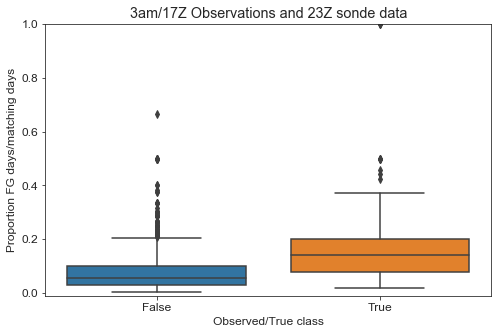

In [332]:
'''When fogflag in object/text data type
of 6617 rows, 6496 values are either T/F - 6353 are "False", 143 "True"
121 fogflags must be NaNs then

d.shape
d['fogflag'].value_counts()
d[['fogflag','chance']].isnull().sum()

When convert fogflag from obejct to bool The NaNs get converted to True !!!!!
see value count True from 143 to 264 - inc by 121
Best to drop these NaNs before doing convert to bool
and defintely before plotting or stats

d['fogflag']=d['fogflag'].astype(bool)
d['fogflag'].value_counts()
 False 6353
 True   264 '''

#https://tryolabs.com/blog/2017/03/16/pandas-seaborn-a-guide-to-handle-visualize-data-elegantly/
# https://pandas.pydata.org/pandas-docs/version/0.20.1/visualization.html
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,5))
d['fogflag']=d['fogflag'].astype(bool)
sns.boxplot(x="fogflag", y="chance", data=d, ax=ax)\
.set(
    title='3am/17Z Observations and 23Z sonde data',
    xlabel='Observed/True class',
    ylabel='Proportion FG days/matching days'
)
plt.ylim(-0.01,1.)
plt.show()

In [333]:
print(d.loc[~d['fogflag'],'chance'].describe())
d.loc[d['fogflag'],'chance'].describe()

count    1424.000000
mean        0.076767
std         0.070718
min         0.005848
25%         0.028571
50%         0.055556
75%         0.100000
max         0.666667
Name: chance, dtype: float64


count    137.000000
mean       0.178410
std        0.163257
min        0.020000
25%        0.076923
50%        0.142857
75%        0.200000
max        1.000000
Name: chance, dtype: float64

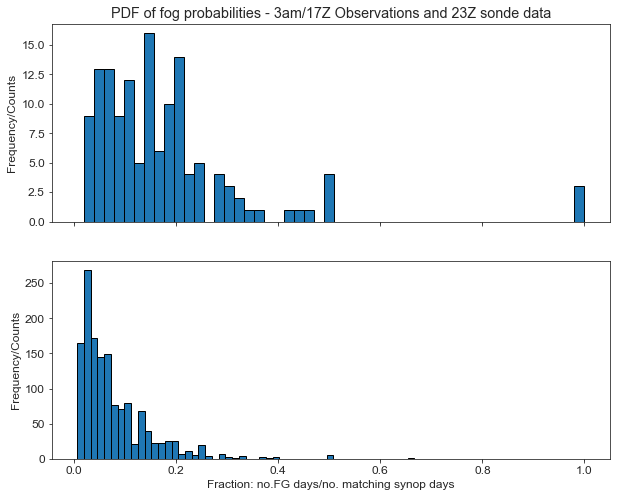

In [334]:
pos_cases = d.loc[d['fogflag'],'chance']
neg_cases = d.loc[~d['fogflag'],'chance']

from scipy import stats
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10,8), sharex=True)   #2 rows 1 col
# Plot the PDF
pos_cases.plot(ax=axes[0], y=pos_cases, kind='hist',
        bins=50, edgecolor='k',
        #range=(0.00005,pos_cases.max()),
        density=False)\
    .set(title='PDF of fog probabilities - 3am/17Z Observations and 23Z sonde data',
        ylabel='Frequency/Counts')
#pos_cases.ylabel='Normalised Frequency'
# used min as 0.00005 0.005% to eliminate high counts for prob=0.0
# for both +ve and _ve cases
neg_cases.plot(ax=axes[1], y=neg_cases, kind='hist',
        bins=50, edgecolor='k',
        #range=(0.00005,neg_cases.max()),
        density=False)\
    .set(
    xlabel='Fraction: no.FG days/no. matching synop days',
    ylabel='Frequency/Counts')


plt.show()

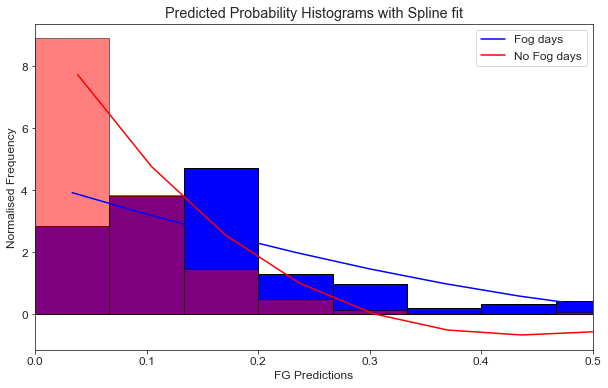

In [335]:
import numpy as np
from scipy.interpolate import UnivariateSpline
from scipy.stats import norm
from matplotlib import pyplot as plt


# since unbalanced case apply scaling factor to histo bin counts
fig, ax = plt.subplots(1, 1, figsize=(10,6))

N=d.shape[0]
n = N//100  # num of bins

pos_cases.plot(ax=ax,y=pos_cases, kind='hist',
        bins=n, edgecolor='k', color='b',
        range=(0.00005,pos_cases.max()),
        density=True)
neg_cases.plot(ax=ax,y=neg_cases, kind='hist',
        bins=n, edgecolor='k', color='r',alpha=0.5,
        range=(0.00005,pos_cases.max()),
        density=True)


# used min as 0.005 0.5% to eliminate high counts for prob=0.0
# for both +ve and _ve cases
p, x = np.histogram(
    pos_cases,
    bins=n,range=(0.00005,pos_cases.max()),
    density=True)

x = x[:-1] + (x[1] - x[0])/2   # convert bin edges to centers
f = UnivariateSpline(x=x,y=p, s=n)
ax.plot(x, f(x), c='b')

''''
You can increase or decrease s (smoothing factor)
within the UnivariateSpline function call to increase or
decrease smoothing.

Now plot PDF of probability values for non-TS days
given unbalanced we cud divide the histogram bin counts by factor u
this may look good but may lead to dodgy interpretation!!!
'''

s = neg_cases
p, x = np.histogram(
    neg_cases,
    bins=n,range=(0.005,pos_cases.max()),
    density=True) # bin it into n = N//10 bins

x = x[:-1] + (x[1] - x[0])/2   # convert bin edges to centers

f = UnivariateSpline(x=x, y=p, s=n)
ax.plot(x, f(x), c='r')

ax.set_title("Predicted Probability Histograms with Spline fit")
ax.set_xlabel("FG Predictions")
ax.set_ylabel("Normalised Frequency")
ax.legend(('Fog days','No Fog days'))
ax.set_xlim(0,0.5)
plt.show()

(0, 1.0)

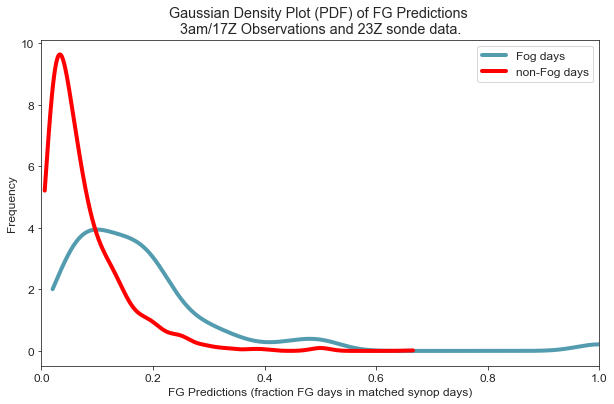

In [336]:
# We must first create a density estimate from our data

from scipy.stats import gaussian_kde
fig, ax = plt.subplots(1, 1, figsize=(10,6))

# Define a function for a density plot
def densityplot(x_data, density_est, x_label, y_label, title,kolor):
    ax.plot(x_data, density_est(x_data), color = kolor, lw = 4)
    ax.set_ylabel(y_label)
    ax.set_xlabel(x_label)
    ax.set_title(title)
    #ax.set_label(leg)
    #ax.legend()

data = pos_cases
density_est = gaussian_kde(data)

# Control the 'smoothness'of the estimate. Higher values give
# smoother estimates.
density_est.covariance_factor = lambda : .25
density_est._compute_covariance()
x_data = np.arange(min(data), max(data), 0.001)

# Call the function to create plot
densityplot(x_data = x_data
            , density_est = density_est
            , x_label = 'num days FG/num days Match Pattern'
            , y_label = 'Frequency'
            , title = 'Distribution of Proportions num FG day /num days Match Synop Pattern'
            , kolor = '#539caf')

data = neg_cases
density_est = gaussian_kde(data)

density_est.covariance_factor = lambda : .25
density_est._compute_covariance()
x_data = np.arange(min(data), max(data), 0.001)

# Call the function to create plot
densityplot(x_data = x_data
            , density_est = density_est
            , x_label = 'FG Predictions (fraction FG days in matched synop days)'
            , y_label = 'Frequency'
            , title = 'Gaussian Density Plot (PDF) of FG Predictions \n3am/17Z Observations and 23Z sonde data.'
            , kolor = 'red')

ax.legend(('Fog days', 'non-Fog days'))
ax.set_xlim(0,1.0)

In [337]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
for thres in [0.1,0.11,0.12,0.13,0.14,0.15]:
    fcst = d[['chance','fogflag']].copy()
    fcst['fcst'] = fcst['chance'].apply(
        lambda chance : True if chance >= thres else False)

    accuracy = accuracy_score(y_true=fcst['fogflag'].values,
                          y_pred=fcst['fcst'].values)
    print (f'\nProbability Threshold:{thres}. Accuracy:{round(accuracy, 3)}')


    cmat = confusion_matrix(y_true=fcst['fogflag'].values,
                        y_pred=fcst['fcst'].values)
    #print (cmat)
    #print ("\n", cmat.dtype)
    #print (cmat.shape)

    tn =  cmat[0,0] # +ve/True TS fcst and it happens
    tp =  cmat[1,1] #-ve/no TS fcst, and does not occur
    fp =  cmat[0,1] # +ve/True fcst, does not happen - false alarm
    fn =  cmat[1,0] # -ve/no TS fcst and it happens - missed event
    #tn, fp, fn, tp

    #print('true_negatives={}\nfalse_negatives={}\nfalse_positives={}\ntrue_positives={}'\
    #  .format(tn,fn,fp,tp))

    # so cmat is just a 2 X 2matrix
    print (' target_label | predicted_label | count ')
    print ('--------------+-----------------+-------')
    # Print out the confusion matrix.
    # NOTE: Some tools may arrange entries in a different order.
    # In our case appears to do the right thing

    for i, target_label in enumerate([False,True]):
        for j, predicted_label in enumerate([False,True]):
            print ('{0:^13} | {1:^15} | {2:5d}'.format(target_label, predicted_label, cmat[i,j]))



Probability Threshold:0.1. Accuracy:0.73
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1046
      0       |        1        |   378
      1       |        0        |    44
      1       |        1        |    93

Probability Threshold:0.11. Accuracy:0.756
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1095
      0       |        1        |   329
      1       |        0        |    52
      1       |        1        |    85

Probability Threshold:0.12. Accuracy:0.783
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1141
      0       |        1        |   283
      1       |        0        |    56
      1       |        1        |    81

Probability Threshold:0.13. Accuracy:0.811
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |   

```

New variable introduce Td Seperation TmTd
above with TmTd  hits 80 , misses 52 , false alarms 293 < miss down 10, FAR similar

+/-5QNH/T +/-4Td +/-2TmTd +/- 10 wspd and 35 days  Fog days PDF max FRQ 5 near 0.08 to 0.15

@ P>0.10 hits 86  , misses 46 , false alarms 300 
@ P>0.11 hits 81  , misses 51 , false alarms 256 
@ P>0.12 hits 76  , misses 56 , false alarms 217 
@ P>0.13 hits 69  , misses 63 , false alarms 185 
@ P>0.14 hits 63  , misses 69 , false alarms 155 
@ P>0.15 hits 58  , misses 74 , false alarms 127 

+/-4QNH/T +/-3Td +/-2TmTd +/- 8 wspd and 35 days  Much better hits and lower misses

@ P>0.10 hits 101 , misses 31 , false alarms 307 
@ P>0.11 hits 101 , misses 31 , false alarms 269 
@ P>0.12 hits  93 , misses 39 , false alarms 224 
@ P>0.13 hits  89 , misses 43 , false alarms 191 
@ P>0.14 hits  81 , misses 51 , false alarms 168 
@ P>0.15 hits  78 , misses 54 , false alarms 142 

Lower Td seperation to 1 deg - keep everything else same
-------------------------------------------------------------
THIS IS OUR STAR!!

+/-4QNH/T +/-3Td +/-1TmTd +/- 8 wspd and 35 days  

@ P>0.10 hits 119 , misses 18 , false alarms 331 <-- highest hits,lowes miss - FAR about 15 per year not bad
@ P>0.11 hits 111 , misses 21 , false alarms 256 <-- highest hits,lowes miss
@ P>0.12 hits 109 , misses 23 , false alarms 226 <-- highest hits,lowes miss
@ P>0.13 hits 106 , misses 26 , false alarms 202 <-- highest hits,lowes miss
@ P>0.14 hits 105 , misses 27 , false alarms 192 <-- highest hits,lowes miss
@ P>0.15 hits  99 ,misses  33 ,false alarms  160 <actually quite good - low FAR about 8 per year!! peanuts 
-------------------------------------------------------------

Note that when we remove check for temperature we get exact same results as above
So including T does not explain any more variance in data 
+/-4QNH (noT) +/-3Td +/- 1TmTd +/- 8 wspd and 35 days 


Note that widening window for QNH and Td and wind speed 
So +/-5QNH/Td  +/- 2TmTd  +/- 10 wspd and 35 days  AND no Temp check!
Give results which are quite similar to what we get with these thresholds 
+/-5QNH/T +/-4Td +/-2TmTd +/- 10 wspd and 35 days 

So it increases misses AND False alarms at the same time!!! even when we drop Temp matching 
So essentially widening the match window has more matching dates which reduces fog probability -  makes sense

Shrinking TmTd to 1 from 2 does produce better results though
@ P>0.10 hits 100 , misses 32 , false alarms 296 <-- highest hits,lowes miss
@ P>0.11 hits  95 , misses 37 , false alarms 265 <-- highest hits,lowes miss
@ P>0.12 hits  91 , misses 41 , false alarms 234 <-- highest hits,lowes miss
@ P>0.13 hits  86 , misses 46 , false alarms 211 <-- highest hits,lowes miss
@ P>0.14 hits  85 , misses 47 , false alarms 187 <-- highest hits,lowes miss
@ P>0.15 hits  84(-15),misses 48(+15),false alarms 158 <actually quite good -low FAR!!

Expanding TmTd to 5 from 2 produce worse results
@ P>0.10 hits  79 , misses 58 , false alarms 352 
@ P>0.11 hits  70 , misses 67 , false alarms 294 

No luck with increasing window to 6 weeks - 42 days as well..

and +/-3 for all , +/- 5 for winds and 42 days !!
above with TmTd  hits 108 , misses 24 , false alarms 297

+/- 5 QNH, T +/- 2 Td and TmTd, +/-8 wind 35 days
above with TmTd  hits 105 , misses 27 , false alarms 302


        
3pm/5Z Observations parameters and 23Z sonde for predictions
+/-4QNH +/-3Td +/-3TmTd +/- 10 wspd and 35 days

Probability Threshold:0.1. Accuracy:0.652
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   726
      0       |        1        |   405
      1       |        0        |    36
      1       |        1        |   102

Probability Threshold:0.11. Accuracy:0.701
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   790
      0       |        1        |   341
      1       |        0        |    38
      1       |        1        |   100

Probability Threshold:0.12. Accuracy:0.729   <<<----Nice sweet spot
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   832
      0       |        1        |   299
      1       |        0        |    45
      1       |        1        |    93

Probability Threshold:0.13. Accuracy:0.759
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   876
      0       |        1        |   255
      1       |        0        |    51
      1       |        1        |    87

Probability Threshold:0.14. Accuracy:0.773
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   896
      0       |        1        |   235
      1       |        0        |    53
      1       |        1        |    85

Probability Threshold:0.15. Accuracy:0.784
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   920
      0       |        1        |   211
      1       |        0        |    63
      1       |        1        |    75
      
        
6pm/8Z observations parameters and 23Z sonde for predictions
+/-4QNH +/-3Td +/-3TmTd +/- 10 wspd and 35 days

Probability Threshold:0.1. Accuracy:0.735
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1023
      0       |        1        |   363
      1       |        0        |    41
      1       |        1        |    97

Probability Threshold:0.11. Accuracy:0.764
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1072
      0       |        1        |   314
      1       |        0        |    46
      1       |        1        |    92

Probability Threshold:0.12. Accuracy:0.786
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1113
      0       |        1        |   273
      1       |        0        |    53
      1       |        1        |    85

Probability Threshold:0.13. Accuracy:0.804
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1145
      0       |        1        |   241
      1       |        0        |    57
      1       |        1        |    81

Probability Threshold:0.14. Accuracy:0.821
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1175
      0       |        1        |   211
      1       |        0        |    62
      1       |        1        |    76

Probability Threshold:0.15. Accuracy:0.833
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1202
      0       |        1        |   184
      1       |        0        |    70
      1       |        1        |    68




9pm/11Z observations parameters and 23Z sonde for predictions
+/-4QNH +/-3Td +/-3TmTd +/- 10 wspd and 35 days

Probability Threshold:0.1. Accuracy:0.73
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1046
      0       |        1        |   378
      1       |        0        |    44
      1       |        1        |    93

Probability Threshold:0.11. Accuracy:0.756
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1095
      0       |        1        |   329
      1       |        0        |    52
      1       |        1        |    85

Probability Threshold:0.12. Accuracy:0.783
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1141
      0       |        1        |   283
      1       |        0        |    56
      1       |        1        |    81

Probability Threshold:0.13. Accuracy:0.811
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1189
      0       |        1        |   235
      1       |        0        |    60
      1       |        1        |    77

Probability Threshold:0.14. Accuracy:0.828
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1217
      0       |        1        |   207
      1       |        0        |    61
      1       |        1        |    76

Probability Threshold:0.15. Accuracy:0.843
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1253
      0       |        1        |   171
      1       |        0        |    74
      1       |        1        |    63


        
        
        
       
        
12am observations parameters and 23Z sonde for predictions
+/-4QNH +/-3Td +/-3TmTd +/- 10 wspd and 35 days

Test Accuracy: 0.745773
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1094
      0       |        1        |   365
      1       |        0        |    41
      1       |        1        |    97

Test Accuracy: 0.777708
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1151
      0       |        1        |   308
      1       |        0        |    47
      1       |        1        |    91

Test Accuracy: 0.793989
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1185
      0       |        1        |   274
      1       |        0        |    55
      1       |        1        |    83

Test Accuracy: 0.8134
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1220
      0       |        1        |   239
      1       |        0        |    59
      1       |        1        |    79

Test Accuracy: 0.822167
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1237
      0       |        1        |   222
      1       |        0        |    62
      1       |        1        |    76

Test Accuracy: 0.846587
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1280
      0       |        1        |   179
      1       |        0        |    66
      1       |        1        |    72

 
3am/17z parameters

Test Accuracy: 0.764877
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1218
      0       |        1        |   359
      1       |        0        |    44
      1       |        1        |    93

Test Accuracy: 0.795216
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1273
      0       |        1        |   304
      1       |        0        |    47
      1       |        1        |    90

Test Accuracy: 0.81797
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1321
      0       |        1        |   256
      1       |        0        |    56
      1       |        1        |    81

Test Accuracy: 0.833139
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1353
      0       |        1        |   224
      1       |        0        |    62
      1       |        1        |    75

Test Accuracy: 0.844224
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1377
      0       |        1        |   200
      1       |        0        |    67
      1       |        1        |    70

Test Accuracy: 0.858226
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1406
      0       |        1        |   171
      1       |        0        |    72
      1       |        1        |    65


```


``` 
Best with +/-4QNH (noT) +/-3Td +/- 1TmTd +/- 8 wspd Lapse rate 3C and 35 days 
Test Accuracy: 0.952711
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5520
      0       |        1        |   269
      1       |        0        |    11
      1       |        1        |   121

Test Accuracy: 0.957609
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5553
      0       |        1        |   236
      1       |        0        |    15
      1       |        1        |   117

Test Accuracy: 0.963689
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5589
      0       |        1        |   200
      1       |        0        |    15
      1       |        1        |   117

Test Accuracy: 0.967742
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5617
      0       |        1        |   172
      1       |        0        |    19
      1       |        1        |   113

Test Accuracy: 0.968249
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5621
      0       |        1        |   168
      1       |        0        |    20
      1       |        1        |   112

Test Accuracy: 0.972978
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5652
      0       |        1        |   137
      1       |        0        |    23
      1       |        1        |   109
      
      
      
      
Ran different time - with same threholds -  got this - even better!!
Test Accuracy: 0.950911
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5880
      0       |        1        |   298
      1       |        0        |    12
      1       |        1        |   125

Test Accuracy: 0.955661
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5914
      0       |        1        |   264
      1       |        0        |    16
      1       |        1        |   121

Test Accuracy: 0.961837
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5953
      0       |        1        |   225
      1       |        0        |    16
      1       |        1        |   121

Test Accuracy: 0.965796
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5981
      0       |        1        |   197
      1       |        0        |    19
      1       |        1        |   118

Test Accuracy: 0.967063
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5989
      0       |        1        |   189
      1       |        0        |    19
      1       |        1        |   118

Test Accuracy: 0.971496
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  6020
      0       |        1        |   158
      1       |        0        |    22
      1       |        1        |   115

```

In [338]:
'''Function apply_threshold() that accepts
* `probabilities` (an array of probability values)
* `threshold` (a float between 0 and 0.5)
The function returns an array,
where each element is set to +1 or -1 depending on
whether the corresponding probability exceeds `threshold`.'''
def apply_threshold(probabilities, threshold):
    predictions = np.array([ True if x > threshold else False for x in probabilities])
    return predictions

fcst.tail()
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score


def apply_threshold(probabilities, threshold):
    predictions = np.array(
        [ True if x > threshold else False for x in probabilities])
    return predictions

accuracy_all =[]
precision_all = []
recall_all = []
# probabilities = model.predict_proba(test_matrix)[:,1]
# don't have an actual model yet, though analogue selection is kind of
# nearest neighbour model
threshold_values = np.linspace(0.0, 0.5, num=100)

for threshold in threshold_values:
    predictions = apply_threshold(fcst['chance'], threshold)

    accuracy = accuracy_score(
        y_true=fcst['fogflag'].values, y_pred=predictions)
    precision = precision_score(
        y_true=fcst['fogflag'].values,y_pred=predictions)
    recall =    recall_score(
        y_true=fcst['fogflag'].values,  y_pred=predictions)

    accuracy_all.append(accuracy)
    precision_all.append(precision)
    recall_all.append(recall)

# determining optimal Decision Boundary based on accuracy
index_acc =  np.argmax(accuracy_all)
index_pre =  np.argmax(precision_all)
index_rec =  np.argmax(recall_all)

opt_DB1= threshold_values[np.argmax(accuracy_all)]
opt_DB2= threshold_values[np.argmax(precision_all)]
opt_DB3= threshold_values[np.argmax(recall_all)]

print ("The optimal Decision Boundary to maximise accuracy is",opt_DB1)
print ("With Accuracy={}, Precision={}, Recall={}"
       .format(accuracy_all[index_acc],precision_all[index_acc],recall_all[index_acc]))
print ("The optimal Decision Boundary to maximise precision is",opt_DB2)
print ("With Accuracy={}, Precision={}, Recall={}"
       .format(accuracy_all[index_pre],precision_all[index_pre],recall_all[index_pre]))
print ("The optimal Decision Boundary to maximise recall is",opt_DB3)
print ("With Accuracy={}, Precision={}, Recall={}"
       .format(accuracy_all[index_rec],precision_all[index_rec],recall_all[index_rec]))

The optimal Decision Boundary to maximise accuracy is 0.4040404040404041
With Accuracy=0.9141575912876362, Precision=0.5882352941176471, Recall=0.072992700729927
The optimal Decision Boundary to maximise precision is 0.5
With Accuracy=0.9135169762972454, Precision=0.75, Recall=0.021897810218978103
The optimal Decision Boundary to maximise recall is 0.0
With Accuracy=0.0877642536835362, Precision=0.0877642536835362, Recall=1.0


' VERY BAD - Should be hugging the top right '

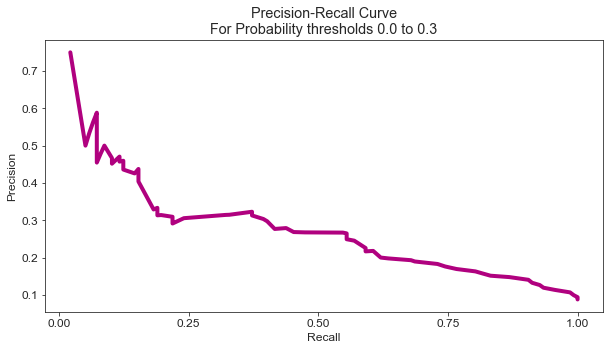

In [339]:
def plot_pr_curve(precision, recall, title):
    plt.rcParams['figure.figsize'] = 10, 5
    plt.locator_params(axis = 'x', nbins = 5)
    plt.plot(recall, precision, 'b-', linewidth=4.0, color = '#B0017F')
    plt.title(title)
    plt.ylabel('Precision')
    plt.xlabel('Recall')
    plt.rcParams.update({'font.size': 16})

plot_pr_curve(precision_all, recall_all,
              'Precision-Recall Curve\nFor Probability thresholds 0.0 to 0.3')
''' VERY BAD - Should be hugging the top right '''

In [340]:
from sklearn.preprocessing import binarize
'''
sklearn.preprocessing.binarize(X, threshold=0.0, copy=True)
does exactly what apply_threshold() function defined earlier'''

label=['Accuracy','Precision','Recall','MSE']
metrics = {}

# get validation metrics for all threshold values
new_threshold_values = np.linspace(0.0, 1.0, num=100)
for thres in new_threshold_values:

    pred = binarize(fcst['chance'].values.reshape(-1, 1), thres)
    acc = accuracy_score(fcst['fogflag'], pred)
    pre = precision_score(fcst['fogflag'], pred)
    rec = recall_score(fcst['fogflag'], pred)
    mse = 1-acc
    metrics[thres]=[acc,pre,rec,mse]

# changing to misclassification error
#MSE = [1 - x for x in accuracy_all]

#MSE[:5]
metrics = pd.DataFrame(metrics).T
metrics.columns = ['acc','pre','rec','mse']
metrics.index.name = "threhold"
metrics.iloc[:5,:]

/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.0 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.010101010101010102 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.020202020202020204 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.030303030303030304 as keyword args. From version 0.25 passing these as positional arguments wi

/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.4040404040404041 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.4141414141414142 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.42424242424242425 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.43434343434343436 as keyword args. From version 0.25 passing these as positional a

/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.8181818181818182 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.8282828282828284 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.8383838383838385 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.8484848484848485 as keyword args. From version 0.25 passing these as positional arg

,acc,pre,rec,mse
threhold,,,,
0.000000,0.087764,0.087764,1.000000,0.912236
0.010101,0.098014,0.088673,1.000000,0.901986
0.020202,0.206919,0.099053,0.992701,0.793081
0.030303,0.339526,0.113322,0.956204,0.660474
0.040404,0.431134,0.126368,0.927007,0.568866


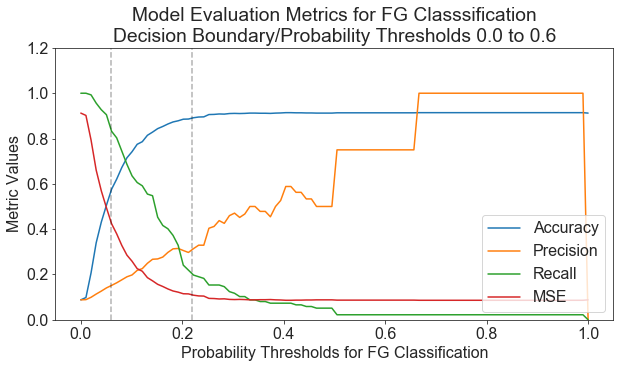

In [341]:
#plt.plot(metss,label=['Accuracy','Precision','Recall'])
# this shows that where prec/recall intersect prob value about 0.25
# good decision boundary wud be between 0.3 and point of inflection
# in accuracy and MSE curves i.e about 0.14
# also region where acuracy and recall intersect
# 0.17 is also the mean of two class probs

fig, ax = plt.subplots(1, 1, figsize=(10,5))

label=['Accuracy','Precision','Recall','MSE']
m = np.arange(4)
for m in m:
    plt.plot(metrics.iloc[:,m],label=label[m])
    #plt.rcParams['figure.figsize'] = 6, 6
#plt.xlim([0.0,0.5])
plt.ylim([0.0,1.2])
# plt.rcParams['figure.figsize'] = 6, 6
plt.axvline(x=0.06, color='k', alpha=0.3, linestyle='--')
plt.axvline(x=0.22, color='k', alpha=0.3, linestyle='--')
plt.title('Model Evaluation Metrics for FG Classsification\nDecision Boundary/Probability Thresholds 0.0 to 0.6')
plt.xlabel('Probability Thresholds for FG Classification')
plt.ylabel('Metric Values')
plt.legend(loc=4,)

/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.05 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.06666666666666668 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.08333333333333334 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass threshold=0.1 as keyword args. From version 0.25 passing these as positional arguments will result in an er

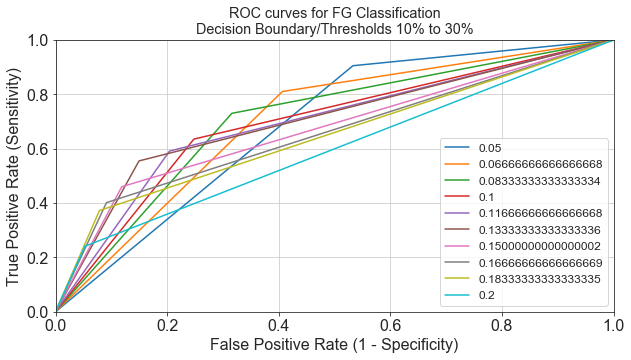

In [342]:
from sklearn import metrics
# https://www.medcalc.org/manual/roc-curves.php

fig, ax = plt.subplots(1, 1, figsize=(10,5))

for thres in np.linspace(0.05, 0.2, num=10):
    pred = binarize(fcst['chance'].values.reshape(-1, 1), thres)
    fpr, tpr, thresholds = metrics.roc_curve(fcst['fogflag'], pred)
    plt.plot(fpr, tpr, label = str(thres))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curves for FG Classification\nDecision Boundary/Thresholds 10% to 30%')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.legend(loc=4,)
plt.grid(True)

# green or red roc curcve fo prob 0.04 and 0.06 is good tradeoff
# Not this will produce quite high FAR - overforecasting fog!!

In [343]:
dat17.head()

,WDir,WS,T,Td,RH,pptnSince9,vis,vis_aws,PW,QNH,Ceil1_ht,Ceil1_amnt,Ceil2_ht,Ceil2_amnt,Ceil3_ht,Ceil3_amnt,cldy,fogflag
date,,,,,,,,,,,,,,,,,,
2000-01-01,210.0,6.0,19.2,16.7,85.0,0.0,10.0,NaN,NaN,NaN,NaN,,NaN,,NaN,,False,NaN
2000-01-02,170.0,6.0,22.6,18.3,77.0,0.0,10.0,NaN,NaN,NaN,NaN,,NaN,,NaN,,False,NaN
2000-01-03,200.0,5.1,20.9,18.4,86.0,1.0,10.0,NaN,NaN,1016.9,NaN,,NaN,,NaN,,False,NaN
2000-01-04,120.0,4.1,22.2,19.6,85.0,0.0,10.0,NaN,NaN,1017.6,NaN,,NaN,,NaN,,False,NaN
2000-01-05,120.0,9.9,22.0,20.9,93.0,10.4,10.0,NaN,NaN,1016.1,NaN,,NaN,,NaN,,False,NaN


In [344]:
df =pd.merge(left=sonde17,right=dat17,how='left',left_index=True,right_index=True)
print(dat17.shape,sonde17.shape)
print(dat17.isnull().sum(axis=0),sonde17.isnull().sum(axis=0))
df=df[['900_wdir', '900_WS', 'T850', 'Td850', '850_wdir',
       '850_WS', 'T700', 'Td700', '700_wdir', '700_WS', 'T500',
       'Td500', '500_wdir', '500_WS', 'season', 'lr_sfc_850', 'lr_850_500',
       'mid_rh', 'fogflag_x', 'WDir', 'WS', 'T', 'Td', 'RH', 'pptnSince9',
       'QNH']].dropna()
df = df.rename({'fogflag_x':'fogflag'},axis=1)  # rename fogflag
print(df.isnull().sum(axis=0))
df.shape

(7394, 18) (7237, 30)
WDir            59
WS              59
T               59
Td              59
RH              59
pptnSince9     131
vis            137
vis_aws        298
PW            6640
QNH             96
Ceil1_ht      4108
Ceil1_amnt      59
Ceil2_ht      5625
Ceil2_amnt      59
Ceil3_ht      6396
Ceil3_amnt      59
cldy             0
fogflag        401
dtype: int64 sfc_P            0
sfc_T          342
sfc_Td         342
sfc_wdir       342
sfc_wspd       342
P910           342
T910          7128
Td910         7128
900_wdir       347
900_WS         347
P850           342
T850          5239
Td850         5239
850_wdir       361
850_WS         361
P700           342
T700          5239
Td700         5239
700_wdir       366
700_WS         366
P500           342
T500          5242
Td500         5242
500_wdir       364
500_WS         364
season           0
lr_sfc_850    5239
lr_850_500    5249
mid_rh        5253
fogflag        355
dtype: int64
900_wdir      0
900_WS        0
T850    

(1896, 26)

In [345]:
df =pd.merge(left=sonde23,right=dat17,how='left',left_index=True,right_index=True)
print(dat17.shape,sonde23.shape)
print(dat17.isnull().sum(axis=0),sonde23.isnull().sum(axis=0))
df=df[['900_wdir', '900_WS', 'T850', 'Td850', '850_wdir',
       '850_WS', 'T700', 'Td700', '700_wdir', '700_WS', 'T500',
       'Td500', '500_wdir', '500_WS', 'season', 'lr_sfc_850', 'lr_850_500',
       'mid_rh', 'fogflag_x', 'WDir', 'WS', 'T', 'Td', 'RH', 'pptnSince9',
       'QNH']].dropna()
df = df.rename({'fogflag_x':'fogflag'},axis=1)  # rename fogflag
print(df.isnull().sum(axis=0))
df.shape

(7394, 18) (7354, 30)
WDir            59
WS              59
T               59
Td              59
RH              59
pptnSince9     131
vis            137
vis_aws        298
PW            6640
QNH             96
Ceil1_ht      4108
Ceil1_amnt      59
Ceil2_ht      5625
Ceil2_amnt      59
Ceil3_ht      6396
Ceil3_amnt      59
cldy             0
fogflag        401
dtype: int64 sfc_P            0
sfc_T          463
sfc_Td         463
sfc_wdir       463
sfc_wspd       463
P910           463
T910          6866
Td910         6866
900_wdir       671
900_WS         671
P850           463
T850           482
Td850          482
850_wdir       729
850_WS         729
P700           463
T700           486
Td700          486
700_wdir       620
700_WS         620
P500           463
T500           496
Td500          496
500_wdir       571
500_WS         571
season           0
lr_sfc_850     482
lr_850_500     502
mid_rh         507
fogflag        361
dtype: int64
900_wdir      0
900_WS        0
T850    

(6157, 26)

In [346]:
df_test=df
print(df_test.shape)
df_test['fogflag'].value_counts()  
# only 44 fog cases with dat14/dat17 and sonde 17 - so many missing sondes 17z - no good
# Vs 132  fog cases with dat14/dat17 and sonde 23
#df_test.tail()

(6157, 26)


False    6020
True      137
Name: fogflag, dtype: int64

In [347]:
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.model_selection import cross_val_score

# testing for relationships.
# for numeric targets.
'''reg = GradientBoostingRegressor(n_estimators=100, max_depth=5,
                                learning_rate=0.1, loss='ls',
                                random_state=1)
'''
# for categorical targets.
clf = GradientBoostingClassifier(n_estimators=100, max_depth=5,
                                learning_rate=0.1, loss='deviance',
                                random_state=1)
       
# try to predict one feature using the rest of others to test collinearity, so it's easier to interpret the results
'''
for c in cols:
    # c is the thing to predict.
    
    if c not in ['rand0', 'rand1', 'rand2']: 

        X = df_test.drop([c], axis=1) # drop the thing to predict.
        X = pd.get_dummies(X)
        y = df_test[c]

        print(c)

        if c in non_numeric_columns:
            scoring = 'accuracy'
            model = clf
            scores = cross_val_score(clf, X, y, cv=5, scoring=scoring)
            print(scoring + ": %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
        elif c in numeric_columns:
            scoring = 'neg_root_mean_squared_error'
            model = reg
            scores = cross_val_score(reg, X, y, cv=5, scoring=scoring)
            print(scoring.replace('neg_', '') + ": %0.2f (+/- %0.2f)" % (-scores.mean(), scores.std() * 2))
        else:
            print('what is this?')

        model.fit(X, y)
        df_importances = pd.DataFrame(data={'feature_name': X.columns, 'importance': model.feature_importances_}).sort_values(by='importance', ascending=False)
        top5_features = df_importances.iloc[:5]
        print('top 5 features:')
        print(top5_features)
'''

X = df_test.drop(['fogflag'], axis=1) # drop the thing to predict.
X = pd.get_dummies(X)
y = df_test['fogflag'].astype('int') 
print(df_test['fogflag'].astype('int').value_counts() )
scoring = 'accuracy'
model = clf
scores = cross_val_score(clf, X, y, cv=5, scoring=scoring)
print(scoring + ": %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

model.fit(X, y)
df_importances = pd.DataFrame(
    data={'feature_name': X.columns,
          'importance': model.feature_importances_}).\
sort_values(by='importance', ascending=False)

top10_features = df_importances.iloc[:10]
print('top 10 features:')
print(top10_features)

0    6020
1     137
Name: fogflag, dtype: int64
accuracy: 0.98 (+/- 0.01)
top 10 features:
   feature_name  importance
21           RH    0.176362
14   lr_sfc_850    0.083452
13       500_WS    0.057087
16       mid_rh    0.054775
15   lr_850_500    0.052812
7         Td700    0.051308
4      850_wdir    0.049643
0      900_wdir    0.041553
3         Td850    0.037862
5        850_WS    0.034129


In [348]:
top20_features = df_importances.iloc[:20]
print('top 20 features:')
print(top20_features)

top 20 features:
   feature_name  importance
21           RH    0.176362
14   lr_sfc_850    0.083452
13       500_WS    0.057087
16       mid_rh    0.054775
15   lr_850_500    0.052812
7         Td700    0.051308
4      850_wdir    0.049643
0      900_wdir    0.041553
3         Td850    0.037862
5        850_WS    0.034129
2          T850    0.033671
11        Td500    0.031778
8      700_wdir    0.030947
9        700_WS    0.029995
6          T700    0.028706
1        900_WS    0.028168
12     500_wdir    0.026076
19            T    0.024257
18           WS    0.023969
20           Td    0.023905


In [349]:
fg_aut.columns

Index(['avID', 'man', 'aut', 'rain24hr', 'fogflag', 'min_vis', 'fg_onset',
       'fg_finish', 'fg_duration', 'wind5', 'T5', 'Td5', 'RH5', 'QNH5',
       'pptn5', 'wind8', 'T8', 'Td8', 'RH8', 'QNH8', 'pptn8', 'wind11', 'T11',
       'Td11', 'RH11', 'QNH11', 'pptn11', 'wind14', 'T14', 'Td14', 'RH14',
       'QNH14', 'pptn14', 'wind17', 'T17', 'Td17', 'RH17', 'QNH17', 'pptn17',
       'wind20', 'T20', 'Td20', 'RH20', 'QNH20', 'pptn20', 'rain_flag',
       'avg_wkly_rain', 'avg_mthly_rain', 'TmTd5', 'TmTd8', 'TmTd11', 'TmTd14',
       'TmTd17', 'TmTd20', 'Td8to14', 'Td11to17', 'TmTd_trend_5to14',
       'TmTd14_24hr', 'TmTd14_48hr', 'Td5_4day', 'T14_48hr', 'QNH14_48hr',
       'wdir5', 'wspd5', 'wdir8', 'wspd8', 'wdir11', 'wspd11', 'wdir14',
       'wspd14', 'wdir17', 'wspd17', 'wdir20', 'wspd20'],
      dtype='object')

In [350]:
fg_aut.loc[:,(fg_aut.columns.str.contains(pat = '20', regex = True))].columns

Index(['wind20', 'T20', 'Td20', 'RH20', 'QNH20', 'pptn20', 'TmTd20', 'wdir20',
       'wspd20'],
      dtype='object')

In [351]:
fg_aut.loc[:,(fg_aut.columns.str.contains(pat = '11', regex = True))].tail(1)

,wind11,T11,Td11,RH11,QNH11,pptn11,TmTd11,Td11to17,wdir11,wspd11
2020-03-28,120/05,22.3,19.6,85.0,1019.5,0.0,2.7,-0.9,120.0,5.0


In [352]:
# drop RH obs at all synop times - bext to use regex fotr this
X=fg_aut.loc[:,~(fg_aut.columns.str.contains(pat = 'RH', regex = True))]
# drop other cols
X=X.drop(labels=['avID', 'man', 'aut', 'min_vis', 'fg_onset',
       'fg_finish', 'fg_duration'],axis=1)
# grab only 14Z - 12am obs
# Choose which synop hour to match - this one matchs 14Z 
X=X.loc[:,(X.columns.str.contains(pat = '17|fogflag', regex = True))]
# fg_aut.loc[:,~(fg_aut.columns.str.contains(pat = '(5|8|11|17|20)', regex = True))]

X=pd.merge(left=X, right=sonde23[['lr_sfc_850','900_wdir']],
           how='left',left_index=True,right_index=True)
print(X.columns,X.shape)
'''
'fogflag','rain24hr','avg_wk_rain','QNH14_48hr','avg_wk_rain'
'TmTd8','TmTd11','TmTd14','TmTd17','TmTd20',
'Td8to14','Td11to17','TmTd14_24hr','TmTd17_24hr','TmTd14_48hr' '''
X=X.dropna()
X.shape

Index(['fogflag', 'wind17', 'T17', 'Td17', 'QNH17', 'pptn17', 'TmTd17',
       'Td11to17', 'wdir17', 'wspd17', 'lr_sfc_850', '900_wdir'],
      dtype='object') (6993, 12)


(6358, 12)

In [353]:
clf = GradientBoostingClassifier(n_estimators=100, max_depth=5,
                                learning_rate=0.1, loss='deviance',
                                random_state=1)


y = X['fogflag'].astype('int') 
X = X.drop(['fogflag'],axis=1) # drop the thing to predict.
X = pd.get_dummies(X)

print(fg_aut['fogflag'].astype('int').value_counts() )
scoring = 'accuracy'
model = clf
scores = cross_val_score(clf, X, y, cv=5, scoring=scoring)
print(scoring + ": %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

model.fit(X, y)
df_importances = pd.DataFrame(
    data={'feature_name': X.columns, 'importance': model.feature_importances_}).\
sort_values(by='importance', ascending=False)
top10_features = df_importances.iloc[:10]
print('top 10 features:')
print(top10_features)

0    6827
1     166
Name: fogflag, dtype: int64
accuracy: 0.98 (+/- 0.00)
top 10 features:
      feature_name  importance
4           TmTd17    0.267394
5         Td11to17    0.094155
8       lr_sfc_850    0.089024
9         900_wdir    0.076715
3           pptn17    0.055710
0              T17    0.054636
2            QNH17    0.052729
1             Td17    0.035518
7           wspd17    0.026075
351  wind17_270/02    0.013384


```
Using 14Z obs for prediction
============================
accuracy: 0.97 (+/- 0.00)
top 10 features:
   feature_name  importance
4        TmTd14    0.219200
12     900_wdir    0.068704
11   lr_sfc_850    0.059463
1          Td14    0.053134
6   TmTd14_24hr    0.052305
8    QNH14_48hr    0.050761
2         QNH14    0.050335
5       Td8to14    0.049441
3        pptn14    0.049285
10       wspd14    0.047592

Using 17Z obs for prediction
============================
accuracy: 0.98 (+/- 0.00)
top 10 features:
  feature_name  importance
4       TmTd17    0.278584
5     Td11to17    0.098352
8   lr_sfc_850    0.096142
2        QNH17    0.070426
9     900_wdir    0.053699
0          T17    0.053433
3       pptn17    0.048248
6       wdir17    0.041805
1         Td17    0.041384
7       wspd17    0.027057
9        wspd17    0.034356
```

## Handle class imbalance

```Now do the same adjusting for class imbalance 
Guess the large class imbalance is influencing feature importance
```

In [354]:
print("Shape of data",fg_aut.shape)
print("How many fog/no fog days\n",fg_aut['fogflag'].value_counts())
print("Need only twice as many non fog days: ",fg_aut['fogflag'].value_counts()[1]*2)
no_fog_days = fg_aut.loc[~fg_aut['fogflag']]
print("Current size of no fog days: ",no_fog_days.shape[0])
'''Now to grab 320 non fog days - just get fraction of non-fog days
'''
print(f'So we need to grab just {318/no_fog_days.shape[0]}% of the non fog days')


Shape of data (6993, 74)
How many fog/no fog days
 False    6827
True      166
Name: fogflag, dtype: int64
Need only twice as many non fog days:  332
Current size of no fog days:  6827
So we need to grab just 0.04657975684781016% of the non fog days


```pandas.DataFrame.sample
DataFrame.sample(n=None, frac=None, replace=False, weights=None, random_state=None, axis=None)
Return a random sample of items from an axis of object.
```

In [355]:
fg_days_sample = fg_aut.loc[fg_aut['fogflag']]
no_fog_days_sample = fg_aut.loc[~fg_aut['fogflag']]\
    .sample(frac=0.50, replace=False,random_state=99,axis=0)

print(no_fog_days_sample.shape)
no_fog_days_sample['fogflag'].value_counts()  # none true so great
# join with fg days
sample = pd.concat([fg_days_sample,no_fog_days_sample],axis=0)
print(sample.shape)
sample['fogflag'].value_counts()

(3414, 74)
(3580, 74)


False    3414
True      166
Name: fogflag, dtype: int64

In [356]:
# drop RH obs at all synop times - bext to use regex fotr this
X=sample.loc[:,~(sample.columns.str.contains(pat = 'RH', regex = True))]
# drop other cols
X=X.drop(labels=['avID', 'man', 'aut', 'min_vis', 'fg_onset',
       'fg_finish', 'fg_duration'],axis=1)
# grab only 14Z - 12am obs
# Choose which synop hour to match - this one matchs 14Z 
X=X.loc[:,(X.columns.str.contains(pat = '\D8|fogflag', regex = True))]
# fg_aut.loc[:,~(fg_aut.columns.str.contains(pat = '(5|8|11|17|20)', regex = True))]

X=pd.merge(left=X, 
           right=sonde23[['lr_sfc_850','lr_850_500',
                          'mid_rh','900_wdir','900_WS']],
           how='left',left_index=True,right_index=True)
print(X.columns,X.shape)
'''
'fogflag','rain24hr','avg_wk_rain','QNH14_48hr','avg_wk_rain'
'TmTd8','TmTd11','TmTd14','TmTd17','TmTd20',
'Td8to14','Td11to17','TmTd14_24hr','TmTd17_24hr','TmTd14_48hr' '''
X=X.dropna()
X.shape

Index(['fogflag', 'wind8', 'T8', 'Td8', 'QNH8', 'pptn8', 'TmTd8', 'Td8to14',
       'wdir8', 'wspd8', 'lr_sfc_850', 'lr_850_500', 'mid_rh', '900_wdir',
       '900_WS'],
      dtype='object') (3580, 15)


(3235, 15)

In [357]:
# apply machine learning to sample only
clf = GradientBoostingClassifier(n_estimators=100, max_depth=5,
                                learning_rate=0.1, loss='deviance',
                                random_state=1)
y = X['fogflag'].astype('int') 
X = X.drop(['fogflag'],axis=1) # drop the thing to predict.
X = pd.get_dummies(X)

print(sample['fogflag'].astype('int').value_counts() )
scoring = 'accuracy'
model = clf
scores = cross_val_score(clf, X, y, cv=5, scoring=scoring)
print(scoring + ": %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

model.fit(X, y)
df_importances = pd.DataFrame(
    data={'feature_name': X.columns, 
          'importance': model.feature_importances_}).\
sort_values(by='importance', ascending=False)
top10_features = df_importances.iloc[:10]
print('top 10 features:')
print(top10_features)

0    3414
1     166
Name: fogflag, dtype: int64
accuracy: 0.95 (+/- 0.01)
top 10 features:
   feature_name  importance
4         TmTd8    0.208673
11     900_wdir    0.084693
10       mid_rh    0.078547
2          QNH8    0.074446
8    lr_sfc_850    0.071853
9    lr_850_500    0.057387
5       Td8to14    0.048132
12       900_WS    0.044312
7         wspd8    0.025732
0            T8    0.021789


Variables that have most impact on fog/no fog outcome prediction 
- TmTd ( explains about 45-60% of the variance) MUST HAVE 
- Td
- QNH (upto 10% variance esp 6pm data)


```
accuracy: 0.75 (+/- 0.08)
top 10 features:
     feature_name  importance - after remove TmTd
7           TmTd5    0.274842
1              T5    0.121315 - 22%
0        rain24hr    0.070495
3            QNH5    0.067141 - 11%
2             Td5    0.058930 - 21%
6     avg_wk_rain    0.048124
70  wind5_ 050/10    0.034623
78  wind5_ 060/07    0.016056
33  wind5_ 020/13    0.015588
22  wind5_ 010/20    0.013252

accuracy: 0.81 (+/- 0.07)
top 10 features:
    feature_name  importance
7          TmTd8    0.493513
3           QNH8    0.104615 - same
2            Td8    0.059085 - 33% 
6    avg_wk_rain    0.046776
0       rain24hr    0.042618
1             T8    0.042486
4          pptn8    0.024830
64  wind8_060/06    0.013165
50  wind8_040/06    0.011270
57  wind8_050/07    0.010701

accuracy: 0.95 (+/- 0.01)- with 50% of no fog days ONLY
top 10 features:
   feature_name  importance
4         TmTd8    0.202814
7      900_wdir    0.117921
6    lr_sfc_850    0.091683
2          QNH8    0.070050
1           Td8    0.068032
8        900_WS    0.060461
5       Td8to14    0.040647
3         pptn8    0.036027
9  wind8_000/00    0.019870
0            T8    0.019003

---------------------------------------------------------
accuracy: 0.85 (+/- 0.09)
top 10 features:
      feature_name  importance
7           TmTd11    0.524203
3            QNH11    0.080937 similar
1              T11    0.051385 - 17
8           wdir11    0.043006
2             Td11    0.036937 - 22
9           wspd11    0.033737
0         rain24hr    0.032487
169  wind11_250/04    0.024837
4           pptn11    0.023362
6      avg_wk_rain    0.019941

accuracy: 0.96 (+/- 0.01)  - with 50% of no fog days ONLY
top 10 features:
   feature_name  importance
4        TmTd11    0.235419
5      Td11to17    0.097654
8    lr_sfc_850    0.089612
9      900_wdir    0.060726
2         QNH11    0.045412
6        wdir11    0.045056
3        pptn11    0.040450
10       900_WS    0.039752
1          Td11    0.037673
7        wspd11    0.032150
-------------------------------------------------------
accuracy: 0.86 (+/- 0.08)
top 10 features:
   feature_name  importance
7        TmTd14    0.564622
8        wdir14    0.070851 - 10
3         QNH14    0.045600  similar
2          Td14    0.043172 - 20
9        wspd14    0.038094
0      rain24hr    0.036487
10  TmTd14_24hr    0.031913
6   avg_wk_rain    0.027405
1           T14    0.025197 - 18
4        pptn14    0.012562

accuracy: 0.96 (+/- 0.01)  - with 50% of no fog days ONLY
top 10 features:
   feature_name  importance
4        TmTd14    0.304399
12     900_wdir    0.091069
3        pptn14    0.062357
11   lr_sfc_850    0.052417
2         QNH14    0.045645
10       wspd14    0.044015
5       Td8to14    0.042976
8    QNH14_48hr    0.038007
9        wdir14    0.034179
1          Td14    0.032321
-----------------------------------------------------
accuracy: 0.87 (+/- 0.07)
top 10 features:
     feature_name  importance
7          TmTd17    0.603478
8     TmTd17_24hr    0.062976
10         wspd17    0.048170
6     avg_wk_rain    0.037558
1             T17    0.035375 - 25
3           QNH17    0.031599 -  8
2            Td17    0.023320 - 24
9          wdir17    0.019557
4          pptn17    0.012599
39  wind17_100/05    0.010449

accuracy: 0.97 (+/- 0.02)   - with 50% of no fog days ONLY
top 10 features:
   feature_name  importance
4        TmTd17    0.370585
5      Td11to17    0.103473
9      900_wdir    0.084612
8    lr_sfc_850    0.063616
3        pptn17    0.054474
2         QNH17    0.052608
1          Td17    0.038713
7        wspd17    0.036307
0           T17    0.034485
10       900_WS    0.028937

```

### `sklearn.neighbors.KNeighborsClassifier`

Defaults
-  n_neighbors : int, optional (default = 5)
- weights : str or callable, optional (default = ‘uniform’)
- algorithm : {‘auto’, ‘ball_tree’, ‘kd_tree’, ‘brute’}, optional, 'auto'
- p : integer, optional (default p = 2 -> euclidean_distance (l2)
- metric : string or callable, default ‘minkowski’ (with p=2 is equivalent to the standard Euclidean metric)
- leaf_size : int, optional (default = 30), Leaf size passed to BallTree or KDTree.
```
KNeighborsClassifier(n_neighbors=10,
                            weights='uniform',
                            algorithm='auto'
                            p=2,metric=‘minkowski’)```

In [358]:
fg_aut.columns

Index(['avID', 'man', 'aut', 'rain24hr', 'fogflag', 'min_vis', 'fg_onset',
       'fg_finish', 'fg_duration', 'wind5', 'T5', 'Td5', 'RH5', 'QNH5',
       'pptn5', 'wind8', 'T8', 'Td8', 'RH8', 'QNH8', 'pptn8', 'wind11', 'T11',
       'Td11', 'RH11', 'QNH11', 'pptn11', 'wind14', 'T14', 'Td14', 'RH14',
       'QNH14', 'pptn14', 'wind17', 'T17', 'Td17', 'RH17', 'QNH17', 'pptn17',
       'wind20', 'T20', 'Td20', 'RH20', 'QNH20', 'pptn20', 'rain_flag',
       'avg_wkly_rain', 'avg_mthly_rain', 'TmTd5', 'TmTd8', 'TmTd11', 'TmTd14',
       'TmTd17', 'TmTd20', 'Td8to14', 'Td11to17', 'TmTd_trend_5to14',
       'TmTd14_24hr', 'TmTd14_48hr', 'Td5_4day', 'T14_48hr', 'QNH14_48hr',
       'wdir5', 'wspd5', 'wdir8', 'wspd8', 'wdir11', 'wspd11', 'wdir14',
       'wspd14', 'wdir17', 'wspd17', 'wdir20', 'wspd20'],
      dtype='object')

In [359]:
# drop RH and surface wind obs at all synop times
dat=fg_aut.loc[:,~(fg_aut.columns.str.contains(
    pat = '(RH|wind|wdir)', regex = True))]

# drop other cols related to observed fog
dat=dat.drop(labels=['avID', 'man', 'aut', 'min_vis', 'fg_onset',
       'fg_finish', 'fg_duration'],axis=1)

# grab only 14Z/12am obs
# Choose which synop hour to match - this one matchs 14Z 
dat=dat.loc[:,(dat.columns.str.contains(
    pat = '\D14|fogflag|avg', regex = True))]
# fg_aut.loc[:,~(fg_aut.columns.str.contains(pat = '(5|8|11|17|20)', regex = True))]

dat=pd.merge(left=dat, 
           right=sonde23[['lr_sfc_850','lr_850_500',
                          'mid_rh','900_wdir','900_WS','850_wdir','850_WS']],
           how='left',left_index=True,right_index=True)
print(dat.columns,dat.shape)
dat.dropna(inplace=True)
print(f'{dat.columns}\ndat.shape:{dat.shape}\ndat.fogflag value counts\
      \n{dat["fogflag"].value_counts()}')

Index(['fogflag', 'T14', 'Td14', 'QNH14', 'pptn14', 'avg_wkly_rain',
       'avg_mthly_rain', 'TmTd14', 'Td8to14', 'TmTd_trend_5to14',
       'TmTd14_24hr', 'TmTd14_48hr', 'T14_48hr', 'QNH14_48hr', 'wspd14',
       'lr_sfc_850', 'lr_850_500', 'mid_rh', '900_wdir', '900_WS', '850_wdir',
       '850_WS'],
      dtype='object') (6993, 22)
Index(['fogflag', 'T14', 'Td14', 'QNH14', 'pptn14', 'avg_wkly_rain',
       'avg_mthly_rain', 'TmTd14', 'Td8to14', 'TmTd_trend_5to14',
       'TmTd14_24hr', 'TmTd14_48hr', 'T14_48hr', 'QNH14_48hr', 'wspd14',
       'lr_sfc_850', 'lr_850_500', 'mid_rh', '900_wdir', '900_WS', '850_wdir',
       '850_WS'],
      dtype='object')
dat.shape:(4768, 22)
dat.fogflag value counts      
False    4667
True      101
Name: fogflag, dtype: int64


/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  This is separate from the ipykernel package so we can avoid doing imports until


In [360]:
# Train KNN using un-scaled features 

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

# create design matrix X and target vector y
# Note all features and response data has to be numeric
y = np.array(dat.loc[:,'fogflag'].astype('int')) # response or target
X = np.array(dat.iloc[:, 1:]) #features all except 'fogflag' columns

# instantiate learning model (k = 10 neighbours - prediction is majority voting)
knn = KNeighborsClassifier(n_neighbors=10)

# fitting the model
knn.fit(X, y)

# predict the response
pred = knn.predict(X)

# evaluate accuracy
print (accuracy_score(y, pred))

# out of all TS forecasts how many we get correct
# for every 100 TS predictions, 63 are correct
print (precision_score(y, pred))  

# out of all observed TS days how many we correctly predict
# we only succesfully predict 14 out of every 100 TS days
# this is VERY BAD - we 91% accuracy as most days we dont have TS and we correctly predict that
# but POD is only 14%
print (recall_score(y, pred))
set(y) - set(pred)

0.9788171140939598
0.0
0.0


/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{1}

### KNeighborsClassifier Never predicts FOG !!!
`Precision is ill-defined and being set to 0.0 due to no predicted samples` Essentially it says that the prediction does not include any outcome of value 1 - FOG equal True!!!

In [361]:
print(f'The response values can be either True(1) or False (0).\
\nUnique values in prediction are {np.unique(pred)} \nwhile unique response in actual data {np.unique(y)}')


# This just checks if .astype(int) coccrectly converts False to 0 and True to 1 - it DOES
list(
    zip(np.array(dat.loc[:,'fogflag']),
        np.array(dat.loc[:,'fogflag'].astype('int')) )
    )

The response values can be either True(1) or False (0).
Unique values in prediction are [0] 
while unique response in actual data [0 1]


[(False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),
 (False, 0),

### `kneighbors([X, n_neighbors, return_distance]) `

http://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html#sklearn.neighbors.KNeighborsClassifier.kneighbors

Returns indices of and distances to the neighbors of each point.
Parameters:	

X : array-like, shape (n_query, n_features), or (n_query, n_indexed) if metric == ‘precomputed’

    The query point or points. If not provided, neighbors of each indexed point are returned. In this case, the query point is not considered its own neighbor.

n_neighbors : int

    Number of neighbors to get (default is the value passed to the constructor).

return_distance : boolean, optional. Defaults to True.

    If False, distances will not be returned

Returns:	

dist : array

    Array representing the lengths to points, only present if return_distance=True

ind : array

    Indices of the nearest points in the population matrix.

In [362]:
# Lets now pull out 10 nearest or most similar days 
# to our query date from dataset
'''
distances,indices = knn.kneighbors(X[6386,:],n_neighbors=10)'''

# note we don't want to include reponse in X matrix
# is this realle necessary
# X = np.array(ob.iloc[:, :10]) # leave out response 'TS' 
y = np.array(dat.loc[:,'fogflag'].astype('int')) # response or target
X = np.array(dat.iloc[:, 1:]) #features all except 'fogflag' columns

# Our worst fog day recently
dat.loc['2017-07-07']
#dat.iloc[5766,:]

fogflag                True
T14                    13.9
Td14                   13.9
QNH14                1015.6
pptn14                    4
avg_wkly_rain       2.57143
avg_mthly_rain      3.72667
TmTd14                    0
Td8to14                -2.7
TmTd_trend_5to14      False
TmTd14_24hr              -2
TmTd14_48hr            -0.5
T14_48hr               -1.2
QNH14_48hr             -1.8
wspd14                    4
lr_sfc_850              6.4
lr_850_500               21
mid_rh                 33.5
900_wdir                235
900_WS                 12.4
850_wdir                270
850_WS                 25.4
Name: 2017-07-07 00:00:00, dtype: object

In [363]:
# Need to figure row index for this date
ob_no_index = dat.reset_index()
print(ob_no_index.columns) 
'''datetimeindex moves to 'index' col, 
this is good as it will help us figure which 
int row id points to which date later on
when we inspect the closest neighbours''' 

ob_no_index[ob_no_index['index'] == '2017-07-07']

Index(['index', 'fogflag', 'T14', 'Td14', 'QNH14', 'pptn14', 'avg_wkly_rain',
       'avg_mthly_rain', 'TmTd14', 'Td8to14', 'TmTd_trend_5to14',
       'TmTd14_24hr', 'TmTd14_48hr', 'T14_48hr', 'QNH14_48hr', 'wspd14',
       'lr_sfc_850', 'lr_850_500', 'mid_rh', '900_wdir', '900_WS', '850_wdir',
       '850_WS'],
      dtype='object')


,index,fogflag,T14,Td14,QNH14,pptn14,avg_wkly_rain,avg_mthly_rain,TmTd14,Td8to14,...,T14_48hr,QNH14_48hr,wspd14,lr_sfc_850,lr_850_500,mid_rh,900_wdir,900_WS,850_wdir,850_WS
4190,2017-07-07,True,13.9,13.9,1015.6,4.0,2.571429,3.726667,0.0,-2.7,...,-1.2,-1.8,4.0,6.4,21.0,33.5,235.0,12.4,270.0,25.4


In [364]:
# Now we can pull data for query obs as follows
print(ob_no_index[ob_no_index['index']=='2017-07-07'].index)
ind = ob_no_index[ob_no_index['index']=='2017-07-07'].index[0]
# grab 1st n only elment
# check array values to see if we got correct sample
#print(X[6460,:].ndim)  # 1-D
#print(X[6460,:].shape) # 10

X[ind,:]  
# cross check with feature values above NB not scaled!

Int64Index([4190], dtype='int64')


array([13.9, 13.9, 1015.6, 4.0, 2.571428571428565, 3.726666666666657, 0.0,
       -2.700000000000001, False, -2.0, -0.5, -1.1999999999999993,
       -1.7999999999999545, 4.0, 6.4, 21.0, 33.5, 235.0, 12.4, 270.0,
       25.4], dtype=object)

In [365]:
print(X[ind,:].shape)
print(X[ind,:].ndim)
print(X[ind,:].reshape(1, -1).shape) # 1 X 10
print(X[ind,:].reshape(1, -1).ndim)  # 2-D

distances,indices = knn.kneighbors(
    X[ind,:].reshape(1, -1) ,
    n_neighbors=10)

(21,)
1
(1, 21)
2


In [366]:
indices

array([[4190, 4210, 3129,  715, 4637,  273, 2263, 1432, 2959, 2246]])

In [367]:
 #NB indices is 2-D - we flatten to list b4 looking up
dat.iloc[indices.flatten()]

,fogflag,T14,Td14,QNH14,pptn14,avg_wkly_rain,avg_mthly_rain,TmTd14,Td8to14,TmTd_trend_5to14,...,T14_48hr,QNH14_48hr,wspd14,lr_sfc_850,lr_850_500,mid_rh,900_wdir,900_WS,850_wdir,850_WS
2017-07-07,True,13.9,13.9,1015.6,4.0,2.571429,3.726667,0.0,-2.7,False,...,-1.2,-1.8,4.0,6.4,21.0,33.500000,235.0,12.4,270.0,25.4
2017-08-27,False,11.9,11.1,1015.3,0.0,0.600000,0.200000,0.8,-2.5,True,...,1.3,-5.1,2.0,9.8,25.2,31.766667,245.0,10.2,270.0,27.4
2013-06-16,False,10.0,6.3,1011.8,0.0,5.828571,4.146667,3.7,-4.0,False,...,-3.0,0.3,1.0,7.6,22.4,38.633333,240.0,17.4,275.0,15.0
2003-06-13,True,14.0,12.9,1022.4,0.0,0.257143,5.953333,1.1,-1.9,True,...,-0.9,-2.9,5.0,8.1,22.3,35.700000,250.0,19.6,265.0,21.6
2019-06-16,False,16.3,15.6,1016.6,4.4,0.914286,0.666667,0.7,0.3,False,...,0.3,-1.4,5.0,9.0,19.1,27.000000,245.0,26.8,265.0,22.6
2001-09-01,True,15.1,13.6,1010.3,9.2,2.771429,0.726667,1.5,-3.2,True,...,0.1,-1.4,7.0,11.2,23.3,32.233333,245.0,10.2,265.0,11.8
2009-07-30,False,10.7,9.1,1022.2,0.0,0.028571,0.106667,1.6,-1.8,True,...,0.7,-1.7,4.0,7.8,21.4,41.200000,245.0,11.4,280.0,18.2
2005-09-30,True,18.8,18.3,1018.7,3.0,1.371429,0.893333,0.5,-0.8,True,...,-1.9,1.8,5.0,7.8,28.4,18.000000,230.0,18.0,270.0,18.6
2012-06-29,False,13.5,12.4,1013.1,0.0,10.114286,5.106667,1.1,-1.0,True,...,-0.6,-6.1,4.0,8.8,21.1,25.766667,230.0,12.4,265.0,9.4
2009-06-05,False,13.2,12.6,1014.8,0.0,2.000000,9.026667,0.6,-1.1,True,...,-2.3,-5.9,7.0,8.0,24.7,25.400000,250.0,16.4,275.0,17.8


We can see that out of 10 nearest neighbours 2 had fog 

2/10 of neighbours so 20% chance getting fog. The default classifier uses majority voting - usually P>=0.5 for precit positive case - so our query obs for '2017-07-07' gets classified as no fog we see later on. But if we set threshold >=10% then it gets fogges!!!!

To see distances as well, bit more work involved.

In [368]:
print(indices)

neighbours = pd.DataFrame({'distance':distances.flatten(),
                         'id':indices.flatten()})
neighbours.set_index('id', inplace=True)
neighbours_best10 = \
    ob_no_index.join(neighbours,how='right').nsmallest(10,'distance')
neighbours_best10

[[4190 4210 3129  715 4637  273 2263 1432 2959 2246]]


,index,fogflag,T14,Td14,QNH14,pptn14,avg_wkly_rain,avg_mthly_rain,TmTd14,Td8to14,...,QNH14_48hr,wspd14,lr_sfc_850,lr_850_500,mid_rh,900_wdir,900_WS,850_wdir,850_WS,distance
id,,,,,,,,,,,,,,,,,,,,,
4190,2017-07-07,True,13.9,13.9,1015.6,4.0,2.571429,3.726667,0.0,-2.7,...,-1.8,4.0,6.4,21.0,33.500000,235.0,12.4,270.0,25.4,0.000000
4210,2017-08-27,False,11.9,11.1,1015.3,0.0,0.600000,0.200000,0.8,-2.5,...,-5.1,2.0,9.8,25.2,31.766667,245.0,10.2,270.0,27.4,14.579724
3129,2013-06-16,False,10.0,6.3,1011.8,0.0,5.828571,4.146667,3.7,-4.0,...,0.3,1.0,7.6,22.4,38.633333,240.0,17.4,275.0,15.0,19.200690
715,2003-06-13,True,14.0,12.9,1022.4,0.0,0.257143,5.953333,1.1,-1.9,...,-2.9,5.0,8.1,22.3,35.700000,250.0,19.6,265.0,21.6,20.353721
4637,2019-06-16,False,16.3,15.6,1016.6,4.4,0.914286,0.666667,0.7,0.3,...,-1.4,5.0,9.0,19.1,27.000000,245.0,26.8,265.0,22.6,20.837700
273,2001-09-01,True,15.1,13.6,1010.3,9.2,2.771429,0.726667,1.5,-3.2,...,-1.4,7.0,11.2,23.3,32.233333,245.0,10.2,265.0,11.8,20.886226
2263,2009-07-30,False,10.7,9.1,1022.2,0.0,0.028571,0.106667,1.6,-1.8,...,-1.7,4.0,7.8,21.4,41.200000,245.0,11.4,280.0,18.2,21.004298
1432,2005-09-30,True,18.8,18.3,1018.7,3.0,1.371429,0.893333,0.5,-0.8,...,1.8,5.0,7.8,28.4,18.000000,230.0,18.0,270.0,18.6,22.034695
2959,2012-06-29,False,13.5,12.4,1013.1,0.0,10.114286,5.106667,1.1,-1.0,...,-6.1,4.0,8.8,21.1,25.766667,230.0,12.4,265.0,9.4,22.057959


In [369]:
'''suppose we find 10 nearest neighbours, 
but only want to see closest 5, nsmallest()'''

neighbours = pd.DataFrame({'distance':distances.flatten(),
                         'id':indices.flatten()})
neighbours.set_index('id', inplace=True)
ob_no_index.join(neighbours,how='right').nsmallest(5,'distance')

,index,fogflag,T14,Td14,QNH14,pptn14,avg_wkly_rain,avg_mthly_rain,TmTd14,Td8to14,...,QNH14_48hr,wspd14,lr_sfc_850,lr_850_500,mid_rh,900_wdir,900_WS,850_wdir,850_WS,distance
id,,,,,,,,,,,,,,,,,,,,,
4190,2017-07-07,True,13.9,13.9,1015.6,4.0,2.571429,3.726667,0.0,-2.7,...,-1.8,4.0,6.4,21.0,33.500000,235.0,12.4,270.0,25.4,0.000000
4210,2017-08-27,False,11.9,11.1,1015.3,0.0,0.600000,0.200000,0.8,-2.5,...,-5.1,2.0,9.8,25.2,31.766667,245.0,10.2,270.0,27.4,14.579724
3129,2013-06-16,False,10.0,6.3,1011.8,0.0,5.828571,4.146667,3.7,-4.0,...,0.3,1.0,7.6,22.4,38.633333,240.0,17.4,275.0,15.0,19.200690
715,2003-06-13,True,14.0,12.9,1022.4,0.0,0.257143,5.953333,1.1,-1.9,...,-2.9,5.0,8.1,22.3,35.700000,250.0,19.6,265.0,21.6,20.353721
4637,2019-06-16,False,16.3,15.6,1016.6,4.4,0.914286,0.666667,0.7,0.3,...,-1.4,5.0,9.0,19.1,27.000000,245.0,26.8,265.0,22.6,20.837700


In [370]:
close5 = ob_no_index.join(neighbours,how='right').nsmallest(5,'distance').index.values
close5

array([4190, 4210, 3129,  715, 4637])

In [371]:
# Lets feed these 5 NN back into model and get thier predictions
# see how they go 
X5nn = np.array(dat.iloc[close5, 1:])  

# ValueError: Location based indexing can only have [integer,
# integer slice
y5nn = np.array(dat.iloc[close5,0])  

# fitting the model WE USE the MODEL FITTED/TRAINED EARLIER
# knn.fit(X, y)

'''Note the predicted probabilities have probs for both class labels
[Prob(No FG), Prob(FG)]  e.g [0.8,0.2] means 80% chance no fog, 20% chaane fog
To make prediction - the default classifier uses threshold of 50% and given the 
probs for no fog class > 50%, all cases get negative - no fog prediction!'''

# predict the response
pred = knn.predict(X5nn)
pred_probs = knn.predict_proba(X5nn)
pd.DataFrame(data = list(zip(close5,pred_probs,pred,y5nn)),
             columns=['idx','Predict Probs', 'Predict Class','Observed class']).set_index('idx')

,Predict Probs,Predict Class,Observed class
idx,,,
4190,"[0.6, 0.4]",0,True
4210,"[0.8, 0.2]",0,False
3129,"[0.6, 0.4]",0,False
715,"[0.9, 0.1]",0,True
4637,"[0.9, 0.1]",0,False


In [372]:
from sklearn.model_selection import train_test_split
#from sklearn.cross_validation import train_test_split

# split into train and test, 
X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size=0.33, random_state=42)

print (X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)
print (y_train[:10])  # just check if its really fog col
# instantiate learning model (k = 10)
knn = KNeighborsClassifier(n_neighbors=10)

# fitting the model
knn.fit(X_train, y_train)

# predict the response
pred = knn.predict(X_test)

# get probability estimates as well
pred_probs = knn.predict_proba(X_test)

''' when trained using all data
0.907740422205
0.674796747967
0.13112164297'''
# evaluate accuracy
print (accuracy_score(y_test, pred))
# out of all TS forecasts how many we get correct
print (precision_score(y_test, pred))  
# out of all observed TS days how many we correctly predict
print (recall_score(y_test, pred))

(3194, 21) (3194,)
(1574, 21) (1574,)
[0 0 0 0 0 0 0 0 0 0]
0.9783989834815756
0.0
0.0


/home/accounts/qdisplay/avguide/av_env/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [373]:
# Again only negative cases in prediction
np.unique(y_test),np.unique(pred)

(array([0, 1]), array([0]))

**`sklearn.preprocessing.scale()`**

Standardization, or mean removal and variance scaling transform the data to center it by removing the mean value of each feature, then scale it by dividing non-constant features by their standard deviation.

This shifts the distribution of each attribute to have a mean of zero and a standard deviation of one (unit variance).

It is useful to standardize attributes for a model that relies on the distribution of attributes such as Gaussian processes.

For instance, many elements used in the objective function of a learning algorithm (such as the RBF kernel of Support Vector Machines or the l1 and l2 regularizers of linear models) assume that all features are centered around zero and have variance in the same order. 

**If a feature has a variance that is orders of magnitude larger than others, it might dominate the objective function and make the estimator unable to learn from other features correctly as expected.**

In [374]:
print("Feature means before scaling\n",X_train.mean(axis=0))
print("Feature variance before scaling\n",X_train.std(axis=0))

Feature means before scaling
 [18.19123356293048 14.590857858484679 1017.7129618033805
 1.5451471509079469 2.4459432865193445 2.4287476518472024
 3.600375704445831 -0.39405134627426436 0.15810895428929242
 -0.03534752661239807 0.013994990607389015 -0.018597370068879137
 0.04752661239824652 6.556042579837195 10.693425172197863
 22.966405760801415 18.317073679816367 173.8134001252348
 14.787977457733218 176.72510958046337 14.856293049467768]


AttributeError: 'float' object has no attribute 'sqrt'

In [ ]:
from sklearn.preprocessing import scale
X_train_scaled = scale(X_train)
X_test_scaled =  scale(X_test)

print("Feature means after scaling\n",X_train_scaled.mean(axis=0))
print("Feature variance before scaling\n",X_train_scaled.std(axis=0))

# Note Scaled data has zero mean 
# (near zero - see exp -14 and -16 !!!) and unit variance (1)

In [ ]:
# Train KNN using scaled features 

# instantiate learning model (k = 10)
knn = KNeighborsClassifier(n_neighbors=10)

# fitting the model
knn.fit(X_train_scaled, y_train)

# predict the response
pred = knn.predict(X_test_scaled)

# get probability estimates as well
pred_probs = knn.predict_proba(X_test_scaled)

# evaluate accuracy
print (accuracy_score(y_test, pred))
# out of all TS forecasts how many we get correct
print (precision_score(y_test, pred))  
# out of all observed TS days how many we correctly predict
print (recall_score(y_test, pred))
# similar accuracy to when we fit/trained on all data (91%)
# pre and recall improved a bit
# Accuracy ~ 0.98 for both scaled and unscaled features - no real gain
# However precision is 100% and recall 8% MASSIVE changes

### `predict_proba()` 
-    Predicts the probabilities
-    Choose the class with the highest probability

There is a 0.5 classification threshold

-    Class 1 is predicted if probability > 0.5
-    Class 0 is predicted if probability < 0.5

The predict_proba() function returns the probability values 
for both classes +1 and -1. 
- column 0: predicted probability that each observation is a member of class 0/no FOG
- column 1: predicted probability that each observation is a member of class 1/FOG

In [ ]:
predictions = pd.DataFrame(
              data = list(zip(y_test,pred, pred_probs)),
              columns=['Observed Class','Predict Class','Predict Probs']).\
              sort_values(by='Predict Class',ascending=False)
predictions

In [ ]:
# predictions['Predict Class'].value_counts()   1574 zero class predictions - no fog prediction!!!
predictions['Observed Class'].value_counts()

In [ ]:
print(f"Out of {predictions['Observed Class'].value_counts()[1]} fog cases,\
only {predictions['Predict Class'].value_counts()[1]} correctly predicted \
-> Giving recall of just \
{(predictions['Predict Class'].value_counts()[1]/predictions['Observed Class'].value_counts()[1])*100:.1f}%")

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

k_range=list(range(1,20))
k_scores=[]
for k in k_range:
    knn=KNeighborsClassifier(n_neighbors=k)
    scores=cross_val_score(knn, X_train_scaled, y_train, cv=10,scoring='recall')
    k_scores.append(scores.mean())
    
print(np.round(k_scores,3)) # to display scores to 3 decimal places

from matplotlib import pyplot as plt
plt.plot(k_range,k_scores,color="red")
plt.xlabel('k values')
plt.ylabel('Recall')
plt.show()

# NB Very unbalaced data set so recall only as high as 20%
# will try this again with balanced dataset later

What data does say is that we need smaller k - i.e we don't need 10 or 15 neighbours - only 2 or 3 enough for pediction. Grid Search for parameters suggest we need only 1 neighbour!! for max recall - but that is ony 19%.

We can do better than that if we shift threshold from 50% to sthn like 20%

From the above plot the optimal k value is somewhere between 1 and 10. Looking at the scores, at k=5 we have the highest recall/sensitivity.

We can use a more efficient parameter tuning approach called GridSearchCV as shown below which basically automates the search process and it also fits the optimal parameter to the training data.

In [ ]:
#from sklearn.grid_search import GridSearchCV
from sklearn.model_selection import GridSearchCV
k_range=list(range(1,10))
param_grid=dict(n_neighbors=k_range)
scores = ['accuracy', 'recall'] # evaluation scores for selecting best parameter
for sc in scores:
    grid_knn=GridSearchCV(knn,param_grid,cv=10,scoring=sc,n_jobs=-1)
    print("# Tuning hyper-parameters for %s" % sc)
    grid_knn.fit(X_train_scaled,y_train)
    
    print(grid_knn.best_params_)
    print(np.round(grid_knn.best_score_,3))

In [ ]:
# we only test neighbours 1 to 50
neighbors = list(range(1,10))

# empty list that will hold cv scores
accuracy_scores = []
precision_scores = []
recall_scores = []

# perform 10-fold cross validation
# for ks=1 to ks=51
for k in neighbors:
    knn = KNeighborsClassifier(n_neighbors=k)
    acc = cross_val_score(
        knn, X_train_scaled, y_train, cv=10, scoring='accuracy')
    pre = cross_val_score(
        knn, X_train_scaled, y_train, cv=10, scoring='precision')
    rec = cross_val_score(
        knn, X_train_scaled, y_train, cv=10, scoring='recall')
    
    '''Since CV=10, for each iteration we get 10 set of scores
    for each metric, take mean b4 saving'''
    accuracy_scores.append(acc.mean())
    precision_scores.append(pre.mean())
    recall_scores.append(rec.mean())
    
# changing to misclassification error
MSE = [1 - x for x in accuracy_scores]

MSE[:5]

In [ ]:
# determining best k
optimal_k = neighbors[MSE.index(min(MSE))]
optimal_k = neighbors[np.argmin(MSE)]
print ("The optimal number of neighbors is %d" % optimal_k)
#print ("In practice k is chosen from the ``elbow corner`` of curve,\
#       so more like k=10")
# plot misclassification error vs k
plt.plot(neighbors, MSE)
plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.show()

Note how validation error (MSE) starts to steadily incr from k=2 onwards.

Best k cud be anywhere 1 to 3 from above plot.

Now we have used cross-validation to determine our optimal k, we can go ahead and train our model using k=16 and test using the 1/3 held out test data.

This completes our train. validate, test cycle. Good thing with cross validation, we don't have to partition data into 3 sets, like this
- train set  e.g 60%
- validate set   35%
- test set       15%

Instead we just do what we did
- train set  e.g 2/3, 66.6%
- test set       1/3, 33.3%

CV performs validation on the held out (1/10) set
- for CV=10,splits train data set into 10 parts
- hold 1st 1/10 of data for validation, model fit/train on remaining 9/10, then test/validate using held out 1/10
- then hold the 2nd 1/10 set for validation, train on remaining 9/10 parts, then validate on 2nd part
- and so on - every time holding different 1/10 part for validation and train on remaining 9/10 parts

Validation can be used to tweak various parameters of the model such as how many neighbours to use etc etc
And when we finally happy with performance do final testing with the test set set aside in the beginning.

In [ ]:
from sklearn.preprocessing import binarize

knn = KNeighborsClassifier(n_neighbors=10) 
                           #weights='uniform',
                           #metric='minkowski', p=2,
                           #algorithm='auto')
knn.fit(X_train_scaled, y_train)
pred = knn.predict(X_test_scaled)

print(knn.predict_proba(X_test_scaled).shape)
knn.predict_proba(X_test_scaled)

In [ ]:
'''
sklearn.preprocessing.binarize(X, threshold=0.0, copy=True)
makes our apply_threshold() redundant but this demonstrates 
how it really works behind the scene'''

#def apply_threshold(probabilities, threshold):  
#    predictions = np.array(
#        [ True if x > threshold else False for x in probabilities]) 
#    return predictions

threshold_values = np.linspace(0.0, 0.5, num=20)

# create design matrix X and target vector y
# Note all features and response data has to be numeric
y = np.array(dat.loc[:,'fogflag'].astype('int')) # response or target
X = np.array(dat.iloc[:, 1:]) #features all except 'fogflag' columns       # response or target

# split into train and test, 
X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size=0.33, random_state=42)
    
accuracy_all =[]
precision_all = []
recall_all = []

# get validation metrics for all threshold values

for threshold in threshold_values:
    
    knn = KNeighborsClassifier(n_neighbors=15) 
    knn.fit(X_train_scaled, y_train)
    
    # pred = knn.predict(X_test_scaled)  # uses threshold 0.5 by 

    y_pred_prob = knn.predict_proba(X_test_scaled)[:,1]  
    # y_pred_prob 1-D, reshape to 2-D then binarize
    pred = binarize(y_pred_prob.reshape(-1, 1), threshold).flatten()
    # pred is 2-D , so had to flatten to 1-D
    # pred = apply_threshold(fcst['prob'].values, threshold)
    
    accuracy_all.append(accuracy_score(y_test, pred))
    precision_all.append(precision_score(y_test, pred))
    recall_all.append(recall_score(y_test, pred))
    
# determining optimal Decision Boundary based on accuracy
index_acc =  np.argmax(accuracy_all)
index_pre =  np.argmax(precision_all)
index_rec =  np.argmax(recall_all)

opt_DB1= threshold_values[np.argmax(accuracy_all)]
opt_DB2= threshold_values[np.argmax(precision_all)]
opt_DB3= threshold_values[np.argmax(recall_all)]

print ("The optimal Decision Boundary to maximise accuracy is",opt_DB1)
print ("With Accuracy={}, Precision={}, Recall={}"
       .format(accuracy_all[index_acc],precision_all[index_acc],recall_all[index_acc]))

print ("The optimal Decision Boundary to maximise precision is",opt_DB2)
print ("With Accuracy={}, Precision={}, Recall={}"
       .format(accuracy_all[index_pre],precision_all[index_pre],recall_all[index_pre]))

print ("The optimal Decision Boundary to maximise recall is",opt_DB3)
print ("With Accuracy={}, Precision={}, Recall={}"
       .format(accuracy_all[index_rec],precision_all[index_rec],recall_all[index_rec]))

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

def plot_pr_curve(precision, recall, title):
    plt.rcParams['figure.figsize'] = 7, 5
    plt.locator_params(axis = 'x', nbins = 5)
    plt.plot(recall, precision, 'b-', linewidth=4.0, color = '#B0017F')
    plt.title(title)
    plt.ylabel('Precision')
    plt.xlabel('Recall')
    plt.rcParams.update({'font.size': 16})
    
plot_pr_curve(precision_all, recall_all, 'Precision recall curve (all)')

# just as in roc curve can't see threholds well here 
# but we can see that to get about 80% recall, 
# precision wud come down to about 10%

In [ ]:
neighbors = list(range(1,10))
# get validation metrics for all threshold values
threshold_values = np.linspace(0.0, 0.5, num=20)

'''
https://www.geeksforgeeks.org/python-using-2d-arrays-lists-the-right-way/
'''
# empty list that will hold cv scores
acc_scores =  list()
pre_scores  = list()
rec_scores  = list()

print (neighbors)
print (threshold_values)

# perform 10-fold cross validation
# for ks=1 to ks=51
for k in neighbors:
    col1=list()
    col2=list()
    col3=list()
    for t in threshold_values:
        print(k,t)
        knn = KNeighborsClassifier(n_neighbors=k) 
        knn.fit(X_train_scaled, y_train)
    
        # pred = knn.predict(X_test_scaled)  # uses threshold 0.5 by default
        y_pred_prob = knn.predict_proba(X_test_scaled)[:,1]  
        # y_pred_prob 1-D, reshape to 2-D then binarize
        pred = binarize(y_pred_prob.reshape(-1, 1), t).flatten()
        # pred is 2-D , so had to flatten to 1-D
        # pred = apply_threshold(fcst['prob'].values, threshold)
        print(f'***********************k={k}, threshold={t}\n')
        
        col1.append(accuracy_score(y_test, pred))
        col2.append(precision_score(y_test, pred))
        col3.append(recall_score(y_test, pred))
        
    acc_scores.append(col1)
    pre_scores.append(col2)
    rec_scores.append(col3)
        
        #print(accuracy_score(y_test, pred))
        #print(precision_score(y_test, pred))
        #print(recall_score(y_test, pred))    
    
    '''
    accuracy_all.append(accuracy_score(y_test, pred))
    precision_all.append(precision_score(y_test, pred))
    recall_all.append(recall_score(y_test, pred))    
    '''
    '''
    knn = KNeighborsClassifier(n_neighbors=k)
    acc = cross_val_score(
        knn, X_train_scaled, y_train, cv=10, scoring='accuracy')
    pre = cross_val_score(
        knn, X_train_scaled, y_train, cv=10, scoring='precision')
    rec = cross_val_score(
        knn, X_train_scaled, y_train, cv=10, scoring='recall')
    '''
    '''Since CV=10, for each iteration we get 10 set of scores
    for each metric, take mean b4 saving'''
    
    #accuracy_scores.append(acc.mean())
    #precision_scores.append(pre.mean())
    #recall_scores.append(rec.mean())
